In [1]:
import sys  
sys.path.insert(0, '../code')
sys.path.insert(0, '../data')

In [2]:
# 1. Imports and topic setup
from newsapi import NewsApiClient
from newsplease import NewsPlease
from sqlalchemy import create_engine, ForeignKey, Column, Integer, String, Text, select
from sqlalchemy.orm import declarative_base, relationship, Session
from articles_orm import Base, Article, ArticleFeatures

from sklearn.feature_extraction.text import TfidfVectorizer
from utils import read_topics

newsapi = NewsApiClient(api_key='fbfb692eb3844ce59e10eea6069d1161')

topic_list = ['crypto',
              'bitcoin',
              
             'covid',
             'vaccine',
              
             'startups',
              'technology',
              'e-commerce',
              
             'Nokia',
             'Apple',
             'Microsoft']

In [3]:
# 2. Pull 100 initial articles of all chosen topics
# NewsAPI doesn't allow free accounts to access results after number 100.
# NewsAPI also doesn't allow free accounts to access results from before >1month ago.
all_articles = {topic: newsapi.get_everything(q=topic, page_size=100, page=1, language='en') for topic in topic_list}
print(all_articles.keys())

dict_keys(['crypto', 'bitcoin', 'covid', 'vaccine', 'startups', 'technology', 'e-commerce', 'Nokia', 'Apple', 'Microsoft'])


In [4]:
# 3. Check totalResults num and length of downloaded content for integrity
print(*(all_articles[topic]['totalResults'] for topic in topic_list))
print(*(len(all_articles[topic]['articles']) for topic in topic_list))

8121 8950 172735 48090 5556 94637 9124 1033 34377 21755
100 100 100 100 100 100 100 100 100 100


In [5]:
# 4. Save urls of every topic to their own dict, but only unique articles (previously some duplicates appeared)
topic_urls = {}
for topic in topic_list:
    cta = all_articles[topic]['articles']
    current_topic_articles = []
    current_topic_articles_titles = []
    for article in cta: 
        if article['title'] not in current_topic_articles_titles: # save only unique
            current_topic_articles += [article]
            current_topic_articles_titles += [article['title']]
    
    current_topic_urls = [article['url'] for article in current_topic_articles]
    topic_urls[topic] = current_topic_urls
print(topic_urls.keys())
print(len(topic_urls['bitcoin']))

dict_keys(['crypto', 'bitcoin', 'covid', 'vaccine', 'startups', 'technology', 'e-commerce', 'Nokia', 'Apple', 'Microsoft'])
89


In [6]:
# 5. Establish session to database.
engine = create_engine(f"sqlite:///NewsAPI_articles.db")

In [28]:
# Create schema
Base.metadata.create_all(engine)

In [ ]:
# Establish db session, get maintext of article, save objects
with Session(engine) as session:
    objects = []
    for topic in topic_list:
        for url in topic_urls[topic]:
            try:
                article = NewsPlease.from_url(url)
            except: # some download error happened, skip this article
                continue
            if (article.maintext is not None):
                mdl_article = Article(
                    parent_topic = topic,
                    source = article.source_domain,
                    title = article.title,
                    description = article.description,
                    maintext = article.maintext,
                    publication_date = article.date_publish,
                    url = url
                )
                print(mdl_article)
                objects += [mdl_article]
        session.bulk_save_objects(objects) # bulk save all topics then flush
        session.commit()
        objects=[]

Article(topic=crypto, title=Do Not Stare Into the Crypto Orb, description=A PrintNightmare exploit, a VPN takedown, and more of the week's top security news. url=https://www.wired.com/story/worldcoin-orb-doublevpn-printnightmare-microsoft-security-news/)
Article(topic=crypto, title=Nansen raises $12M from a16z to help investors make sense of crypto markets, description=While the ambitions of crypto investors have swelled even faster than the market has in recent months, institutional players have had a mountain of blockchain data to try to make sense of without particularly mature analytics products at their disposal. Blockchain analytics startup Nansen is building a product for crypto traders and hedge funds to […] url=http://techcrunch.com/2021/06/29/nansen-raises-12m-from-a16z-to-help-investors-make-sense-of-crypto-markets/)
Article(topic=crypto, title=Here's Why Gadgets Are So Hard to Get Right Now, description=Whether it's a graphics card or the PS5, delays and stock shortages see

D:\anaconda3\envs\pracamgr\lib\site-packages\dateutil\parser\_parser.py:1213: UnknownTimezoneWarning: tzname EDT identified but not understood.  Pass `tzinfos` argument in order to correctly return a timezone-aware datetime.  In a future version, this will raise an exception.
  warnings.warn("tzname {tzname} identified but not understood.  "


Article(topic=crypto, title=FaZe Clan suspends players allegedly involved in crypto pump-and-dump scheme, description=FaZe Clan has suspended three players and ousted a fourth after allegations they participated in a pump-and-dump crypto scheme.. url=https://www.engadget.com/faze-clan-suspends-crypto-scheme-players-221223343.html)
Article(topic=crypto, title=Circle is a good example of why SPACs can be useful, description=Circle is the sort of business that is correct for a SPAC-led debut. It could not go public in a traditional manner in its current state of maturity. url=http://techcrunch.com/2021/07/08/circle-is-a-good-example-of-why-spacs-can-be-useful/)
Article(topic=crypto, title=Miami Bitcoin Congoers Report Testing Positive for Covid, description=The event had no face mask or proof of vaccine requirements for its roughly 12,000 attendees. url=https://gizmodo.com/miamis-bitcoin-conference-may-be-the-latest-covid-19-su-1847076668)
Article(topic=crypto, title=NFT marketplace start

Article(topic=crypto, title=Sterling transactions blocked on crypto exchange Binance, users say, description=Customers of the Binance cryptocurrency exchange said on Tuesday they were unable to deposit or withdraw sterling from the platform, days after British regulators cracked down on some of its activities in the country. url=https://www.reuters.com/world/china/sterling-transactions-blocked-crypto-exchange-binance-users-say-2021-06-29/)
Article(topic=crypto, title=As Venezuela's economy regresses, crypto fills the gaps, description=Venezuelan food delivery driver Pablo Toro has no stake in cryptocurrency or blockchain, but indirectly uses digital tokens every time he sends money to his family. url=https://www.reuters.com/article/venezuela-cryptocurrency-idUSL2N2O31DO)
Article(topic=crypto, title=Explainer: Binance, the giant crypto exchange under regulatory scrutiny, description=Britain's financial watchdog has barred major cryptocurrency exchange Binance from carrying out regulated

Article(topic=crypto, title=Hedge funds expect to hold $310 billion in cryptocurrencies within 5 years - more than 7% of their assets, description=Institutional interest in cryptocurrencies like bitcoin has jumped in 2020. Eric Gaillard/Reuters Hedge funds plan to ramp up their crypto hol... url=https://markets.businessinsider.com/currencies/news/cryptocurrencies-bitcoin-btc-hedge-funds-institutional-interest-investing-2021-6-1030524367)
Article(topic=crypto, title='Big Short' investor Michael Burry warns the 'mother of all crashes' is coming - and predicts crypto and meme stocks will plummet, description='The Big Short' investor Michael Burry. Getty Images/ Astrid Stawiarz Michael Burry predicted meme stocks and cryptocurrencies will plummet. '... url=https://markets.businessinsider.com/currencies/news/big-short-michael-burry-warns-meme-stocks-crypto-crash-coming-2021-6-1030534935)
Article(topic=crypto, title=13 applications for a bitcoin ETF are in limbo as the SEC deliberates. Some 

In [7]:
# Query all articles and check everything ids
with Session(engine) as session:
    articles = session.query(Article).all()
print(len(articles))
print(articles[-1].id)

962
962


In [8]:
import spacy
from spacy.language import Language
import re

@Language.component('money_merger')
def money_merger(doc):
    with doc.retokenize() as retokenizer:
        for money in [e for e in doc.ents if e.label_ == 'MONEY']:
            if doc[money.start - 1].is_currency:
                retokenizer.merge(doc[
                money.start-1:money.end])
    return doc

In [10]:
# For every article from db, apply feature extraction methods (preprocessing -> bag of words -> pca/nmf -> save most important features as ArticleFeatures)
import string
from nltk.corpus import stopwords
import spacy
nlp = spacy.load('en_core_web_md')
nlp.add_pipe("merge_entities")
nlp.add_pipe('money_merger', after='ner')
print(nlp.pipeline)

additional_remove_chars = "'\"`—“’”\n"
punctuation = string.punctuation.replace('-','')+additional_remove_chars

articles_lt = []
articles_features = []
en_stopwords = stopwords.words('english')
for article in articles:
    # preprocess
    article_features = {}
    article_doc = nlp(article.maintext)
    article_doc = money_merger(article_doc)
    lemmas = [token.lemma_ for token in article_doc 
              if 
              token.lemma_ not in en_stopwords 
              and token.lemma_ not in punctuation]
    # pull out number of numericals as a feature of its own
    article_numericals = [lemma for lemma in lemmas if any(char.isdigit() for char in lemma)]
    num_article_numericals = len(article_numericals)
    # clean original lemmas from numericals
    lemmas = [lemma for lemma in lemmas if not any(char.isdigit() for char in lemma)]
    # pull out named entities as a feature of its own
    named_entities = {ent.label_: set([ent.text for inent in article_doc.ents if 
                                   inent.label_ == ent.label_]) for ent in article_doc.ents}
    article_features['id'] = article.id
    article_features['named_entities'] = named_entities
    article_features['numericals'] = article_numericals
    print(article_features)
    print(lemmas)
    article_lemmatized = ' '.join(lemmas)
    articles_lt += [article_lemmatized]

[('tok2vec', <spacy.pipeline.tok2vec.Tok2Vec object at 0x0000023BE98423B0>), ('tagger', <spacy.pipeline.tagger.Tagger object at 0x0000023BE9859950>), ('parser', <spacy.pipeline.dep_parser.DependencyParser object at 0x0000023BD8B06DC0>), ('ner', <spacy.pipeline.ner.EntityRecognizer object at 0x0000023BD9964F40>), ('money_merger', <function money_merger at 0x0000023BD887C9D0>), ('attribute_ruler', <spacy.pipeline.attributeruler.AttributeRuler object at 0x0000023BE98DBBC0>), ('lemmatizer', <spacy.lang.en.lemmatizer.EnglishLemmatizer object at 0x0000023BE98D5A00>), ('merge_entities', <function merge_entities at 0x0000023B957FB430>)]
{'id': 1, 'named_entities': {'ORG': {'VC'}, 'WORK_OF_ART': {'Le Crypto Fellowship'}, 'CARDINAL': {'two or three'}, 'GPE': {'France'}, 'PERSON': {'Pierre Entremont'}, 'PRODUCT': {'Blockchain'}, 'MONEY': {'€300,000'}, 'PERCENT': {'20%'}, 'DATE': {'June 15'}, 'LOC': {'Zoom'}, 'TIME': {'hours'}, 'ORDINAL': {'fourth'}}, 'numericals': ['10', '€100,000', '7%', '€50,00

{'id': 4, 'named_entities': {'DATE': {'this week'}, 'ORG': {'Bertrand Serlet'}, 'CARDINAL': {'50'}, 'GPE': {'US'}, 'PERSON': {'Matthew Panzarino'}, 'MONEY': {'$6 million'}, 'PRODUCT': {'Twitter'}, 'TIME': {'Minutes'}, 'FAC': {'Square'}}, 'numericals': ['June 5, 2021', 'about $1 billion', 'June 4, 2021', 'at least 2 year', 'January 2023', '$1.8 billion', '3', '$6 million', '50']}
['hello', 'friend', 'welcome', 'back', 'Week', 'Review', 'last week', 'I', 'write', 'tech', 'taking', 'Disney', 'this week', 'I', '’m', 'talk', 'search', 'new', 'crypto', 'messiah', '’re', 'read', 'TechCrunch', 'site', 'get', 'inbox', 'newsletter', 'page', 'follow', 'tweet', '@lucasmtny', 'big', 'thing', 'Elon', 'wear', 'welcome', 'among', 'crypto', 'illuminati', 'acolyte', 'Bitcoin', 'search', 'new', 'emperor', 'god', 'king', 'this weekend', 'thousand', 'crypto', 'acolyte', 'investor', 'descend', 'Bitcoin', '-', 'theme', 'conference', 'Miami', 'real', 'heavily', '-', 'produce', 'conference', 'sport', 'crypto',

{'id': 6, 'named_entities': {'ORG': {'NFT'}, 'PERSON': {'Sanjay Zimmermann'}, 'MONEY': {'between $500,000 and $3 million'}, 'GPE': {'Toronto'}, 'CARDINAL': {'three'}, 'LOC': {'Europe'}, 'WORK_OF_ART': {'White Star'}, 'NORP': {'European'}, 'DATE': {'five-plus years'}}, 'numericals': ['$50 million', '$30 million', 'between $500,000 and $3 million', '15-20', 'May 12', '2015']}
['White Star Capital', 'well', 'know', 'VC', 'firm', 'time', 'back', 'like', 'Digg', 'LaunchRock', 'Meero', 'Summly', 'tier', 'among', 'move', 'hot', 'world', 'crypto', 'blockchain', 'new', 'Digital Asset Fund', 'special', '-', 'vehicle', 'fund', 'specialize', 'invest', 'crypto', 'network', 'blockchain', '-', 'enable', 'business', 'previously', 'go', 'raise', 'backing', 'Bpifrance', 'Ubisoft', 'among', 'institution', 'back', 'new', 'fund', 'fund', 'run', 'New York', '-', 'base', 'General Partner', 'Sep Alavi', 'support', 'Principals', 'Thomas Klocanas', 'New York', 'Sanjay Zimmermann', 'Toronto', 'deploy', 'initial'

{'id': 9, 'named_entities': {'ORG': {'PayPal'}, 'DATE': {'this past month'}, 'PERSON': {'Dan Schulman'}, 'ORDINAL': {'first'}}, 'numericals': []}
['photo', 'Paypal', 'Inc.', 'spite', 'environmental', 'regulatory', 'ill', 'generally', 'come', 'crypto', 'currency', 'PayPal', '’s', 'bitcoin', 'ambition', 'keep', 'ramp', 'Wednesday', 'Jose Fernandez da Ponte', 'company', '’s', 'VP', 'thing', 'blockchain', 'confirm', 'interview', 'PayPal', '-', 'er', 'soon', 'able', 'withdraw', 'crypto', 'wallet', 'want', 'advertisement', 'company', 'n’t', 'confirm', 'would', 'roll', 'new', 'feature', 'likely', 'ca', 'n’t', 'come', 'soon', 'enough', 'bitcoin', 'bro', 'currently', 'use', 'PayPal', '’s', 'platform', 'company', 'first', 'bring', 'bitcoin', 'ethereum', 'litecoin', 'purchase', 'platform', 'late last year', 'generate', 'fair', 'bit', 'backlash', 'crypto', 'community', 'whole', 'core', 'complaint', 'PayPal', '’s', 'offering', 'company', 'let', 'people', 'buy', 'sell', 'crypto', 'even', 'convert', 

{'id': 12, 'named_entities': {'DATE': {'2020'}, 'ORG': {'HBR'}, 'PERSON': {'Shah'}, 'MONEY': {'$5,000 USD'}, 'CARDINAL': {'some 36'}, 'LAW': {'the Syndicate Protocol'}, 'PERCENT': {'2.3%'}, 'PRODUCT': {'TechCrunch'}}, 'numericals': ['she256', '$5,000 usd', 'some 36', '2.3%', '2020']}
['decentralize', 'currency', 'take', 'recent month', '’s', 'renew', 'attention', 'around', 'dao', 'Decentralized Autonomous Organizations', 'means', 'bring', 'together', 'group', 'investor', 'deploy', 'capital', 'unit', 'vote', 'collectively', 'investment', 'spirit', 'blockchain', 'aim', 'bring', 'great', 'transparency', 'investment', 'decision', '-', 'making', 'number', 'high', '-', 'profile', 'dao', 'launch', 'recent month', 'fervor', 'crypto', 'mania', 'increase', 'Komorebi Collective', 'launch', 'today', 'new', 'organization', 'found', 'woman', 'blockchain', 'space', 'make', 'investment', 'exclusively', 'exceptional', 'female', 'nonbinary', 'crypto', 'founder', 'found', 'member', 'Manasi Vora', 'tell',

{'id': 15, 'named_entities': {'PERSON': {'Twitter'}, 'MONEY': {'up to $100k'}, 'GPE': {'India'}, 'DATE': {'recent weeks'}, 'CARDINAL': {'#'}, 'PRODUCT': {'Twitter'}, 'ORG': {'the India Crypto Relief Fund'}, 'PERCENT': {'35%'}, 'WORK_OF_ART': {'Buterin'}, 'ORDINAL': {'second'}, 'NORP': {'South Asian'}}, 'numericals': ['$1.5 billion', '$1 billion', 'covid-19', '500', '50 trillion', 'around $1.14 billion', '35%', 'the age of 27 early this month', '$336 million', '13,000', '350,000', 'over 3,500', 'about $600,000', 'another $50', 'up to $100k', 'April 25, 2021']}
['Vitalik Buterin', 'donate', 'cryptocurrencie', 'worth', 'several', 'non', '-', 'profit', 'organization', 'include', 'relief', 'fund', 'India', 'Wednesday', 'one', 'large', '-', 'ever', 'individual', 'philanthropy', 'effort', 'least', 'worth', 'cryptocurrencie', 'many', 'dog', '-', 'theme', 'make', 'donation', 'Buterin', 'creator', 'Ethereum', 'transfer', 'eth', 'shib', 'Shiba Inu', 'meme', 'coin', 'worth', 'time', 'transaction',

{'id': 18, 'named_entities': {'DATE': {'earlier this year'}, 'ORG': {'Bitcoin'}, 'PERSON': {'Elon Musk'}, 'CARDINAL': {'147.79'}, 'PRODUCT': {'TWh'}, 'MONEY': {'$52,795.53'}, 'PERCENT': {'less than one percent'}, 'TIME': {'the last hour'}}, 'numericals': ['7.46', '16.71', '147.79', '$1.5 billion', 'over $200', '$2,000', '$52,795.53']}
['just week', 'Tesla', 'start', 'accept', 'Bitcoin', 'currency', 'car', 'Elon Musk', 'reveal', 'tweet', 'suspend', 'effort', 'accord', 'release', 'Tesla', 'appear', 'function', 'press', 'office', 'company', 'concerned', 'rapidly', 'increase', 'use', 'fossil', 'fuel', 'bitcoin', 'mining', 'transaction', 'study', 'last year', 'estimate', 'bitcoin', 'mining', 'use', 'GW', 'electricity', 'average', 'study', 'put', 'number', 'right', 'GW', 'would', 'represent', 'TWh', 'annual', 'basis', 'Tesla', 'go', 'say', 'sell', 'bitcoin', 'much', 'may', 'already', 'sell', 'coin', 'purchase', 'early this year', 'unclear', 'say', 'use', 'holding', 'transaction', 'whenever',

{'id': 21, 'named_entities': {'ORG': {'NonFungible.com'}, 'CARDINAL': {'roughly 50 million'}, 'WORK_OF_ART': {'Creator of the Week'}, 'PERSON': {'Rarible'}, 'DATE': {'2020'}, 'PERCENT': {'about 2,100%'}, 'MONEY': {'more than $2 billion'}}, 'numericals': ['roughly 50 million', 'few than 10%', 'more than $2 billion', 'the first quarter of 2021', 'about 2,100%', 'Q4', '2020']}
['update', 'exist', 'art', 'app', 'allow', 'artist', 'access', 'NFT', 'marketplace', 'directly', 'could', 'potential', 'democratize', 'access', 'NFT', 'world', 'artist', 'currently', 'crypto', 'SketchAR', 'exist', 'mobile', 'app', 'allow', 'artist', 'turn', 'photo', 'illustration', 'use', 'AI', '-', 'base', 'computer', 'vision', 'launch', 'new', 'feature', 'allow', 'user', 'turn', 'art', 'nft', 'directly', 'inside', 'app', 'sell', 'content', 'produce', 'app', 'also', 'include', 'public', 'community', 'feed', 'digital', 'learning', 'course', 'app', 'boast', 'almost a million', 'user', 'already', 'start', 'select', 's

{'id': 26, 'named_entities': {'ORG': {'Nonfungible.com'}, 'GPE': {'China'}, 'DATE': {'daily'}, 'PERSON': {'Twerky Pepes'}, 'MONEY': {'$3 million'}, 'PERCENT': {'nearly 70%'}, 'LOC': {'Hashmasks'}, 'CARDINAL': {'over 12,000'}, 'WORK_OF_ART': {'Beanie Babies'}}, 'numericals': ['May 11', 'May 3', '$102 million', '$170 million', '$19.4 million', '90%', '4chan', '$9.2 million', '$3.3 million', '$3.16 million', '$3 million', 'over 12,000', '3,900', 'nearly 70%']}
['truck', 'park', 'outside', 'Christie’s', 'New York', 'display', 'CryptoPunk', 'NFT', 'photo', 'Dia Dipasupil', 'Getty Images', 'crypto', 'world', 'see', 'dizzying', 'surge', 'this year', 'nft', 'use', 'sell', 'ownership', 'everything', 'work', 'online', 'art', 'random', 'tweet', 'though', 'never', 'clear', 'nft', 'command', 'staggering', 'price', 'brag', 'right', 'status', 'symbol', 'pure', 'speculation', 'drive', 'skyrocket', 'cryptocurrency', 'price', 'attendant', 'mythos', 'get', '-', 'rich', '-', 'quick', 'fantasy', 'advertise

{'id': 28, 'named_entities': {'PERSON': {'Elon Musk'}, 'DATE': {'years'}, 'ORG': {'Bitcoin'}, 'ORDINAL': {'First'}, 'PRODUCT': {'Falcon 9'}, 'CARDINAL': {'two'}, 'LOC': {'Mars'}, 'WORK_OF_ART': {'the Saturday Night Live'}}, 'numericals': ['DOGE-1', '1st', '1st', 'doge-1', '1st', '1st', 'May 9, 2021', 'DOGE-1', 'Falcon 9', 'pic.twitter.com/QFB81D7zOL', 'April 15, 2021']}
['cryptocurrency', 'lingo', 'call', 'shill', 'practice', 'endlessly', 'talk', 'certain', 'coin', 'intention', 'pump', 'price', 'Elon Musk', 'may', 'much', 'Sunday', 'Musk', 'tweet', 'the Geometric Energy Corporation', 'launch', 'satellite', 'moon', 'aboard', 'SpaceX', 'rocket', 'next year', 'mission', 'pay', 'DOGE', 'write', 'crypto', 'space', 'meme', 'space', 'SpaceX', 'launch', 'satellite', 'moon', 'next year', '–', 'mission', 'pay', 'Doge', '–', 'crypto', 'space', '–', 'meme', 'space', 'mooooonnn!!https://t.co', 'xxfjgzveuw', 'Elon Musk', '@elonmusk', 'may', 'lot', 'unpack', 'quick', 'explainer', 'first', 'Musk', "'s

{'id': 32, 'named_entities': {'ORG': {'Dropbox'}, 'DATE': {'this week'}, 'PERCENT': {'191%'}, 'MONEY': {'$22.8 billion'}, 'NORP': {'Barrons'}, 'CARDINAL': {'nearly a half'}, 'GPE': {'US'}, 'PERSON': {'Alex'}}, 'numericals': ['more than 12%', '$22.65', 'about 7.5%', 'around $12', 'close to $2.4 billion', '$440 million', '$22.8 billion', '191%', 'Q1 f2022', 'Q1', 'f2021']}
['welcome', 'back', 'the TechCrunch Exchange', 'weekly', 'startup', '-', '-', 'market', 'newsletter', '’s', 'broadly', 'base', 'daily', 'column', 'appear', 'Extra', 'Crunch', 'free', 'make', 'weekend', 'reading', 'want', 'inbox', 'every', 'Saturday', 'sign', 'ready', 'let', '’s', 'talk', 'money', 'startup', 'spicy', 'ipo', 'rumor', 'Happy', 'Saturday', 'everyone', 'despite', 'short', 'week', 'I', 'feel', 'pretty', 'run', 'sheer', 'news', 'volume', '’ve', 'put', 'the last few day', 'let', '’s', 'pause', 'repine', 'talk', 'spac', 'nice', 'little', 'treat', '’re', 'go', 'SPAC', 'investor', 'presentation', 'teardown', 'tod

{'id': 37, 'named_entities': {'DATE': {'early 2021'}, 'ORG': {'Android'}, 'ORDINAL': {'first'}, 'LAW': {'Exodus 1'}, 'PERSON': {'Eddie Han'}, 'PERCENT': {'90 to 95%'}, 'CARDINAL': {'5'}, 'WORK_OF_ART': {'The Exodus 1 and Exodus 1S'}, 'NORP': {'Vive'}, 'PRODUCT': {'VR'}, 'GPE': {'Taipei'}}, 'numericals': ['May 13', '2019', 'exodus 1', '1', '2021', '90 to 95%', '1', '1', 'the exodus 1 and exodus 1S', '23 year', '2020', '5', 'early 2021', '21', '5G.']}
['industry', 'adopt', 'cryptocurrency', 'legitimate', 'payment', 'service', 'mainstream', 'smartphone', 'company', 'likely', 'incorporate', 'technology', 'make', 'easy', 'user', 'hold', 'trade', 'crypto', 'expert', 'say', 'Samsung', 'announce', 'blockchain', 'user', 'able', 'manage', 'trade', 'virtual', 'asset', 'third', '-', 'party', 'wallet', 'Samsung Galaxy', 'smartphone', 'Samsung', 'say', 'user', 'hold', 'crypto', 'select', 'cold', 'hardware', 'wallet', 'like', 'Ledger', 'Nano', 'S', 'Ledger', 'Nano', 'X', 'able', 'import', 'the Samsun

{'id': 40, 'named_entities': {'PERSON': {'Elon Musk'}, 'ORG': {'Bitcoin'}, 'DATE': {'May 13, 2021'}, 'CARDINAL': {'roughly 30'}, 'GPE': {'New York'}, 'LOC': {'Europe'}, 'PERCENT': {'as much as 15 per cent'}, 'MONEY': {'48,903'}, 'ORDINAL': {'ninth'}, 'NORP': {'Japanese'}, 'TIME': {'4:09 p.m.'}}, 'numericals': ['as much as 15 per cent', '46,045', '14 per cent', 'Jan. 27', '16 per cent', '9.9 per cent', '6.5', 'us$1.5 billion', '2021', '11 per cent', 'us$100 million', '14 per cent', 'August 2019', '6.9 per cent', '9.8 per cent', '5.8 per cent', 'Feb. 1', '3.1 per cent', 'roughly 30', '2.2 per cent', '10 per cent', '48,903', '4:09 p.m.', 'May 13, 2021']}
['stock', 'expose', 'cryptocurrencie', 'slump', 'around', 'world', 'Elon Musk', 'voice', 'concern', 'Bitcoin', '’s', 'energy', 'usage', 'deliver', 'blow', 'digital', 'asset', '’s', 'standing', 'within', 'global', 'market', 'just a few month', 'billionaire', 'ceo', 'Tesla Inc.', 'become', 'one', 'big', 'supporter', 'Crypto', 'share', 'U.S.

{'id': 42, 'named_entities': {'CARDINAL': {'one'}, 'ORG': {'Chain Games\nPONGF'}, 'MONEY': {'blockchain penny'}, 'DATE': {'10 years from now'}, 'ORDINAL': {'first'}, 'PERCENT': {'70%'}, 'PERSON': {'Leibodong'}, 'NORP': {'Chinese'}, 'GPE': {'China'}, 'WORK_OF_ART': {'Beat Legend'}}, 'numericals': ['4', '4', '4 Crypto Penny', '6,039', '575', '400', '5,464', '177', '1,456', '527', '90%', '2021', '2011', '$884 million', '$49.5 million', '30%', 'covid-19', '$10.40', '$3.30', '70%', '5', '$1.15', 'more than 200', '10 year from now', '7']}
['Crypto', 'Penny', 'Stocks', 'watch', 'right', 'Penny', 'stock', 'volatile', 'many', 'high', 'see', 'twice', 'many', 'low', 'pick', 'right', 'penny', 'stock', 'thousand', 'offer', 'challenge', 'successful', 'investment', 'decision', 'still', 'occur', 'proper', 'research', 'take', 'relevant', 'trend', 'see', 'market', 'consideration', 'however', 'consider', 'penny', 'stock', 'buy', 'trend', 'also', 'misleading', 'result', 'buying', 'overvalue', 'price', 'pe

{'id': 44, 'named_entities': {'DATE': {'Monday'}, 'ORG': {'Rick & Morty'}, 'CARDINAL': {'two'}, 'PERSON': {'Fox'}, 'GPE': {'Hollywood'}, 'ORDINAL': {'first'}}, 'numericals': []}
['upfront', 'presentation', 'Monday', 'Fox', 'tell', 'advertiser', 'new', 'animate', 'series', 'lean', 'two', 'buzzword', "'ve", 'definitely', 'hear', 'even', "n't", 'know', 'blockchain', 'NFT', 'Krapopolis', 'Community', 'Rick', 'Morty', 'creator', 'Dan Harmon', 'animate', 'comedy', 'set', 'mythical', 'ancient', 'Greece', 'follow', 'god', 'human', 'monster', 'try', 'coexist', 'crypto', '-', 'buzz', 'come', 'several', 'way', 'Fox', 'launch', 'NFT', 'company', 'Blockchain Creative Labs', 'along', 'show', 'create', 'sell', 'manage', 'nft', 'token', 'digital', 'good', 'Krapopolis', 'first', 'show', 'ever', 'curate', 'entirely', 'blockchain', 'mean', 'exactly', 'well', 'represent', 'way', 'cash', 'show', "'s", 'popularity', 'assume', 'follow', 'path', 'Rick & Morty', 'send', 'fan', 'chase', 'collectible', 'tie', '-

{'id': 48, 'named_entities': {'PERSON': {'Gary Gensler'}, 'GPE': {'US'}, 'DATE': {'last week'}, 'CARDINAL': {'10'}, 'ORG': {'Gensler'}, 'NORP': {'Congressional'}}, 'numericals': ['10']}
['Ray Dalio', 'one', 'successful', 'hedge', 'fund', 'boss', 'time', 'Thomas Peter/Reuters', 'Ray', 'Dalio', 'say', 'cryptocurrencie', 'could', 'become', 'victim', 'success', 'invite', 'regulation', 'billionaire', 'hedge', 'fund', 'boss', "'s", 'comment', 'follow', 'tough', 'word', 'regulator', 'UK', 'US', 'Dalio', 'say', 'government', 'could', 'get', 'tough', 'crypto', 'threaten', 'control', 'money', 'sign', 'daily', 'newsletter', 'thing', 'Opening', 'Bell', 'billionaire', 'hedge', 'fund', 'boss', 'Ray Dalio', 'say', 'big', 'risk', 'cryptocurrencie', 'success', 'could', 'cause', 'government', 'crack', 'ensure', 'control', 'money', 'supply', 'talk', 'cryptocurrencie', 'Dalio', 'tell', 'the Wall Street Journal "Future of Everything Festival', 'Tuesday', 'big', 'risk', 'success', 'storehold', 'wealth', 'go

{'id': 53, 'named_entities': {'ORG': {'Christie’s'}, 'DATE': {'April'}, 'CARDINAL': {'1/4'}, 'PERSON': {'Michael Bouhanna'}, 'ORDINAL': {'first'}, 'MONEY': {'$69.3 million'}, 'GPE': {'London'}}, 'numericals': ['June 3-10', '27', 'May 2014', '7523', '10,000', '2017', 'more than $7 million', '$100', '1/4', '7523', '2017', 'May 31, 2021', '$16.8 million', '$69.3 million']}
['auction', 'house', "Sotheby's", 'hope', 'appeal', 'traditional', 'art', 'collector', 'crypto', 'enthusiast', 'sale', 'digital', 'art', 'form', 'non', '-', 'fungible', 'token', 'NFTs', 'online', 'auction', 'late', 'step', 'major', 'auction', 'house', 'embrace', 'nft', '-', 'form', 'blockchain', '-', 'base', 'asset', 'certify', 'ownership', 'digital', 'object', 'read', 'Natively', 'Digital', 'curated', 'NFT', 'Sale', 'run', 'feature', 'work', 'digital', 'artist', 'include', 'Quantum', 'Kevin McCoy', 'simple', 'geometric', 'animation', "Sotheby's", 'say', 'first', 'know', 'NFT', 'create', 'also', 'sale', 'Alien', 'Crypto

{'id': 55, 'named_entities': {'ORG': {'the Internal Revenue Service'}, 'GPE': {'US'}, 'DATE': {'earlier this week'}, 'CARDINAL': {'around 400,000'}, 'NORP': {'Australian'}, 'PERSON': {'Biden'}}, 'numericals': ['10', 'around 400,000', '2021']}
['Thana Prasongsin/Getty Images', 'the Australian Tax Office', 'urge', 'investor', 'report', 'return', 'make', 'cryptocurrency', 'news.com.au', 'report', 'Crypto', 'class', 'taxable', 'asset', 'Australia', 'many', 'investor', 'unaware', 'despite', 'anonymity', 'key', 'component', 'crypto', 'investment', 'track', 'authority', 'sign', 'daily', 'newsletter', 'thing', 'Opening', 'Bell', 'australian', 'crypto', 'investor', 'must', 'report', 'profit', 'the Australian Tax Office', 'risk', 'penalty', 'tax', 'evasion', 'assistant', 'commissioner', 'Tim Loh', 'tell', 'news.com.au', 'Crypto', 'class', 'ATO', 'asset', 'currency', 'taxable', '-', 'something', 'many', 'investor', 'unaware', 'say', 'ATO', 'contact', 'people', 'ask', 'review', 'previous', 'statem

{'id': 57, 'named_entities': {'NORP': {'Chinese'}, 'DATE': {'Saturday'}, 'ORG': {'CCTV'}, 'PERSON': {'Ma'}, 'GPE': {'China'}, 'PRODUCT': {'Twitter'}, 'CARDINAL': {'three'}, 'WORK_OF_ART': {'The Digital War'}}, 'numericals': ['June 2, 2021']}
['Representations', 'bitcoin', 'cryptocurrency', 'see', 'front', 'image', 'chinese', 'flag', 'illustration', 'picture', 'take', 'REUTERS', 'Florence Lo/Illustration', 'slew', 'crypto', '-', 'relate', 'account', 'China', '’s', 'twitter', '-', 'like', 'Weibo', 'platform', 'block', 'the weekend', 'Beijing', 'step', 'crackdown', 'bitcoin', 'trading', 'mining', 'More', 'action', 'expect', 'include', 'link', 'illegal', 'crypto', 'activity', 'China', 'directly', 'country', "'s", 'criminal', 'law', 'accord', 'analyst', 'financial', 'regulator', 'last month', 'China', '’s', 'State Council', 'cabinet', 'vow', 'crack', 'bitcoin', 'mining', 'trading', 'escalate', 'campaign', 'cryptocurrencie', 'day', 'three', 'industry', 'body', 'ban', 'crypto', '-', 'relate',

{'id': 59, 'named_entities': {'NORP': {'Propy'}, 'ORDINAL': {'first'}, 'ORG': {'NFT'}, 'CARDINAL': {'trillions'}, 'GPE': {'the United States'}, 'PERSON': {'Arrington'}, 'TIME': {'a minute'}, 'MONEY': {'$1 billion'}, 'DATE': {'2017'}}, 'numericals': ['24-hour', '$20,000', '$1 billion', '2017']}
['previously', 'write', 'propy', 'use', 'blockchain', 'technology', 'smooth', 'real', '-', 'world', 'real', 'estate', 'sale', 'introduce', 'concept', 'smart', 'contract', 'propy', 'first', 'blockchain', 'startup', 'make', 'work', 'company', 'push', 'boundary', 'auction', 'real', 'apartment', 'NFT', 'although', 'one', 'might', 'want', 'brush', 'aside', 'stunt', 'event', 'design', 'make', 'point', 'could', 'well', 'legally', 'golly', 'go', 'try', 'auction', 'NFT', 'attach', 'modern', 'brand', 'new', 'one', '-', 'bedroom', 'apartment', 'Kiev', 'Ukraine', 'Propy', 'previously', 'make', 'history', 'make', 'first', '-', 'ever', 'blockchain', '-', 'base', 'real', 'estate', 'sale', 'NFT', 'create', 'Prop

{'id': 61, 'named_entities': {'DATE': {'Earlier this year'}, 'ORG': {'Citibank'}, 'GPE': {'India'}, 'CARDINAL': {'two'}, 'MONEY': {'$1'}, 'PERSON': {'Shaktikanta Das'}, 'NORP': {'Indian'}}, 'numericals': ['March 15, 2021', 'covid-19', '2018', 'March 2020', '10 million', 'over 100 billion rupee', '$1.36 billion', '$1', '73.6050']}
['representation', 'virtual', 'currency', 'Bitcoin', 'see', 'front', 'stock', 'graph', 'illustration', 'take', 'REUTERS', 'Dado Ruvic/Illustration', 'India', '’s', 'central', 'bank', 'informally', 'urge', 'lender', 'cut', 'tie', 'cryptocurrency', 'exchange', 'trader', 'highly', 'speculative', 'market', 'boom', 'despite', 'Supreme Court', 'ruling', 'bank', 'work', 'industry', 'three', 'source', 'tell', 'Reuters', 'guidance', 'come', 'India', 'craft', 'law', 'ban', 'cryptocurrencie', 'penalize', 'anyone', 'deal', 'would', 'among', 'sweeping', 'crackdown', 'new', 'investing', 'fad', 'world', 'crisis', 'engulf', 'country', 'one', 'sure', 'bill', 'may', 'pass', 'ad

{'id': 64, 'named_entities': {'DATE': {'last week'}, 'NORP': {'Chinese'}, 'ORG': {'Tesla'}, 'PERCENT': {'40%'}, 'MONEY': {'more than $530 million'}, 'ORDINAL': {'fifth'}, 'CARDINAL': {'1/2'}, 'PERSON': {'J.P. Morgan'}, 'GPE': {'China'}}, 'numericals': ['8.8%', '$37,766', '7.5%', 'more than 40%', 'more than 17%', 'as high as $2,459', 'more than 8%', 'some 70%', '1/2', 'January 8, 2021', 'Q9 Capital', '25%', '40%', '$64,895', 'more than $530 million']}
['cryptocurrencie', 'rebound', 'Monday', 'reclaim', 'ground', 'lose', 'a bout of weekend', 'selling', 'fuel', 'sign', 'chinese', 'crackdown', 'emerge', 'sector', 'Bitcoin', 'last', 'erase', 'loss', 'a day early', 'still', "last month's", 'record', 'high', 'second', '-', 'large', 'cryptocurrency', 'ether', 'jump', 'slump', 'Sunday', 'near', 'two-month', 'low', 'yet', 'fall', 'almost half', 'peak', 'hit', 'early this month', 'the past week', 'policymaker', 'step', 'response', 'popularity', 'volatility', 'cryptocurrencie', 'Monday', 'Federal 

{'id': 68, 'named_entities': {'ORG': {'Dogecoin'}, 'DATE': {'next year'}, 'PERSON': {'Bettencourt'}, 'TIME': {'Wednesday morning'}, 'GPE': {'Florida'}, 'PERCENT': {'50%'}, 'WORK_OF_ART': {'Saturday Night Live'}, 'CARDINAL': {'more than 56 million'}, 'MONEY': {'$12 billion'}, 'ORDINAL': {'first'}}, 'numericals': ['May 20, 2021', '32-year-old', 'as much as 30%', 'some 40%', 'around 345%', '1,219%', '15,480%', 'more than 56 million', '$335 billion', '$120 billion', '$215 billion', '$30 billion', '$12 billion', '94%', '2011', '82%', 'between late 2017', 'the end of 2018', '25-year-old', '2017', 'about 1%', 'May 8', '40%', '31', '50%']}
['representation', 'virtual', 'currency', 'Bitcoin', 'Ethereum', 'stand', 'motherboard', 'picture', 'illustration', 'take', 'REUTERS', 'Dado Ruvic/Illustration/File Photo/File Photo', 'Brjánn', 'Bettencourt', 'roll', 'bed', 'Wednesday morning', 'find', 'asset', 'cryptocurrency', 'portfolio', 'slam', 'big', 'selloff', 'year', 'know', 'exactly', 'buy', 'invest

{'id': 70, 'named_entities': {'DATE': {'late January on Tuesday'}, 'NORP': {'British'}, 'ORG': {'OPEC'}, 'GPE': {'U.S.'}, 'PERCENT': {'1.0%'}, 'LOC': {'Asia'}, 'PERSON': {'Brent'}, 'TIME': {'The minutes'}, 'MONEY': {'$1,867.50'}, 'ORDINAL': {'second'}, 'CARDINAL': {'four'}}, 'numericals': ['about 1%', '.miapj0000pus', '0.3%', 'CSI300', '.csi300', '0.1%', '.n225', '1.5%', '0.3%', '500', '0.85%', '0.56%', 'covid-19', 'as much as 10.2%', '$64,895', 'more than 40%', '7.5%', '$39,645', 'as much as 15.5%', '$3,018', '10.7%', 'almost 25%', '1.0%', '$64.83', '1.0%', '$68.05', '$1.22355', '$1.4191', '108.92 yen', '$1,867.50']}
['global', 'stock', 'slip', 'cryptocurrencie', 'sink', 'Wednesday', 'threat', 'unwanted', 'inflation', 'investor', 'shy', 'away', 'asset', 'see', 'vulnerable', 'removal', 'monetary', 'stimulus', 'also', 'weigh', 'digital', 'coin', 'new', 'chinese', 'restriction', 'financial', 'institution', 'provide', 'service', 'relate', 'cryptocurrency', 'transaction', 'european', 'stoc

{'id': 74, 'named_entities': {'DATE': {'200-day'}, 'CARDINAL': {'one'}, 'PERCENT': {'5.9%'}, 'PERSON': {'Bloomberg'}, 'GPE': {'France'}, 'MONEY': {'$500,000'}, 'TIME': {'early afternoon'}, 'ORG': {'JPMorgan'}, 'ORDINAL': {'TSLA.O'}}, 'numericals': ['as much as 30% and 45%', 'nearly $1 trillion', '$1.8 trillion', '1/8', 'February 7, 2021', '$7 billion', 'some 40%', '$64,895', 'April 14', '$30,066', '13%', '$37,323', '2.5%', '22.5%', '$2,620', 'nearly 26%', '35 cent', '5.9%', '200-day', 'ARK36', '$40,000', '$500,000']}
['cryptocurrencie', 'seem', 'defy', 'gravity', 'just week ago', 'come', 'back', 'earth', 'bump', 'Wednesday', 'roller', '-', 'coaster', 'ride', 'could', 'undermine', 'potential', 'mainstream', 'investment', 'two', 'main', 'digital', 'currency', 'bitcoin', 'ether', 'fall', 'respectively', 'significantly', 'pare', 'loss', 'two', 'big', 'backer', '-', 'Tesla', 'Inc', 'TSLA.O', 'chief', 'Elon Musk', "Ark Invest's", 'arkk.p', 'Chief', 'Executive', 'Cathie Wood -', 'indicate', '

{'id': 77, 'named_entities': {'ORG': {'CryptoPunks'}, 'DATE': {'early April'}, 'MONEY': {'$83,404'}, 'CARDINAL': {'644'}, 'GPE': {'London'}, 'ORDINAL': {'first'}, 'PERSON': {'John Watkinson'}}, 'numericals': ['7060', '7060', '$1', '7060', '$200,000', 'mrpussyfucker23', 'more than $1', '2017', '10,000', '24x24', '8', '9,000', '1,000', '6,039', '3,840', 'the 1970', '696', '303', '286', '3d', '44', '8348', '7060', '3d', '286', '3d', '414', '644', '7060', '$83,404']}
['CamSoda', 'model', 'host', 'site', '’s', 'auction', 'CryptoPunk', 'NFT', 'see', 'screen', 'photo', 'CamSoda', 'even', 'porn', 'site', 'get', 'craze', 'around', 'nft', 'early this week', 'CamSoda', 'hold', 'online', 'auction', 'rare', 'cryptopunk', 'NFT', 'course', 'give', '’re', 'talk', 'porn', 'site', 'surprise', 'winner', '’s', 'username', 'NSFW', 'advertisement', 'participate', 'auction', 'website', 'say', 'individual', 'would', 'deposit', 'cryptocurrency', 'CamSoda', 'account', 'press', 'release', 'CamSoda', 'say', 'Cryp

{'id': 80, 'named_entities': {'DATE': {'the end of the day'}, 'ORG': {'Youtube'}, 'MONEY': {'$40'}, 'PERSON': {'Elon Musk'}, 'WORK_OF_ART': {'Shitcoin'}, 'CARDINAL': {'Two'}, 'ORDINAL': {'first'}}, 'numericals': ['June 3, 2021 4 min', '33-year-old', '$180,000', '.04', '$1,081,441.29', 'January 2021', 'over 4,000', '200 to 300', 'five to 10', '200 to 300', 'five to 10', 'at least $30,000', '4 Crypto Penny', '$40']}
['read', 'opinion', 'express', 'Entrepreneur', 'contributor', 'story', 'crop', 'world', 'people', 'hop', 'crypto', 'trend', 'early', 'get', 'rich', 'quickly', 'live', 'life', 'millionaire', 'story', 'especially', 'compelling', 'people', 'average', 'folk', 'easy', 'imagine', 'shoe', 'take', 'example', 'Glauber Contessoto', 'invest', 'life', 'saving', 'Dogecoin', 'Elon Musk', 'tweet', 'cryptocurrency', '’d', 'watch', 'coin', 'time', 'notice', 'online', 'support', 'coin', 'receive', 'time', 'Dogecoin', 'worth', 'about $', 'just under three month', 'investment', 'become', 'worth'

{'id': 84, 'named_entities': {'ORG': {'Yousem'}, 'DATE': {'this year'}, 'CARDINAL': {'20'}, 'PERSON': {'Peters'}, 'GPE': {'UK'}, 'NORP': {'Americans'}, 'PERCENT': {'1,000%'}, 'WORK_OF_ART': {'Lewis told Insider'}, 'MONEY': {'around $64,000'}, 'TIME': {'24 hours'}}, 'numericals': ['10', '5', '1', 'almost 20 million', '40%', 'the next 12 month', '67%', '75%', 'between 1980 and 1994', 'another 20%', '20', '30', '40 year', '78%', 'around $64,000', '12,000%', 'almost 1,000%', '1,000%', '24 hour']}
['close', '-', 'photo', 'woman', 'buy', 'cryptocurrency', 'smart', 'phone', 'app', 'also', 'show', 'growth', 'graph', 'Getty Images', 'vb', 'Research', 'show', 'millennial', 'drive', 'year', "'s", 'ongoing', 'crypto', '-', 'mania', 'millennial', 'see', 'crypto', 'long', '-', 'term', 'investment', 'opportunity', 'require', 'little', 'effort', 'see', 'crypto', 'way', 'break', 'away', 'traditional', 'structure', 'investment', 'approach', 'sign', 'daily', 'newsletter', 'thing', 'Opening', 'Bell', 'cry

{'id': 87, 'named_entities': {'ORG': {'SEC'}, 'DATE': {'April'}, 'PERSON': {'Novogratz'}, 'MONEY': {'almost $65,000'}, 'CARDINAL': {'around half'}}, 'numericals': ['June 2, 2021', 'almost $65,000']}
['representation', 'cryptocurrencie', 'include', 'Bitcoin', 'Dash, Ethereum, Ripple and Litecoin', 'see', 'illustration', 'picture', 'take', 'REUTERS', 'Florence Lo/Illustration', 'More', 'regulation', 'cryptocurrency', 'space', 'need', 'help', 'institutional', 'investor', 'become', 'comfortable', 'digital', 'asset', 'burgeon', 'asset', 'class', 'really', 'take', 'Mike Novogratz', 'founder', 'crypto', 'investment', 'firm', 'Galaxy Digital', 'say', 'Wednesday', 'need', 'regulation', 'say', 'conference', 'hold', 'Piper Sandler', 'unpopular', 'opinion', 'crypto', 'circle', 'want', 'institution', 'join', 'revolution', 'need', 'regulation', 'Bitcoin', 'large', 'cryptocurrency', 'surge', 'April', 'since', 'lose', 'around half', 'value', 'U.S. Securities and Exchange Commission', 'Chair', 'Gary Ge

{'id': 91, 'named_entities': {'GPE': {'Upbit'}, 'ORG': {'Upbit'}, 'PERCENT': {'20%'}, 'DATE': {'Saturday'}, 'CARDINAL': {'four'}, 'PERSON': {'Eun Sung-soo'}, 'NORP': {'South Korean'}, 'MONEY': {'$9.9 trillion'}, 'TIME': {'midnight'}}, 'numericals': ['20%', 'May 2023', '20%', 'May 2023', 'about 60', 'more than 200', '$9.9 trillion']}
['screen', 'show', 'price', 'bitcoin', 'digital', 'currency', 'Bithumb', 'Seoul', 'South Korea', 'AP Photo/Ahn Young-joon', 'South Korea', 'start', 'tax', 'capital', 'gain', 'crypto', 'transaction', 'next year', 'accord', 'Yonhap News Agency', 'gain', 'must', 'report', 'people', 'file', 'general', 'income', 'taxis', 'country', 'continue', 'program', 'monitor', 'crack', 'illegal', 'activity', 'crypto', 'market', 'September', 'see', 'story', 'Insider', "'s", 'business', 'page', 'South Korea', 'move', 'forward', 'plan', 'impose', 'income', 'tax', 'capital', 'gain', 'cryptocurrency', 'transaction', 'accord', 'report', 'Friday', 'gain', 'crypto', 'transaction', 

{'id': 94, 'named_entities': {'MONEY': {'around $500'}, 'GPE': {'Miami Beach'}, 'DATE': {'Weeks later'}, 'ORG': {'Fasciano'}, 'NORP': {'Propy'}, 'PERSON': {'Arte'}, 'ORDINAL': {'ninth'}, 'CARDINAL': {'four'}, 'QUANTITY': {'more than 5,000 square feet'}}, 'numericals': ['$22.5 million', '16', '$22.5 million', '$22.5 million', 'M18 Public Relations', '5,067-square-foot', '12', '2,960-square-foot', 'more than 5,000 square foot', 'M18 Public Relations', '$22.5 million', 'M18 Public Relations', 'around $500']}
['anonymous', 'buyer', 'purchase', 'Miami Beach', 'penthouse', 'cryptocurrency', 'expensive', 'cryptocurrency', '-', 'base', 'real', 'estate', 'purchase', 'ever', 'make', 'practice', 'purchase', 'real', 'estate', 'crypto', 'become', 'mainstream', 'the last several year', 'see', 'story', 'Insider', "'s", 'business', 'page', 'exclusive', 'penthouse', 'address', 'Surfside', 'neighborhood', 'Miami Beach', 'set', 'record', 'big', 'know', '-', 'cryptocurrency', 'real', 'estate', 'transactio

{'id': 98, 'named_entities': {'DATE': {'any given day'}, 'ORG': {'SEC'}, 'PERSON': {'Elon Musk'}, 'GPE': {'El Salvador'}, 'ORDINAL': {'second'}, 'WORK_OF_ART': {'The #BitcoinLaw'}, 'CARDINAL': {'one'}, 'PERCENT': {'roughly 70%'}, 'PRODUCT': {'Twitter'}, 'NORP': {'American'}, 'TIME': {'any given hour'}, 'MONEY': {'$34,33 5'}}, 'numericals': ['39-year-old', 'Feb. 17, 2021', '39-year-old', '62', '84', '4.3%', 'the past 24 hour', 'roughly 70%', '$31,453', '$34,33 5', '180']}
['president', 'El Salvador Nayib Bukele', 'file', 'photo', 'photo', 'Salvador Melendez', 'AP', 'El Salvador', 'become', 'first', 'country', 'world', 'recognize', 'cryptocurrency', 'bitcoin', 'legal', 'currency', 'accord', 'President', 'Nayib Bukele', 'tweet', 'Wednesday', 'citizen', 'able', 'pay', 'taxis', 'bitcoin', 'perhaps', 'importantly', 'bitcoin', 'diehard', 'bitcoin', 'wo', 'n’t', 'subject', 'capital', 'gain', 'taxis', 'El Salvador', 'advertisement', 'the #BitcoinLaw', 'approve', 'supermajority', 'the salvadoran

{'id': 101, 'named_entities': {'PERSON': {'Max'}, 'CARDINAL': {'two'}, 'ORG': {'Zuckerberg'}, 'DATE': {'2019'}, 'ORDINAL': {'26th'}}, 'numericals': ['may 10, 2021', '26th', 'pic.twitter.com/7oluu2psd4', 'May 11, 2021', '2019']}
['Mark Zuckerberg', 'post', 'picture', 'two', 'frankly', 'adorable', 'goat', 'note', 'name', 'Max', 'Bitcoin', 'I', 'say', 'please', "n't", 'eat', 'post', 'question', 'look', 'cute', 'little', 'goat', 'cute', 'nice', 'bitcoin', 'look', 'chill', 'sit', 'hay', 'folk', 'add', 'quite', 'bit', 'meaning', 'name', 'goat', 'however', 'Crypto', 'enthusiast', 'take', 'mean', 'Facebook', 'founder', 'support', 'Bitcoin', 'get', 'like', 'Max', '...', 'bitcoin', 'Bitcoin', 'maximalist', 'Mark Zuckerberg', 'tell', 'bitcoin', 'maximalist', 'name', 'goat', '👀', 'pic.twitter.com/GKlMdqdeXJ', 'pomp', '🌪', '@apompliano', 'Mark Zuckerberg', 'share', 'image', 'goat', 'Max', 'Bitcoin', 'Facebook', '’s', 'Annual', 'Shareholder', 'meeting', 'May 💰', '’re', 'odd', 'announce', 'holding', 

{'id': 105, 'named_entities': {'DATE': {'four years'}, 'ORG': {'Tesla'}, 'MONEY': {'about $8 billion'}, 'EVENT': {'Series'}, 'PERSON': {'Elon Musk'}, 'NORP': {'Asian'}, 'PRODUCT': {'Babel'}, 'GPE': {'Singapore'}, 'ORDINAL': {'first'}, 'CARDINAL': {'one million'}, 'LOC': {'Asia'}, 'PERCENT': {'80%'}}, 'numericals': ['$40 million', '2020', '55', 'covid-19', '$1.5 billion', 'over $40,000', '$2 billion', 'more than 500', 'about $8 billion', '80%']}
['three year', 'inception', 'crypto', 'financial', 'service', 'provider', 'Babel Finance', 'rack', 'funding', 'partnership', 'major', 'institutional', 'investor', 'startup', 'say', 'Monday', 'close', 'Series', 'A', 'round', 'lead', 'investor', 'include', 'Zoo Capital', 'Sequoia Capital China', 'Dragonfly Capital', 'Bertelsmann', 'asian', 'fund', 'BAI Capital', 'Tiger Global Management', 'year', 'traditional', 'investor', 'reluctant', 'join', 'cryptocurrency', 'fray', 'Babel', 'notice', 'many', 'institution', 'high', 'net', 'worth', 'individual',

{'id': 109, 'named_entities': {'ORG': {'PayPal'}, 'DATE': {'this past month'}, 'PERSON': {'Dan Schulman'}, 'ORDINAL': {'first'}}, 'numericals': []}
['photo', 'Paypal', 'Inc.', 'spite', 'environmental', 'regulatory', 'ill', 'generally', 'come', 'crypto', 'currency', 'PayPal', '’s', 'bitcoin', 'ambition', 'keep', 'ramp', 'Wednesday', 'Jose Fernandez da Ponte', 'company', '’s', 'VP', 'thing', 'blockchain', 'confirm', 'interview', 'PayPal', '-', 'er', 'soon', 'able', 'withdraw', 'crypto', 'wallet', 'want', 'advertisement', 'company', 'n’t', 'confirm', 'would', 'roll', 'new', 'feature', 'likely', 'ca', 'n’t', 'come', 'soon', 'enough', 'bitcoin', 'bro', 'currently', 'use', 'PayPal', '’s', 'platform', 'company', 'first', 'bring', 'bitcoin', 'ethereum', 'litecoin', 'purchase', 'platform', 'late last year', 'generate', 'fair', 'bit', 'backlash', 'crypto', 'community', 'whole', 'core', 'complaint', 'PayPal', '’s', 'offering', 'company', 'let', 'people', 'buy', 'sell', 'crypto', 'even', 'convert'

{'id': 115, 'named_entities': {'DATE': {'April'}, 'ORG': {'Bitcoin'}, 'NORP': {'Australian'}, 'CARDINAL': {'One'}, 'MONEY': {'0.7071 pounds'}, 'PERSON': {'Wright'}, 'ORDINAL': {'first'}, 'GPE': {'Japan'}, 'LOC': {'Europe'}, 'TIME': {'Wednesday afternoon'}}, 'numericals': ['January 8, 2021', '16', 'around 4 billion pound', '$5.7 billion', 'around 111,000', 'February 2020', '2016', '2008', 'almost $65,000', '$56,749', '$1', '0.7071 pound']}
['representation', 'virtual', 'currency', 'Bitcoin', 'see', 'front', 'stock', 'graph', 'illustration', 'take', 'REUTERS', 'Dado Ruvic', 'australian', 'computer', 'scientist', 'allege', 'create', 'bitcoin', 'launch', 'London High Court', 'lawsuit', 'software', 'developer', 'effort', 'secure', 'bitcoin', 'worth', 'say', 'case', 'promptly', 'label', 'bogus', 'one', 'defendant', 'Craig Wright', 'demand', 'developer', 'allow', 'retrieve', 'bitcoin', 'hold', 'two', 'digital', 'address', 'private', 'key', 'second', 'London', 'lawsuit', 'three week', 'Wright'

{'id': 118, 'named_entities': {'DATE': {'April'}, 'ORG': {'da Ponte'}, 'GPE': {'U.S.'}, 'ORDINAL': {'third'}, 'PERSON': {'Bitcoin'}, 'PRODUCT': {'Gizmodo'}}, 'numericals': ['2021', '2019', 'October 2020', 'March 2021']}
['year', 'hesitation', 'PayPal', 'continue', 'double', 'cryptocurrency', 'soon', 'PayPal', 'user', 'U.S.', 'able', 'transfer', 'withdraw', 'exchange', 'crypto', 'like', 'Bitcoin', 'across', 'popular', 'third', '-', 'party', 'platform', 'digital', 'wallet', 'like', 'Coinbase', 'company', "'s", 'VP of Global Business Development', 'Jose Fernandez da Ponte', 'announce', 'Wednesday', 'Consensus', 'conference', 'yet', 'another', 'step', 'PayPal', "'s", 'recent', 'effort', 'fully', 'support', 'become', 'part', 'unwieldy', 'landscape', 'cryptocurrency', 'ecosystem', 'OG', 'online', 'payment', 'platform', 'resist', 'crypto', 'prefer', 'mostly', 'stick', 'good', 'old', '-', 'fashioned', 'IRL', 'money', 'even', 'back', 'support', 'Facebook', "'s", 'ill', '-', 'fate', 'Libra', 'pr

{'id': 122, 'named_entities': {'ORG': {'Microsoft'}, 'GPE': {'UK'}, 'DATE': {'nine days'}, 'PERSON': {'Gina Chon'}, 'ORDINAL': {'first'}, 'MONEY': {'$13 million'}, 'PERCENT': {'50%'}, 'CARDINAL': {'millions'}, 'PRODUCT': {'Twitter'}, 'NORP': {'German'}}, 'numericals': ['May 19, 2021', '$13 million', '20%', '37%', '50%']}
['bitcoin', 'cryptocurrency', 'ATM', 'machine', 'shop', 'Union City', 'New Jersey', 'REUTERS', 'Mike Segar', 'concise', 'insight', 'global', 'finance', '-----------------------------------------------', 'another', 'day', 'another', 'CRYPTO', 'still', 'rare', 'people', 'pay', 'bitcoin', 'include', 'U.S.', 'athlete', 'last year', 'National Football League', 'player', 'Russell Okung', 'become', 'first', 'game', 'get', 'part', 'salary', 'digital', 'currency', 'April', 'Sacramento', 'king', 'basketball', 'team', 'say', 'would', 'provide', 'option', 'pay', 'bitcoin', 'read', 'salary', 'tax', 'like', 'income', 'assume', 'player', 'also', 'bet', 'bitcoin', 'provide', 'bonus', 

{'id': 127, 'named_entities': {'DATE': {'earlier in the day'}, 'ORG': {'MicroStrategy'}, 'MONEY': {'$400 million'}, 'ORDINAL': {'first'}, 'PERCENT': {'6.125%'}}, 'numericals': ['May 20, 2021', '$500 million', '$400 million', '2028', 'June 14', '6.125%']}
['representation', 'virtual', 'currency', 'Bitcoin', 'stand', 'motherboard', 'picture', 'illustration', 'take', 'REUTERS', 'Dado Ruvic/Illustration/File Photo', 'MicroStrategy Inc', 'MSTR.O', 'major', 'bitcoin', 'corporate', 'backer', 'say', 'Tuesday', 'offer', 'bond', 'proceed', 'use', 'buy', 'bitcoin', 'come', 'a day', 'world', "'s", 'large', 'publicly', '-', 'trade', 'business', 'intelligence', 'company', 'say', 'plan', 'raise', 'senior', 'secure', 'note', 'due', 'private', 'offering', 'company', 'spend', 'the last year', 'steadily', 'amass', 'bitcoin', 'make', 'first', 'investment', 'August', 'cryptocurrency', 'soar', 'value', 'since', 'make', 'multiple', 'purchase', 'digital', 'currency', 'senior', 'secure', 'note', 'offering', 'e

{'id': 130, 'named_entities': {'PERSON': {'Elon Musk'}, 'ORG': {'Bitcoin'}, 'DATE': {'May 13, 2021'}, 'CARDINAL': {'roughly 30'}, 'GPE': {'New York'}, 'LOC': {'Europe'}, 'PERCENT': {'as much as 15 per cent'}, 'MONEY': {'48,903'}, 'ORDINAL': {'ninth'}, 'NORP': {'Japanese'}, 'TIME': {'4:09 p.m.'}}, 'numericals': ['as much as 15 per cent', '46,045', '14 per cent', 'Jan. 27', '16 per cent', '9.9 per cent', '6.5', 'us$1.5 billion', '2021', '11 per cent', 'us$100 million', '14 per cent', 'August 2019', '6.9 per cent', '9.8 per cent', '5.8 per cent', 'Feb. 1', '3.1 per cent', 'roughly 30', '2.2 per cent', '10 per cent', '48,903', '4:09 p.m.', 'May 13, 2021']}
['stock', 'expose', 'cryptocurrencie', 'slump', 'around', 'world', 'Elon Musk', 'voice', 'concern', 'Bitcoin', '’s', 'energy', 'usage', 'deliver', 'blow', 'digital', 'asset', '’s', 'standing', 'within', 'global', 'market', 'just a few month', 'billionaire', 'ceo', 'Tesla Inc.', 'become', 'one', 'big', 'supporter', 'Crypto', 'share', 'U.S

{'id': 133, 'named_entities': {'ORG': {'CNN'}, 'TIME': {'5PM Eastern'}, 'DATE': {'May 12th'}, 'MONEY': {'nearly $5 million'}, 'LOC': {'the East Coast'}, 'GPE': {'US'}, 'ORDINAL': {'first'}, 'NORP': {'Russian'}}, 'numericals': ['5pm eastern', 'May 12th', 'nearly $5 million']}
['Colonial Pipeline', 'soon', 'resume', 'normal', 'operation', 'force', 'shut', 'due', 'ransomware', 'attack', 'company', 'announce', 'initiate', 'return', 'service', 'time', 'since', 'take', 'time', 'deliver', 'gasoline', 'diesel', 'area', 'serve', 'location', 'may', 'continue', 'suffer', 'fuel', 'shortage', 'colonial', 'promise', 'move', 'much', 'gasoline', 'diesel', 'jet', 'fuel', 'safely', 'possible', 'though', 'market', 'return', 'normal', 'pipeline', 'company', 'target', 'DarkSide', 'ransomware', 'group', 'demand', 'bitcoin', 'Colonial', 'major', 'source', 'fuel', 'the East Coast', 'situation', 'trigger', 'fuel', 'shortage', "n't", 'say', 'whether', 'able', 'resume', 'fuel', 'shipment', 'pay', 'accord', 'CNN'

{'id': 137, 'named_entities': {'PERSON': {'Greg King'}, 'DATE': {'the years ahead'}, 'ORG': {'Osprey Funds'}, 'ORDINAL': {'First'}, 'PRODUCT': {'Twitter'}, 'MONEY': {'70 per cent'}, 'GPE': {'London'}}, 'numericals': ['124.5 billion swiss franc', 'us$138 billion', 'us$1.5 billion', '29,000', '60,000', 'around us$43,000', '70 per cent']}
['Elon Musk', 'help', 'legitimize', 'cryptocurrencie', 'eye', 'Wall', 'Street', 'investor', 'tweet', 'scare', 'about a quarter', 'Bitcoin', '’s', 'value', 'wipe', 'away', 'the span of a week', 'part', 'thank', 'headspinning', 'tweet', 'Musk', 'everything', 'Bitcoin', '’s', 'toll', 'environment', 'whether', 'Dogecoin', 'well', 'digital', 'currency', 'token', 'worth', 'much', 'Tesla', 'first', 'disclose', 'February', 'intention', 'buy', 'Musk', 'always', 'tongue', 'cheek', 'crypto', 'dabbling', 'late', 'post', 'sow', 'confusion', 'across', 'industry', 'revive', 'debate', 'whether', 'nascent', 'asset', 'class', 'serious', 'investment', 'Bitcoin', 'ever', 'h

{'id': 139, 'named_entities': {'ORG': {'OANDA'}, 'MONEY': {'$1,186.50'}, 'GPE': {'Bengaluru'}, 'DATE': {'today'}, 'CARDINAL': {'one'}, 'TIME': {'3:34 p.m. EDT'}, 'PERCENT': {'2.6%'}, 'PERSON': {'Jonathan Oatis'}}, 'numericals': ['$1,850-$1,890-', 'May 19', '0.1%', '$1,866.64', '3:34 p.m. EDT', '1934', 'as much as 1.2%', 'Jan. 8', '$1,889.75', '0.7%', '$1,881.50', 'nearly $40', '$1,850-$1,890', '$1,900', '2%', '$27.64', '1.3%', '$2,865.50', '2.6%', '$1,186.50']}
['Fed', 'official', 'edge', 'towards', 'taper', 'debate', '-', 'minute', 'Gold', '’s', 'new', 'short', 'term', 'range', 'analyst', 'U.S.', 'yield', 'jump', 'high', 'nearly a week', 'Recasts', 'update', 'price', 'add', 'comment', 'Reuters', '-', 'Gold', 'fall', 'Wednesday', 'more than four-month', 'high', 'hit', 'early', 'session', 'dollar', 'U.S. Treasury', 'yield', 'rise', 'minute', 'Federal Reserve', 'meeting', 'show', 'central', 'bank', 'might', 'inch', 'close', 'taper', 'talk', 'spot', 'gold', 'ease', 'GMT', 'early', 'rise',

{'id': 142, 'named_entities': {'NORP': {'British'}, 'DATE': {'late January'}, 'ORG': {'U.S. Treasuries'}, 'LOC': {"Mainland China's"}, 'GPE': {'U.S.'}, 'PERCENT': {'1.664%'}, 'PERSON': {'Brent'}, 'TIME': {'The minutes'}, 'CARDINAL': {'four'}, 'MONEY': {'$1,870'}, 'ORDINAL': {'second'}}, 'numericals': ['.miapj0000pus', '0.3%', 'CSI300', '.csi300', '0.6%', '.n225', '1.1%', '500', '0.85%', '0.56%', 'as much as 5.3%', '$40,973', '$64,895', '$3,199', 'more than 25%', 'almost 25%', '0.9%', '$64.9', '0.9%', '$68.12', '2.55%', 'around 2.58%', '10-year', '1.664%', '$1.2234', '$1.2223', '$1.4191', '108.92 yen', '$1,870']}
['asian', 'stock', 'dip', 'cryptocurrencie', 'extend', 'loss', 'Wednesday', 'uncertainty', 'inflation', 'prompt', 'investor', 'reduce', 'exposure', 'risky', 'asset', 'also', 'weigh', 'digital', 'coin', 'new', 'chinese', 'ban', 'financial', 'institution', 'provide', 'service', 'relate', 'cryptocurrency', 'transaction', 'MSCI', "'s", 'broad', 'index', 'Asia-Pacific', 'share', 'ou

{'id': 146, 'named_entities': {'ORG': {'Bitcoin'}, 'GPE': {'U.S.'}, 'DATE': {'Sunday'}, 'PERSON': {'Mike Segar'}, 'PERCENT': {'11.5%'}, 'MONEY': {'$264.35'}}, 'numericals': ['May 19, 2021', '8.9%', '$34,156', '1000', '$3,344.54', '47.4%', '$64,895.22', 'April 14', '11.5%', '$2,031.96', '$264.35']}
['Bitcoin', 'logo', 'picture', 'crypto', 'currency', 'ATM', 'machine', 'shop', 'Union City', 'New Jersey', 'U.S.', 'REUTERS', 'Mike Segar', 'Bitcoin', 'fall', 'GMT', 'Sunday', 'lose', 'previous', 'close', 'Bitcoin', 'world', "'s", 'big', 'well', '-', 'know', 'cryptocurrency', 'year', "'s", 'peak', 'Ether', 'coin', 'link', 'ethereum', 'blockchain', 'network', 'drop', 'Sunday', 'previous', 'close', 'Standards', 'Thomson', 'Reuters', 'Trust', 'Principles']
{'id': 147, 'named_entities': {'ORG': {'Blanque'}, 'PERSON': {'Pascal Blanque'}, 'DATE': {'last month'}, 'MONEY': {'around $39,364'}, 'PERCENT': {'35%'}, 'GPE': {'China'}}, 'numericals': ['around $39,364', '35%']}
['cryptocurrencie', 'bitcoin'

{'id': 150, 'named_entities': {'DATE': {'the year'}, 'ORG': {'Centre for Alternative Finance'}, 'PERSON': {'Joule'}, 'GPE': {'CHINA'}, 'CARDINAL': {'between 22'}, 'QUANTITY': {'22.9 million metric tons'}, 'LOC': {'Siberia'}, 'NORP': {'Chinese'}, 'PERCENT': {'about 70%'}}, 'numericals': ['March 15, 2021', '2019', 'between 22', '22.9 million metric ton', '2019', 'about 70%']}
['representation', 'virtual', 'currency', 'Bitcoin', 'see', 'front', 'stock', 'graph', 'illustration', 'take', 'REUTERS', 'Dado Ruvic/Illustration', 'Tesla', 'TSLA.O', 'boss', "Elon Musk's", 'sudden', 'u', '-', 'turn', 'accept', 'bitcoin', 'buy', 'electric', 'vehicle', 'thrust', 'cryptocurrency', "'s", 'energy', 'usage', 'headlight', 'read', 'Tesla', 'investor', 'along', 'environmentalist', 'increasingly', 'critical', 'way', 'bitcoin', 'mine', 'use', 'vast', 'amount', 'electricity', 'generate', 'fossil', 'fuel', 'Musk', 'say', 'Wednesday', 'back', 'concern', 'especially', 'use', 'coal', 'bad', 'emission', 'fuel', 'd

{'id': 154, 'named_entities': {'ORG': {'LightningAsic'}, 'PERSON': {'Jack Liao'}, 'GPE': {'U.S.'}, 'DATE': {'last year'}, 'CARDINAL': {'billions'}, 'PERCENT': {'about 70%'}, 'PRODUCT': {'XRP'}, 'ORDINAL': {'seventh'}, 'NORP': {'Chinese'}, 'MONEY': {'billions of dollars'}, 'WORK_OF_ART': {'The Block'}}, 'numericals': ['E3', 'June 13, 2019', 'less than 1%', 'CO2', '2019', 'about 70%', '2b4ch', '$10 million', '1', '2', '$1.3 billion']}
['SpaceX', 'owner', 'Tesla', 'CEO', 'Elon Musk', 'speak', 'conversation', 'legendary', 'game', 'designer', 'Todd Howard', 'picture', 'gaming', 'convention', 'Los Angeles', 'California', 'U.S.', 'REUTERS', 'Mike Blake/File Photo', 'Elon', 'Musk', 'say', 'Tesla', 'TSLA.O', 'wo', "n't", 'use', 'accept', 'bitcoin', 'sure', 'produce', 'sustainably', 'may', 'wait', 'time', 'Musk', 'announce', 'new', 'position', 'major', 'u', '-', 'turn', 'Wednesday', 'prompt', 'speculation', 'among', 'expert', 'whether', 'plan', 'wean', 'crypto', 'industry', 'fossil', 'fuel', 'po

{'id': 157, 'named_entities': {'DATE': {'the year'}, 'ORG': {'Centre for Alternative Finance'}, 'PERSON': {'Joule'}, 'GPE': {'CHINA'}, 'CARDINAL': {'between 22'}, 'QUANTITY': {'22.9 million metric tons'}, 'LOC': {'Siberia'}, 'NORP': {'Chinese'}, 'PERCENT': {'about 70%'}}, 'numericals': ['March 15, 2021', '2019', 'between 22', '22.9 million metric ton', '2019', 'about 70%']}
['representation', 'virtual', 'currency', 'Bitcoin', 'see', 'front', 'stock', 'graph', 'illustration', 'take', 'REUTERS', 'Dado Ruvic/Illustration', 'Tesla', 'TSLA.O', 'boss', "Elon Musk's", 'sudden', 'u', '-', 'turn', 'accept', 'bitcoin', 'buy', 'electric', 'vehicle', 'thrust', 'cryptocurrency', "'s", 'energy', 'usage', 'headlight', 'read', 'Tesla', 'investor', 'along', 'environmentalist', 'increasingly', 'critical', 'way', 'bitcoin', 'mine', 'use', 'vast', 'amount', 'electricity', 'generate', 'fossil', 'fuel', 'Musk', 'say', 'Wednesday', 'back', 'concern', 'especially', 'use', 'coal', 'bad', 'emission', 'fuel', 'd

{'id': 159, 'named_entities': {'ORG': {'Cryptocurrencies'}, 'CARDINAL': {'one'}, 'MONEY': {'2'}, 'ORDINAL': {'second'}, 'DATE': {'daily'}}, 'numericals': ['1', '2', '#3', 'at least 16', '#4', '2fa', '2fa', '2fa', '2fa', '#5']}
['theft', 'human', 'error', 'great', 'risk', 'bitcoin', 'cryptocurrency', 'holder', 'many', 'benefit', 'use', 'Bitcoin', 'long', 'keep', 'private', 'key', 'secure', 'transaction', 'irreversible', 'make', 'difficult', 'recoup', 'lose', 'fund', 'new', 'crypto', 'three', 'simple', 'step', 'keep', 'bitcoin', 'safe', '…', 'use', 'Cold', 'Storage', 'cold', 'storage', 'mean', 'isolate', 'private', 'key', 'internet', 'keep', 'offline', 'create', 'paper', 'wallet', 'use', 'hardware', 'wallet', 'properly', 'private', 'key', 'sit', 'cold', 'storage', 'un', '-', 'hackable', 'simple', 'convenient', 'way', 'store', 'coin', 'use', 'hardware', 'wallet', 'like', 'Trezor', 'Ledger', 'wallet', 'give', 'ease', 'web', 'wallet', 'combine', 'security', 'cold', 'storage', 'minimize', 'C

{'id': 162, 'named_entities': {'DATE': {'May 13, 2021'}, 'PERSON': {'Laura Kowalski'}, 'ORG': {'Bitcoin'}, 'NORP': {'Cuban'}, 'CARDINAL': {'two'}, 'PERCENT': {'nearly 10 percent'}, 'TIME': {'afternoon'}}, 'numericals': ['May 13, 2021 2 min', 'https://t.co/bs7nvnjy8a', 'https://t.co/zu08f0steq', 'may 12, 2021', 'May 12, 2021', 'May 12, 2021', '@jrs101780', 'May 12, 2021', 'May 12, 2021', 'May 13, 2021', 'nearly 10 percent']}
['read', 'take', 'Twitter', 'share', 'take', 'Elon Musk', 'send', 'share', 'cryptocurrency', 'plummet', 'upon', 'announcement', 'Tesla', 'would', 'long', 'accept', 'coin', 'payment', 'option', 'Cuban', 'the Dallas Mavericks', 'say', 'despite', 'Musk', '’s', 'opinion', 'Mavs', 'would', 'still', 'accept', 'Bitcoin', 'well', 'crypto', 'coin', 'Ether', 'Dogecoin', 'payment', 'https://t.co/vuydplfzgh', 'continue', 'accept', 'BTC/Eth/Doge', 'know', 'replace', 'Gold', 'store', 'value', 'help', 'environment', 'https://t.co/ELhbuLOBRV', 'shrink', 'big', 'bank', 'coin', 'usag

{'id': 166, 'named_entities': {'PERSON': {'Musk'}, 'ORG': {'Tesla'}, 'FAC': {'Kennedy Space Center'}, 'GPE': {'U.S.'}, 'DATE': {'over past few months'}, 'CARDINAL': {'.25'}, 'PRODUCT': {'Twitter'}, 'WORK_OF_ART': {'Saturday Night Live'}, 'PERCENT': {'more than 60%'}}, 'numericals': ['9', 'April 23, 2021', 'Nov. 27, 2017:', 'Feb. 22, 2018', '.25', 'Oct. 22, 2018', 'Feb. 19, 2019', 'April 2, 2019', 'April 29, 2019', 'May 15, 2019', '0.25', 'July 2, 2020', 'July 17, 2020', 'Dec. 20, 2020', 'Dec. 20, 2020', 'Jan. 29', 'Feb. 1', 'Feb. 4', 'more than 60%', 'March 2', 'March 12', 'March 24', 'April 1', 'April 15', 'April 28', 'May 8', 'May 7', 'May 9', 'doge-1', '1st', '1st', 'May 11', 'May 12']}
['SpaceX', 'founder', 'Elon Musk', 'arrive', 'ahead', 'launch', 'SpaceX', 'Falcon', 'rocket', 'Crew', 'Dragon', 'capsule', 'launch', 'NASA', 'commercial', 'crew', 'mission', 'Kennedy Space Center', 'Cape Canaveral', 'Florida', 'U.S.', 'REUTERS', 'Joe', 'Skipper', 'File', 'Photo', 'Bitcoin', "'s", 'pr

{'id': 169, 'named_entities': {'NORP': {'Japanese'}, 'ORG': {'Twitter'}, 'GPE': {'U.S.'}, 'DATE': {'a year ago'}, 'PERSON': {'Coinbase'}, 'CARDINAL': {'some 200'}, 'PERCENT': {'51%'}, 'MONEY': {'over $0.50'}, 'TIME': {'the evening of May 11'}, 'WORK_OF_ART': {'Saturday Night Live'}}, 'numericals': ['September 23, 2019', '200-fold', '51%', '$63 billion', '$500 billion', 'around 5 billion doge', '12 year', 'over $0.50', 'the evening of May 11', 'almost 10', 'May 8', '2013', 'some 200']}
['local', 'resident', 'take', 'Japanese', 'Shiba Inu', 'dog', 'walk', 'Toyota', 'central', 'Japan', 'REUTERS', 'Issei Kato', 'increase', 'value', 'dogecoin', 'the past year', 'clearly', 'case', 'rabid', 'speculation', 'rival', 'cryptocurrency', 'bitcoin', 'merely', 'quintuple', 'period', 'long', 'arc', 'financial', 'history', 'reason', 'either', 'silly', 'digital', 'currency', 'represent', 'online', 'cheeky', 'Shiba Inu', 'high', '-', 'profile', 'booster', 'include', 'Tesla', 'TSLA.O', 'boss', 'Elon Musk'

{'id': 171, 'named_entities': {'GPE': {'India'}, 'ORG': {'ShibaSwap'}, 'TIME': {'the next morning'}, 'CARDINAL': {'nearly two-thirds'}, 'PERSON': {'Paul R. La Monica'}, 'DATE': {'last weekend'}, 'MONEY': {'$2.3 trillion'}, 'PERCENT': {'nearly 20%'}, 'PRODUCT': {'Twitter'}, 'WORK_OF_ART': {'Saturday Night Live'}, 'ORDINAL': {'first'}}, 'numericals': ['the morning of April 17', '38', '42', '2021', 'nearly 70%', 'more than 11,000%', '$200', '$100', 'about 300%', 'another $100', 'nearly $8,000', 'Covid-19', '30-40', 'up to $100,000', 'up to $700,000', '$7,900', 'nearly $9 million', 'more than 11,000%', 'the past 30 day', '$1 billion', 'Covid-19', 'over 1 million', '$2.3 trillion', '12%', 'nearly 20%']}
['New York', 'CNN', 'two', 'brother', 'Westchester', 'New York', 'wake', 'learn', 'become', 'millionaire', 'overnight', 'thank', 'unlikely', 'wager', 'cryptocurrency', 'originally', 'create', 'joke', 'Tommy', 'James', 'ask', 'CNN', 'publish', 'last', 'name', 'protect', 'anonymity', 'put', 'a

{'id': 174, 'named_entities': {'PERSON': {'Musk'}, 'ORG': {'Tesla'}, 'TIME': {'Wednesday evening'}, 'CARDINAL': {'six'}, 'DATE': {'April'}, 'ORDINAL': {'first'}, 'PERCENT': {'only 40%'}, 'GPE': {'Coinbase'}, 'FAC': {'Square'}}, 'numericals': ['10', 'only 40%', 'nearly 900,000']}
['Cathie Wood', 'founder', 'CEO', 'CIO', 'ARK Investment Management', 'Elon Musk', 'SpaceX', 'owner', 'Tesla', 'CEO', 'Ark Invest', 'File', 'Wood', 'Hannibal Hanschke/Pool Photo', 'via', 'AP', 'File', 'Musk', "Elon Musk's", 'abrupt', 'reversal', 'bitcoin', 'conflict', "Cathie Wood's", 'Ark Invest', 'say', 'bitcoin', 'mining', 'environmentally', 'positive', 'Musk', 'Wednesday evening', 'announce', 'suspend', 'purchase', 'Tesla', 'vehicle', 'use', 'bitcoin', 'cite', 'environmental', 'concern', 'three', 'six', 'Wood', "'s", 'etfs', 'count', 'Tesla', 'top', 'holding', 'sign', 'daily', 'newsletter', 'thing', 'Opening', 'Bell', "Elon Musk's", 'abrupt', 'reversal', 'bitcoin', 'Wednesday', 'evening', 'conflict', 'previ

{'id': 178, 'named_entities': {'DATE': {'May 22-29'}, 'ORG': {'Bitcoin'}, 'WORK_OF_ART': {'Satoshi’s Favorite'}, 'PERSON': {'Satoshi Nakamoto'}, 'PRODUCT': {'Twitter'}, 'CARDINAL': {'Five'}, 'ORDINAL': {'first'}, 'GPE': {'Boston'}}, 'numericals': ['May 18, 2021 3 min', '10', 'the 11 year anniversary', 'https://t.co/l6akyrpgjr', 'pic.twitter.com/nukczd430q', 'may 18, 2021', '10,000', '2010', 'May 22-29']}
['read', 'secret', 'crypto', 'space', 'make', 'kind', 'headline', 'lately', 'include', 'everything', 'cheeky', 'SNL', 'sketch', 'the Dogefather', 'Mark Cuban', 'Elon Musk', 'get', 'Twitter', 'standoff', 'environmental', 'ethic', 'involve', 'production', 'one', 'phrase', 'probably', 'never', 'expect', 'hear', 'crytpo', 'influencer', 'tech', 'investor', 'Anthony Pompliano', 'set', 'internet', 'frenzy', 'Tuesday', 'announce', 'via', 'Twitter', 'video', 'would', 'launch', 'new', 'initiate', 'call', 'Bitcoin Pizza', 'order', 'help', 'fund', 'research', 'development', 'famed', 'cryptocurrenc

{'id': 182, 'named_entities': {'ORG': {'Tesla'}, 'PERSON': {'Musk'}, 'DATE': {'a year'}, 'CARDINAL': {'one'}, 'PERCENT': {'less than 1%'}, 'MONEY': {'about $100 million'}, 'GPE': {'Switzerland'}, 'WORK_OF_ART': {'Working with Doge'}}, 'numericals': ['https://bit.ly/33BYV8Z', '17%', 'March 1 on Wednesday', '$50,360', '2%', '3.08%', '$571.69', 'March 8', '$1.5 billion', '10%', 'about $100 million', 'as much as 20%', 'March 4, 2021', 'https://tmsnrt.rs/3j4nUIV', 'less than 1%']}
['Tesla Inc', 'TSLA.O', 'boss', 'Elon Musk', 'Thursday', 'denounce', 'insane', 'amount', 'energy', 'use', 'produce', 'bitcoin', 'double', 'sudden', 'rejection', 'cryptocurrency', 'means', 'payment', 'environmental', 'concern', 'Musk', 'one', 'bitcoin', "'s", 'ardent', 'backer', 'tweet', 'graph', 'bitcoin', "'s", 'power', 'consumption', 'say', 'energy', 'usage', 'trend', 'over past few month', 'insane', 'follow', 'tweet', 'Wednesday', 'say', 'Tesla', 'would', 'long', 'accept', 'cryptocurrency', 'payment', 'electric

{'id': 186, 'named_entities': {'GPE': {"El Salvador's"}, 'PERSON': {'Bukele'}, 'DATE': {'March'}, 'ORG': {'Bitcoin'}, 'NORP': {'Salvadorans'}, 'CARDINAL': {'millions'}, 'MONEY': {'billions of dollars'}, 'PERCENT': {'70%'}}, 'numericals': ['June 6, 2021', '2021', '6 billion dollar', '70%']}
['El Salvador', 'President', 'Nayib Bukele', 'speak', 'news', 'conference', 'San Salvador', 'El Salvador', 'REUTERS', 'Jose Cabezas', "El Salvador's", 'President', 'Nayib Bukele', 'say', 'Saturday', 'send', 'bill', 'Congress', 'next week', 'make', 'bitcoin', 'legal', 'tender', 'central american', 'nation', 'tout', 'potential', 'help', 'salvadoran', 'live', 'abroad', 'send', 'remittance', 'home', 'short', 'term', 'generate', 'job', 'help', 'provide', 'financial', 'inclusion', 'thousand', 'outside', 'formal', 'economy', 'Bukele', 'say', 'video', 'show', 'Bitcoin', 'conference', 'Miami', 'Strike', 'mobile', 'payment', 'app', 'launch', 'El Salvador', 'March', 'say', 'statement', 'welcome', 'legislation',

{'id': 190, 'named_entities': {'ORG': {'Genge'}, 'DATE': {'A year later'}, 'PERSON': {'Sutton'}, 'CARDINAL': {'one'}, 'GPE': {'Sardinia'}, 'LOC': {'Mount Etna'}, 'FAC': {'Google Street View'}}, 'numericals': ['March 2020', '3d', '2019']}
['story', 'originally', 'appear', 'Atlas Obscura', 'part', 'Climate', 'Desk', 'collaboration', 'decide', 'pursue', 'degree', 'geology', 'prepared', 'spend', 'time', 'wilderness', 'ask', 'find', 'analyze', 'rock', 'help', 'teach', 'planet', 'work', 'sketch', 'curious', 'outcrop', 'smash', 'stone', 'piece', 'peer', 'crystal', 'hand', 'lens', 'every', 'even', 'lick', 'rock', 'come', 'watchful', 'judge', 'eye', 'instructor', 'pandemic', 'kick', 'gear', 'back', 'scintillating', 'stressful', 'field', 'school', 'geology', 'instructor', 'across', 'world', 'bit', 'loss', 'many', 'understandably', 'conclude', 'way', 'replicate', 'hand', '-', 'learning', 'experience', 'make', 'Matthew Genge', 'planetary', 'scientist', 'Imperial College London', 'ICL', 'epiphany',

{'id': 193, 'named_entities': {'DATE': {'the early days'}, 'GPE': {'US'}, 'EVENT': {'Greek alphabet\nVariants'}, 'TIME': {'the more than 3.7 million'}, 'FAC': {'St. Paul’s Cathedral'}, 'ORDINAL': {'second'}, 'ORG': {'The New York Times'}, 'CARDINAL': {'597,003'}, 'PERSON': {'Tomaki Kato'}, 'NORP': {'Covid'}, 'MONEY': {'2.06 billion'}}, 'numericals': ['covid-19', 'May 31', 'the more than 3.7 million', 'covid-19', 'the past 18 month', '1918', 'covid-19', '1918', '1987', 'covid-19', 'the 1980s', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', '12-17', 'covid-19', 'covid-19', '2.06 billion', 'more than 172,648,986', '3,714,070', '597,003']}
['possibly', 'memorialize', 'brutal', 'toll', 'something', 'I', '’ve', 'think', 'about this week', 'US', 'observe', 'Memorial Day', 'honor', 'people', 'die', 'military', 'service', 'artist', 'politician', 'activist', 'start', 'think', 'memorialize', 'people', 'around', 'world', 'die', 'temporary', 'memorial', 'already', 'spring',

{'id': 195, 'named_entities': {'GPE': {'States'}, 'CARDINAL': {'Millions'}, 'PERCENT': {'15 percent'}, 'LOC': {'Southeast Asia'}, 'DATE': {'this year'}, 'ORG': {'the University of California'}, 'NORP': {'Israeli'}, 'PERSON': {'Matthew Springer'}}, 'numericals': ['1.5 billion', 'more than 10 percent', '15 percent']}
['behind', 'improvement', 'several', 'factor', 'new', 'restriction', 'behavior', 'appear', 'help', 'India', 'country', 'rise', 'number', 'vaccination', 'also', 'help', 'exceed', 'mean', 'world', '’s', 'population', 'maybe', 'close', 'receive', 'at least one', 'shot', 'new', 'outlier', 'Mongolia', 'secure', 'enough', 'shot', 'vaccinate', 'adult', 'thank', 'deal', 'neighbor', 'Russia', 'China', 'natural', 'immunity', 'past', 'infection', 'may', 'also', 'slow', 'spread', 'many', 'place', 'virus', '’s', 'seasonal', 'cycle', 'may', 'play', 'role', 'Most', 'country', 'remain', 'vulnerable', 'U.S.', 'low', 'vaccination', 'rate', 'Africa', 'tiny', 'share', 'people', 'receive', 'shot

{'id': 197, 'named_entities': {'ORG': {'EU'}, 'GPE': {'Poland'}, 'DATE': {'one year'}, 'CARDINAL': {'12'}, 'PERSON': {'Ursula von der Leyen'}, 'LOC': {'Europe'}, 'NORP': {'Europeans'}}, 'numericals': ['covid-19', 'July 1', 'covid-19', 'covid-19', '10 May', '22', '1 July', 'covid-19', '12', 'covid-19', 'covid-19', 'covid-19', 'summer 2022', '2021']}
['technical', 'system', 'underpin', 'the European Union’s', 'plan', 'pan-eu', 'digital', 'pass', 'verify', 'vaccination', 'test', 'status', 'across', 'region', 'go', 'live', 'today', 'handful', 'EU', 'Member', 'States', 'connect', 'gateway', 'expect', 'follow', 'ahead', 'full', 'launch', 'idea', 'EU', '’s', 'digital', 'certificate', 'offer', 'single', 'system', 'securely', 'verifying', 'EU', 'citizen', 'status', 'whether', 'vaccination', 'recent', 'negative', 'test', 'proof', 'recovery', 'virus', 'cross', 'border', 'within', 'bloc', 'help', 'facilitate', 'safe', 'travel', 'digital', 'pass', 'rely', 'upon', 'QR', 'code', 'digital', 'signature

{'id': 200, 'named_entities': {'CARDINAL': {'5'}, 'PERSON': {'Gulick'}, 'ORG': {'Felgner'}, 'GPE': {'Texas'}, 'ORDINAL': {'second'}, 'DATE': {'weeks to months'}}, 'numericals': ['covid-19', 'covid19', 'https://t.co/rjazb5tdqb', 'pic.twitter.com/Yrne1s3xWp', 'January 19, 2021', 'covid-19', '2021', '5']}
['covid', 'vaccine', 'give', 'much', 'well', 'protection', 'COVID', 'infection', 'say', 'infectious', 'disease', 'expert', 'one', 'many', 'reason', 'get', 'COVID', 'shot', 'rigorously', 'continually', 'test', 'safety', 'vaccine', 'trigger', 'significantly', 'robust', 'immune', 'response', 'naturally', '-', 'acquire', 'infection', 'ultimately', 'well', 'prepare', 'body', 'real', 'infection', 'ravage', 'lung', 'among', 'risk', 'I', 'would', 'advise', 'everyone', 'get', 'vaccine', 'say', 'Philip Felgner', 'infectious', 'disease', 'expert', 'director', 'the Vaccine Research and Development Center', 'the University of California', 'Irvine', 'I', 'would', 'advise', 'everyone', 'get', 'vaccine'

{'id': 202, 'named_entities': {'DATE': {'these days'}, 'ORG': {'Cengage'}, 'ORDINAL': {'first'}, 'CARDINAL': {'about half'}}, 'numericals': ['2021']}
['photo', 'Monkey', 'Business', 'Images', 'Shutterstock', 'much', 'like', 'millennial', 'graduate', 'college', 'great', 'recession', 'class', 'face', 'grim', 'prospect', 'job', 'market', '’s', 'still', 'improve', 'remarkably', 'last year’s', 'covid', '-', 'stricken', 'market', 'however', 'least', 'feel', 'accord', 'new', 'survey', 'education', 'technology', 'publishing', 'company', 'Cengage', 'advertisement', 'among', 'respondent', 'gun', 'first', 'job', 'about half', 'admit', 'shy', 'away', 'apply', 'entry', '-', 'level', 'position', 'feel', 'n’t', 'qualified', 'anyone', 'brand', 'new', 'workforce', 'would', 'feel', 'skill', 'n’t', 'worthy', 'entry', '-', 'level', 'job', 'speak', 'glaring', 'disconnect', 'expectation', 'set', 'company', 'addition', 'misunderstanding', 'recent', 'grad', 'aptitude', 'learn', 'survey', 'also', 'underline', 

{'id': 206, 'named_entities': {'PERSON': {'John Zimmer'}, 'PRODUCT': {'Uber and Lyft'}, 'GPE': {'US'}, 'DATE': {'July 4th'}, 'CARDINAL': {'at least one'}, 'PERCENT': {'70 percent'}, 'EVENT': {'Independence Day'}, 'ORG': {'The White House'}, 'MONEY': {'$15'}, 'TIME': {'opening hours of 6PM'}}, 'numericals': ['covid-19', 'July 4th', '70 percent', 'May 24th', '$15', 'opening hour of 6pm', '8pm', 'July 4th']}
['President', 'Joe Biden', 'announce', 'partnership', 'Uber and Lyft', 'offer', 'everyone', 'US', 'free', 'discount', 'ride', 'vaccination', 'site', 'program', 'start', 'the next two week', 'run', 'ridesharing', 'company', 'tell', 'user', 'get', 'trip', 'ten of thousand', 'vaccine', 'site', 'little', 'cost', "'ll", 'able', 'pick', 'vaccination', 'site', 'close', 'redeem', 'free', 'ride', 'Biden', 'administration', 'set', 'goal', 'adult', 'population', 'receive', 'at least one', 'dose', 'Independence Day', 'partnership', 'certainly', 'help', 'build', 'free', 'discount', 'ride', 'progra

{'id': 210, 'named_entities': {'NORP': {'Covid'}, 'DATE': {'some months'}, 'TIME': {'the next morning'}, 'ORDINAL': {'first'}}, 'numericals': ['covid-19']}
['recently', 'I', 'ask', 'chiropractor', 'receive', 'Covid', 'vaccine', 'say', 'assistant', 'wear', 'mask', 'see', 'patient', 'small', 'room', 'closed', 'door', 'I', 'ask', 'several week later', 'say', 'well', 'talk', 'I', 'go', 'get', 'vaccination', 'I', 'n’t', 'believe', 'vaccination', 'family', 'I', 'healthy', 'see', 'need', 'way', 'I', 'ask', 'assistant', 'vaccinate', 'reply', 'I', 'n’t', 'plan', 'personal', 'decision', 'I', 'call', 'the next morning', 'explain', 'I', 'would', 'n’t', 'come', 'back', 'practice', 'n’t', 'vaccinate', 'later', 'day', 'chiropractor', 'call', 'ask', 'I', 'I', 'would', 'please', 'respect', 'privacy', 'tell', 'anyone', 'else', 'decision', 'vaccinate', 'I', 'appal', 'n’t', 'unethical', 'request', 'health', 'care', 'provider', 'pandemic', 'n’t', 'patient', 'aware', 'choose', 'get', 'vaccine', 'recommend',

{'id': 212, 'named_entities': {'GPE': {'UK'}, 'PERSON': {'Mandel Ngan'}, 'ORG': {'White House'}, 'DATE': {'the end of June'}, 'CARDINAL': {'443 million'}, 'ORDINAL': {'first'}, 'LOC': {'the Pacific Islands'}, 'NORP': {'African'}, 'MONEY': {'2 billion'}, 'PERCENT': {'just 5.7%'}}, 'numericals': ['June 2, 2021', 'at least 80 million', 'covid-19', '25 million', 'about 19 million', '25 million', 'roughly 6 million', 'about 7 million', 'about 5 million', '6 million', '2 billion', 'covid-19', '443 million', 'just 5.7%']}
['U.S.', 'President', 'Joe Biden', 'the Eisenhower Executive Office Building', 'next', 'the White House', 'photo', 'Mandel Ngan', 'Getty Images', 'the White House', 'announce', 'Thursday', 'U.S.', 'donate', 'dose', 'country', 'around', 'world', 'the end of June', 'first', 'dose', 'go', 'nation', 'near', 'future', 'exactly', 'dose', 'head', 'advertisement', 'first', 'batch', 'distribute', 'global', 'COVAX', 'initiative', 'help', 'streamline', 'process', 'identify', 'region', 

{'id': 217, 'named_entities': {'CARDINAL': {'A dozen'}, 'PERSON': {'Cheech'}, 'ORG': {'the Johnson & Johnson'}, 'DATE': {'last year'}, 'ORDINAL': {'second'}, 'GPE': {'New York'}}, 'numericals': ['10', '51', 'nearly 17 year', 'covid-19', 'Covid-19']}
['oddly', 'many', 'folk', 'work', 'government', 'like', 'correction', 'officer', 'cellblock', 'seem', 'distrust', 'vaccine', 'many', 'recently', 'I', 'ask', 'random', 'correction', 'officer', '’d', 'vaccinate', 'only three', 'say', 'yes', 'Thomas Mailey', 'spokesman', 'the New York State Department of Corrections and Community Supervision', 'say', 'able', 'provide', 'percentage', 'staff', 'vaccinate', 'vaccine', 'mandatory', 'staff', 'require', 'report', 'D.O.C.C.S.', 'sign', 'independently', 'vaccine', 'correction', 'officer', 'come', 'around', 'ask', 'I', 'want', 'vaccine', 'early last month', 'I', 'say', 'yes', 'I', 'ask', 'take', 'say', 'a week later', 'federal', 'health', 'agency', 'call', 'pause', 'use', 'the Johnson & Johnson', 'coul

{'id': 220, 'named_entities': {'PERSON': {'Levinson'}, 'DATE': {'this week'}, 'TIME': {'24 hours'}, 'ORDINAL': {'third'}, 'ORG': {'PGA Tour'}, 'CARDINAL': {'more than 200'}, 'QUANTITY': {'at least six feet'}, 'PERCENT': {'more than 50 percent'}}, 'numericals': ['4:20 p.m.', '6:05 p.m.', '50', 'March 2020', '10 day', '24 hour', 'Covid-19', 'more than 50 percent', 'more than 200']}
['Rahm', '’s', 'test', 'result', 'negative', 'four day', 'recent', 'test', 'perform', 'Saturday', 'morning', 'come', 'back', 'positive', 'second', 'test', 'original', 'sample', 'provide', 'Rahm', 'asymptomatic', 'yield', 'positive', 'result', 'finish', 'third', 'round', 'unfortunate', 'situation', 'obviously', 'Andy Levinson', 'the PGA Tour’s', 'senior', 'vice', 'president', 'tournament', 'administration', 'say', 'protocol', 'place', 'last', 'event', 'follow', 'letter', 'unfortunately', 'situation', 'this evening', 'Levinson', 'ask', 'option', 'would', 'allow', 'Rahm', 'play', 'Sunday', '’s', 'final', 'round',

{'id': 228, 'named_entities': {'DATE': {'earliest days'}, 'PERSON': {'Facebook'}, 'CARDINAL': {'two'}, 'ORG': {'Instagram'}, 'GPE': {'U.S.'}, 'NORP': {'Chinese'}}, 'numericals': ['covid-19', 'covid-19', '5', 'covid-19']}
['Facebook', 'make', 'noteworthy', 'change', 'misinformation', 'policy', 'this week', 'include', 'news', 'company', 'allow', 'claim', 'COVID', 'create', 'human', 'theory', 'contradict', 'previously', 'prevail', 'assumption', 'human', 'pick', 'virus', 'naturally', 'animal', 'light', 'ongoing', 'investigation', 'origin', 'consultation', 'public', 'health', 'expert', 'long', 'remove', 'claim', 'man', '-', 'make', 'app', 'Facebook', 'spokesperson', 'tell', 'TechCrunch', '’re', 'continue', 'work', 'health', 'expert', 'keep', 'pace', 'evolve', 'nature', 'pandemic', 'regularly', 'update', 'policy', 'new', 'fact', 'trend', 'emerge', 'company', 'adjust', 'rule', 'pandemic', 'misinformation', 'light', 'international', 'investigation', 'legitimate', 'theory', 'virus', 'could', 'e

{'id': 230, 'named_entities': {'PERSON': {'Yaw Niel'}, 'PERCENT': {'Fifty percent'}, 'GPE': {'U.S.'}, 'ORG': {'CDC'}, 'ORDINAL': {'first'}, 'CARDINAL': {'one'}}, 'numericals': ['covid-19']}
['photo', 'Yaw Niel', 'Shutterstock', 'even', 'though', 'infection', 'rate', 'hospitalization', 'decline', 'across', 'country', 'gray', 'area', 'potential', 'danger', 'remain', 'fifty percent', 'U.S.', 'adult', 'fully', 'vaccinate', 'remarkable', 'achievement', 'sign', 'impend', 'normality', 'high', 'share', 'adult', 'remain', 'hesitant', 'outright', 'oppose', 'vaccination', 'linger', 'possibility', 'infection', 'remain', 'strong', 'n’t', 'receive', 'jab', 'advertisement', 'way', 'slice', 'fair', 'amount', 'gray', 'area', 'concern', 'wear', 'mask', 'whether', 'CDC', '’s', 'guideline', 'set', 'independent', 'business', 'I', 'example', 'continue', 'mask', 'bodega', 'gas', 'station', 'I', 'enter', 'even', 'though', 'I', 'technically', 'n’t', 'accord', 'CDC', 'local', 'bodega', '’s', 'rule', 'I', 'make'

{'id': 233, 'named_entities': {'TIME': {'the evening'}, 'DATE': {'the telling 51 years later'}, 'PERSON': {'Ernest Rossi'}, 'GPE': {'Brooklyn'}}, 'numericals': ['1970', 'the telling 51 year later']}
['obituary', 'part', 'series', 'people', 'die', 'coronavirus', 'pandemic', 'read', 'one February afternoon', 'Margaret Faiella', 'sit', 'lobby', 'chair', 'crochet', 'lunch', 'break', 'office', 'job', 'downtown', 'Manhattan', 'notice', 'young', 'man', 'fumbling', 'buy', 'pack', 'cigarette', 'vend', 'machine', 'walk', 'anyone', 'sit', 'ask', 'look', 'chair', 'next', 'say', 'crochet', 'meet', 'tuna', 'sandwich', 'the next day', 'office', 'building', '’s', 'cafeteria', 'go', 'date', 'steakhouse', 'Brooklyn', 'the evening', 'call', 'nightly', 'serenade', 'telephone', 'guitar', 'nine month later', 'marry', 'Ernest Rossi', 'whose', 'memory', 'meeting', 'remain', 'vivid']
{'id': 234, 'named_entities': {'DATE': {'three months'}, 'PERSON': {'Rodriguez'}, 'ORDINAL': {'10th'}, 'ORG': {'the Boston Red S

{'id': 236, 'named_entities': {'PERSON': {'Wig'}, 'ORDINAL': {'second'}, 'ORG': {'SOS'}, 'DATE': {'years'}, 'GPE': {'India'}, 'WORK_OF_ART': {'COVID Fighters (India'}, 'CARDINAL': {'older than 12'}, 'EVENT': {'PTSD'}, 'TIME': {'the next 15 minutes'}, 'LAW': {'the Google Sheet'}, 'NORP': {'Indian'}, 'PERCENT': {'just 3 percent'}}, 'numericals': ['25-year-old', 'more than 12,000', 'more than 400,000', 'March 2020', '3', '3', '20 year old', '2', '45', 'around 17 hour', '10 a.m.', '4 a.m.', '21-year-old', '15 minute', 'the next 15 minute', '4,000', '41', 'old than 12', 'just 3 percent']}
['Arnab Biswas', 'first', 'notice', 'cry', 'help', 'Instagram', 'mid-April', 'start', '-', 'share', 'story', 'people', 'look', 'life', '-', 'save', 'resource', 'fight', 'COVID', 'like', 'ventilator', 'oxygen', 'cylinder', 'home', 'country', 'India', 'however', 'Instagram', 'intermediary', 'soon', 'become', 'unmanageable', 'request', 'flood', 'turn', 'discord', 'group', 'chat', 'service', 'connect', 'people

{'id': 238, 'named_entities': {'PERSON': {'Sadef Ali'}, 'CARDINAL': {'One'}, 'GPE': {'Staten Island'}, 'LOC': {'the South Bronx'}, 'DATE': {'Wednesday'}, 'ORG': {'Kimiko de Freytas-Tamura'}, 'PERCENT': {'80 percent'}, 'ORDINAL': {'first'}, 'NORP': {'Staten Islanders'}, 'PRODUCT': {'Zoom'}, 'FAC': {'Madison Square Garden'}, 'TIME': {'Wednesday morning'}, 'MONEY': {'hundreds of millions'}, 'QUANTITY': {'nine feet'}, 'WORK_OF_ART': {'Afterwardsness'}}, 'numericals': ['More than 100 million', 'covid-19', 'More than 132,000', 'covid-19', 'more than 20,000', '280', '21', 'almost 4,000', 'about 70 percent', 'Feb. 15', 'March 31', '4.5 percent', 'only 0.3 percent', '14 day', '0.3 percent', '4.3 percent', 'covid-19', 'covid-19', '1', '19 1 / 19 Credit', '1', '19 1 / 19 Credit', '2', '19 2 / 19', '3', '19 3 / 19', '4', '19 4 / 19', '5', '19 5 / 19 Credit', '6', '19', '6', '19', '7', '19 7 / 19', '8', '19 8 / 19', '9', '19 9 / 19', '10', '19 10 / 19 Credit', '11', '19 11 / 19', '12', '19 12 / 19 

{'id': 239, 'named_entities': {'DATE': {'the past year'}, 'GPE': {'Brazil'}, 'CARDINAL': {'one'}, 'NORP': {'Japanese'}, 'FAC': {'the White House'}, 'PERSON': {'Peter S. Goodman'}, 'ORG': {'Nike'}, 'TIME': {'72 hours'}, 'LOC': {'Asia'}, 'ORDINAL': {'first'}, 'LAW': {'the Civil Rights Act'}, 'EVENT': {'Memorial Day'}, 'PERCENT': {'47 percent'}, 'PRODUCT': {'Green Pass'}, 'WORK_OF_ART': {'The Green Pass'}, 'QUANTITY': {'16-to-40'}, 'MONEY': {'over $1,000'}}, 'numericals': ['72 hour', '27', 'July 1', '27', 'Terminal 3', 'only about 1.1 million', '8.9 million', 'More than 7.1 million', 'more than 1.95 million', 'March 2020', '2019', 'more than 9.72 million', '2020', '1.12 million', '10', 'about 34 million', '52 percent', '2019', 'covid-19', 'about 73 percent', '80 percent', '42 percent', '56 percent', '47 percent', 'covid-19', 'covid-19', '20', '16-to-40', 'about 81 percent', 'about 2.6 million', 'under 16', '10,000', 'covid-19', 'over 5 percent', '32', 'more than 5 percent', 'Covid-19', 'm

{'id': 241, 'named_entities': {'ORG': {'Air India'}, 'DATE': {'May'}, 'PERSON': {'Prasad'}, 'GPE': {'Italy'}, 'CARDINAL': {'more than 9 million'}, 'ORDINAL': {'second'}, 'PERCENT': {'About 64 percent'}, 'MONEY': {'more than $680,000'}, 'LOC': {'Delta'}, 'NORP': {'Indians'}, 'EVENT': {'Olympics'}, 'TIME': {'Monday night'}, 'PRODUCT': {'Sinovac'}, 'QUANTITY': {'about 16 miles'}}, 'numericals': ['6 month', 'covid-19', 'about 200,000', 'June 23', 'as many as 60,000', 'over 10 million', 'covid-19', 'about 1.13 million', '67 percent', '3.38 million', 'April 13', 'about 64 percent', 'More than 2.18 billion', '28', '100', '24', '80 million', '25 million', 'covid-19', '12', '12- to', '15-year-old', 'as young as 6 month', 'under 12 year', '5', '11', 'covid-19', 'age 5 through 12 year', 'age 5 to 11', '2', '5', 'between 6 month old', '2 year old', '12', '15', '10', 'age 5 to 11 year', '6 month to 5 year', '4,500', 'more than 90', '6,750', '12-', '17-year-old', 'as young as 3 year old', 'more than

{'id': 245, 'named_entities': {'ORG': {'CNN Health'}, 'PERSON': {'Boogaard'}, 'DATE': {'Tuesday'}, 'GPE': {'Israel'}, 'CARDINAL': {'204'}, 'PERCENT': {'4.9%'}, 'EVENT': {'New Day'}, 'PRODUCT': {'Vaccination'}}, 'numericals': ['covid-19', 'covid-19', 'covid-19', 'covid-19', 'only 12', 'at least 70%', 'covid-19', 'Covid-19', '12', '6', '11 year', '12', '17', 'young than 12', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'Covid-19', 'covid-19', 'covid-19', 'Covid-19', '12', 'covid-19', 'early 2021', 'covid-19', '12', '204', 'covid-19', 'January 1 to March 31, 2021', '31.4%', '4.9%', 'covid-19']}
['CNN', 'pediatric', 'infectious', 'disease', 'specialist', 'Dr.', 'Amy Edwards', 'field', 'lot', 'question', 'worried', 'parent', 'pandemic', 'case', 'number', 'drop', '--', 'among', 'child', 'case', 'fall', 'level', 'see', 'since', 'October', '--', 'question', 'get', 'young', 'child', 'really', 'need', 'vaccinate', 'shot', 'become', 'available', 'answer', 'yes', 'expert', 'say', 'vaccinate', '

{'id': 251, 'named_entities': {'ORDINAL': {'first'}}, 'numericals': []}
['government', 'support', 'oxygen', 'intensive', 'care', 'bed', 'enough', 'vaccine', 'moment', 'first', 'line', 'care', 'reactivate', 'make', 'first', 'country', 'world', 'mortality', 'say']
{'id': 252, 'named_entities': {'DATE': {'Tuesday'}, 'ORG': {'the New York Post'}}, 'numericals': []}
['Tuesday', 'Mr', 'Trump', 'seek', 'take', 'credit', 'email', 'statement', 'the New York Post', 'I', 'obvious', 'beginning', 'I', 'badly', 'criticise', 'usual', 'say', 'say', 'right']
{'id': 253, 'named_entities': {'GPE': {'Nepal'}, 'CARDINAL': {'more than 4,000'}, 'DATE': {'the last month'}, 'ORG': {'Rajini Vaidyanathan'}, 'PERSON': {'Moose Campbell'}}, 'numericals': ['covid-19', 'more than 4,000']}
['Nepal', 'experience', 'devastating', 'wave', 'people', 'die', 'virus', 'the last month', 'alone', 'BBC', "'s", 'Rajini Vaidyanathan', 'speak', 'family', 'grieve', 'relative', 'unable', 'say', 'goodbye', 'traditional', 'way', 'prod

{'id': 257, 'named_entities': {'ORG': {'Holidu'}, 'MONEY': {'more than $120 million'}, 'DATE': {'Last year'}, 'PERSON': {'Holidu'}, 'GPE': {'Sardinia'}, 'NORP': {'German'}, 'PERCENT': {'circa 50%'}, 'CARDINAL': {'more than 10,000'}, 'LOC': {'Europe'}}, 'numericals': ['$45 million', '2014', 'more than $120 million', '83north', 'covid-19', '2020', 'circa 50%', '2020', '2x', '2021', '2020', '21', 'more than 15 million', 'July 2020', 'more than 27 million', '2019', '5,000', 'more than 10,000', '83north']}
['vacation', 'rental', 'startup', 'Holidu', 'tuck', 'Series', 'D', 'funding', 'suitcase', 'bring', 'total', 'raise', 'since', 'found', 'back', 'late', 'funding', 'round', 'lead', 'participation', 'exist', 'investor', 'Prime', 'Ventures', 'EQT Ventures', 'Coparion', 'Senovo', 'Kees Koolen', 'Venture', 'Stars', 'Lios Ventures', 'Chris Hitchen', 'also', 'participate', 'equity', 'debt', 'Claret Capital', 'formerly', 'Harbert European Growth Capital', 'financing', 'plough', 'product', 'develop

{'id': 259, 'named_entities': {'ORG': {'DeWine'}, 'GPE': {'Ohio'}, 'PERSON': {'Mike DeWine'}, 'CARDINAL': {'19,441'}, 'MONEY': {'between $100'}, 'DATE': {'May 18'}, 'TIME': {'tonight'}, 'ORDINAL': {'first'}, 'PERCENT': {'35%'}}, 'numericals': ['$1 million', 'covid-19', 'May 26', 'covid-19', 'May 26', 'covid-19', '$100', 'between $100', 'at least 18 year of age', 'between the age of 12', '17', 'May 18', 'covid-19', 'roughly 8.4 million', 'covid-19', 'roughly 36%', '35%', 'about 1.09 million', '19,441', 'covid-19']}
['Walgreens', 'staff', 'prepare', 'vaccine', 'Educational', 'Staff', 'Kettering City Schools', 'Dayton', 'Ohio', 'photo', 'Megan Jelinger/AFP', 'Getty Images', 'five', 'lucky', 'people', 'Ohio', 'win', 'getting', 'vaccinate', 'Ohio', 'Governor', 'Mike DeWine', 'announce', 'Wednesday', 'new', 'lottery', 'start', 'hand', 'cash', 'weekly', 'administer', 'the Ohio Department of Health', 'well', 'the Ohio Lottery', 'pay', 'federal', 'relief', 'fund', 'accord', 'DeWine', 'Advertise

{'id': 261, 'named_entities': {'ORG': {'Gray'}, 'PERSON': {'Gray'}, 'DATE': {'75 days'}, 'GPE': {'US'}, 'MONEY': {'about $10,000'}, 'CARDINAL': {'105'}, 'NORP': {'Covid'}, 'PERCENT': {'60%'}, 'ORDINAL': {'first'}, 'PRODUCT': {'GoFundMe'}}, 'numericals': ['covid-19', 'covid-19', 'covid-19', 'nearly $10,000', 'about 115 million', 'covid-19', 'covid-19', 'Covid-19', '17-year-old', 'covid-19', '2020', 'Covid-19', 'more $1,300', '$3,000', 'covid-19', '$5,400', '60%', 'covid-19', 'covid-19', 'Covid-19', 'August 2020', '17-year-old', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', '$3.4 million', '2020', 'covid-19', '75 day', 'about $10,000', 'covid-19', '29-year-old', 'covid-19', '75 day', '$3.4 million dollar', '$900,000', 'about $10,000', 'covid-19', '105']}
['CNN', 'job', 'go', 'sing', 'entertain', 'resident', 'senior', 'live', 'facility', 'I', 'need', 'able', 'hear', 'frequency', 'I', 'lose', 'infection', 'Covid', 'battle', 'leave', 'singer', 'Irena Schulz', 'pain', 'ear', 'h

{'id': 263, 'named_entities': {'GPE': {'Delhi'}, 'DATE': {'mid-September'}, 'PERSON': {'Matt Stevens'}, 'ORG': {'Art Deco'}, 'CARDINAL': {'45'}, 'ORDINAL': {'first'}, 'MONEY': {'$628 million'}, 'NORP': {'New Yorkers'}, 'TIME': {'the final evening'}, 'LOC': {'Europe'}, 'FAC': {'Broadway'}, 'PERCENT': {'50 percent'}, 'PRODUCT': {'B.1.617'}, 'EVENT': {'Olympics'}}, 'numericals': ['4,500', 'covid-19', '4,529', 'covid-19', '4,468', '2,000 4,000', 'Feb. 2020 Mar. Apr.', 'May Jun. Jul. Aug. Sept. Oct. Nov. Dec. Jan. 2021 Feb. 2021 Mar. Apr. May Jun.', '7–day', '2,531', '1.4 billion', '267,000', '25 million', 'more than 280,000', 'over 4,000', 'More than 1,000', 'More than 260', '$628 million', 'Covid-19', '2018', 'at least $150,000', '2020', 'about $1.4 million', 'the past 10 year', '$628 million', 'covid-19', '10:30 a.m.', '20,000', '10 to 11 p.m.', '8 p.m.', 'roughly 30 percent', '37 percent', '55 percent', 'b.1.617', '2,323', 'B.1.617', '52', 'at least 24', '77', 'B.1.617', 'around 2 perce

{'id': 266, 'named_entities': {'GPE': {'Manitoba'}, 'LOC': {'the Northwest Angle'}, 'ORDINAL': {'second'}, 'NORP': {'American'}, 'PERSON': {'Lisa Goulet'}, 'FAC': {'Angle Outpost Resort'}, 'DATE': {'early last week'}}, 'numericals': []}
['ANGLE', 'inlet', 'Minn.', 'the Northwest Angle', 'small', 'patch', 'Minnesota', 'connect', 'rest', 'the United States', 'water', 'feel', 'like', 'coronavirus', 'shutdown', 'never', 'end', 'empty', 'cabin', 'boatless', 'marina', '-', '-', 'work', 'fishing', 'guide', 'result', 'lockdown', 'impose', 'Minnesota', '’s', 'governor', 'indicate', 'acute', 'fear', 'virus', 'many', 'resident', 'already', 'vaccinate', 'pretty', 'much', 'nobody', 'wear', 'mask', 'instead', 'second', 'walleye', 'season', 'pandemic', 'american', 'business', 'Angle', 'remain', 'largely', 'cut', 'american', 'customer', 'geographical', 'quirk', 'foreign', 'government', 'gravel', 'road', 'Manitoba', 'start', 'feel', 'oppressive', 'say', 'Lisa Goulet', 'along', 'husband', 'Jason', 'Angl

{'id': 272, 'named_entities': {'EVENT': {'Olympics'}, 'PERSON': {'Kei Nishikori'}, 'CARDINAL': {'10,000'}, 'GPE': {'Japan'}, 'DATE': {'last week'}, 'ORG': {'IOC'}, 'NORP': {'Italian'}, 'LOC': {'an Olympic Village'}}, 'numericals': ['100', 'covid-19', '23 July', 'covid-19', 'covid-19', '2020', '100', '2004', '420', 'Covid-19', '100', '10,000']}
['last', 'update', '.from', 'section', 'Olympics', 'Justin Gatlin', 'win', 'man', "'s", 'test', 'event', 'Tokyo', 'early this month', 'the International Olympic Committee', 'IOC', 'must', 'urgently', 'guarantee', 'world', '-', 'class', 'protection', 'year', "'s", 'Games', 'hold', 'safely', 'the World Players Association', 'WPA', 'say', 'IOC', 'protocol', 'lack', 'rigour', 'resource', 'see', 'professional', 'team', 'sport', 'say', 'WPA', 'represent', 'athlete', 'globally', 'Tokyo', 'set', 'host', 'Games', 'delay', 'a year', 'coronavirus', 'pandemic', 'city', 'state', 'emergency', 'rise', 'case', 'state', 'emergency', 'set', 'remain', 'place', 'the

{'id': 281, 'named_entities': {'ORG': {'UA'}, 'DATE': {'today'}, 'WORK_OF_ART': {'no User-Agent'}, 'ORDINAL': {'Secondly'}, 'CARDINAL': {'two'}, 'LOC': {'Europe'}, 'PERSON': {'Olejnik'}}, 'numericals': ['covid-19', '2021', '2022', '2019', 'early 2022', '2019', 'January 2020', '2022', 'w3c']}
['Google', 'resume', 'work', 'reduce', 'granularity', 'information', 'present', 'user', '-', 'agent', 'string', 'chrome', 'browser', 'say', 'today', 'pick', 'effort', 'put', 'pause', 'last year', 'the early day', 'pandemic', 'say', 'want', 'avoid', 'pile', 'extra', 'migration', 'burden', 'web', 'ecosystem', 'middle', 'public', 'health', 'emergency', 'resumption', 'move', 'implication', 'web', 'developer', 'change', 'user', '-', 'agent', 'string', 'could', 'break', 'exist', 'infrastructure', 'without', 'update', 'code', 'although', 'Google', 'lay', 'pretty', 'generous', '-', 'look', 'timeline', 'origin', 'test', 'blog', 'post', 'emphasize', 'no User-Agent', 'string', 'change', 'come', 'stable', 'cha

{'id': 283, 'named_entities': {'DATE': {'early 2020'}, 'MONEY': {'$2 million'}, 'WORK_OF_ART': {'a Series A'}, 'PERSON': {'David Ulevitch'}, 'ORG': {'Principal Engineer'}, 'CARDINAL': {'two'}, 'ORDINAL': {'first'}}, 'numericals': ['covid-19', '$20 million', '$2 million', 'early 2020']}
['n’t', 'hear', 'much', 'these day', 'zoom', 'fatigue', 'the first month', 'pandemic', 'kick', 'last year', 'less', 'clear', 'whether', 'people', 'become', 'tolerant', 'medium', 'find', 'way', 'cope', 'well', 'hopeful', 'tool', 'cope', 'would', 'soon', 'around', 'corner', 'today', 'startup', 'come', 'solution', 'handle', 'video', 'announce', 'funding', 'grow', 'understanding', 'whatever', 'people', 'video', 'today', 'lot', 'video', 'handle', 'future', 'need', 'good', 'internet', 'connection', 'microphone', 'video', 'camera', 'deal', 'rewatch', 'build', 'set', 'tool', 'organization', 'create', 'system', 'record', 'internal', 'video', 'archive', 'place', 'rewatch', 'old', 'live', 'video', 'call', 'search',

{'id': 285, 'named_entities': {'PERSON': {'Flink'}, 'GPE': {'Germany'}, 'CARDINAL': {'One'}, 'TIME': {'just earlier this morning'}, 'MONEY': {'more than €300 billion'}, 'NORP': {'German'}, 'DATE': {'The past year'}, 'ORG': {'Food Delivery at Prosus'}, 'LOC': {'the Grubhub sunset'}}, 'numericals': ['covid-19', '2,400', '10 minute', '$240 million', '24', '$1 billion', '$52 million', '$1', '$528 million', '$265 million', '$100 million', '$230 million', '$550 million', '$7.5 billion', 'more than €300 billion', '10']}
['-', 'demand', 'grocery', 'delivery', 'really', 'come', 'emergence', 'pandemic', 'continue', 'command', 'huge', 'attention', 'investor', 'jury', 'still', 'people', 'use', 'service', 'long', 'term', 'meantime', 'ambitious', 'startup', 'field', 'raise', 'big', 'late', 'development', 'Flink', 'Berlin', '-', 'base', '-', 'demand', 'instant', 'grocery', 'delivery', 'service', 'build', 'around', 'self', '-', 'operate', 'dark', 'store', 'small', 'assortment', 'item', 'say', 'deliver

{'id': 287, 'named_entities': {'ORG': {'Time'}, 'PRODUCT': {'Vaccination'}, 'MONEY': {'$250,000'}, 'GPE': {'California'}, 'WORK_OF_ART': {'Your Shot to Get Outdoors'}, 'CARDINAL': {'over 300'}, 'DATE': {'Tuesday'}, 'ORDINAL': {'Fourth'}, 'PERCENT': {'53%'}, 'PERSON': {'Gavin Newsome'}, 'LOC': {'the Portland Sea Dogs'}}, 'numericals': ['$1 million', '$1 million', 'May 26', '1-833-4', 'between age of 12 to 18', '53%', '$40,000', 'May 25 to July 3', '$400,000', '$20 to $5 million', 'May 24– 28', 'May 31', '$20', 'July 4', '16', '35', '$100', '$100', '225', 'covid-19', 'age 18', '$250,000', 'May 21', 'over 300']}
['photo', 'PhotoAdventure Studio', 'Shutterstock', 'vaccination', 'rate', 'stall', 'ome', 'state', 'whatever', 'take', 'get', 'shot', 'arm', 'even', 'mean', 'pay', 'freebie', 'like', 'free', 'pass', 'park', 'gift', 'card', 'tantalize', 'prospect', 'win', 'far', 'campaign', 'effect', 'look', 'offer', 'Advertisement', 'Ohio', 'dub', 'Vax-a-million', 'lottery', 'state', 'award', 'fiv

{'id': 290, 'named_entities': {'PERSON': {'Moderna'}, 'ORG': {'Johnson & Johnson'}, 'DATE': {'at least a year'}, 'ORDINAL': {'second'}, 'CARDINAL': {'two'}}, 'numericals': ['covid-19', 'mrna-1273', '6 month', 'covid-19']}
['photo', 'Steve Heap', 'Shutterstock', '’re', 'fully', 'vaccinate', '’ve', 'probably', 'breathe', 'sigh', 'relief', 'long', 'expect', 'feeling', 'last', 'CDC', 'yet', 'hazard', 'guess', 'durability', 'post', '-', 'vaccine', 'immunity', 'website', 'study', 'give', 'clue', 'advertisement', 'far', 'mostly', 'good', 'news', 'letter', 'vaccine', 'research', 'group', 'the New England Journal of Medicine', 'April', 'think', 'letter', 'like', 'mini', 'study', 'find', 'people', 'still', 'strong', 'protection', 'six month', 'receive', 'second', 'dose', 'Moderna', 'vaccine', 'group', 'write', 'although', 'antibody', 'titer', 'assay', 'well', 'correlate', 'vaccine', 'efficacy', 'currently', 'know', 'antibody', 'elicit', 'persist', 'second', 'dose', 'detect', 'three', 'distinct',

{'id': 293, 'named_entities': {'ORG': {'CDC'}, 'DATE': {'May 12, 2021'}, 'CARDINAL': {'12-to-15-year-olds'}, 'PERCENT': {'100%'}}, 'numericals': ['age 12', '14', '0', '14 day', '116 million', '1.3 million', '16-', '17-year-old', 'over 2,000', '12', 'to-15', '16', 'covid-19', '100%', '190', 'between age 12 to 15', '170', 'between age 16 and 25', '12-year-old', '16-year-old', '65-year-old', '12-to-15-year-old', 'May 11', 'May 12, 2021']}
['photo', 'prostock', '-', 'studio', 'Shutterstock', 'CDC', '’s', 'advisory', 'panel', 'vaccine', 'recommend', 'Pfizer', 'COVID', 'vaccine', 'everyone', '-', 'vote', 'follow', 'FDA', 'decision', 'Monday', 'extend', 'vaccine', '’s', 'authorization', 'age', 'group', 'vaccine', 'appear', 'safe', 'effective', 'age', 'group', 'young', 'adult', 'accord', 'recent', 'study', 'the American Academy of Pediatrics', 'also', 'announce', 'today', 'recommend', 'vaccinate', 'kid', 'age', 'group', 'advertisement', 'difference', 'two', 'decision', 'FDA', 'authorization', 

{'id': 295, 'named_entities': {'ORG': {'MWC'}, 'CARDINAL': {'one'}, 'DATE': {'late next month'}, 'GPE': {'Berlin'}, 'LOC': {'South Asia'}}, 'numericals': ['2020', 'September 3-7', 'covid-19', 'ifa2021', 'ifa2022!#seeyouatifa2022https://t.co', 'pic.twitter.com/zvm2fcnlv1', 'may 19, 2021', 'covid-19', 'September 2, 2022']}
['IFA', 'become', 'one', 'extremely', 'small', 'number', '-', 'person', 'trade', 'show', 'gfu', 'Consumer & Home Electronics', 'GmbH', 'pull', 'plug', 'year', '’s', 'event', 'initially', 'plan', 'Messe', 'Berlin', 'large', '-', 'scale', 'consumer', 'electronic', 'trade', 'show', 'go', 'hiatus', 'among', 'concern', 'organizer', 'cite', 'emergence', 'variant', 'concern', 'around', 'speed', 'consistency', 'vaccine', 'roll', 'globally', 'plan', 'hope', 'try', 'make', 'impossible', 'possible', '–', 'yet', 'cancel', 'heartbroken', 'full', 'confidence', 'vzbgntcvfa', 'IFA', 'Berlin', '@IFA_Berlin', 'ultimately', 'several', 'key', 'global', 'health', 'metric', 'move', 'fast', 

{'id': 297, 'named_entities': {'CARDINAL': {'A dozen'}, 'PERSON': {'Cheech'}, 'ORG': {'the Johnson & Johnson'}, 'DATE': {'last year'}, 'ORDINAL': {'second'}, 'GPE': {'New York'}}, 'numericals': ['10', '51', 'nearly 17 year', 'covid-19', 'Covid-19']}
['oddly', 'many', 'folk', 'work', 'government', 'like', 'correction', 'officer', 'cellblock', 'seem', 'distrust', 'vaccine', 'many', 'recently', 'I', 'ask', 'random', 'correction', 'officer', '’d', 'vaccinate', 'only three', 'say', 'yes', 'Thomas Mailey', 'spokesman', 'the New York State Department of Corrections and Community Supervision', 'say', 'able', 'provide', 'percentage', 'staff', 'vaccinate', 'vaccine', 'mandatory', 'staff', 'require', 'report', 'D.O.C.C.S.', 'sign', 'independently', 'vaccine', 'correction', 'officer', 'come', 'around', 'ask', 'I', 'want', 'vaccine', 'early last month', 'I', 'say', 'yes', 'I', 'ask', 'take', 'say', 'a week later', 'federal', 'health', 'agency', 'call', 'pause', 'use', 'the Johnson & Johnson', 'coul

{'id': 301, 'named_entities': {'CARDINAL': {'two'}, 'ORG': {'Gondolier'}, 'GPE': {'Phoenix'}, 'PERSON': {'Bill Jones'}, 'NORP': {'Italian'}, 'ORDINAL': {'first'}, 'DATE': {'the 60s'}}, 'numericals': ['at least 30', 'the 60']}
['refuser', 'describe', 'experience', 'ex', '-', 'husband', 'go', 'jail', 'molest', 'two', 'relative', 'son', 'die', 'accidental', 'overdose', 'sister', 'nearly', 'die', 'anaphylactic', 'shock', 'vaccine', 'Walt Cross', 'volunteer', 'fire', 'chief', 'nearby', 'Cocke County', 'shift', 'career', 'supervise', 'conventional', 'health', 'care', 'clinic', 'run', 'herbal', 'health', 'food', 'shop', 'tell', 'I', 'unforeseen', 'consequence', 'wife', '’s', 'childhood', 'cancer', 'treatment', 'recently', 'land', 'hospital', 'extended', 'stay', 'everyone', 'describe', 'event', 'feel', 'completely', 'powerless', 'face', 'uncertainty', 'new', 'vaccine', 'ability', 'say', 'feel', 'like', 'way', 'gain', 'semblance', 'personal', 'control', 'say', 'feel', 'like', 'straightforward',

{'id': 307, 'named_entities': {'PERSON': {'Andy Slavitt'}, 'ORG': {'White House'}, 'NORP': {'Americans'}, 'DATE': {'April'}, 'CARDINAL': {'at least one'}, 'PERCENT': {'the 15%'}, 'WORK_OF_ART': {'Vaccines Save Lives'}}, 'numericals': ['70%', 'July 4th', '14%', '15%', 'more than 60%', '18', 'the 15%']}
['photo', 'Greg Nash', 'Getty Images', 'the White House', 'correctly', 'estimate', 'Americans', 'n’t', 'want', 'perform', 'selfless', 'act', 'fellow', 'citizen', 'might', 'get', 'butt', 'seeeeexxxxx', 'Biden', 'administration', 'today', 'announce', '’s', 'team', 'nine', 'date', 'app', 'add', 'vaccinate', 'badge', 'visibility', 'boost', 'user', 'profile', 'bid', 'get', 'Americans', 'at least half', 'vaccinate', 'profile', 'addition', 'launch', 'the next several week', 'advertisement', '’re', 'honor', 'system', 'the White House', 'fact', 'sheet', 'announce', 'typically', 'user', 'respond', 'yes', 'prompt', 'the White House', 'report', 'participate', 'app', 'include', 'Tinder', 'Hinge', 'Mat

{'id': 312, 'named_entities': {'CARDINAL': {'more than half'}, 'PERSON': {'Biden'}, 'ORG': {'the Arctic National Wildlife Refuge'}, 'GPE': {'Klamath Project'}, 'NORP': {'American'}, 'ORDINAL': {'first'}, 'DATE': {'century-old'}}, 'numericals': ['1']}
['Biden', 'administration', 'announce', 'would', 'suspend', 'oil', 'drilling', 'lease', 'the Arctic National Wildlife Refuge', 'issue', 'Trump', 'administration', 'decision', 'could', 'ultimately', 'end', 'plan', 'drill', 'one', 'large', 'tract', 'untouched', 'wilderness', 'U.S.', 'delicate', 'tundra', 'Alaska', 'home', 'migrate', 'waterfowl', 'caribou', 'polar', 'bear', 'move', 'come', 'Biden', 'administration', 'weather', 'criticism', 'recent', 'decision', 'either', 'support', 'fail', 'block', 'major', 'oil', 'gas', 'drilling', 'project', 'young', 'male', 'polar', 'bear', 'alaskan', 'arctic', 'coast', 'separately', 'drought', 'crisis', 'affect', 'more than half', 'American', 'West', 'threaten', 'turn', 'war', 'water', 'supply', 'federal'

{'id': 321, 'named_entities': {'ORG': {'Air India'}, 'DATE': {'May'}, 'PERSON': {'Prasad'}, 'GPE': {'Italy'}, 'CARDINAL': {'more than 9 million'}, 'ORDINAL': {'second'}, 'PERCENT': {'About 64 percent'}, 'MONEY': {'more than $680,000'}, 'LOC': {'Delta'}, 'NORP': {'Indians'}, 'EVENT': {'Olympics'}, 'TIME': {'Monday night'}, 'PRODUCT': {'Sinovac'}, 'QUANTITY': {'about 16 miles'}}, 'numericals': ['6 month', 'covid-19', 'about 200,000', 'June 23', 'as many as 60,000', 'over 10 million', 'covid-19', 'about 1.13 million', '67 percent', '3.38 million', 'April 13', 'about 64 percent', 'More than 2.18 billion', '28', '100', '24', '80 million', '25 million', 'covid-19', '12', '12- to', '15-year-old', 'as young as 6 month', 'under 12 year', '5', '11', 'covid-19', 'age 5 through 12 year', 'age 5 to 11', '2', '5', 'between 6 month old', '2 year old', '12', '15', '10', 'age 5 to 11 year', '6 month to 5 year', '4,500', 'more than 90', '6,750', '12-', '17-year-old', 'as young as 3 year old', 'more than

{'id': 322, 'named_entities': {'DATE': {'May 27'}, 'PERSON': {'Brian Moynihan'}, 'ORG': {'the House Financial Services Committee'}, 'GPE': {'New York City'}, 'CARDINAL': {'about 50,000'}, 'QUANTITY': {'1,000 feet'}, 'ORDINAL': {'first'}, 'LOC': {'the Big Island’s'}, 'NORP': {'Asian'}, 'WORK_OF_ART': {'Looking for Freedom'}, 'EVENT': {'New Year’s Eve'}, 'PERCENT': {'More than 80 percent'}, 'MONEY': {'€18'}, 'TIME': {'noon'}, 'PRODUCT': {'Facebook Live'}, 'FAC': {'the Bihar High Court'}, 'LANGUAGE': {'Covid'}}, 'numericals': ['Covid-19', '4.5 month', '36', '46 degree', 'about 200,000', 'June 23', 'around 25,000', 'covid-19', '500 million', 'about 100', '7', 'g7', 'G7', 'more than 600,000', 'covid-19', '9/11', '500 million', 'only about 3 percent', '$1.5 billion', 'about $3', '$20', '200 million', '300 million', 'g7', 'covid-19', '10 percent', 'about 2 percent', 'about 1 percent', '10 percent', 'an extra 225 million', '10', '3', '133,000', '94,145', '26 percent', '2 percent', '14', 'betwe

{'id': 323, 'named_entities': {'PERSON': {'Andy Greenberg'}, 'ORG': {'the White House'}, 'GPE': {'US'}, 'DATE': {'60 days'}, 'TIME': {'earlier today'}, 'CARDINAL': {'half'}, 'NORP': {'Covid'}, 'PRODUCT': {'B.1.617'}, 'ORDINAL': {'first'}, 'PERCENT': {'Just 4 percent'}, 'LOC': {'Asia'}}, 'numericals': ['1 billion', '2022', '200 million', '80 million', '20 million', '27', 'b.1.617', 'June 21', '42 percent', 'just 4 percent', 'some 60', '80', '2011', '60 day', 'covid-19']}
['drugmaker', 'strike', 'new', 'vaccine', 'deal', 'EU', 'expand', 'travel', 'policy', 'Japan', 'fight', 'new', 'surge', 'know', 'want', 'receive', 'weekly', 'roundup', 'coronavirus', 'news', 'sign', 'Headlines', 'drugmaker', 'agree', 'provide', 'vaccine', 'dose', 'country', 'need', 'Pfizer', 'biontech', 'pledge', 'early today', 'give', 'dose', 'Covid', 'vaccine', 'low-', 'middle', '-', 'income', 'country', 'the end of this year', 'another', 'billion', 'course', 'yet', 'clear', 'donation', 'go', 'Covax', 'initiative', 's

{'id': 326, 'named_entities': {'PERSON': {'Bugenske'}, 'DATE': {'ages 12 to'}, 'GPE': {'Ohio'}, 'MONEY': {'$1 million'}, 'CARDINAL': {'17'}, 'NORP': {'Ohioans'}}, 'numericals': ['$1 million', '$116.5 million', '$100 million', '$50', '$16.5 million', '$50,000', 'June 15', '10', '$1.5 million', 'More than 2.7 million', '$1 million', 'age 12 to', '17']}
['Ms.', 'Bugenske', 'graduate', 'college', 'last year', 'recently', 'move', 'Cincinnati', 'area', 'take', 'job', 'engineer', 'win', 'money', 'Ohio', '’s', 'new', 'lottery', 'offer', 'people', 'get', 'at least one', 'shot', 'coronavirus', 'vaccine', 'idea', 'draw', 'enthusiasm', 'scrutiny', 'gain', 'traction', 'across', 'country', 'state', 'like', 'Colorado', 'Maryland', 'Oregon', 'offer', 'similar', 'incentive', 'effort', 'boost', 'wane', 'vaccination', 'Thursday', 'California', 'join', 'bandwagon', 'Gov.', 'Gavin Newsom', 'say', 'state', 'would', 'fund', 'vaccine', 'incentive', 'program', 'motivate', 'Californians', 'prepay', 'card', 'the

{'id': 331, 'named_entities': {'NORP': {'American'}, 'GPE': {'Florida'}, 'EVENT': {'Memorial Day'}, 'ORG': {'Kaiser Health News'}, 'DATE': {'the first year'}, 'FAC': {'Trafalgar Square'}, 'PERSON': {'Biden'}, 'CARDINAL': {'more than 3,600'}, 'WORK_OF_ART': {'Unite for Freedom'}, 'LOC': {'the Liwan District'}, 'TIME': {'hours'}, 'ORDINAL': {'first'}, 'PERCENT': {'23 percent'}}, 'numericals': ['80 million', '0:00', '0:43', '0:00', 'Covid-19', '2', 'covid-19', '1', '2', '3', '4', '5', '6', '1', '0', '75-year-old', 'more than 10 day ago', '2019', 'more than 15 million', '75-year-old', 'at least 26', 'covid-19', '7.5 million', 'covid-19', '370,000', '340,000', '9,020', '11', 'more than 39 million', '355', '89', '42', 'more than 50,000', '2020', 'the 1970', 'few than 153,000', 'about 96,000', 'about 96,000', '23 percent', 'more than 30 year', '90 day', 'covid-19', 'more than 90 million', '1,500', 'covid-19', '280', '1,500', 'more than 3,600', 'covid-19']}
['Covid', 'News', 'Wealthy', 'Latin 

{'id': 333, 'named_entities': {'ORG': {'Google'}, 'DATE': {'March'}, 'PERSON': {'Facebook'}, 'PRODUCT': {'Twitter'}, 'WORK_OF_ART': {'The Code of Practice'}, 'EVENT': {'World Immunisation Week'}, 'CARDINAL': {'10,549'}}, 'numericals': ['2018', 'covid-19', 'covid-19', '16', '5 million', '47,000', 'covid-19', '2,779', '260', '5,091', 'covid-19', '10,549', '+1,378', 'covid-19', 'covid-19']}
['European Union', 'lawmaker', 'ask', 'tech', 'giant', 'continue', 'report', 'effort', 'combat', 'spread', 'vaccine', 'disinformation', 'platform', 'a further six month', 'continuation', 'monitoring', 'programme', 'necessary', 'vaccination', 'campaign', 'throughout', 'EU', 'proceed', 'steady', 'increase', 'pace', 'the upcoming month', 'decisive', 'reach', 'high', 'level', 'vaccination', 'Member', 'States', 'key', 'important', 'period', 'vaccine', 'hesitancy', 'fuel', 'harmful', 'disinformation', 'Commission', 'write', 'today', 'Facebook', 'Google', 'Microsoft', 'TikTok', 'Twitter', 'sign', 'make', 'mon

{'id': 337, 'named_entities': {'GPE': {'India'}, 'ORDINAL': {'first'}, 'ORG': {'the Wellcome Sanger Institute'}, 'LOC': {'Delta'}, 'PERSON': {'Benjamin Mueller'}, 'NORP': {'British'}, 'CARDINAL': {'500'}, 'DATE': {'a few weeks'}, 'EVENT': {'the California Law Review'}, 'MONEY': {'more than 1 trillion pounds'}, 'WORK_OF_ART': {'Paradise Lost'}, 'PERCENT': {'50 percent'}, 'PRODUCT': {'Twitter'}, 'FAC': {'the Garden of Eden'}, 'TIME': {'Saturday night'}}, 'numericals': ['covid-19', 'June 30', '1950', '16 year of age', '2004', '2011', '1996', '2018', '18', '1845', 'May 2020', '1949', 'April 2020', 'at least 12,000', '$64,000', '$36,000', 'only 14 percent', '20 percent', 'Covid-19', '75-year-old', '38', 'more than 15 million', '25', '34-year-old', 'June 12', '25', 'Sept. 6', 'I’m a type 1', '2000', '2019', '18th', '26', '64', '2-month-old', '2021', 'covid-19', 'covid-19', 'covid-19', '5', '43 percent', '51 percent', 'May 2020', '2020', 'more than 1 trillion pound', '50 percent', 'more than 

{'id': 338, 'named_entities': {'LOC': {'Black New Yorkers'}, 'DATE': {'decades'}, 'GPE': {'Malaysia'}, 'CARDINAL': {'Seven'}, 'ORG': {'Duke University'}, 'PERCENT': {'42 percent'}, 'ORDINAL': {'first'}, 'EVENT': {'the “Mega Multiplier'}, 'TIME': {'midnight'}, 'PERSON': {'Gregory Gray'}, 'NORP': {'Indian'}, 'MONEY': {'as much as $500'}, 'FAC': {'La Guardia Airport'}}, 'numericals': ['just 4.1 percent', 'about 5,500', '1,000', 'May 8', 'May 30', '39,652', '494', '18 percent', '4.7 percent', '40 percent', '15', 'June 7', 'May 27', '$2 million', 'May 25', '$40,000', 'every day through July 4', '$400,000', 'about 5.7 million', '44 percent', 'covid-19', '$1 million', '12', '$1 million dollar', 'five $100,000', '18', '10', '$20', '$5 million', 'covid-19', 'covid-19', '64', '10', '3,077', '48.2 percent', '30 day', '31.5 percent', 'Covid-19', '36 percent', '56', '2018', '2022', '1.3 million', '$160 million', 'covid-19', 'between 200 and 350', 'only 1,290', 'covid-19', '12', 'only around 1 perce

{'id': 339, 'named_entities': {'ORDINAL': {'second'}, 'DATE': {'the end of April'}, 'PERSON': {'Mike DeWine'}, 'ORG': {'The New York Times'}, 'GPE': {'US'}, 'CARDINAL': {'592,938'}, 'LOC': {'Atlantic'}, 'MONEY': {'$1 million'}}, 'numericals': ['covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', '18', 'covid-19', 'covid-19', '$1 million', '1.8 billion', 'more than 168,927,298', '3,509,402', '592,938']}
['vaccine', 'pass', 'first', 'test', 'fly', 'color', 'work', 'unbelievably', 'well', '’re', 'help', 'slow', 'spread', 'disease', 'country', '’re', 'widely', 'available', 'scientist', 'turn', 'next', 'key', 'question', 'long', 'work', 'well', 'people', 'sick', 'got', 'vaccinate', 'new', 'research', 'show', 'probably', 'work', 'year', 'group', 'powerful', 'memory', 'cell', 'bone', 'marrow', 'produce', 'new', 'antibody', '’re', 'need', 'work', 'well', 'even', 'block', 'variant', 'virus', 'study', 'show', 'people'

{'id': 342, 'named_entities': {'ORG': {'Medicaid'}, 'NORP': {'Republican'}, 'PERSON': {'Noah Weiland'}, 'DATE': {'the closing days'}, 'GPE': {'Texas'}, 'TIME': {'7 p.m.'}, 'CARDINAL': {'over a million'}, 'FAC': {'the White House'}, 'LOC': {'Morro Bay'}, 'MONEY': {'more than $100 billion'}, 'EVENT': {'Holocaust'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'Bible'}, 'PRODUCT': {'Twitter'}, 'LAW': {'the Voting Rights Act'}, 'QUANTITY': {'399-square-mile'}}, 'numericals': ['6', 'Jan. 6', 'Jan. 6', '11th-hour', '9/11', '10', 'January 6', 'the Sept. 11, 2001', '35', "the fall of '22", '10', '10', '60', '11-day', '$1.7 trillion', '$1 trillion', '$4 trillion', '2019', 'May 25', 'nine minute and 29 second', '100th', '1921', 'Sept. 11', '17,000', 'more than 6,000', 'April 20', 'G2Z', '60', '7 p.m.', '51', '48', '46', 'June 16', '1985', 'about 30 year ago', '90', '1985', '6million', '399-square-mile', '1.6 million', '84', 'more than 300', '55 to 44', 'roughly $1 trillion', 'more than $100 billion']}


{'id': 343, 'named_entities': {'ORG': {'Yale University'}, 'NORP': {'New Yorkers'}, 'GPE': {'Long Island'}, 'DATE': {'just a few weeks ago'}, 'PERSON': {'Nicholas Christakis'}, 'CARDINAL': {'One'}, 'PERCENT': {'70 percent'}, 'ORDINAL': {'first'}, 'TIME': {'three-hour'}, 'MONEY': {'$2'}, 'LOC': {'the Upper East Side'}, 'QUANTITY': {'six feet'}, 'PRODUCT': {'Twitter'}, 'WORK_OF_ART': {'Homecoming Week'}, 'FAC': {'Times Square'}}, 'numericals': ['covid-19', 'covid-19', 'Less than 4 percent', '1.4 billion', '75 percent', 'the age of 18', '45', 'about 900 million', '45', '25 percent', 'only 150 rupee', '$2', 'more than 100,000', '2,427', 'more than 400,000', '800', '70 percent', '70 percent', '68.6 percent', '18', '70 percent', 'May 17', '100 percent', 'May 19', '250', '500', 'More than 58 percent', '0.51 percent', '799', '42 day', '42 day', 'June 4', '1,259', 'between the age of 20', '39', '10', '19', 'more than 44 million', '748,000', 'just over 35,000', '175,000', '300,000', '25', 'July 

{'id': 345, 'named_entities': {'ORG': {'CDC'}, 'CARDINAL': {'12'}, 'PERSON': {'Rochelle Walensky'}, 'DATE': {'May 10.'}, 'GPE': {'Canada'}, 'ORDINAL': {'second'}, 'LOC': {'Europe'}}, 'numericals': ['Covid-19', '12', '17', 'covid-19', '18', '2/3', '3,732', 'age 12 to 17', 'covid-19', '14 day', 'covid-19', '12', 'May 10.']}
['CNN', 'Moderna', 'file', 'the US Food and Drug Administration', 'emergency', 'use', 'authorization', 'vaccine', 'people', 'age', 'accord', 'news', 'release', 'company', 'Moderna', "'s", 'vaccine', 'currently', 'authorize', 'people', 'age', 'old', 'last month', 'Moderna', 'release', 'result', 'Phase', 'trial', 'child', 'the United States', 'blood', 'test', 'show', 'vaccine', 'produce', 'immune', 'response', 'equivalent', 'early', 'finding', 'adult', 'trial', 'initial', 'observation', 'find', 'none', 'child', 'receive', 'vaccine', 'get', 'sick', 'start', 'second', 'dose', 'four', 'child', 'receive', 'placebo', 'test', 'positive', 'company', 'already', 'file', 'young',

{'id': 347, 'named_entities': {'ORG': {'Reuters'}, 'WORK_OF_ART': {'AstraZeneca_ChAdOx1-S'}, 'ORDINAL': {'second'}, 'CARDINAL': {'80'}}, 'numericals': ['covid-19', 'AstraZeneca_ChAdOx1-S', 'covid-19', 'AstraZeneca_ChAdOx1-s', 'covid-19', '80', 'covid-19', 'covid-19']}
['post', 'share', 'video', 'man', 'allegedly', 'show', 'Bluetooth', 'capability', 'receive', 'AstraZeneca', 'vaccine', 'false', 'vaccine', 'contain', 'Bluetooth', 'chip', 'Examples', 'see', 'video', 'show', 'unidentified', 'man', 'talk', 'person', 'record', 'video', 'man', 'speak', 'experience', 'receive', 'vaccine', 'say', 'problem', 'everywhere', 'I', 'go', 'everything', 'try', 'connect', 'I', 'man', 'like', 'Bluetooth', 'connect', 'I', 'I', 'get', 'car', 'car', 'try', 'connect', 'I', 'I', 'go', 'home', 'computer', 'try', 'connect', 'like', 'phone', 'try', 'connect', 'man', 'show', 'notification', 'phone', 'show', 'Bluetooth', 'pairing', 'request', 'device', 'call', 'second', 'clip', 'add', 'video', 'show', 'television'

{'id': 352, 'named_entities': {'DATE': {'2021'}, 'ORG': {'World Health Organization'}, 'CARDINAL': {'At least one billion'}, 'GPE': {'India'}, 'LOC': {'South Asia'}, 'MONEY': {'an additional $2 billion'}, 'PERCENT': {'nearly 30%'}}, 'numericals': ['covid-19', 'October 30, 2020', '190 million', 'an additional $2 billion', 'nearly 30%', 'June 2', '2021', 'early 2022', '2021']}
['woman', 'hold', 'small', 'bottle', 'label', 'Coronavirus', 'Vaccine', 'sticker', 'medical', 'syringe', 'illustration', 'take', 'REUTERS', 'Dado Ruvic/File Photo', 'COVAX', 'vaccine', '-', 'share', 'facility', 'urgently', 'need', 'dose', 'the end of June', 'fill', 'gap', 'leave', 'India', 'halt', 'vaccine', 'export', 'virus', 'surge', 'South Asia', 'GAVI', 'vaccine', 'alliance', 'World Health Organization', 'say', 'Thursday', 'need', 'lift', 'coverage', 'advance', 'market', 'country', 'need', 'lock', 'supply', 'dose', 'deliver', 'say', 'statement', 'at least one billion', 'dose', 'could', 'share', 'wealthy', 'coun

{'id': 357, 'named_entities': {'ORG': {'AstraZeneca'}, 'GPE': {'Washington'}, 'DATE': {'this year'}, 'PERSON': {'Bruce Aylward'}, 'NORP': {'Indian'}, 'PRODUCT': {'AstraZeneca'}, 'ORDINAL': {'second'}, 'CARDINAL': {'120'}}, 'numericals': ['July 3, 2020', 'covid-19', 'g7', '140 million', 'some 40 million', '2022', 'g7', '65 million', '120']}
['World Health Organization', 'WHO', 'Director', '-', 'General', 'Tedros', 'Adhanom', 'Ghebreyesus', 'attend', 'news', 'conference', 'headquarters', 'Geneva', 'Switzerland', 'Fabrice Coffrini/pool', 'via', 'REUTERS/', 'File', 'Photo', 'head', 'the World Health Organization', 'call', 'vaccine', 'manufacturer', 'make', 'shot', 'available', 'COVAX', 'vaccine', '-', 'share', 'facility', 'early', 'plan', 'due', 'supply', 'shortfall', 'leave', 'indian', 'export', 'disruption', 'COVAX', 'supply', 'dose', 'poor', 'country', 'rely', 'heavily', 'India', "'s", "Serum Institute's", 'export', 'AstraZeneca', 'AZN.L', 'shoot', 'many', 'instead', 'use', 'country', '

{'id': 363, 'named_entities': {'PERSON': {'Fabrizio Bensch/File Photo'}, 'GPE': {'Germany'}, 'DATE': {'last month'}, 'ORG': {'Ruediger von Kriess'}, 'NORP': {'European'}}, 'numericals': ['covid-19', 'April 10, 2021', '12-17', '12']}
['file', 'PHOTO', 'General', 'practitioner', 'Julia Erekul-Tschirner', 'prepare', 'dose', 'Pfizer', '-', 'biontech', 'Comirnaty', 'coronavirus', 'disease', 'vaccine', 'doctor', "'s", 'practice', 'Berlin', 'Germany', 'REUTERS', 'Fabrizio Bensch/File Photo', 'BERLIN', 'Reuters', '-', 'Germany', '’s', 'vaccine', 'advisory', 'committee', 'know', 'STIKO', 'recommend', 'Thursday', 'child', 'adolescent', 'pre', '-', 'exist', 'condition', 'give', 'coronavirus', 'vaccine', 'produce', 'Pfizer', 'partner', 'biontech', 'STIKO', 'say', 'statement', 'recommend', 'vaccination', 'youngster', 'illness', 'raise', 'risk', 'serious', 'case', 'coronavirus', 'say', 'currently', 'recommend', 'use', 'vaccine', 'aged', 'without', 'pre', '-', 'exist', 'condition', 'although', 'note'

{'id': 371, 'named_entities': {'ORDINAL': {'second'}, 'CARDINAL': {'3,977'}, 'ORG': {'Sinopharm'}, 'GPE': {'Bahrain'}, 'DATE': {'six months'}, 'PERSON': {'Waleed Khalifa Al Manea'}, 'LOC': {'Gulf'}, 'NORP': {'Chinese'}, 'PERCENT': {'78.1%'}}, 'numericals': ['covid-19', 'April 13, 2021', 'JUNE 3', '4', 'covid-19', 'covid-19', 'around 3,000', 'around 2,000', '3,977', '78.1%', 'covid-19', '50']}
['man', 'receive', 'second', 'dose', 'Pfizer', '-', 'biontech', 'vaccine', 'coronavirus', 'disease', 'hall', 'three', 'the Belgrade Fair', 'Belgrade', 'Serbia', 'REUTERS', 'Marko Djurica', 'File', 'Photo', 'story', 'Mubadala Health', 'correct', 'statement', 'show', 'booster', 'shot', 'available', 'six month', 'three', 'paragraph', 'the United Arab Emirates', 'Bahrain', 'make', 'Pfizer', 'BioNTech', 'PFE.N', 'coronavirus', 'vaccine', 'available', 'booster', 'shoot', 'initially', 'immunise', 'vaccine', 'develop', 'the China National Pharmaceutical Group', 'Sinopharm', 'Gulf', 'state', 'vaccinate', '

{'id': 374, 'named_entities': {'GPE': {'Taiwan'}, 'DATE': {'July'}, 'ORG': {'the National Institutes of Health'}, 'CARDINAL': {'seven'}, 'PERCENT': {'Only about 3%'}, 'PERSON': {'Robert Birsel'}, 'LOC': {'EUA'}, 'NORP': {'Medigen'}, 'ORDINAL': {'first'}}, 'numericals': ['June 10', 'covid-19', 'some 20 million', 'only about 3%', '23.5 million', '100 million', '20 million', 'more than 4,000']}
['TAIPEI', 'Reuters', '-', 'Taiwan', '’s', 'Medigen Vaccine Biologics Corp', 'say', 'Thursday', 'seek', 'speedy', 'emergency', 'use', 'authorisation', 'EUA', 'government', 'vaccine', 'candidate', 'safely', 'complete', 'phase', 'ii', 'trial', 'develop', 'vaccine', 'major', 'goal', 'Taiwan', '’s', 'government', 'though', 'also', 'order', 'shot', 'Moderna Inc', 'AstraZeneca Plc', 'COVAX', 'global', 'sharing', 'scheme', 'low', 'income', 'country', 'Taiwan', '’s', 'people', 'receive', 'at least one', 'shot', 'supply', 'hold', 'global', 'production', 'problem', 'island', 'deal', 'spike', 'domestic', 'cas

{'id': 377, 'named_entities': {'ORG': {'Ashoka University'}, 'NORP': {'Indian'}, 'PERSON': {'Sameer Yasir'}, 'CARDINAL': {'dozens'}, 'DATE': {'Monday'}, 'GPE': {'New Delhi'}, 'PERCENT': {'fewer than 5 percent'}, 'EVENT': {'Olympics'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'Multisystem Inflammatory Syndrome in Children'}, 'QUANTITY': {'about 14 acres'}, 'MONEY': {'tens of millions of dollars'}, 'TIME': {'Monday night'}, 'PRODUCT': {'Twitter'}}, 'numericals': ['Covid-19', '12-', '17-year-old', 'March 2020', '1,000', 'about 200', '146', 'an almost 60 percent', 'just over 30 percent', '45 percent', '39', '49 percent', '10', '5', '30 percent to 50 percent', '30 percent', '12-', '17-year-old', '0:00', '0:49', '0:00', 'Covid-19', '100 percent', '12', '17', '12', '18-year-old', '12', '15-year-old', 'Covid-19', '100 percent', '12', '17', '12-', '17-year-old', 'covid-19', '12- to', '15-year-old', '16', '18', '3,732', '12', '17', 'covid-19', '100 percent', '12- to', '15-year-old', '93 percent', '

{'id': 378, 'named_entities': {'PERSON': {'Stephen Boxer'}, 'ORG': {'National Theater'}, 'DATE': {'2012'}, 'GPE': {'England'}, 'ORDINAL': {'first'}, 'LOC': {'South'}, 'NORP': {'British'}, 'CARDINAL': {'three'}, 'PERCENT': {'about 40 percent'}, 'QUANTITY': {'more than six feet'}, 'WORK_OF_ART': {'The Curious Incident of the Dog'}, 'TIME': {'overnight'}, 'EVENT': {'International Diabetes Foundation Atlas'}, 'MONEY': {'some 3.38 million'}, 'FAC': {'Broadway'}}, 'numericals': ['covid-19', 'few than 100,000', 'nearly 50 percent', 'Less than 10 percent', '1', 'only about 4.4 percent', 'about 43,000', 'more than 112 million', 'another 40 million', '70 percent', '70 percent', 'July 4', '70 percent', 'almost 60 percent', 'Dec. 19 last year', 'more than 8,600', 'Jan. 17', 'few than 60', '10 day', 'few than 20,000', 'the previous 24 hour', '10 day', '18,052', '281', 'April 20', 'more than 60,260', 'few than 10,000', 'March 3', 'few than 24,000', 'May 2', 'more than 355', 'just over 320', 'April 2

{'id': 379, 'named_entities': {'ORG': {'Dropbox'}, 'DATE': {'this week'}, 'PERCENT': {'191%'}, 'MONEY': {'$22.8 billion'}, 'NORP': {'Barrons'}, 'CARDINAL': {'nearly a half'}, 'GPE': {'US'}, 'PERSON': {'Alex'}}, 'numericals': ['more than 12%', '$22.65', 'about 7.5%', 'around $12', 'close to $2.4 billion', '$440 million', '$22.8 billion', '191%', 'Q1 f2022', 'Q1', 'f2021']}
['welcome', 'back', 'the TechCrunch Exchange', 'weekly', 'startup', '-', '-', 'market', 'newsletter', '’s', 'broadly', 'base', 'daily', 'column', 'appear', 'Extra', 'Crunch', 'free', 'make', 'weekend', 'reading', 'want', 'inbox', 'every', 'Saturday', 'sign', 'ready', 'let', '’s', 'talk', 'money', 'startup', 'spicy', 'ipo', 'rumor', 'Happy', 'Saturday', 'everyone', 'despite', 'short', 'week', 'I', 'feel', 'pretty', 'run', 'sheer', 'news', 'volume', '’ve', 'put', 'the last few day', 'let', '’s', 'pause', 'repine', 'talk', 'spac', 'nice', 'little', 'treat', '’re', 'go', 'SPAC', 'investor', 'presentation', 'teardown', 'to

{'id': 381, 'named_entities': {'GPE': {'Egypt'}, 'DATE': {'April'}, 'PERSON': {'CreditGo'}, 'ORDINAL': {'second'}, 'MONEY': {'between €25-30 million'}, 'ORG': {'Glued'}, 'CARDINAL': {'million'}, 'PERCENT': {'totalling EGP145,000,000'}, 'NORP': {'Egyptian'}, 'LAW': {'Sawari Ventures’'}}, 'numericals': ['Flat6Labs', 'EGP50', '~$3.2', 'EGP207', '$13.2 million', '2011', 'Flat6Labs', '2017', 'more than 100', 'EGP500,000', 'EGP750,000', 'Flat6Labs', 'egp1.5', '~$95,000', 'egp3', '~$191,000', 'Flat6Labs', '$71 million', '10%', 'Flat6Labs', 'Flat6Labs Accelerator Company', "Flat6Labs'", '$90 million', '€100 million', 'between €25-30 million', 'Flat6Labs', '62', 'Flat6Labs', 'Flat6Labs', 'total EGP145,000,000', '~$9.25', 'Flat6Labs']}
['investment', 'activity', 'Egypt', 'continue', 'gain', 'steam', 'startup', 'also', 'fund', 'back', 'today', 'seed', 'accelerator', 'announce', 'second', 'close', 'Egypt', 'fund', 'support', 'early', '-', 'stage', 'startup', 'provide', 'follow', '-', 'investment',

{'id': 384, 'named_entities': {'ORG': {'TC Sessions'}, 'PERSON': {'Hopin'}, 'DATE': {'2021'}, 'CARDINAL': {'28'}, 'ORDINAL': {'first'}}, 'numericals': ['2021', '2021', 'June 9', '2021', '2021', '28', '2021', '2021', 'June 9', '2021']}
['’re', 'five', 'day', 'away', 'TC Sessions', 'Mobility', 'thousand', 'mobility', 'mover', 'shaker', 'dive', 'deep', 'game', '-', 'change', 'technology', '’s', 'reinvent', 'way', 'move', 'people', 'pretty', 'much', 'everything', 'else', 'around', 'world', 'Mobility', 'jam', '-', 'pack', 'event', 'want', 'make', 'sure', 'know', 'everything', '’s', 'go', 'first', 'message', 'home', 'office', 'buy', 'TC', 'Sessions', 'mobility', 'pass', 'return', 'regularly', 'schedule', 'post', '’ve', 'tell', 'incredible', 'slate', 'speaker', '’ll', 'find', 'wide', 'range', 'topic', '’ll', 'cover', 'event', 'agenda', 'remember', 'watch', 'session', 'later', 'convenience', 'thank', 'video', 'demand', 'want', 'remind', 'visit', 'virtual', 'expo', 'area', 'one', 'exciting', 'a

{'id': 388, 'named_entities': {'DATE': {'the weeks'}, 'ORG': {'VC'}, 'CARDINAL': {'two'}, 'ORDINAL': {'first'}, 'EVENT': {'Series'}, 'PERSON': {'Thomas Sowell'}}, 'numericals': ['the beginning of 2020']}
['debt', 'tool', 'like', 'hammer', 'handsaw', 'extremely', 'valuable', 'use', 'skillfully', 'cause', 'lot', 'pain', 'mismanage', 'fortunately', 'story', 'go', 'right', 'company', 'Quantum Metric', 'tremendous', 'growth', 'curve', 'could', 'n’t', 'excited', 'COVID', 'hit', 'suddenly', 'everything', 'air', 'customer', 'behavior', 'quickly', 'begin', 'reflect', 'uncertainty', 'feel', 'team', 'n’t', 'immune', 'either', 'like', 'sweat', 'the first few month', 'pandemic', 'company', 'want', 'preserve', 'equity', 'debt', 'advantageous', 'choice', 'one', 'hand', 'feel', 'might', 'time', 'shine', 'digital', 'solution', 'rise', 'surface', 'even', 'industry', 'previously', 'slow', 'adopt', 'think', 'banking', 'airline', 'company', 'try', 'lock', 'much', 'cash', 'could', 'fast', 'could', 'customer

{'id': 392, 'named_entities': {'ORG': {'SPAC'}, 'PERSON': {'Acorns'}, 'PERCENT': {'20%'}, 'DATE': {'Day One'}, 'EVENT': {'the Series B.\n'}, 'ORDINAL': {'first'}, 'FAC': {'Sand Hill Road'}, 'PRODUCT': {'Twitter'}, 'GPE': {'Miami'}, 'MONEY': {'$1 billion'}, 'CARDINAL': {'7'}, 'LOC': {'the Disrupt Battlefield'}, 'TIME': {'10-minute'}}, 'numericals': ['20%', 'May 31', 'doximity’s s-1', '2014', 'just under $82 million', '$355 million', '7', 'covid-19', '$65 million', '$1 billion', 'covid-19', '10-minute']}
['may', 'seem', 'like', 'great', 'time', 'launch', 'saas', 'startup', 'landscape', 'crowd', 'well', '-', 'design', 'application', 'promise', 'blazingly', 'fast', 'delightfully', 'simple', 'experience', 'accord', 'seed', '-', 'stage', 'investor', 'John Chen', 'Fika Ventures', 'Most', 'SaaS', 'startup', 'fail', 'sour', 'marketing', 'campaign', 'server', 'downtime', 'majority', 'company', 'fall', 'victim', 'Chen', 'call', 'myth', 'frictionless', 'onboarding', 'despite', 'hype', 'ease', 'use

{'id': 394, 'named_entities': {'ORG': {'Google'}, 'CARDINAL': {'29'}, 'MONEY': {'$100,000'}, 'LOC': {'Africa'}, 'DATE': {'these days'}, 'PERCENT': {'40%'}, 'QUANTITY': {'a ton'}, 'ORDINAL': {'first'}, 'GPE': {'UK'}, 'PERSON': {'Michelin'}, 'PRODUCT': {'Movemeback – Movemeback'}, 'WORK_OF_ART': {'Tradein –'}}, 'numericals': ['30', '$2 million', 'More than 800', '100', '30', '$100,000', 'up to $120,000', '$100,000', '40%', '29']}
['Google', 'select', 'startup', 'receive', 'share', 'Black Founders Fund', 'Europe', 'provide', 'company', 'spot', 'cash', 'valuable', 'cloud', 'service', 'bit', 'good', 'old', '-', 'fashioned', 'networking', 'among', 'Google', 'crew', 'fund', 'announce', 'last fall', 'part', 'company', '-', 'wide', 'effort', 'toward', 'build', 'equitable', 'future', 'everyone', 'alongside', 'grant', 'new', 'sponsorship', 'company', 'apply', 'Google', 'interview', 'ultimately', 'winnow', 'announce', 'today', 'company', 'receive', 'non', '-', 'dilutive', 'funding', 'Ads', 'grant'

{'id': 396, 'named_entities': {'GPE': {'Planworth'}, 'DATE': {'today'}, 'MONEY': {'$6 million'}, 'ORG': {'Georgian Partners'}, 'PERSON': {'Gunn'}, 'ORDINAL': {'first'}, 'CARDINAL': {'10,000'}, 'PERCENT': {'around 90%'}, 'LOC': {'Valley'}, 'NORP': {'Patch'}}, 'numericals': ['$6 million', '2019', '1.6', 'around 90%', 'lo3', 'few than 100', '10,000', 'the next 12 month']}
['commit', 'Vancouver', 'Canada', '-', 'base', 'startup', 'unique', 'approach', 'match', 'engineer', 'look', 'new', 'job', 'early', '-', 'stage', 'startup', 'want', 'hire', 'today', 'announce', 'raise', 'seed', 'round', 'accomplice', 'lead', 'round', 'participation', 'Kensington Capital Partners', 'Inovia', 'Garage', 'Capital', 'company', 'focus', 'work', 'remote', '-', 'first', 'startup', 'launch', 'co', '-', 'founder', 'Greg Gunn', 'CEO', 'Beier Cai', 'CTO', 'meet', 'early', 'employee', 'Hootsuite', 'bootstrappe', 'company', 'work', 'detail', 'want', 'commit', 'work', 'I', 'EIR', 'Inovia', 'Capital', 'I', 'see', 'amazi

{'id': 398, 'named_entities': {'GPE': {'U.S.'}, 'ORG': {'TC Sessions'}, 'MONEY': {'$125'}, 'DATE': {'year'}, 'PERSON': {'Frank Reig'}, 'ORDINAL': {'first'}, 'CARDINAL': {'three'}, 'NORP': {'Chinese'}}, 'numericals': ['21-year-old', '$1.5 billion', '2017', '2021', '$500 million', '$3 billion', '$125']}
['autonomous', 'vehicle', 'industry', 'the United States', 'marche', 'toward', 'consolidation', 'funding', 'spree', 'continue', 'exhilarate', 'China', '’s', 'robotaxi', 'industry', 'momentum', 'Pony.ai', 'weride', 'Didi', '’s', 'autonomous', 'vehicle', 'arm', 'raise', 'hundred of million of dollar', 'the past year', 'search', 'engine', 'giant', 'Baidu', 'compete', 'alongside', 'startup', 'fund', 'launch', 'help', 'car', 'go', 'driverless', 'strategy', 'similar', 'regard', 'diverge', 'elsewhere', 'big', 'player', 'deploy', 'small', 'fleet', 'robotaxis', 'man', 'safety', 'driver', 'onto', 'certain', 'urban', 'road', 'diligently', 'test', 'driverless', 'vehicle', 'inside', 'pilot', 'zone', '

{'id': 401, 'named_entities': {'DATE': {'a full day'}, 'CARDINAL': {'6.5'}, 'ORG': {'Alexa'}, 'ORDINAL': {'first'}, 'PRODUCT': {'Echo Buds'}, 'MONEY': {'$20'}, 'WORK_OF_ART': {'the Echo Buds'}, 'QUANTITY': {'five-mile'}, 'TIME': {'24 hours'}, 'PERCENT': {'10%'}, 'PERSON': {'Matt'}}, 'numericals': ['$40', '$129', '10%', 'the high 90', '$20', '6.5', '15 total hour', '4.5', '24 hour']}
['hard', 'recall', 'consumer', 'electronic', 'category', 'mature', 'quite', 'quickly', 'fully', 'wireless', 'earbud', 'thing', 'go', 'handful', 'plucky', 'startup', 'virtually', 'every', 'hardware', 'manufacturer', 'course', 'a year', 'two', 'Amazon', 'enter', 'category', 'already', 'arguably', 'overcrowded', 'field', 'first', 'question', 'answer', '’re', 'late', 'party', '’re', 'bring', 'table', 'ultimately', 'original', 'Echo Buds', 'n’t', 'particularly', 'compelling', 'answer', 'question', 'world', 'pick', 'pair', 'Ankers', 'smattering', 'issue', 'well', 'ultimately', 'end', 'pretty', 'lukewarm', 'write'

{'id': 403, 'named_entities': {'ORG': {'Urban Company'}, 'DATE': {'April'}, 'MONEY': {'about $470 million'}, 'CARDINAL': {'one'}, 'GPE': {'New Delhi'}, 'WORK_OF_ART': {'a Series F'}, 'NORP': {'Gurgaon'}, 'PERSON': {'Abhiraj Singh Bhal'}}, 'numericals': ['$255 million', '$2.1 billion', '$188 million', 'about $470 million', 'their early 20', '35', 'More than 35,000', 'the next 24 month']}
['home', 'service', 'marketplace', 'Urban Company', 'say', 'Wednesday', 'raise', 'new', 'financing', 'round', 'confirm', 'valuation', 'join', 'over a dozen', 'startup', 'India', 'earn', 'unicorn', 'status', 'this year', 'new', 'financing', 'round', 'a Series F', 'lead', 'Prosus Ventures', 'Dragoneer', 'Wellington Management', 'Vy Capital, Tiger Global', 'Steadview', 'participate', 'Gurgaon', '-', 'headquarter', 'startup', 'say', 'new', 'round', 'feature', 'primary', 'capital', 'infusion', 'rest', 'secondary', 'sale', 'angel', 'early', 'investor', 'startup', 'raise', 'date', 'formerly', 'know', 'UrbanCla

{'id': 406, 'named_entities': {'PERSON': {'Flink'}, 'GPE': {'Germany'}, 'CARDINAL': {'One'}, 'TIME': {'just earlier this morning'}, 'MONEY': {'more than €300 billion'}, 'NORP': {'German'}, 'DATE': {'The past year'}, 'ORG': {'Food Delivery at Prosus'}, 'LOC': {'the Grubhub sunset'}}, 'numericals': ['covid-19', '2,400', '10 minute', '$240 million', '24', '$1 billion', '$52 million', '$1', '$528 million', '$265 million', '$100 million', '$230 million', '$550 million', '$7.5 billion', 'more than €300 billion', '10']}
['-', 'demand', 'grocery', 'delivery', 'really', 'come', 'emergence', 'pandemic', 'continue', 'command', 'huge', 'attention', 'investor', 'jury', 'still', 'people', 'use', 'service', 'long', 'term', 'meantime', 'ambitious', 'startup', 'field', 'raise', 'big', 'late', 'development', 'Flink', 'Berlin', '-', 'base', '-', 'demand', 'instant', 'grocery', 'delivery', 'service', 'build', 'around', 'self', '-', 'operate', 'dark', 'store', 'small', 'assortment', 'item', 'say', 'deliver

{'id': 408, 'named_entities': {'MONEY': {'over £180'}, 'WORK_OF_ART': {'Thrasio of Europe'}, 'ORG': {'LPS'}, 'CARDINAL': {'about 10 million'}, 'GPE': {'US'}, 'DATE': {'five years ago'}, 'PERSON': {'Pearson'}, 'ORDINAL': {'first'}, 'PRODUCT': {'Fuel'}, 'EVENT': {'the Series A.'}}, 'numericals': ['$93.3', '$65M', '45million', '$63.6 million', '60', 'the next 12 month', '2015', '£80', 'the last 12 month', 'over £180', '45million', 'about 10 million']}
['may', 'hear', 'payment', 'startup', 'Paddle', 'raise', 'perhaps', 'Heroes', 'raise', 'become', 'Thrasio of Europe', 'might', 'hear', 'much', 'backer', 'startup', 'Fuel Ventures', 'least', 'yet', 'change', 'Fuel Ventures', 'come', 'door', 'new', '£', 'early', '-', 'stage', 'focus', 'VC', 'fund', 'aim', 'UK', 'tech', 'startup', 'quite', 'pace', 'early', '-', 'stage', 'fund', 'Fuel', '’s', 'founder', 'manage', 'partner', 'Mark Pearson', 'tell', 'I', 'length', 'confident', 'make', 'one', 'prolific', 'early', '-', 'stage', 'investor', 'UK', 'si

{'id': 410, 'named_entities': {'MONEY': {'$43 million'}, 'ORG': {'FDA'}, 'NORP': {'Singaporean'}, 'CARDINAL': {'billions'}, 'PERSON': {'Lu'}, 'DATE': {'2023'}, 'LOC': {'Asia'}, 'ORDINAL': {'first'}}, 'numericals': ['$43 million', '$10 million', '2018', '$43 million', '2023']}
['drug', 'discovery', 'large', 'grow', 'field', 'encompass', 'ambitious', 'startup', 'billion-dollar', 'Big Pharma', 'incumbent', 'Engine', 'Biosciences', 'one', 'former', 'singaporean', 'outfit', 'expert', 'found', 'crew', 'different', 'approach', 'business', 'find', 'new', 'therapeutic', 'raise', 'keep', 'grow', 'digital', 'drug', 'discovery', 'general', 'mean', 'large', '-', 'scale', 'analysis', 'biological', 'datum', 'like', 'gene', 'gene', 'expression', 'protein', 'structure', 'bind', 'site', 'thing', 'like', 'hit', 'wall', 'past', 'digital', 'side', 'number', 'likely', 'molecule', 'process', 'generate', 'next', 'step', 'notion', 'need', 'test', 'vitro', 'new', 'crop', 'biotech', 'company', 'work', 'integrate

{'id': 413, 'named_entities': {'ORG': {'VC'}, 'WORK_OF_ART': {'Le Crypto Fellowship'}, 'CARDINAL': {'two or three'}, 'GPE': {'France'}, 'MONEY': {'€300,000'}, 'PERCENT': {'20%'}, 'DATE': {'June 15'}, 'LOC': {'Zoom'}, 'TIME': {'hours'}, 'ORDINAL': {'fourth'}}, 'numericals': ['10', '€100,000', '7%', '€50,000', '€21,000', '€29,000', 'an additional €700,000', '20%', 'June 15', '€100,000', '€200,000', '€300,000']}
['VC', 'fund', 'Frst and Fabric Ventures', 'team', 'create', 'Le Crypto Fellowship', 'program', 'two', 'firm', 'want', 'find', 'next', 'crypto', 'entrepreneur', 'France', 'think', 'might', 'foster', 'promising', 'crypto', 'startup', 'n’t', 'preconceived', 'idea', 'team', 'yet', 'Pierre Entremont', 'Frst', 'write', 'medium', 'post', 'lot', 'opportunity', 'want', 'build', 'next', 'crypto', 'success', 'entrepreneur', 'actively', 'look', 'space', 'nearly', 'crypto', 'developer', 'entrepreneur', 'already', 'rich', 'therefore', 'n’t', 'step', 'ambition', 'write', 'blockchain', 'developm

{'id': 416, 'named_entities': {'LOC': {'Startup Battlefield'}, 'ORG': {'TC Disrupt'}, 'DATE': {'May 13'}, 'CARDINAL': {'One'}, 'PRODUCT': {'TechCrunch Disrupt'}, 'TIME': {'11:59 pm'}, 'MONEY': {'$100,000'}, 'WORK_OF_ART': {'Series A'}, 'PERSON': {'Terri Burns'}, 'ORDINAL': {'first'}, 'FAC': {'Startup Battlefield'}, 'EVENT': {'Disrupt 2021'}}, 'numericals': ['2021', '922', '2021', 'September 21-23', 'May 13', '11:59 pm', '$100,000', '2020', '2019', '2018', '$9 million', 'roughly 25', '2021', '$100,000', '2021', 'September 21-23', 'May 13', '11:59 pm', 'Disrupt 2021']}
['take', 'shot', 'apply', 'compete', 'Startup Battlefield', 'TC Disrupt', 'Startup', 'Battlefield', 'world', '’s', 'preeminent', 'pitch', 'competition', 'launch', 'hundred', 'startup', 'the year', 'want', 'stickler', 'next', 'Battlefield', 'take', 'place', 'TechCrunch Disrupt', 'yup', 'sound', 'hear', 'opportunity', 'knock', 'want', 'shot', 'compete', 'innovative', 'early', '-', 'stage', 'startup', 'world', 'apply', 'Start

{'id': 419, 'named_entities': {'PRODUCT': {'Salesforce'}, 'DATE': {'today'}, 'CARDINAL': {'6sense'}, 'ORG': {'Salesforce'}, 'MONEY': {'$12 million'}, 'WORK_OF_ART': {'Series A'}, 'PERSON': {'Bill Patterson'}, 'GPE': {'Demandbase'}, 'PERCENT': {'175%'}}, 'numericals': ['b2b', '$51 million', '$12 million', '6sense', 'covid-19', '2025', 'some 80%', 'b2b', '2020', 'some 800%', '175%', 'b2b', 'b2b']}
['Salesforce', 'dominate', 'world', 'CRM', 'today', 'popular', 'well', '-', 'use', 'tool', 'organize', 'contact', 'information', 'n’t', 'answer', 'come', 'help', 'salesperson', 'marketer', 'sell', 'well', 'especially', 'meeting', 'person', 'today', 'one', 'startup', 'emerge', 'help', 'fill', 'gap', 'announce', 'round', 'growth', 'funding', 'back', 'huge', 'year', 'business', 'qualified', 'build', 'well', 'interaction', 'sale', 'marketing', 'team', 'already', 'use', 'Salesforce', 'tap', 'extra', 'datum', 'source', 'develop', 'well', 'profile', 'visit', 'website', 'aid', 'improve', 'personalize',

{'id': 421, 'named_entities': {'DATE': {'two-year'}, 'TIME': {'midnight'}, 'ORG': {'Disrupt or Extra Crunch'}, 'MONEY': {'$99'}, 'CARDINAL': {'thousands'}, 'LOC': {'Silicon Valley'}, 'PERCENT': {'20%'}}, 'numericals': ['May 18', '$99', '10,000', 'September 21-23', 'ec-1s', '20%', 'May 18']}
['today', 'midnight', 'PT', '’re', 'offer', 'free', 'Disrupt Innovator', 'pass', 'value', 'anyone', 'purchase', 'annual', 'two-year', 'Extra', 'Crunch', 'membership', 'grab', 'annual', 'two-year', 'Extra', 'Crunch', 'membership', 'TechCrunch', 'Disrupt', 'three-day', 'virtual', 'event', 'founder', 'investor', 'shape', 'future', 'disruptive', 'technology', 'startup', 'expert', 'provide', 'insight', 'entrepreneur', 'hundred', 'startup', 'tell', 'story', 'influencer', 'around', 'world', 'ultimate', 'Silicon Valley', 'experience', 'leader', 'startup', 'world', 'gather', 'ask', 'question', 'make', 'connection', 'inspire', 'TechCrunch Disrupt', 'take', 'place', 'virtually', 'learn', 'year', '’s', 'Disrupt

{'id': 425, 'named_entities': {'ORG': {'Western Union'}, 'TIME': {'3 p.m. PDT'}, 'DATE': {'this year'}, 'PERSON': {'Jumia'}, 'CARDINAL': {'One'}, 'MONEY': {'$100 million'}, 'QUANTITY': {'last-mile'}, 'GPE': {'Uganda'}, 'ORDINAL': {'second'}, 'NORP': {'American'}, 'PRODUCT': {'Twitter'}}, 'numericals': ['3 p.m. PDT', 'early 2021', '3', '$112m', '$160M', '$20m+', '$56 billion', 'more than 200,000', 'b2b', 'covid-19', 'covid-19', '$100 million', '$100 million']}
['Daily', 'Crunch', 'tech', 'stock', 'lose', 'luster', 'spacs', 'rise', 'get', 'roundup', 'TechCrunch', '’s', 'big', 'important', 'story', 'deliver', 'inbox', 'every', 'day', 'subscribe', 'welcome', 'back', 'Daily Crunch', 'look', 'great', 'today', 'perch', 'fascinating', 'watch', 'exit', 'market', 'startup', 'wax', 'wane', 'this year', 'change', 'kick', 'blister', 'pace', 'succumb', 'feel', 'like', 'sudden', 'cold', 'snap', 'appear', 'public', 'market', 'welcome', 'startup', 'roster', 'least', 'venture', '-', 'back', 'digital', '

{'id': 427, 'named_entities': {'ORG': {'Twitter'}, 'TIME': {'this morning'}, 'DATE': {'earlier this week'}, 'GPE': {'U.K.'}, 'CARDINAL': {'two'}, 'PERSON': {'Twitter'}, 'MONEY': {'$1 billion'}, 'PRODUCT': {'Twitter'}, 'ORDINAL': {'first'}, 'NORP': {'Indian'}, 'WORK_OF_ART': {'Google'}}, 'numericals': ['3 p.m. PDT', 'May 28', '3', 'covid-19', '$8.5 million', '$5 million', '$124 million', 'GPT-3', '$100 million', '$1 billion']}
['get', 'roundup', 'TechCrunch', '’s', 'big', 'important', 'story', 'deliver', 'inbox', 'every', 'day', 'subscribe', 'welcome', 'the Daily Crunch', 'last', 'edition', 'a long weekend', 'the United States', 'impending', 'holiday', 'plenty', 'catch', 'least', 'today', 'Elon Watch', 'top', '-', 'three', 'rundown', 'let', '’s', 'get', 'Alex', 'TechCrunch', 'Top', 'Elon', 'thing', 'certain', 'venture', 'round', 'SPAC', 'news', 'tech', 'game', 'these day', 'inevitably', 'Elon Musk', 'make', 'news', 'this week', 'exception', 'Tesla', 'boss', 'medium', 'today', 'turn', '-

{'id': 429, 'named_entities': {'DATE': {'this year'}, 'ORDINAL': {'first'}, 'ORG': {'TC Sessions'}, 'PERSON': {'Kathy Lueders'}, 'LOC': {'Earth'}, 'MONEY': {'$100'}}, 'numericals': ['2021', 'December 14-15', '2020', '$100']}
['last year', 'hold', 'first', 'dedicated', 'space', 'startup', 'event', 'TC Sessions', 'Space', 'feature', 'industry', '’s', 'top', 'founder', 'leader', 'include', 'Rocket Lab’s', 'Peter Beck', 'Lockheed', 'Martin', '’s', 'Lisa Callahan', 'Amazon', '’s', 'Dave Limp', 'NASA', '’s', 'Kathy Lueders', 'many', 'this year', '’re', 'excited', 'announce', '’re', 'TC', 'Sessions', 'Space', 'happen', 'virtually', 'even', 'short', 'month', 'hold', 'TC', 'Sessions', 'space', '’s', 'lot', 'major', 'activity', 'industry', 'include', 'many', 'launch', 'addition', 'plenty', '-', 'space', 'infrastructure', 'NASA', 'signal', 'strongly', 'ever', 'want', 'encourage', 'private', 'sector', 'replace', 'the International Space Station', 'end', 'useful', 'life', 'work', 'startup', 'ever',

{'id': 431, 'named_entities': {'DATE': {'this year'}, 'PERSON': {'Sharma'}, 'ORG': {'Backbone Angels'}, 'CARDINAL': {'nine'}, 'GPE': {'Toronto'}, 'MONEY': {'$100 million to $100 billion'}, 'NORP': {'Delphia'}, 'LOC': {'Jupiter'}, 'ORDINAL': {'first'}, 'PRODUCT': {'Ghlee'}}, 'numericals': ['15-year-old', '7,000', '$130 billion', 'May 13, 2021', '$100 million to $100 billion', '2017', '2019', '10', 'more than 30']}
['last month', 'Jean-Michel Lemieux', 'chief', 'technology', 'officer', 'Shopify', 'company', '’s', 'chief', 'talent', 'officer', 'Brittany Forsyth', 'announce', 'step', 'role', 'chief', 'legal', 'officer', 'Joe Frasca', 'also', 'set', 'leave', 'e', '-', 'commerce', 'giant', 'three', 'end', 'tenure', 'next month', 'next', 'chapter', 'seem', 'keen', 'advise', 'invest', 'even', 'launch', 'startup', 'join', 'grow', 'number', 'former', 'Shopify', 'executive', 'employee', 'enterprise', 'Shopify', '’s', 'size', '-', 'person', 'Ottawa', '-', 'base', 'outfit', 'boast', 'market', 'cap'

{'id': 435, 'named_entities': {'DATE': {'2021'}, 'ORG': {'TC Sessions'}, 'TIME': {'10,080 minutes'}, 'PRODUCT': {'AVs'}, 'PERSON': {'Alex Wang'}, 'WORK_OF_ART': {'Learn'}, 'CARDINAL': {'28'}}, 'numericals': ['mobility 2021', '168 hour', '10,080 minute', 'June 9', '2021', '1,000', '28', '2021', '2021']}
['just one more week', 'go', 'TC', 'Sessions', 'seven day', 'matter', 'count', 'one', 'week', 'leave', 'global', 'mobility', 'tech', 'community', 'gather', 'TC Sessions', 'Mobility', '’re', 'one', 'brilliant', 'mind', 'focus', 'change', 'future', 'transportation', 'grab', 'pass', 'join', 'tribe', 'revolutionary', 'whether', '’re', 'AI', 'av', 'EVs', 'robotic', 'everything', 'acronym', 'around', 'hunt', 'potential', 'unicorn', '’ll', 'gain', 'insight', 'lead', 'voice', 'mobility', 'pack', 'event', 'agenda', 'exciting', 'variety', 'interactive', 'presentation', 'panel', 'discussion', 'breakout', 'session', 'bring', 'question', 'join', 'conversation', 'peek', 'topic', 'people', 'enjoy', 'Su

{'id': 438, 'named_entities': {'CARDINAL': {'one'}, 'ORG': {'Zeta Global'}, 'TIME': {'this morning'}, 'DATE': {'Today'}, 'ORDINAL': {'First'}, 'MONEY': {'$135.50'}}, 'numericals': ['4', '1stdibs', '$102', 'as high as $256', '$135.50']}
['ipo', 'tell', 'state', 'market', '’re', 'dig', 'final', 'ipo', 'price', 'set', 'fintech', 'unicorn', 'Marqeta', 'enterprise', 'productivity', 'unicorn', 'Monday.com', 'this morning', 'briefly', 'good', 'news', 'small', 'programming', 'note', 'Exchange', 'next week', 'I', 'take', 'time', 'nothing', 'eat', 'read', 'book', 'lose', 'lawn', 'game', 'regular', 'service', 'resume', 'the week', 'Exchange', 'explore', 'startup', 'market', 'money', 'read', 'every', 'morning', 'Extra', 'Crunch', 'get', 'Exchange', 'newsletter', 'every', 'Saturday', 'catch', 'busy', 'IPO', 'week', 'Marqeta', 'Monday.com', 'two', 'ipo', 'docket', 'final', 'pair', 'Zeta Global', 'debut', 'matter', 'bit', 'less', 'purpose', '’ll', 'unpack', 'final', 'price', 'compare', 'IPO', 'valuat

{'id': 440, 'named_entities': {'GPE': {'Singapore'}, 'ORG': {'the European Union Aviation Safety Administration'}, 'DATE': {'2023'}, 'CARDINAL': {'Three'}, 'QUANTITY': {'250 km'}, 'PRODUCT': {'VoloCity'}, 'ORDINAL': {'first'}, 'PERSON': {'Wisk Aero'}, 'NORP': {'German'}}, 'numericals': ['62 mile', '22-mile', 'around 60 mile', '112 mph', '180 km', 'around 155 mph', '250 km', '2026', '2023']}
['Germany', 'electric', 'aviation', 'startup', 'Volocopter', 'reveal', 'Monday', 'new', 'electric', 'vertical', 'take', '-', 'landing', 'aircraft', 'target', 'suburban', '-', '-', 'city', 'commuter', 'four', '-', 'seater', 'VoloConnect', 'design', 'range', 'make', 'well', '-', 'suit', 'trip', 'suburb', 'city', 'company', 'say', 'aircraft', 'design', 'significant', 'departure', 'VoloCity', 'company', '’s', 'first', 'passenger', 'evtol', 'design', 'short', 'urban', 'trip', 'two', '-', 'seat', 'VoloCity', 'certify', 'range', 'VoloConnect', '’s', 'long', 'range', 'indicate', 'company', 'sight', 'set', '

{'id': 444, 'named_entities': {'ORG': {'Twitter'}, 'DATE': {'this year'}, 'ORDINAL': {'second'}, 'GPE': {'New Delhi’s'}, 'CARDINAL': {'two'}, 'MONEY': {'$300 million'}, 'NORP': {'Indian'}, 'PERCENT': {'1.2%'}, 'PERSON': {'Twitter'}, 'PRODUCT': {'Twitter'}}, 'numericals': ['May 27', '3', '$50 million', '$250 million', '$11m', '$40M', '$300 million', '0.8%', '1.2%', '$25 million', '$300 million']}
['hello', 'welcome', 'Daily Crunch', 'Thursday', 'home', 'desk', 'TechCrunch', 'note', 'share', 'first', '’re', 'host', 'virtual', 'meetup', 'Pittsburgh', 'part', 'national', 'tour', 'spotlight', 'neat', 'startup', 'market', 'super', 'early', '-', 'stage', 'founder', 'still', 'apply', 'take', 'part', 'upcoming', 'Battlefield', 'competition', 'Disrupt', '’s', 'go', 'blast', 'see', 'Alex', 'TechCrunch', 'Top', 'Startups', 'VC', 'usual', 'mix', 'funding', 'round', 'first', 'note', 'diversity', 'venture', 'capital', 'world', 'Collab Capital', 'this week', 'announce', 'fund', 'invest', 'black', 'fou

{'id': 447, 'named_entities': {'ORG': {'Ford'}, 'GPE': {'the United States'}, 'DATE': {'2023'}, 'PERSON': {'Taylor'}, 'CARDINAL': {'45,000'}, 'MONEY': {'billions of dollars'}, 'NORP': {'European'}, 'LOC': {'Europe'}, 'FAC': {'Kentish Town'}, 'WORK_OF_ART': {'The Arrival'}, 'TIME': {'seconds'}, 'PRODUCT': {'Uber'}}, 'numericals': ['November 18, 2020', 'up to 10,000', '1,000', '100,000', '89', '14,000', '2030', '100', '2 billion', '1,000', '45,000', '2023']}
['exhaust', 'pipe', 'see', 'vehicle', 'sit', 'traffic', 'approach', 'the Blackwall Tunnel', 'London', 'Britain', 'REUTERS', 'Simon Dawson/File Photo', 'future', 'bevy', 'commercial', 'electric', 'van', 'startup', 'seek', 'investor', 'capital', 'blank', '-', 'check', 'IPOs', 'rest', 'largely', 'hand', 'small', 'group', 'big', 'company', 'UPS', 'UPS.N', 'FedEx', 'FDX.N', 'DHL', 'DHL.UL', 'Amazon', 'AMZN.O', 'carrier', 'ten of thousand', 'vehicle', 'global', 'fleet', 'order', 'package', 'delivery', 'giant', 'launch', 'startup', 'road', 

{'id': 449, 'named_entities': {'GPE': {'San Francisco'}, 'DATE': {'five years'}, 'NORP': {'Scottish'}, 'MONEY': {'£3 million-£10 million'}, 'ORG': {'Pentech'}, 'CARDINAL': {'5x'}, 'PERCENT': {'25%'}, 'LOC': {'Europe'}, 'PERSON': {'Jamie Coleman'}, 'WORK_OF_ART': {'Series A'}, 'ORDINAL': {'first'}, 'PRODUCT': {'Zumo'}, 'FAC': {'the Series B/Series C'}}, 'numericals': ['2020', '£345 million', 'nearly 2,500', '25%', 'June 30, 2021', 'up to £1 million', '£1 million to £3 million', '£3 million-£10 million', 'covid-19', '20 year ago', '1000x', '5x']}
['Scotland', 'slowly', 'surely', 'draw', 'attention', 'UK', '’s', 'startup', 'space', 'scottish', 'startup', 'collectively', 'raise', 'accord', 'Tech Nation', 'startup', 'high', 'number', 'bud', 'tech', 'company', 'outside', 'London', 'venture', 'capital', 'fundraise', 'also', 'consistently', 'rise', 'every year', 'Scotland', '’s', 'capital', 'Edinburgh', 'boast', 'beautiful', 'hilly', 'landscape', 'robust', 'education', 'system', 'good', 'acces

{'id': 450, 'named_entities': {'ORG': {'Android'}, 'TIME': {'3 p.m. PDT'}, 'DATE': {'Today'}, 'LOC': {'Europe'}, 'CARDINAL': {'12'}, 'PERSON': {'Olson'}, 'MONEY': {'$368 million'}, 'EVENT': {'Series'}, 'PERCENT': {'34%'}, 'WORK_OF_ART': {'Smart'}, 'ORDINAL': {'third'}}, 'numericals': ['3 p.m. PDT', '3', '$88 million', '$75M', '$260m', '$1.6b', 'M25', '$18.2 million', 'just over 14x', '$65M', '$320m', '$9.5b', 'ec-1', 'the past 12 month', 'over 70,000', 'more than 110%', '2019', '$40 million', '$30 million', '$368 million', '7-8 year', 'M13', '33%', '34%', 'some 3,000,000,000', '12', 'some 3,000,000,000', '12', '12']}
['get', 'roundup', 'TechCrunch', '’s', 'big', 'important', 'story', 'deliver', 'inbox', 'every', 'day', 'subscribe', 'summer', 'kick', 'gear', 'IPO', 'market', 'mimic', 'season', 'crank', 'temperature', 'today', 'TechCrunch', 'explore', 'IPO', 'filing', 'venture', '-', 'back', 'Marqeta', 'software', 'startup', 'WalkMe', 'squarespace', 'direct', 'list', 'later this week', '

{'id': 452, 'named_entities': {'ORG': {'Ford'}, 'TIME': {'this morning'}, 'DATE': {'3D'}, 'PERSON': {'Jesse Rothstein'}, 'PERCENT': {'73%'}, 'CARDINAL': {'three-quarters'}, 'GPE': {'Seattle'}, 'PRODUCT': {'Realty Kit 2'}, 'NORP': {'Brazilian'}, 'ORDINAL': {'third'}, 'EVENT': {'Series'}, 'WORK_OF_ART': {'Vlog Squad'}, 'MONEY': {'$100 million'}}, 'numericals': ['3 p.m. PDT', 'more than 9%', '3', '73%', 'Q1', '2020', '73%', 'Q1', '2020', '2', '$20 million', '$20 million', '2021', '$750m', '$30 billion', '2021', '$30 billion', '2021', '$60m', '$900m', '$100 million', 'Realty Kit 2', '3d']}
['get', 'roundup', 'TechCrunch', '’s', 'big', 'important', 'story', 'deliver', 'inbox', 'every', 'day', 'subscribe', 'want', 'catch', 'internet', 'break', 'today', 'story', 'need', 'I', 'suppose', 'nice', 'read', 'story', 'without', 'Amazon', '’s', 'fault', 'Cloudflare', 'think', 'lot', 'failure', 'point', 'internet', 'today', '’s', 'culprit', 'Fastly', 'go', 'take', 'lot', 'internet', 'Fastly', '’s', 's

{'id': 454, 'named_entities': {'ORG': {'Android'}, 'TIME': {'PDT/11:30 a.m. EDT'}, 'DATE': {'Monday'}, 'CARDINAL': {'one'}, 'PERSON': {'Brian Heater'}, 'MONEY': {'an additional $300 million'}, 'NORP': {'Mexican'}, 'PRODUCT': {'Twitter Spaces'}, 'GPE': {'U.K.'}}, 'numericals': ['3 p.m. PDT', 'June 4, 2021', '3', '$240m', '$150m', '35 year old', '38,000', 'January 2020', 'more than 650,000', '1,000,000', '35 year old', '38,000', 'January 2020', 'more than 650,000', '1,000,000', '$300m', 'an additional $300 million', 'an additional $300 million', 'covid-19', '8:30 a.m.', 'PDT/11:30 a.m. EDT']}
['get', 'roundup', 'TechCrunch', '’s', 'big', 'important', 'story', 'deliver', 'inbox', 'every', 'day', 'subscribe', 'hello', 'welcome', 'Daily Crunch', 'a week', 'yeah', 'four', 'super', '-', 'packed', 'day', 'n’t', 'think', 'pace', 'news', 'slow', 'next week', 'Apple', '’s', 'big', 'WWDC', 'developer', 'event', 'preview', 'TechCrunch', '’s', 'next', 'event', 'focus', 'mobility', 'around', 'corner'

{'id': 456, 'named_entities': {'DATE': {'day one'}, 'CARDINAL': {'5'}, 'ORG': {'Ways to Build a Community Around Your Brand'}, 'ORDINAL': {'first'}, 'PERSON': {'Kick'}}, 'numericals': ['June 9, 2021 10 min', 'the past 10 year', '1', '2', 'month 3', 'month 4', 'month 5', 'over 20', 'more than 2,000', 'month 6 through', '9', 'Month 9', '4', '24/7', '5']}
['read', 'opinion', 'express', 'Entrepreneur', 'contributor', 'I', '’ve', 'spend', 'grow', 'company', 'I', 'say', 'without', 'doubt', 'right', 'good', 'short-', 'medium-', 'long', '-', 'term', 'roi', 'marketing', 'sale', 'tactic', 'I', 'try', 'test', 'hundred', 'community', 'build', 'magical', 'asset', 'touch', 'business', 'metric', 'matter', 'churn', 'rate', 'mrr', 'cost', '-', 'cutting', 'later', 'I', '’d', 'like', 'focus', 'build', 'community', 'scratch', 'Most', 'entrepreneur', 'I', 'speak', 'two', 'objection', 'come', 'community', '-', 'lead', 'growth', 'time', '-', 'consume', 'take', 'long', 'let', '’s', 'bust', 'two', 'myth', 'com

{'id': 458, 'named_entities': {'DATE': {'four years'}, 'NORP': {'Chilean'}, 'ORG': {'Corporate Venturing'}, 'CARDINAL': {'20'}, 'GPE': {'Mexico'}, 'LOC': {'Latin America'}, 'ORDINAL': {'second'}, 'PERSON': {'Comunidad Feliz'}, 'MONEY': {'$ 5 million'}}, 'numericals': ['May 18, 2021 3 min', '2018', '500', 'more than 4,000', '$ 5 million', '20']}
['read', 'article', 'translate', 'spanish', 'edition', 'use', 'AI', 'technology', 'error', 'may', 'exist', 'due', 'process', 'opinion', 'express', 'Entrepreneur', 'contributor', 'real', 'estate', 'sector', 'one', 'important', 'economic', 'activity', 'one', 'last', 'enter', 'digitization', 'process', 'compare', 'equally', 'relevant', 'industry', 'Mexico', 'Latin America', 'face', 'lag', 'great', 'opportunity', 'arise', 'revolutionize', 'innovate', 'sector', 'different', 'challenge', 'result', 'generation', 'true', 'disruption', 'throughout', 'sector', 'totally', 'necessary', 'face', 'digital', 'transformation', 'experience', 'city', 'Guadalajara'

{'id': 462, 'named_entities': {'ORG': {'Enforcement'}, 'CARDINAL': {'One'}, 'PERSON': {'Din Djarin'}, 'LOC': {'Din Djarin’s'}, 'EVENT': {'Series'}}, 'numericals': []}
['creed', 'venture', 'capital', 'enforcement', 'unusual', 'mostly', 'dead', '-', 'end', 'path', 'venture', 'capitalist', 'corporate', 'innovator', 'assess', 'Din Djarin', 'protagonist', 'Mandalorian', '’s', 'introduce', 'bounty', 'hunter', 'mercenary', 'vocation', 'Star', 'Wars', 'mythos', 'reserve', 'primarily', 'villain', 'one', 'interesting', 'aspect', 'Jon Favreau’s', 'show', 'Din Djarin', 'wrestle', 'orthodoxy', 'mandalorian', 'belief', 'insistence', 'honor', 'make', 'character', 'appealing', 'hero', 'character', '’s', 'growth', 'demonstrate', 'choose', 'flexible', 'versus', 'hold', 'fast', 'rule', 'believe', 'although', 'way', 'emerge', 'show', '’s', 'quotable', 'soundbite', 'another', 'line', 'relevant', 'venture', 'capital', 'corporate', 'innovation', '’re', 'change', 'deal', 'Din Djarin', 'use', 'phrase', 'spar',

{'id': 466, 'named_entities': {'DATE': {'tomorrow'}, 'CARDINAL': {'28'}, 'ORG': {'TC Sessions'}, 'TIME': {'12:05 pm – 6:20 pm'}, 'QUANTITY': {'last mile'}, 'PERSON': {'Evette Ellis'}, 'GPE': {'Michigan'}}, 'numericals': ['tomorrow, June 9', '2021', '20', '2021', '12:05 pm – 12:35', '1:45 pm – 2:05 pm', '3:00 pm – 4:00 pm', '28', '5:05 pm – 5:15 pm', '12:05 pm – 6:20 pm', '28', '2021']}
['the big day', 'mobility', 'fan', 'get', 'ready', 'rub', 'virtual', 'elbow', 'bright', 'mind', 'maker', 'mover', 'shaker', 'TC', 'Sessions', 'Mobility', 'along', 'thousand', 'attendee', 'around', 'world', 'find', 'insight', 'inspiration', 'opportunity', 'help', 'make', 'mobility', 'startup', 'dream', 'reality', 'Procrastination', 'Station', 'late', 'join', 'community', 'get', 'inside', 'scoop', 'late', 'mobility', 'trend', 'tech', 'buy', 'pass', 'drive', 'opportunity', 'like', 'steal', 'event', 'agenda', 'feature', 'presentation', 'interview', 'panel', 'discussion', 'breakout', 'session', 'range', 'topi

{'id': 469, 'named_entities': {'DATE': {'1996'}, 'NORP': {'Spanish'}, 'ORG': {'AI'}, 'PRODUCT': {'PowerPoint'}, 'ORDINAL': {'first'}, 'CARDINAL': {'5'}, 'PERSON': {'Generation Z.\n'}, 'TIME': {'hours'}}, 'numericals': ['May 19, 2021 6 min', '1', '2', '1996', '3', '8', '5', '4', '5']}
['read', 'article', 'translate', 'spanish', 'edition', 'use', 'AI', 'technology', 'error', 'may', 'exist', 'due', 'process', 'opinion', 'express', 'Entrepreneur', 'contributor', 'serial', 'entrepreneur', 'I', 'start', 'recruitment', 'process', 'startup', 'many', 'time', 'never', 'easy', 'process', 'create', 'concept', 'know', 'want', 'even', 'already', 'client', 'know', 'need', 'talent', 'join', 'vision', 'company', 'many', 'case', 'still', 'sell', 'air', 'project', 'PowerPoint', 'convince', 'someone', 'join', 'adventure', 'especially', 'limited', 'budget', 'need', 'manage', 'cost', 'must', 'creative', 'recruitment', 'strategy', 'find', 'good', 'candidate', 'since', 'success', 'failure', 'venture', 'undoub

{'id': 472, 'named_entities': {'TIME': {'3 p.m. EDT/noon PDT'}, 'PERSON': {'Adler'}, 'GPE': {'Mumbai'}, 'MONEY': {'$200M'}, 'ORG': {'Eruditus'}, 'DATE': {'this week'}, 'CARDINAL': {'5'}, 'NORP': {'American'}, 'ORDINAL': {'third'}, 'PERCENT': {'34%'}, 'PRODUCT': {'VCs'}, 'WORK_OF_ART': {'’ Inside Marqeta’s'}, 'FAC': {'Square'}}, 'numericals': ['$1.2 billion', '$300 million', '$145 million', '2019', 'the first three month of 2021', '20%', '5', 'July 1', 'f-1', '$100 million', 'f-1', 's-1s', '45%', '2024', '60%', '$435m', '3-year-old', '$435 million', '$1.6 billion', '7-8 year', 'M13', '33%', '34%', 'covid-19', 'up to $250 billion', '100', '1', 'ec-1', '100', '3 p.m. EDT/noon PDT', 'f-1', '$50', 'q2', 'full-2021', '$200m', 'K-12', 'around $200 million', '$200m', '5']}
['this morning', '’s', 'edition', 'Exchange', 'Alex Wilhelm', 'study', 'information', 'recently', 'release', 'mobile', 'gaming', 'studio', 'Jam City', 'prepare', 'go', 'public', 'blank', '-', 'check', 'deal', 'DPCM Capital',

{'id': 473, 'named_entities': {'FAC': {'the Millennium Bridge'}, 'GPE': {'Amplifi'}, 'DATE': {'Last summer'}, 'ORG': {'Define'}, 'PERSON': {'Ajitsaria'}, 'CARDINAL': {'nearly 3,000'}, 'ORDINAL': {'fifth'}}, 'numericals': ['covid-19', 'September 28, 2020', '2017', '150', 'the end of 2021', 'nearly 3,000', '2018']}
['People', 'see', 'silhouette', 'stand', 'front', 'walk', 'the Millennium Bridge', 'amid', 'outbreak', 'coronavirus', 'disease', 'London', 'Britain', 'REUTERS', 'Toby Melville', 'Allen & Overy', 'unveil', 'next', 'batch', 'startup', 'take', 'part', 'Fuse', 'innovation', 'hub', 'announce', 'Monday', 'addition', 'close to a dozen', 'legal', 'financial', 'technology', 'company', 'incubator', 'Fuse', "'s", 'new', 'cohort', 'fifth', 'since', 'launch', 'include', 'five', 'legal', 'tech', 'company', 'Melbourne', '-', 'base', 'document', 'verification', 'company', 'Atticus, Toronto', '-', 'base', 'legal', 'research', 'platform', 'CiteRight', 'New York', '-', 'base', 'contract', 'compa

{'id': 476, 'named_entities': {'ORG': {'Woven Capital'}, 'GPE': {'China'}, 'DATE': {'2017'}, 'PERSON': {'Adler'}, 'CARDINAL': {'nearly 40'}, 'NORP': {'Japanese'}, 'MONEY': {'more than $500 million'}, 'ORDINAL': {'second'}}, 'numericals': ['April 19, 2021', '7203.t', '$150 million', '$150 million', 'more than $500 million', '2017', 'nearly 40', '005380.ks']}
['Toyota', 'logo', 'see', 'booth', 'medium', 'day', 'Auto', 'Shanghai', 'show', 'Shanghai', 'China', 'REUTERS/', 'Aly Song/File Photo', 'Toyota Motor Corp', 'rebrande', 'corporate', 'investment', 'arm', 'Toyota Ventures', 'add', 'two', 'early', '-', 'stage', 'fund', 'include', 'one', 'focus', 'invest', 'startup', 'develop', 'solution', 'climate', 'change', 'carbon', 'neutrality', 'japanese', 'automaker', 'beef', 'four-year-old', 'investment', 'arm', 'formerly', 'know', 'Toyota AI Ventures', 'addition', 'Frontier Fund', 'Climate Fund', 'Toyota', 'say', 'Thursday', 'boost', 'total', 'asset', 'management', 'the Frontier Fund', 'continu

{'id': 480, 'named_entities': {'PERSON': {'Tim Marcin'}, 'ORG': {'The Office'}, 'NORP': {'American'}, 'DATE': {'these days'}, 'GPE': {'US'}}, 'numericals': ['F-150 Lightning']}
['Nilay Patel', 'Verge', 'huge', 'week', 'Ford', 'despite', 'already', 'launch', 'Mustang', 'Mach', '-', 'E', 'company', "'s", 'big', 'EV', 'reveal', 'electrified', 'take', 'popular', 'truck', 'road', 'Verge', 'get', 'story', 'american', 'automotive', 'giant', 'build', 'new', 'version', 'signature', 'truck', 'company', 'prepare', 'electric', 'future', 'Ann Babe', 'rest', 'World', 'Adoptees', 'often', 'feel', 'lonely', 'isolated', 'especially', 'family', 'live', 'different', 'country', 'bear', 'Facebook', 'often', 'source', 'division', 'these day', 'group', 'social', 'network', 'bring', 'together', 'offer', 'access', 'kinship', 'understanding', 'life', '-', 'save', 'resource', 'Tim Marcin', 'Mashable', 'honestly', 'I', 'impressed', 'fan', 'US', 'version', 'the Office', 'guide', '-', 'binging', 'plan', 'plan', 're

{'id': 483, 'named_entities': {'ORDINAL': {'second'}, 'DATE': {'the years'}, 'LAW': {'Beyond Google Docs'}, 'PERSON': {'Facebook'}, 'ORG': {'CrowdTangle'}}, 'numericals': []}
['n’t', 'matter', 'whether', '’re', 'draft', 'company', '-', 'wide', 'memo', 'struggle', 'school', 'assignment', 'work', 'first', 'novel', 'writing', 'never', 'effortless', 'take', 'work', '’re', 'already', 'know', 'luckily', 'hack', 'improve', 'writing', 'post', '-', 'writing', 'process', 'I', 'spend', 'much', 'the past decade', 'freelance', 'writer', 'I', '’ve', 'come', 'trick', 'way', 'use', 'technology', 'assist', 'I', 'along', 'way', 'include', 'thing', 'like', 'learn', 'well', 'edit', 'find', 'share', 'publish', 'work', 'later', 'writing', 'may', 'easy', 'n’t', 'need', 'impossible', 'either', 'Use', 'Tech', 'catch', 'Typos', 'Mistakes', 'know', 'spellcheck', 'benchmark', 'use', 'measure', 'speedy', 'computer', 'could', 'run', 'utility', 'groundbreake', 'red', 'line', 'grace', 'every', 'text', 'box', 'computa

{'id': 486, 'named_entities': {'DATE': {'the summer of 2020'}, 'PERSON': {'STEM'}, 'CARDINAL': {'2'}, 'GPE': {'Tidyverse'}, 'ORG': {'Black Birder'}, 'NORP': {'Black'}}, 'numericals': ['the past 12 month', '1', '2', 'the summer of 2020']}
['one year later', 'legacy', 'George Floyd’s', 'murder', 'continue', 'permeate', 'entirety', 'society', 'slow', 'barbaric', 'nature', 'public', 'execution', 'associate', 'image', 'sound', 'capture', 'attention', 'like', 'event', 'offer', 'turning', 'point', 'public', 'conversation', 'reach', 'racism', 'Science', 'technology', 'suffer', 'well', '-', 'document', 'long', '-', 'stand', 'gap', 'representation', 'invoke', 'various', 'point', 'the past year', 'regard', 'particular', 'respiratory', 'physiology', 'sickle', '-', 'cell', 'trait', 'pharmacology', 'fentanyl', 'problem', 'predictive', 'policing', 'algorithm', 'course', 'STEM', 'emerge', 'one', 'arena', 'elaborate', 'discussion', 'systemic', 'racism', 'inclusion', 'diversity', 'take', 'place', 'conve

{'id': 488, 'named_entities': {'ORG': {'AI'}, 'GPE': {'Ohio'}, 'PERSON': {'Ransbotham'}, 'NORP': {'Covid'}, 'DATE': {'later this year'}, 'CARDINAL': {'one'}}, 'numericals': ['covid-19']}
['Lee’s Famous Recipe Chicken', 'fast', '-', 'food', 'chain', 'Ohio', 'hardly', 'seem', 'obvious', 'venue', 'cut', '-', 'edge', 'artificial', 'intelligence', 'company', '’s', 'drive', '-', 'thrus', 'showcase', 'technology', 'reveal', 'pandemic', 'accelerate', 'creep', 'automation', 'workplace', 'unable', 'find', 'enough', 'worker', 'Chuck Cooper', 'CEO', 'Lee’s Famous Recipe Chicken', 'instal', 'automated', 'voice', 'system', 'many', 'location', 'take', 'order', 'system', 'develop', 'Intel', 'Hi Auto', 'voice', 'recognition', 'firm', 'never', 'fail', 'upsell', 'customer', 'fry', 'drink', 'Cooper', 'say', 'boost', 'sale', 'outlet', 'voice', 'system', 'long', 'need', 'person', 'take', 'order', 'drive', '-', 'thru', 'window', 'also', 'never', 'call', 'sick', 'Cooper', 'say', 'Cooper', 'say', 'think', 'enh

{'id': 490, 'named_entities': {'DATE': {'12 years'}, 'PERCENT': {'600%'}, 'ORG': {'AnyClip'}, 'MONEY': {'$30 million'}, 'GPE': {'New York'}, 'LOC': {'Zoom'}, 'CARDINAL': {'hundreds'}, 'PERSON': {'Erel Margalit'}, 'PRODUCT': {'Discovery'}, 'TIME': {'less than 30 seconds'}, 'EVENT': {'Brightcove'}, 'ORDINAL': {'first'}}, 'numericals': ['82%', '600%', '$47 million', '$70 million', 'around $300 million', '10x', 'b2b', 'less than 30 second', '2009', '$30 million', '12 year']}
['video', 'quite', 'literally', 'get', 'world', 'move', 'online', 'these day', 'expect', 'account', 'IP', 'traffic', 'this year', 'today', 'startup', 'build', 'set', 'tool', 'help', 'well', 'parse', 'index', 'ultimately', 'discover', 'trove', 'content', 'announce', 'big', 'round', 'funding', 'expand', 'business', 'see', 'growth', 'the last year', 'AnyClip', 'combine', 'artificial', 'intelligence', 'standard', 'search', 'tool', 'provide', 'well', 'video', 'analytic', 'content', 'provider', 'improve', 'video', 'use', 'vi

{'id': 492, 'named_entities': {'DATE': {'2019'}, 'PRODUCT': {'Climate Tech'}, 'CARDINAL': {'five'}, 'PERCENT': {'6%'}, 'GPE': {'Blue Horizon'}, 'ORG': {'State of Climate Tech'}, 'MONEY': {'more than a billion dollars'}}, 'numericals': ['April 22', '100', '100', '100', 'more than 500', '500', '100', '100', 'about 10%', 'less than 2%', '2,700', '1,200', '2020', '2013-2019', 'only 10', '2,700', '2013-2019', '2013-2019', '2020', '2013-2019', '6%', '2019']}
['Earth', 'Day', 'SOSV', 'publish', 'SOSV', 'Climate Tech', 'list', 'good', 'startup', '’ve', 'support', 'early', 'stage', 'address', 'climate', 'change', 'always', 'valuable', 'insight', 'embed', 'list', 'like', 'TechCrunch', 'story', 'capture', 'investment', 'perspective', 'SOSV', 'post', 'go', 'deeply', 'company', 'category', 'breakdown', 'founder', 'profile', 'founder', 'learn', 'list', 'climate', 'tech', 'investor', 'word', 'invest', 'Climate', 'Tech', 'dig', 'list', 'investor', 'find', 'active', 'fragmented', 'landscape', 'think', 

{'id': 495, 'named_entities': {'DATE': {'these days'}, 'ORG': {'Cengage'}, 'ORDINAL': {'first'}, 'CARDINAL': {'about half'}}, 'numericals': ['2021']}
['photo', 'Monkey', 'Business', 'Images', 'Shutterstock', 'much', 'like', 'millennial', 'graduate', 'college', 'great', 'recession', 'class', 'face', 'grim', 'prospect', 'job', 'market', '’s', 'still', 'improve', 'remarkably', 'last year’s', 'covid', '-', 'stricken', 'market', 'however', 'least', 'feel', 'accord', 'new', 'survey', 'education', 'technology', 'publishing', 'company', 'Cengage', 'advertisement', 'among', 'respondent', 'gun', 'first', 'job', 'about half', 'admit', 'shy', 'away', 'apply', 'entry', '-', 'level', 'position', 'feel', 'n’t', 'qualified', 'anyone', 'brand', 'new', 'workforce', 'would', 'feel', 'skill', 'n’t', 'worthy', 'entry', '-', 'level', 'job', 'speak', 'glaring', 'disconnect', 'expectation', 'set', 'company', 'addition', 'misunderstanding', 'recent', 'grad', 'aptitude', 'learn', 'survey', 'also', 'underline', 

{'id': 497, 'named_entities': {'ORG': {'CTO'}, 'PERSON': {'Lightbend'}, 'CARDINAL': {'five'}}, 'numericals': []}
['pandemic', 'force', 'company', 'around', 'world', 'adjust', 'new', 'normal', 'cause', 'many', 'leader', 'pivot', 'business', 'strategy', 'adopt', 'new', 'technology', 'continue', 'operation', 'time', 'chaos', 'change', 'senior', 'leader', 'navigate', 'sort', 'change', 'well', 'CTO', 'cto', 'understand', 'ever', '-', 'change', 'tech', 'landscape', 'also', 'provide', 'invaluable', 'insight', 'help', 'organization', 'go', 'beyond', 'traditional', 'IT', 'conversation', 'leverage', 'technology', 'successfully', 'scale', 'business', 'board', 'face', 'pressure', 'strategic', 'thoughtful', 'evolve', 'rapidly', 'iterate', 'world', 'technology', 'CTO', 'uniquely', 'position', 'address', 'specific', 'challenge', 'reason', 'ever', 'consider', 'add', 'CTO', 'board', 'CTO', 'I', 'know', 'important', 'impactful', 'technical', '-', 'minded', 'leader', 'company', '’s', 'board', 'director',

{'id': 500, 'named_entities': {'GPE': {'India'}, 'PERSON': {'Facebook'}, 'ORG': {'Reuters'}, 'NORP': {'Indian'}, 'DATE': {'every day'}, 'PRODUCT': {'B.1.617'}, 'ORDINAL': {'second'}, 'LOC': {'Asia'}, 'CARDINAL': {'4,000'}}, 'numericals': ['covid-19', 'Covid-19', 'b.1.617', 'covid-19', 'more than 26 million', 'nearly 300,000', 'roughly 250,000', '4,000']}
['health', 'worker', 'wear', 'personal', 'protective', 'equipment', 'kit', 'walk', 'inside', 'banquet', 'hall', 'temporarily', 'convert', 'coronavirus', 'ward', 'India', '’s', 'capital', 'city', 'photo', 'money', 'Sharma', 'Getty Images', 'India', '’s', 'information', 'technology', 'ministry', 'reportedly', 'send', 'notice', 'social', 'medium', 'platform', 'ask', 'censor', 'content', 'refer', 'indian', 'variant', 'coronavirus', 'advertisement', 'letter', 'issue', 'Friday', 'review', 'Reuters', 'India', '’s', 'Ministry of Electronics and Information Technology', 'ask', 'several', 'social', 'medium', 'company', 'remove', 'content', 'name

{'id': 504, 'named_entities': {'ORG': {'Gogoro'}, 'GPE': {'Taiwan'}, 'CARDINAL': {'two'}, 'PERSON': {'Luke'}, 'DATE': {'the years'}, 'NORP': {'Indian'}, 'ORDINAL': {'first'}}, 'numericals': ['2015']}
['electric', 'scooter', 'company', 'Gogoro', 'continue', 'expand', 'outside', 'home', 'country', 'Taiwan', 'big', 'way', 'announce', 'new', 'partnership', 'pair', 'China', '’s', 'lead', 'two', '-', 'wheel', 'manufacturer', 'dcj', 'top', 'gas', '-', 'power', 'motorcycle', 'company', 'China', 'yadea', 'one', 'big', 'maker', 'electric', 'scooter', 'motorcycle', 'bike', 'moped', 'agree', 'develop', 'new', 'two', '-', 'wheeler', 'use', 'Gogoro', '’s', 'swappable', 'battery', 'electric', 'drivetrain', 'Gogoro', 'CEO', 'Horace Luke', 'tell', 'Verge', 'deal', 'DCJ', 'yadea', 'work', 'around two year', 'chinese', 'company', 'dig', 'deep', 'Gogoro', '’s', 'technology', 'decide', 'partner', 'three', 'company', 'announce', 'deal', 'chinese', 'government', 'begin', 'embrace', 'battery', 'swapping', 'bi

{'id': 508, 'named_entities': {'PERSON': {'Biden'}, 'ORG': {'the Bureau of Ocean Energy Management'}, 'DATE': {'2035'}, 'GPE': {'U.S.'}, 'CARDINAL': {'roughly 20'}, 'LOC': {'Morro Bay'}, 'PERCENT': {'100%'}, 'ORDINAL': {'first'}, 'NORP': {'American'}, 'PRODUCT': {'Trident Winds'}, 'QUANTITY': {'12-megawatt'}, 'MONEY': {'more than $100 million'}}, 'numericals': ['1.6 million', 'only an estimate 40%', 'late 2017', 'roughly 20', '1,000-megawatt', '12-megawatt', 'more than $100 million', 'mid-2022', '100%', '2035']}
['photo', 'Jeff J Mitchell', 'Getty Images', 'everything', '’s', 'come', 'float', 'wind', 'turbine', 'Tuesday', 'Biden', 'administration', 'announce', 'plan', 'open', 'water', 'California', 'wind', 'energy', 'signal', 'new', 'technology', 'go', 'emerge', 'Advertisement', 'today', '’s', 'announcement', 'reflect', 'month', 'active', 'engagement', 'dedication', 'partner', 'committed', 'advance', 'clean', 'energy', 'future', 'Interior', 'Secretary', 'Deb Haaland', 'say', 'statement

{'id': 510, 'named_entities': {'PERSON': {'Bao'}, 'DATE': {'this year'}, 'NORP': {'Chinese'}, 'ORG': {'Price'}, 'EVENT': {'Series'}, 'MONEY': {'$50,000'}, 'GPE': {'Xpeng'}, 'CARDINAL': {'over 100'}, 'LOC': {'Silicon Valley'}, 'QUANTITY': {'120-degree'}}, 'numericals': ['$64 million', 'over $100 million', '$2.2 billion', '100,000', 'ET7', 'up to 500 meter', '120-degree', 'about $1,000', '100,000', '$1,000', '$30,000', '$50,000', 'over 100', '200']}
['More', 'investor', 'join', 'wave', 'bet', 'lidar', 'remote', 'sensing', 'method', 'use', 'laser', 'light', 'measure', 'distance', 'garner', 'ample', 'interest', 'automaker', 'recent', 'time', 'also', 'technology', 'long', 'scorn', 'Elon Musk', 'partly', 'due', 'exorbitant', 'cost', 'Innovusion', 'five-year-old', 'lidar', 'company', 'supplier', 'chinese', 'electric', 'car', 'upstart', 'Nio', 'land', 'Series', 'B', 'funding', 'round', 'new', 'proceed', 'boost', 'total', 'investment', 'small', 'amount', 'startup', 'race', 'crowd', 'much', 'big

{'id': 512, 'named_entities': {'DATE': {'the years'}, 'MONEY': {'$42M'}, 'PERSON': {'Cottereau'}, 'ORG': {'Antoine Izsak of Bpifrance'}, 'GPE': {'San Francisco'}, 'CARDINAL': {'10'}, 'PERCENT': {'100%'}, 'NORP': {'European'}}, 'numericals': ['covid-19', '$42 million', 'some 200', 'b2b', '100%', '2019', '2020', '$100 million', '$122 million', '$67 million', 'covid-19', '2007', '10 year', '1', '10', '$42M']}
['long', 'precipitate', 'digital', 'transformation', 'across', 'world', 'work', 'customer', 'service', 'support', 'build', 'run', 'online', 'virtually', 'yet', 'undergo', 'evolution', 'supercharge', 'technology', 'today', 'startup', 'call', 'SightCall', 'build', 'augmented', 'reality', 'platform', 'help', 'field', 'service', 'team', 'company', 'work', 'customer', 'carry', 'technical', 'mechanical', 'maintenance', 'repair', 'effectively', 'announce', 'funding', 'money', 'plan', 'use', 'invest', 'tech', 'stack', 'artificial', 'intelligence', 'tool', 'expand', 'client', 'base', 'core', 

{'id': 513, 'named_entities': {'NORP': {'Dutch'}, 'MONEY': {'€2 million'}, 'ORG': {'Quantum Modem'}, 'CARDINAL': {'more than one'}, 'PERSON': {'Rick Hao'}, 'ORDINAL': {'first'}, 'DATE': {'the next couple of years'}}, 'numericals': ['€2 million']}
['eventually', 'become', 'working', 'reality', 'quantum', 'computer', 'wo', 'n’t', 'much', 'value', 'simply', 'sit', 'like', 'internet', 'value', 'network', 'right', 'scant', 'technology', 'link', 'powerful', 'device', 'qphox', 'come', 'dutch', 'startup', 'raise', 'connect', 'quantum', 'computer', 'quantum', 'modem', 'funding', 'round', 'lead', 'Quantonation', 'Speedinvest', 'High', '-', 'Tech', 'Gründerfonds', 'participation', 'TU Delft', 'qphox', 'aim', 'develop', 'commercial', 'product', 'quantum', 'modem', 'create', 'Delft University of Technology', 'TU Delft', 'network', 'separate', 'processor', 'together', 'allow', 'quantum', 'computer', 'scale', 'beyond', 'ten or hundred', 'qubit', 'look', 'Singularity', 'folk', '…', 'Simon Gröblacher',

{'id': 516, 'named_entities': {'ORG': {'NFT'}, 'DATE': {'the past year'}, 'MONEY': {'$12 million'}, 'WORK_OF_ART': {'Series A'}, 'PERSON': {'Wollny'}, 'PRODUCT': {'Pokémon'}}, 'numericals': ['2022', '$12 million']}
['holoride', 'Audi', 'spinoff', '’s', 'create', '-', 'vehicle', 'XR', 'passenger', 'entertainment', 'experience', 'deploy', 'blockchain', 'technology', 'nft', 'next', 'stage', 'preparation', 'market', 'launch', 'company', 'close', 'Series A', 'April', 'announce', 'would', 'integrate', 'Elrond', 'blockchain', 'tech', 'stack', 'bring', 'transparency', 'ecosystem', 'car', 'manufacturer', 'content', 'creator', 'holoride', 'hope', 'use', 'nft', 'non', '-', 'fungible', 'token', 'incentivize', 'developer', 'create', 'content', 'holoride', '’s', 'platform', 'promise', 'money', 'earn', 'token', 'purchase', 'attract', 'passenger', 'want', 'personalize', '-', 'car', 'experience', 'Blockchain', '…', 'nft', '…', 'holoride', 'try', 'internet', 'trendy', 'maybe', 'blockchain', 'integration

{'id': 518, 'named_entities': {'DATE': {'January'}, 'ORG': {'AR'}, 'PERSON': {'Ambarish Mitra'}, 'ORDINAL': {'first'}, 'MONEY': {'only around $105 million'}, 'GPE': {'UK'}, 'CARDINAL': {'12'}}, 'numericals': ['over $500 million', 'around $65 million', 'only around $105 million', 'pixel8earth', '12']}
['Snap', 'yesterday', 'announce', 'late', 'iteration', 'Spectacles', 'augment', 'reality', 'glass', 'today', 'company', 'reveal', 'bit', 'news', 'also', 'acquire', 'startup', 'supply', 'technology', 'help', 'power', 'Snapchat', 'parent', 'snap', 'WaveOptics', 'AR', 'startup', 'make', 'waveguide', 'projector', 'use', 'AR', 'glass', 'overlay', 'virtual', 'image', 'top', 'view', 'real', 'world', 'someone', 'wear', 'glass', 'see', 'Snap', 'work', 'WaveOptics', 'build', 'late', 'version', 'Spectacles', 'deal', 'first', 'report', 'Verge', 'spokesperson', 'Snap', 'directly', 'confirm', 'detail', 'TechCrunch', 'snap', 'pay', 'startup', 'cash', '-', '-', 'stock', 'deal', 'the first half', 'come', '

{'id': 521, 'named_entities': {'GPE': {'Los Angeles'}, 'FAC': {'Exeger'}, 'DATE': {'2030'}, 'ORG': {'POC'}, 'ORDINAL': {'second'}, 'MONEY': {'$10M'}, 'CARDINAL': {'one'}, 'LOC': {'Exeger'}, 'NORP': {'Swedish'}, 'PERSON': {'Fili'}, 'WORK_OF_ART': {'The Urbanista Los Angeles'}, 'TIME': {'three hours'}}, 'numericals': ['$38 million', '$20m', '$12m', '$8m', '$18m', '937,500', '$19.2', '$860m', '2019', '$20m', '$10m', '2014', '2023', '2030']}
['Sweden', '’s', 'Exeger', 'over a decade', 'develop', 'flexible', 'solar', 'cell', 'technology', 'call', 'Powerfoyle', 'tout', 'efficient', 'enough', 'power', 'gadget', 'solely', 'light', 'take', 'another', 'tranche', 'funding', 'expand', 'manufacturing', 'capability', 'open', 'second', 'factory', 'country', 'raise', 'comprise', 'debt', 'financing', 'Swedbank', 'Swedish Export Credit Corporation', 'SEK', 'loan', 'amount', 'Swedbank', 'partly', 'underwrite', 'the Swedish Export Credit Agency', 'EKN', 'guarantee', 'investment', 'credit', 'company', 'inn

{'id': 524, 'named_entities': {'PRODUCT': {'Aurora'}, 'ORG': {'Volvo'}, 'PERSON': {'Chris Urmson'}, 'CARDINAL': {'about 1,600'}, 'MONEY': {'$54.9 million'}, 'DATE': {'March 2021'}, 'GPE': {'Pincus'}, 'EVENT': {'Series'}, 'PERCENT': {'13.8%'}, 'LOC': {'North America'}}, 'numericals': ['as high as $20 billion', '$12 billion', '85 million', '$10', '$850 million', 'an additional 12.7 million', '$977 million', 'February 2018', '$90 million', 'more than $530 million', '2012', '2017', '$10 billion', '$7.25 billion', '$1 billion', '2019', '$400 million', '26%', '86.2%', '13.8%', 'about 1,600', '$54.9 million', 'March 2021']}
['autonomous', 'vehicle', 'startup', 'Aurora', 'close', 'finalize', 'deal', 'merge', 'Reinvent Technology Partners', 'Y', 'new', 'special', 'purpose', 'acquisition', 'company', 'launch', 'LinkedIn', 'co', '-', 'founder', 'investor', 'Reid Hoffman', 'Zynga', 'founder', 'Mark Pincus', 'managing', 'partner', 'Michael Thompson', 'accord', 'several', 'source', 'familiar', 'talk

{'id': 527, 'named_entities': {'DATE': {'two-year'}, 'TIME': {'midnight'}, 'ORG': {'Disrupt or Extra Crunch'}, 'MONEY': {'$99'}, 'CARDINAL': {'thousands'}, 'LOC': {'Silicon Valley'}, 'PERCENT': {'20%'}}, 'numericals': ['May 18', '$99', '10,000', 'September 21-23', 'ec-1s', '20%', 'May 18']}
['today', 'midnight', 'PT', '’re', 'offer', 'free', 'Disrupt Innovator', 'pass', 'value', 'anyone', 'purchase', 'annual', 'two-year', 'Extra', 'Crunch', 'membership', 'grab', 'annual', 'two-year', 'Extra', 'Crunch', 'membership', 'TechCrunch', 'Disrupt', 'three-day', 'virtual', 'event', 'founder', 'investor', 'shape', 'future', 'disruptive', 'technology', 'startup', 'expert', 'provide', 'insight', 'entrepreneur', 'hundred', 'startup', 'tell', 'story', 'influencer', 'around', 'world', 'ultimate', 'Silicon Valley', 'experience', 'leader', 'startup', 'world', 'gather', 'ask', 'question', 'make', 'connection', 'inspire', 'TechCrunch Disrupt', 'take', 'place', 'virtually', 'learn', 'year', '’s', 'Disrupt

{'id': 530, 'named_entities': {'ORG': {'McKendrick'}, 'PERSON': {'Ain McKendrick'}, 'MONEY': {'about $30,000'}, 'DATE': {'the fourth quarter'}, 'CARDINAL': {'about 50'}, 'ORDINAL': {'first'}, 'QUANTITY': {'five-mile'}, 'GPE': {'San Francisco'}, 'LOC': {'San Francisco Airport'}, 'TIME': {'the hour'}}, 'numericals': ['$1 billion', '$4.3 million', 'about $30,000', '10', 'about 50']}
['faction Technology', 'founder', 'CEO', 'Ain McKendrick', 'n’t', 'time', 'typical', 'automotive', 'program', 'might', 'need', 'design', 'manufacture', 'EV', 'could', 'use', 'driverless', 'delivery', 'turn', 'power', 'sport', 'fulfill', 'vision', 'micro', '-', 'logistics', 'service', 'use', 'driverless', 'delivery', 'rent', 'operate', 'human', 'jaunt', 'around', 'city', 'prototype', 'build', 'ambition', 'scale', 'McKendrick', 'raise', 'seed', 'funding', 'lead', 'Trucks VC', 'Fifty Years', 'keep', 'thing', 'say', 'McKendrick', 'previously', 'VP', 'engineering', 'shutter', 'self', '-', 'drive', 'truck', 'startup

{'id': 535, 'named_entities': {'ORG': {'The European Union’s'}, 'EVENT': {'the National Convention'}, 'GPE': {'China'}, 'DATE': {'April'}, 'PERSON': {'Candriam'}, 'CARDINAL': {'one'}, 'MONEY': {'around $10 billion'}, 'NORP': {'Dutch'}, 'ORDINAL': {'first'}, 'LOC': {'Europe'}}, 'numericals': ['April 27, 2018', '50', 'more than $4.5 trillion', '34', '9988.hk', 'around $10 billion', '2020', '2018']}
['visitor', 'check', 'phone', 'behind', 'screen', 'advertise', 'facial', 'recognition', 'software', 'Global Mobile Internet Conference', 'the National Convention', 'Beijing', 'China', 'REUTERS', 'Damir Sagolj', 'group', 'investor', 'manage', 'asset', 'call', 'company', 'involve', 'development', 'use', 'facial', 'recognition', 'technology', 'Amazon', 'AMZN.O', 'Facebook', 'fb.o', 'ethical', 'way', 'investor', 'group', 'lead', 'asset', 'manager', 'Candriam', 'european', 'division', 'U.S.', 'financial', 'service', 'company', 'New York Life', 'say', 'statement', 'technology', 'could', 'infringe', 

{'id': 539, 'named_entities': {'DATE': {'years'}, 'GPE': {'San Francisco'}, 'FAC': {'Lafayette Square'}, 'CARDINAL': {'14'}, 'ORG': {'Post'}, 'LOC': {'Lafayette Square'}}, 'numericals': ['June 2020', '14', 'July 1st']}
['last fall', 'learn', 'Washington', 'DC', 'police', 'use', 'previously', '-', 'undisclose', 'facial', 'recognition', 'system', 'identify', 'protester', 'allegedly', 'punch', 'law', 'enforcement', 'officer', 'Lafayette Square', 'riot', 'privacy', 'advocate', 'happy', 'know', 'system', 'use', 'federal', 'local', 'agency', 'shut', 'soon', 'report', 'the Washington Post', 'the National Capital Region Facial Recognition Investigative lead System (NCRFRILS', 'long', 'use', 'thank', 'new', 'Virginia', 'state', 'law', 'go', 'effect', 'law', 'put', 'tight', 'restriction', 'local', 'law', 'enforcement', 'agency', 'use', 'facial', 'recognition', 'specifically', 'require', 'agency', 'get', 'approval', 'state', 'legislature', 'use', 'facial', 'recognition', 'system', 'spokesperson',

{'id': 543, 'named_entities': {'ORG': {'Motorola'}, 'PERSON': {'GuRu'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'Ru'}, 'CARDINAL': {'5'}, 'QUANTITY': {'a mere four inches'}, 'PRODUCT': {'Gizmodo'}}, 'numericals': ['5', '30ghz', '300ghz', '5', 'Sub-6', '5', '30 foot']}
['Motorola', '’s', 'next', 'batch', 'device', 'might', 'feature', 'new', 'remote', 'wireless', 'charge', 'ability', 'photo', 'Sam Rutherford', 'Gizmodo', 'n’t', 'home', 'run', 'Motorola', 'know', 'take', 'chance', 'company', 'repeatedly', 'show', 'afraid', 'bet', 'new', 'technology', 'recently', 'phase', '-', 'Moto Mods', 'back', 'first', 'wafer', '-', 'thin', 'Raz', 'r', 'feature', 'phone', 'Motorola', 'try', 'hand', 'remote', 'wireless', 'charging', 'smartphone', 'partner', 'former', 'CalTech', 'engineer', 'many', 'try', 'company', 'make', '-', '-', 'air', 'charge', 'widespread', 'thing', 'try', 'advertisement', 'concept', 'behind', 'r', 'emote', 'wireless', 'charging', 'basically', 'wifi', 'mesh', 'networking', 'though',

{'id': 545, 'named_entities': {'ORG': {'XL'}, 'PRODUCT': {'8K'}, 'QUANTITY': {'120 HZ'}, 'DATE': {'the end of the month'}, 'MONEY': {'$3,000'}, 'CARDINAL': {'85R745'}, 'GPE': {'AiPQ'}}, 'numericals': ['8K', '6', '85-inch', '4', '4', '4', '$1,600', '85s435', 'Amazon - $1,600', '85s435', '$1,600', '7', '85r745', '85-inch', '4', '192', '120 HZ', '85r745', '$3,000', '85r745', 'Amazon - $3,000', '85r745', '$3,000', '8', '85']}
['TCL', "'s", '-', 'series', 'tv', "n't", 'yet', 'company', 'start', 'sell', 'XL', 'Series', 'K', 'tv', 'announce', 'early this year', 'size', 'matter', 'picture', 'quality', '-', 'series', 'TV', 'massive', 'run', 'Roku', 'OS', 'K', 'HDR', 'support', 'may', 'well', 'tv', 'advanced', 'feature', 'wo', "n't", 'get', 'big', 'cheap', 'find', 'right', 'Amazon', 'Best Buy', 'buy', 'TCL', 'buy', 'TCL', 'Best Buy -', 'TCL', "n't", 'want', 'make', 'many', 'compromise', '-', 'Series', 'one', 'also', 'measure', 'diagonally', 'K', 'resolution', 'HDR', 'add', 'quantum', 'dot', 'tec

{'id': 547, 'named_entities': {'DATE': {'the very first day'}, 'ORG': {'BrandWide'}, 'GPE': {'U.S.'}, 'PERCENT': {'1.5 percent'}, 'CARDINAL': {'8.6 million'}, 'PRODUCT': {'CRM'}, 'QUANTITY': {'360-degree'}}, 'numericals': ['May 10, 2021 5 min', '2020', '1.5 percent', '785,316', '232,000', '8.6 million', '360-degree']}
['read', 'opinion', 'express', 'Entrepreneur', 'contributor', 'franchise', 'grow', 'popularity', 'rapidly', 'the past few decade', 'the International Franchise Association’s Franchise Business Economic Outlook', 'project', 'number', 'franchised', 'business', 'U.S.', 'would', 'increase', 'total', 'add', 'job', 'year', 'reach', 'total', 'employee', 'across', 'industry', 'consistent', 'expansion', 'unsurprising', 'give', 'franchise', 'combine', 'desire', 'many', 'people', 'entrepreneurial', 'ability', 'skip', 'cumbersome', 'aspect', 'set', 'business', 'fully', 'scratch', 'franchise', 'much', 'work', 'regard', 'brand', 'business', 'process', 'already', 'less', 'plug', '-', '-

{'id': 551, 'named_entities': {'PERSON': {'Parker'}, 'ORG': {'Parker'}, 'CARDINAL': {'One'}, 'LOC': {'Earth'}, 'DATE': {'the next 12 months'}, 'ORDINAL': {'second'}, 'WORK_OF_ART': {'"Composition of Sunlight'}, 'GPE': {'Kew'}, 'FAC': {'Kew Gardens'}, 'QUANTITY': {'about one ton'}}, 'numericals': ['the 1990s', '2014', 'the next 12 month']}
['write', 'Eva Rothenberg', 'CNN', 'art', 'science', 'seem', 'two', 'opposite', 'spectrum', 'one', 'creative', 'interpretive', 'exact', 'empirical', 'emerge', 'technology', 'know', 'Pure Structural Colour', '--', 'dub', 'bold', 'bright', 'color', 'Earth', 'new', 'exhibition', '--', 'show', 'interplay', 'two', 'may', 'revolutionary', 'Pure', 'Structural', 'Colour', 'produce', 'nanostructure', '--', 'tiny', 'particle', 'reflect', 'scatter', 'light', 'replicate', 'bright', 'hue', 'find', 'nature', 'develop', 'Lifescaped', 'lab', 'studio', 'found', 'scientist', 'artist', 'Andrew Parker', 'this month', 'artwork', 'incorporate', 'technology', 'go', 'public'

{'id': 553, 'named_entities': {'ORG': {'Spotify Premium'}, 'ORDINAL': {'first'}, 'DATE': {'nightly'}, 'PRODUCT': {'Verge'}, 'PERSON': {'David Bowie'}, 'CARDINAL': {'one'}, 'GPE': {'Marvel.ai'}}, 'numericals': ['more than 75,000']}
['graphic', 'Veritone', 'whenever', 'deepfake', 'make', 'news', 'almost', 'always', 'late', 'terrifying', 'way', 'bad', 'actor', 'figure', 'spawn', 'hoax', 'cyberbully', 'people', 'use', 'AI', '-', 'power', 'technology', 'however', 'media', 'industry', 'find', 'practical', 'less', 'sinister', 'application', 'use', 'face', 'swap', 'craft', 'realistic', 'visual', 'effect', 'synche', 'actor', 'mouth', 'dialogue', 'dub', 'film', 'automate', 'voice', 'work', 'Advertisement', 'Veritone', 'creator', 'behind', 'world', '’s', 'first', 'operating', 'system', 'artificial', 'intelligence', 'aiware', 'launch', 'new', 'platform', 'this week', 'call', 'Marvel.ai', 'let', 'content', 'creator', 'celebrity', 'generate', 'audio', 'deepfake', 'voice', 'license', 'see', 'fit', 'V

{'id': 556, 'named_entities': {'PERSON': {'Brosnan'}, 'GPE': {'Barbuda'}, 'DATE': {'up to a decade'}, 'ORG': {"the Global Citizen's Forum"}, 'LOC': {'Latin America'}, 'EVENT': {'Hurricane Irma'}, 'QUANTITY': {'1 hectare'}, 'CARDINAL': {'up to half'}, 'PERCENT': {'more than 25%'}}, 'numericals': ['2020', '2017', '1 hectare', '2.6 acre', '1 hectare', 'more than 25%']}
['marine', 'scientist', 'Deborah Brosnan', 'research', 'dive', 'coral', 'reef', 'undated', 'handout', 'Antigua', 'Barbuda', 'courtesy', 'Deborah Brosnan & Associates/Handout', 'via', 'REUTERS', 'Marine', 'scientist', 'Deborah Brosnan', 'remember', 'feel', 'like', 'visitor', 'amazing', 'party', 'diving', 'trip', 'bay', 'near', 'caribbean', 'island', 'Saint Barthelemy', 'swam', 'coral', 'reef', 'nurse', 'shark', 'sea', 'turtle', 'countless', 'colorful', 'fish', 'return', 'trip', 'Hurricane Irma', 'ravage', 'island', 'dive', 'reef', '-', 'shock', 'see', 'everything', 'dead', 'recall', 'interview', 'Reuters', 'shark', 'sea', 't

{'id': 560, 'named_entities': {'ORG': {'Corp'}, 'GPE': {'New York'}, 'DATE': {'full-year'}, 'MONEY': {'$40,000'}, 'PERSON': {'Kohl'}, 'NORP': {'Americans'}, 'CARDINAL': {'234.29'}, 'ORDINAL': {'fifth'}, 'PERCENT': {'1.76%'}}, 'numericals': ['May 4, 2021', '$40,000', '444,000', 'the week end May 15', '180.97', '0.53%', '34,077.01', '500', '43.14', '1.05%', '4,158.82', '234.29', '1.76%', '13,534.02']}
['front', 'facade', 'the New York Stock Exchange', 'NYSE', 'see', 'New York City', 'U.S.', 'REUTERS', 'Brendan', 'McDermid', 'Wall', 'Street', "'s", 'main', 'index', 'regain', 'footing', 'Thursday', 'three-day', 'slide', 'buoy', 'gain', 'technology', 'stock', 'small', 'weekly', 'jobless', 'claim', 'since', 'start', 'pandemic', '-', 'drive', 'recession', 'lift', 'mood', 'Bitcoin', 'claw', 'back', 'lost', 'ground', 'trade', 'near', 'day', 'brutal', 'selloff', 'help', 'renew', 'appetite', 'risk', 'share', 'rise', 'Crypto', '-', 'exchange', 'operator', 'Coinbase Global', 'COIN.O', 'Crypto', '-'

{'id': 565, 'named_entities': {'DATE': {'late-late year'}, 'GPE': {'Seattle'}, 'ORG': {'Baseline Hardware Financing'}, 'MONEY': {'$3 million'}, 'CARDINAL': {'one'}, 'PERSON': {'Ethan Stowell Restaurants'}, 'PRODUCT': {'Orion Land Mark'}}, 'numericals': ['$16.3', '$3 million']}
['event', 'the past year and a half', 'could', 'well', 'mark', 'beginning', 'sea', 'change', 'world', 'restaurant', 'robotic', 'essential', 'industrial', 'slam', 'amid', 'pandemic', 'leave', 'many', 'company', 'search', 'decent', 'automate', 'option', 'could', 'keep', 'thing', 'run', 'potentially', 'avoid', 'transmission', 'vector', 'Seattle', '-', 'base', 'Picnic', 'late', 'benefit', 'interest', 'announce', 'raise', 'this week', 'lead', 'Thursday', 'Ventures', 'participation', 'Creative Ventures', 'fly Fish Partners', 'Vulcan Capital', '–', 'Series', 'A', 'include', 'bridge', 'file', 'last fall', 'company', 'one', 'handful', 'look', 'automate', 'pizza', '-', 'make', 'process', 'obvious', 'target', 'technology', 

{'id': 569, 'named_entities': {'PERSON': {'Bill Gates'}, 'ORG': {'the EU Innovation Fund'}, 'GPE': {'U.S.'}, 'DATE': {'2050'}, 'EVENT': {'United Nations Climate Action Summit'}, 'MONEY': {'$1 billion'}, 'LOC': {'Europe'}}, 'numericals': ['2019', 'September 23, 2019', 'up to $1 billion', '820 million euro', '$1 billion', '2022 to 2026', 'CO2', '2050']}
['Bill Gates', 'Trustee', 'Co-Chair', 'the Global Commission on Adaptation', 'speak', 'World Bank Group', 'President', 'David R. Malpass', 'L', 'Amazon', '-', 'base', 'indigenous', 'leader', 'Tuntiak Katan', 'Bangladesh', "'s", 'Prime', 'Minister', 'Sheikh Hasina', 'R', 'look', 'United Nations Climate Action Summit', 'U.N.', 'headquarters', 'New York City', 'New York', 'U.S.', 'REUTERS/', 'Lucas Jackson', 'File', 'Photo', 'the European Union', 'energy', 'investment', 'programme', 'found', 'Bill Gates', 'plan', 'raise', 'roll', 'low', '-', 'carbon', 'technology', 'Europe', 'bet', 'meet', 'climate', 'change', 'goal', 'the European Commissio

{'id': 574, 'named_entities': {'PERSON': {'Ravi Viswanathan'}, 'CARDINAL': {'dozens'}, 'MONEY': {'some $20 billion'}, 'WORK_OF_ART': {'a Series F'}, 'DATE': {'these days'}, 'ORG': {'NewView Capital'}, 'LOC': {'Forter'}, 'GPE': {'New York'}, 'ORDINAL': {'first'}, 'PERCENT': {'60%'}}, 'numericals': ['$300 million', '$3 billion', '$125 million', 'over $1.3 billion', 'some 350', 'some $250 billion', 'some $20 billion', '2021', '2013', '2020', '2019', 'covid-19', '80%', '60%']}
['e', '-', 'commerce', 'rise', 'also', 'mean', 'risk', 'occurrence', 'e', '-', 'commerce', 'fraud', 'Forter', 'one', 'startup', 'build', 'business', 'tackle', 'malicious', 'activity', 'close', 'funding', 'sign', 'size', 'issue', 'success', 'tackle', 'date', 'new', 'funding', 'a Series F', 'value', 'Forter', 'notable', 'least', 'funding', 'come', 'only about six month', 'since', 'Forter', '’s', 'previous', 'round', 'Series', 'E', 'value', 'Tiger', 'Global', 'Management', 'lead', 'late', 'equity', 'infusion', 'new', 'b

{'id': 576, 'named_entities': {'ORG': {'Next Commerce'}, 'GPE': {'Singapore'}, 'LOC': {'the Middle East'}, 'PERSON': {'Meyer'}, 'DATE': {'years'}, 'MONEY': {'$25 billion'}, 'CARDINAL': {'two'}, 'NORP': {'African'}, 'PERCENT': {'over 50%'}, 'ORDINAL': {'third'}}, 'numericals': ['$20 million', 'March 2021', 'at least $10,000', 'at least $5,000', 'more than 30%', '$850 billion', 'over $350 billion', '$36 billion', '32%', '$30 billion', '$25 billion', 'over 50%', 'about 5 million', '1 million', '30,000', 'more than 100', '3']}
['Razor Group', 'brand', 'thrasio', 'big', 'name', 'new', 'wave', 'e', '-', 'commerce', 'company', 'take', 'world', 'storm', 'business', 'acquire', 'small', 'e', '-', 'commerce', 'brand', 'look', 'promising', 'consolidate', 'quite', 'popular', 'U.S.', 'Europe', 'concept', 'sift', 'shore', 'Latin America', 'Asia', 'company', 'like', 'Una Brands', 'Valoreo', 'raise', 'significant', 'investment', 'acquire', 'build', 'brand', 'today', 'concept', 'make', 'way', 'the Middl

{'id': 578, 'named_entities': {'ORG': {'Setyanto Hantoro'}, 'GPE': {'Gojek'}, 'MONEY': {'$150 million'}, 'CARDINAL': {'two'}, 'DATE': {'November last year'}, 'NORP': {'Southeast Asian'}, 'PRODUCT': {'GoTo'}, 'PERSON': {'GoPay'}, 'EVENT': {'Dunia Games'}}, 'numericals': ['an additional $300 million', '$150 million', '$18 billion', 'over $3.45 billion', '2018', 'more than 170 million', '$150 million']}
['Telkomsel', 'unit', 'Indonesia', '’s', 'large', 'telecom', 'operator', 'Telkom', 'invest', 'ride', '-', 'hail', 'payment', 'firm', 'Gojek', 'two', 'firm', 'say', 'Monday', 'just month', 'network', 'provider', 'write', 'check', 'southeast asian', 'firm', 'announcement', 'come', 'amid', 'Gojek', 'work', 'seal', 'propose', 'merger', 'e', '-', 'commerce', 'platform', 'Tokopedia', 'deal', 'would', 'result', 'new', 'entity', 'call', 'GoTo', 'accord', 'medium', 'report', 'Telkomsel', '’s', 'investment', 'today', 'likely', 'make', 'one', 'GoTo', '’s', 'top', 'eight', 'investor', 'Gojek', 'raise'

{'id': 581, 'named_entities': {'NORP': {'African'}, 'ORG': {'Jumia'}, 'DATE': {'today'}, 'LOC': {'Africa'}, 'PERSON': {'Jumia'}, 'GPE': {'Kenya'}, 'MONEY': {'just over $24.21'}, 'PERCENT': {'around 3.2%'}, 'CARDINAL': {'291'}, 'ORDINAL': {'second'}, 'TIME': {'this morning'}}, 'numericals': ['the first quarter of 2021', 'covid-19', 'more than $570 million', '€27.4 million', '6%', '€29.3 million', 'Q1 2020', 'Q1 2021', '€33.7 million', '€27.0 million', '23%', '24%', 'the first quarter of 2021', '€6.2 million', '24%', '€27.0 million', '7%', '6.9 million', '3%', '6.6 million', 'just €165.0 million', '13%', '€189.6 million', 'Q1 2020', '€20.4 million', '2020', '11%', '€18.4 million', 'Q1 2020', '15%', '9% and 19%', 'Q1 2021', 'Q1 2020', '45%', '37%', '2.3 million', '€35.5 million', 'Q1 2021', '6.7%', '2.4 million', '21%', '€42.9 million', '380', 'Q1 2021', '90%', 'Q1 2020', '291', '62%', '€485.6 million', 'the end of the first quarter of 2021', 'about €205 million', 'March 30, 2021', '€88 m

{'id': 584, 'named_entities': {'DATE': {'the last year'}, 'LOC': {'Invoca'}, 'ORDINAL': {'first'}, 'ORG': {'Salesforce Ventures'}, 'MONEY': {'$116 million'}, 'GPE': {'Netherlands'}, 'WORK_OF_ART': {'Invoca'}, 'EVENT': {'Invoca'}, 'PERSON': {'Johnson'}, 'CARDINAL': {'three'}, 'PERCENT': {'About 40% to 80%'}, 'PRODUCT': {'Accel'}}, 'numericals': ['$100 million', '2018', 'about 40% to 80%', '2,000', 'more than 300', 'more than $100 million', 'some $4.8 billion', '2020', 'nearly $14 billion', '2025', 'October 2019', '$56 million', 'covid-19', '$116 million', 'b2b']}
['heel', 'expand', 'marketing', 'call', 'analytic', 'platform', 'last year', 'provide', 'insight', 'help', 'sale', 'e', '-', 'commerce', 'customer', 'experience', 'Invoca', 'make', 'first', 'acquisition', 'widen', 'net', 'company', 'target', 'company', 'acquire', 'dialogtech', 'startup', 'build', 'tool', 'marketer', 'analyze', 'inbound', 'phone', 'call', 'contact', 'TechCrunch', 'understand', 'deal', 'part', 'transaction', 'San

{'id': 586, 'named_entities': {'DATE': {'this past year'}, 'ORG': {'Google'}, 'MONEY': {'more than'}, 'CARDINAL': {'1 billion'}, 'PERSON': {'Facebook'}, 'TIME': {'this afternoon'}, 'WORK_OF_ART': {'Shopping Graph'}, 'PRODUCT': {'Google Lens'}, 'PERCENT': {'3.52%'}}, 'numericals': ['1.7', '1 billion', '80%', '3.52%']}
['Google', 'today', 'announce', '’s', 'partner', 'Shopify', 'give', 'e', '-', 'commerce', 'platform', 'more than', 'million', 'merchant', 'ability', 'reach', 'consumer', 'Google Search', 'service', 'integration', 'allow', 'merchant', 'sign', 'click', 'product', 'appear', 'across', 'Google', '’s', 'shopping', 'journey', 'take', 'place', 'every', 'day', 'Search', 'Maps', 'Images', 'Lens', 'YouTube', 'company', 'n’t', 'offer', 'extensive', 'detail', 'integration', 'announce', 'Google', '’s', 'I', 'O', 'developer', 'event', 'this afternoon', 'news', 'follow', 'series', 'update', 'Google Shopping', 'result', 'Amazon', '’s', 'increase', 'investment', 'advertising', 'business', '

{'id': 589, 'named_entities': {'DATE': {'today'}, 'CARDINAL': {'one'}, 'MONEY': {'$16 million'}, 'ORG': {'Marooney'}, 'PERSON': {'Brioni'}, 'GPE': {'Bolivia'}, 'ORDINAL': {'first'}, 'LOC': {'Europe'}}, 'numericals': ['$16 million', 'covid-19', '2020', '6x', 'May 2020', '26']}
['Headless', 'commerce', 'set', 'tool', 'company', 'use', 'customize', 'front', 'end', 'build', 'app', 'sell', 'good', 'service', 'become', 'huge', 'business', 'company', 'see', 'big', 'demand', 'ever', 'people', 'buy', 'online', 'company', 'generally', 'focused', 'strategy', 'around', 'want', 'present', 'world', 'today', 'one', 'company', 'build', 'headless', 'tool', 'announce', 'round', 'funding', 'continue', 'expand', 'business', 'Commerce', 'Layer', 'provide', 'set', 'api', 'business', 'build', 'e', '-', 'commerce', 'app', 'customize', 'front', 'end', 'raise', 'money', 'use', 'continue', 'expand', 'business', 'add', 'commerce', 'tool', 'api', 'library', 'currently', 'Commerce Layer', 'provide', 'tool', 'build'

{'id': 591, 'named_entities': {'PERCENT': {'as much as 1%'}, 'ORG': {'Morgan Stanley'}, 'DATE': {'11 years'}, 'MONEY': {'$23 to $25'}, 'GPE': {'U.S.'}, 'CARDINAL': {'15 million'}, 'LOC': {'Asia'}, 'PERSON': {'Jefferies'}}, 'numericals': ['as much as 1%', 'nearly $3.6 billion', '$24.25', '$25', '2013', '11 year', '$375 million', '15 million', '$23 to $25']}
['share', 'Global', '-', 'e', 'Online', 'Ltd', 'glbe.o', 'rise', 'Nasdaq', 'debut', 'Wednesday', 'give', 'cross', '-', 'border', 'e', '-', 'commerce', 'platform', 'market', 'capitalization', 'Israel', '-', 'base', 'company', "'s", 'stock', 'open', 'initial', 'public', 'offering', 'IPO', 'price', 'per', 'share', 'later', 'recover', 'trade', 'higher', 'launch', 'Global', '-', 'e', 'provide', 'platform', 'hundred', 'brand', 'retailer', 'across', 'Europe', 'the United States', 'Asia', 'customer', 'include', 'Anastasia Beverly Hills', 'Marc Jacobs', 'Pepe Jeans', 'company', 'co', '-', 'found', 'Amir Schlachet', 'serve', 'the israeli Defen

{'id': 595, 'named_entities': {'TIME': {'this morning'}, 'ORG': {'GMS'}, 'MONEY': {'$70 million'}, 'PERSON': {'Gen Z.'}, 'ORDINAL': {'First'}, 'DATE': {'2019'}, 'PERCENT': {'80%'}, 'CARDINAL': {'23.2x'}}, 'numericals': ['more than $1.6 billion', '$1.625 billion', '$1.625 billion', '2020', '2020', 'approximately $650 million and $70 million', 'over 100%', '2020', 'approximately $650 million and $70 million', 'over 100%', 'nearly 80%', '2017-2020', '$70 million', '2020', '23.2x', 'nearly 80%', '2017 to 2020', '100%+', '2017', '2018', '2019', '80%']}
['news', 'this morning', 'e', '-', 'commerce', 'marketplace', 'Etsy', 'buy', 'Depop', 'startup', 'provide', 'secondhand', 'e', '-', 'commerce', 'marketplace', 'may', 'make', 'large', 'impact', 'acquire', 'company', '’s', 'share', 'price', 'thus', 'far', 'provide', 'fascinating', 'look', 'brand', 'may', 'willing', 'pay', 'access', 'Gen', 'z', 'market', 'Etsy', 'buy', 'merely', 'source', 'GMS', 'net', 'loss', '’s', 'buy', 'access', 'Gen Z.', 'F

{'id': 597, 'named_entities': {'CARDINAL': {'seven'}, 'DATE': {'a year'}, 'ORG': {'N/A N/A Buy'}, 'PERCENT': {'33.3%'}, 'MONEY': {'$42.57'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'Featured Article'}}, 'numericals': ['3', 'Similarweb Data Analytics 7 Times', 'at least 25%', '$32', 'nearly 50%', '$20 to $21.50', 'Q1', '133%', '134%', '128%', '390', '33.3%', '$200', '$218', '$265', '30-day', '2.2 $167.69 +0.2', '47.50 buy $218.09', '1.6 $21.98', '+0.4', '$27.67', '1.5 $43.73', '+8.6', '$42.57', '401(k']}
['upgrade', 'e', '-', 'Commerce', 'move', 'Market', 'Today', 'Digitization', 'internet', 'e', '-', 'commerce', 'among', 'big', 'winner', 'pandemic', 'secular', 'trend', 'grow', 'double', '-', 'digit', 'accelerate', 'high', 'double', '-', 'digit', 'even', 'triple', '-', 'digit', 'pace', 'explosive', 'growth', 'the past year', 'still', 'plenty', 'room', 'growth', 'within', 'space', 'today', "'s", 'lineup', 'feature', 'three', 'company', 'pave', 'path', 'profitability', 'shareholder', 'clien

{'id': 601, 'named_entities': {'GPE': {'Hong Kong'}, 'ORG': {'the Shanghai Stock exchange'}, 'DATE': {'April'}, 'PERCENT': {'about 13%'}, 'MONEY': {'$1'}, 'NORP': {'Chinese'}, 'PERSON': {'JD Digits'}, 'CARDINAL': {'6.4364'}}, 'numericals': ['covid-19', '39%', '203.2 billion yuan', '$31.57 billion', 'the quarter end March 31', '191.83 billion yuan', 'nearly 35%', '175.28 billion yuan', '2.47 yuan', '2.26 yuan', 'March 23, 2021', '9988.hk', 'a record $2.75 billion', 'about 13%', 'up to $3.4 billion', '$1', '6.4364']}
['China', "'s", "JD.com Inc's", 'first-quarter', 'revenue', 'beat', 'Wall', 'Street', 'estimate', 'Wednesday', 'growth', 'remain', 'robust', 'domestic', 'e', '-', 'commerce', 'sector', 'follow', 'pandemic', 'Beijing', '-', 'base', 'company', 'join', 'rival', 'Pinduoduo', 'PDD.O', 'Alibaba Group', 'rack', 'double', '-', 'digit', 'sale', 'growth', 'pandemic', 'people', 'flock', 'e', '-', 'commerce', 'website', 'shop', 'everything', 'grocery', 'luxury', 'good', 'net', 'revenue'

{'id': 604, 'named_entities': {'NORP': {'Chinese'}, 'ORG': {'Pinduoduo'}, 'FAC': {'Times Square'}, 'GPE': {'Beijing'}, 'DATE': {'a year earlier'}, 'PERSON': {'Natalie Wu'}, 'MONEY': {'6.3948 Chinese yuan'}, 'PERCENT': {'nearly 40%'}, 'CARDINAL': {'811 million'}, 'WORK_OF_ART': {'Pinduoduo'}}, 'numericals': ['July 26, 2018', 'covid-19', '22.17 billion yuan', '$3.47 billion', '20.2 billion yuan', '12-month', '31%', 'about 824 million', '811 million', 'more than 5%', 'nearly 40%', 'August 2020', '2021', '3.5 billion yuan', '2.91 billion yuan', 'the quarter end March 31', '4.12 billion yuan', '$1', '6.3948 chinese yuan']}
['display', 'Nasdaq', 'Market', 'Site', 'show', 'message', 'chinese', 'online', 'group', 'discounter', 'Pinduoduo Inc.', 'PDD', 'list', 'Nasdaq', 'exchange', 'Times Square', 'New York City', 'New York', 'U.S.', 'REUTERS', 'Mike Segar', 'File', 'Photo', 'chinese', 'e', '-', 'commerce', 'platform', "Pinduoduo Inc's", 'PDD.O', 'quarterly', 'revenue', 'beat', 'Wall', 'Street'

{'id': 608, 'named_entities': {'GPE': {'Kazakhstan'}, 'DATE': {'the third quarter of 2021'}, 'ORG': {'Yandex'}, 'MONEY': {'$400-500 million'}, 'PERSON': {'Kirsten Donovan'}, 'CARDINAL': {'over 1,000'}, 'NORP': {'Russian'}}, 'numericals': ['May 31', '$400-500 million', 'the third quarter of 2021', 'more than 3,000', 'over 1,000']}
['MOSCOW', 'Reuters', '-', 'russian', 'internet', 'giant', 'Yandex', 'Monday', 'say', 'agree', 'buy', 'online', 'fashion', 'retailer', 'KupiVIP', 'undisclosed', 'term', 'enhance', 'Yandex', 'market', 'e', '-', 'commerce', 'offering', 'sometimes', 'describe', 'Russia', '’s', 'Google', 'Yandex', 'offer', 'raft', 'service', 'advertising', 'search', 'ride', '-', 'hail', 'food', 'delivery', 'say', 'plan', 'spend', 'e', '-', 'commerce', 'drive', 'this year', 'deal', 'subject', 'regulatory', 'approval', 'complete', 'Yandex', 'say', 'statement', 'say', 'purchase', 'would', 'help', 'Yandex', 'market', 'expand', 'fast', 'online', 'fashion', 'market', 'describe', 'one', 

{'id': 612, 'named_entities': {'ORG': {'Amazon'}, 'GPE': {'California'}, 'NORP': {'Canadian'}, 'PRODUCT': {'Google I/O'}, 'DATE': {'each day'}, 'CARDINAL': {'two'}, 'PERSON': {'Levy'}, 'TIME': {'the minute'}}, 'numericals': ['1.7 million', '1 billion']}
['Google', "'s", 'partnership', 'Shopify', 'pivotal', 'masterstroke', 'especially', 'company', 'want', 'succeed', 'e', '-', 'commerce', 'become', 'direct', 'competitor', 'Amazon', 'expert', 'say', 'Mountain', 'View', 'California', '-', 'base', 'company', 'announce', 'work', 'canadian', 'e', '-', 'commerce', 'giant', 'Google I/o', 'early this week', 'Google', 'say', 'allow', 'merchant', 'sell', 'across', 'search', 'giant', "'s", 'property', 'Shopify', "'s", 'merchant', 'easily', 'able', 'list', 'Google', 'sell', '-', 'Shopping', 'site', 'well', 'Maps', 'YouTube', 'good', 'Android', 'app', 'click', 'retailer', 'sign', 'appear', 'across', 'Google', "'s", 'shopping', 'journey', 'each day', 'say', 'Bill Ready', 'Google', "'s", 'president', '

{'id': 616, 'named_entities': {'DATE': {'later this year'}, 'ORG': {'Cambridge Analytica'}, 'WORK_OF_ART': {'F8 Refresh'}, 'PERCENT': {'90%'}, 'CARDINAL': {'at least one'}, 'PERSON': {'Facebook'}}, 'numericals': ['January 6, 2020', 'F8 Refresh', '90%', 'covid-19']}
['Facebook', 'logo', 'display', 'smartphone', 'illustration', 'take', 'REUTERS', 'Dado Ruvic/Illustration\nFacebook Inc', 'fb.o', 'open', 'way', 'business', 'interact', 'customer', 'Instagram', 'WhatsApp', 'say', 'Wednesday', 'virtual', 'developer', 'conference', 'world', "'s", 'large', 'social', 'network', 'say', 'roll', 'tool', 'developer', 'could', 'build', 'way', 'business', 'message', 'customer', 'Facebook', '-', 'Instagram', 'Facebook', 'say', 'Instagram', 'user', 'follow', 'at least one', 'business', 'Facebook', 'say', 'messaging', 'app', 'WhatsApp', 'would', 'support', 'type', 'message', 'like', 'let', 'business', 'send', 'alert', 'item', 'back', 'stock', 'also', 'test', 'separate', 'way', 'people', 'opt', 'message',

{'id': 622, 'named_entities': {'ORG': {'Amazon'}, 'GPE': {'the United States'}, 'DATE': {'last year'}, 'MONEY': {'up to $1,000'}, 'CARDINAL': {'thousands'}, 'TIME': {'hourly'}}, 'numericals': ['JFK8', 'November 25, 2020', '$100', 'covid-19', '75,000', 'more than $17', 'between 50 cent', '$3', 'up to $1,000']}
['Amazon', 'logo', 'see', 'outside', 'distribution', 'center', 'Staten Island', 'New York', 'U.S.', 'REUTERS', 'Brendan', 'McDermid', 'Amazon.com Inc (AMZN.O', 'give', 'new', 'hire', 'proof', 'vaccination', 'world', "'s", 'large', 'e', '-', 'commerce', 'retailer', 'say', 'Thursday', 'part', 'plan', 'employ', 'worker', 'fulfillment', 'logistic', 'operation', 'vaccine', 'become', 'crucial', 'reopen', 'economy', 'several', 'U.S.', 'retailer', 'include', 'Dollar General', 'dg.n', 'Kroger', 'kr.n', 'target', 'TGT.N', 'offer', 'bonus', 'perk', 'staff', 'get', 'shot', 'demand', 'hourly', 'staff', 'restaurant', 'factory', 'retail', 'store', 'fulfillment', 'center', 'rise', 'e', '-', 'comm

{'id': 628, 'named_entities': {'GPE': {'Thailand'}, 'ORG': {'Alpha Founders Capital'}, 'NORP': {'Thai'}, 'DATE': {'last year'}, 'MONEY': {'$270 million'}, 'PERSON': {'Axel Winter'}, 'LOC': {'Southeast Asia'}, 'ORDINAL': {'first'}, 'CARDINAL': {'10X'}}, 'numericals': ['$150 million', '$1 billion', '2017', '$1 billion', '$1 billion', 'about 7,000', '27,000', 'another 10,000', '10x', '$200 million', '$270 million']}
['BANGKOK', 'Reuters', '-', 'thai', 'logistic', 'startup', 'Flash Group', 'Tuesday', 'report', 'late', 'round', 'fundraising', 'generate', 'say', 'push', 'overall', 'value', 'beyond', 'mark', 'reflect', 'surge', 'e', '-', 'commerce', 'demand', 'new', 'investment', 'come', 'amid', 'strong', 'growth', 'online', 'retail', 'Thailand', 'time', 'prolonged', 'coronavirus', 'outbreak', 'social', 'restriction', 'Flash Group', 'chief', 'executive', 'Komsan Lee', 'say', 'among', 'company', '’s', 'next', 'move', 'would', 'expand', 'elsewhere', 'Southeast Asia', 'Flash', 'found', 'publicly

{'id': 633, 'named_entities': {'ORG': {'Deutsche Bank'}, 'GPE': {'Alibaba'}, 'DATE': {'later this year'}, 'PERSON': {'Masan'}, 'MONEY': {'between $300 million to $400 million'}, 'NORP': {'Chinese'}, 'ORDINAL': {'first'}, 'CARDINAL': {'2,900'}, 'LOC': {'Southeast Asia'}, 'WORK_OF_ART': {'Baring Private Equity Asia'}, 'PERCENT': {'25%'}, 'FAC': {'Alibaba Group'}}, 'numericals': ['January 5, 2021', '9988.hk', '$400 million', '5.5%', '2019', '$6.9 billion', '$93.50', '80.2%', 'more than 130', '2,900', '50%', '25%', '$1.1 billion', 'December 2019', 'early 2020', 'between $300 million to $400 million']}
['logo', 'Alibaba Group', 'see', 'office', 'Beijing', 'China', 'REUTERS/', 'Thomas Peter/File Photo/File Photo', 'Alibaba', 'Group', 'Holding', 'Ltd', 'lead', 'funding', 'retail', 'unit', 'vietnamese', 'conglomerate', 'Masan Group Corp', 'MSN.HM', 'mark', 'first', 'investment', 'one', 'Asia', "'s", 'fast', '-', 'grow', 'economy', 'consortium', 'comprise', 'Alibaba', 'bare private Equity Asia'

{'id': 638, 'named_entities': {'GPE': {'Bengaluru'}, 'ORG': {'Flipkart'}, 'DATE': {'as early as 2021'}, 'NORP': {'Indian'}, 'MONEY': {'as much as $50 billion'}, 'PERSON': {'GIC Pte'}, 'PERCENT': {'roughly 20%'}}, 'numericals': ['January 29, 2019', 'at least $3 billion', '9984.t', 'about $40 billion', '$300 million to $500 million', 'roughly 20%', '2018', 'as early as 2021', 'as much as $50 billion']}
['logo', 'India', "'s", 'e', '-', 'commerce', 'firm', 'Flipkart', 'see', 'illustration', 'picture', 'take', 'REUTERS', 'Danish', 'Siddiqui', 'Illustration', 'File', 'Photo', 'Walmart', 'Inc', '-', 'WMT.N', 'Indian', 'e', '-', 'commerce', 'firm', 'Flipkart', 'talk', 'raise', 'investor', 'include', 'Japan', '’s', 'SoftBank Group Corp', 'several', 'sovereign', 'wealth', 'fund', 'Bloomberg News', 'report', 'Monday', 'startup', 'aim', 'valuation', 'talk', 'Singapore', "'s", 'GIC Pte', 'Canada Pension Plan Investment Board', 'the Abu Dhabi Investment Authority', 'report', 'say', 'cite', 'people'

{'id': 643, 'named_entities': {'NORP': {'Russian'}, 'GPE': {'Khabarovsk'}, 'DATE': {'five-year'}, 'ORG': {'Fedorov'}, 'PERSON': {'Ozon'}, 'MONEY': {'73.4730 roubles'}, 'ORDINAL': {'third'}, 'CARDINAL': {'more than 800,000'}, 'PERCENT': {'90%'}, 'LOC': {'Siberia'}}, 'numericals': ['March 16, 2020', 'around $34 billion', '2021', '100%', '90%', '$1 billion', '2.5 trillion rouble', '$34.03 billion', 'more than 800,000', '$1', '73.4730 rouble']}
['view', 'show', 'pick', '-', 'point', 'Ozon', 'online', 'retailer', 'Moscow', 'Russia', 'REUTERS', 'Evgenia', 'Novozhenina', 'Ozon', 'OZON.O', 'want', 'achieve', 'online', 'transaction', 'volume', 'five year', 'third', 'Russia', "'s", 'rapidly', 'expand', 'e', '-', 'commerce', 'market', 'chief', 'operate', 'officer', 'tell', 'Reuters', 'one', 'Russia', "'s", 'large', 'e', '-', 'commerce', 'player', 'Ozon', 'last week', 'report', 'a sixth consecutive quarter', 'triple', '-', 'digit', 'gross', 'merchandise', 'volume', 'GMV', 'growth', 'GMV', 'growth'

{'id': 646, 'named_entities': {'ORG': {'Kantar IMRB'}, 'LOC': {'Asia'}, 'GPE': {'China'}, 'NORP': {'Asian'}, 'DATE': {'Year-to-date'}, 'CARDINAL': {'one'}, 'PERCENT': {'11.52%'}, 'MONEY': {'$2.31'}, 'PERSON': {'Bom Suk Kim'}, 'PRODUCT': {'F'}, 'TIME': {'Monday morning'}, 'WORK_OF_ART': {'Article'}}, 'numericals': ['covid-19', '9.7%', '20.3%', '2021', 'up to $500 million', 'March 11', 'approximately 34 million', '1.2 million', '$42 million', '$35.00', '22%', 'rmb35.8 billion', 'us$5.5 billion', 'the fourth quarter end December 31', '45.9%', 'RMB2.6 billion', 'us$396.9 million', '21.9%', '23.9%', 'RMB1.7 billion', 'us$261.1 million', 'RMB944.1', 'the fourth quarter of 2019', 'March 31,cpng’s', '74%', '$4.21 billion', '70%', '$733 million', '17.4%', '17.8%', '$295 million', '$133 million', '$42 million', '22.6%', '14.2%', '18.3%', 'fiscal 2022', '62.1%', 'its fiscal year 2021', '36.7%', 'its fiscal year 2022', '22%', 'trailing-12-month', '1.13', '20.9%', '16.6%', '5.8%', 'trailing-12-mont

{'id': 648, 'named_entities': {'ORG': {'The Canadian Press'}, 'MONEY': {'$87.43'}, 'GPE': {'Ottawa'}, 'DATE': {'June 7, 2021'}, 'PERSON': {'Tara Deschamps'}, 'CARDINAL': {'two'}, 'ORDINAL': {'first'}, 'PRODUCT': {'Ecwid'}, 'TIME': {'midday'}}, 'numericals': ['us$925 million', 'us$$500 million', 'us$175 million', 'us$325 million', '2009', '130,000', 'more than 100', 'us$425 million', 'more than 3,000', 'covid-19', 'about 15', 'the quarter end Sept. 30, 2021', '71 cent', '$87.43', 'June 7, 2021']}
['Lightspeed POS Inc.', 'continue', 'acquisition', 'spree', 'effort', 'consolidate', 'e', '-', 'commerce', 'industry', 'pair', 'deal', 'value', 'Montreal', 'company', 'sell', 'software', 'small-', 'medium', '-', 'sized', 'retailer', 'restaurant', 'announce', 'Monday', 'buy', 'e', '-', 'commerce', 'company', 'Ecwid', 'wholesale', 'software', 'business', 'nuorder', 'move', 'point', 'sale', 'platform', 'commerce', 'platform', 'unify', 'merchant', 'supplier', 'consumer', 'experience', 'Lightspeed',

{'id': 650, 'named_entities': {'CARDINAL': {'10'}, 'GPE': {'Seattle'}, 'ORG': {'Blacker'}, 'DATE': {'the first quarter of 2021'}, 'LOC': {'Americas'}, 'PERSON': {'Kelly'}, 'PERCENT': {'29%'}, 'PRODUCT': {'Fortune 500'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'The Tonight Show Starring'}, 'MONEY': {'$50 million'}, 'NORP': {'European'}, 'QUANTITY': {'last-mile'}}, 'numericals': ['20', '2020', '20', '10', 'just 10%', '2021', '2019', '20', 'roughly 20%', 'the 20%', '17', 'Fortune 500', '15 year', '46 year', '2001', '14', '2020', 'more than 11 year', '19-year-old', '2020', '800', 'covid-19', '$1.5 billion', '2003', '2014', '$26 million', '2018', 'nearly $15 million', '2019', '2020', '1989', '2003', '2012', '2015', '2018', 'covid-19', '49%', 'the first quarter of 2021', '12%', '2016', 'nearly 23 year', '2017', '2019', '100,000 to 200,000', 'roughly 30 day', '2015', '$125 million', 'top-15', '78', '52', '2013', '14 year', '25%', '2023', 'between 2018 and 2020', '14% to 18%', '40%', 'the end of

{'id': 651, 'named_entities': {'DATE': {'the last few months'}, 'CARDINAL': {'seven'}, 'ORG': {'the Federal Reserve'}, 'PERSON': {'Target'}, 'PERCENT': {'10%'}, 'MONEY': {'$12.3 trillion'}, 'PRODUCT': {'Order Pickup'}, 'WORK_OF_ART': {'Featured Article: Stock Symbols'}}, 'numericals': ['2020', '2021', '2021', '451%', '12 month', '98 cent', '$1.25', '$2.89 billion', '2020', '2019', '$1.1', 'May 19', '122', '2021', 'approximately 45%', 'the last 12 month', '52-week', 'the end of 2020', '29 cent', '$8.38 billion', '$90', '25%', 'May 19', '65%', 'the last 12 month', 'the 50th consecutive year', '12-month', 'approximately 10%', 'May 19', '2.7 $231.95', '+0.0%', '1.17%', '18.92', '$234.06', '2.5 $', '65.01', '0.0%', '1.60%', '52.43', '73.50', '2.0 $65.54 +0.1%', '0.92%', '13.13', '$61.41', '2021', '10%', '2020', '$6 trillion dollar', '$6 trillion', '$12.3 trillion']}
['saying', 'life', 'happen', '’re', 'busy', 'make', 'plan', 'investor', 'understand', 'well', 'truth', 'behind', 'statement', 

{'id': 653, 'named_entities': {'ORG': {'Indigo Technologies'}, 'GPE': {'Tel Aviv'}, 'MONEY': {'between $5 million to $10 million'}, 'DATE': {'2012'}, 'CARDINAL': {'40'}, 'PERSON': {'Norman'}, 'ORDINAL': {'second'}, 'LOC': {'Europe'}, 'QUANTITY': {'a ton'}}, 'numericals': ['$150 million', '2012', '$40 million', '$90 million', 'between $5 million to $10 million', '40']}
['First Move Capital', 'Boulder', '-', 'base', 'venture', 'firm', 'invest', 'use', 'car', 'marketplace', 'Frontier Auto Group', 'Vroom', 'well', 'mobility', '-', '-', '-', 'service', 'startup', 'Via', 'close', 'new', 'fund', 'focus', 'automotive', 'transportation', 'sector', 'exist', 'strategic', 'investor', 'oem', 'dealer', 'distributor', 'fleet', 'management', 'remarketing', 'insurance', 'software', 'provider', 'well', 'family', 'office', 'back', 'fund', 'proceed', 'round', 'exclusively', 'allocate', 'new', 'investment', 'company', 'say', 'Thursday', 'FM Capital', 'already', 'make', 'seven', 'investment', 'oversubscribe

{'id': 655, 'named_entities': {'ORG': {'Ganguly'}, 'DATE': {'the next few years'}, 'PERSON': {'Raj Ganguly'}, 'GPE': {'China'}, 'MONEY': {'$1.9 billion'}, 'NORP': {'Indian'}, 'CARDINAL': {'one'}, 'ORDINAL': {'third'}, 'LOC': {'Southeast Asia'}}, 'numericals': ['$500 million to $1 billion', '$1.9 billion', 'b2b', 'covid-19', '15-20', 'about 15', '110', 'b2b']}
['B Capital Group', 'six-year-old', 'venture', 'capital', 'fund', 'form', 'Facebook', 'co', '-', 'founder', 'Eduardo Saverin', 'Bain Capital', 'veteran', 'Raj Ganguly', 'double', 'China', 'look', 'allocate', 'fund', 'chinese', 'tech', 'company', 'the next few year', 'asset', 'management', 'B Capital', 'go', 'enterprise', 'software', 'provider', 'China', 'area', 'see', 'explosive', 'growth', 'still', 'fraction', 'size', 'U.S.', 'SaaS', 'market', 'Ganguly', 'say', 'interview', 'TechCrunch', 'idea', 'chinese', 'company', 'reluctant', 'shell', 'software', 'backward', '-', 'look', 'thinking', 'add', 'one', 'force', 'fuel', 'boom', 'com

{'id': 657, 'named_entities': {'DATE': {'a few years'}, 'NORP': {'Spanish'}, 'ORG': {'Specialist'}, 'PERSON': {"Jeff Bezos's"}, 'MONEY': {'$188 billion'}, 'GPE': {'Seattle'}, 'WORK_OF_ART': {'Bezos'}, 'EVENT': {'the Day 1 Fund'}}, 'numericals': ['May 27, 2021 2 min', 'May 26', 'July 5', '500 million Dollars', '57-year-old', 'July 5, 1994', 'some 27 year ago', 'almost 4 month ago', '$188 billion', 'the Day 1 Fund']}
['read', 'article', 'translate', 'spanish', 'edition', 'use', 'AI', 'technology', 'error', 'may', 'exist', 'due', 'process', 'last February', 'Jeff Bezos', 'confirm', 'resignation', 'ceo', 'Amazon', 'today', 'founder', 'ecommerce', 'giant', 'reveal', 'step', 'make', 'way', 'successor', 'Andy Jassy', 'yesterday', 'announce', 'Amazon', 'buy', 'MGM Studios', 'Bezos', 'confirm', 'Jassy', 'take', 'ceo', 'Amazon', 'relate', 'Bezos', 'buy', 'megayacht', 'choose', 'date', 'sentimental', 'value', 'I', 'tycoon', 'say', 'meeting', 'Amazon', 'shareholder', 'Wednesday', 'turn', 'found', 

{'id': 659, 'named_entities': {'ORG': {'Instagram'}, 'DATE': {'the last three years'}, 'EVENT': {'Creator Week'}, 'PERSON': {'Snapchat'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'Algorithm Mythbusting'}, 'TIME': {'9:45 AM'}, 'CARDINAL': {'millions'}, 'GPE': {'U.S.'}, 'MONEY': {'$1 million'}, 'NORP': {'TikTok'}}, 'numericals': ['9:45 AM', 'between $0.99 and $4.99', '$0.01', '$150', '5,000', '$50', '2023', 'less than the 30%', '$200 million', 'August 2020', 'about $700', '20,000,000', 'about 3.5 cent', '1,000', '$100 million', '$30 billion', '$1 million']}
['Apple', 'host', 'annual', 'Worldwide Developers Conference', 'Instagram', 'Facebook', 'choose', 'moment', 'pilot', 'first', '-', 'ever', 'Creator Week', 'three-day', 'event', 'gear', 'toward', 'aspire', 'emerge', 'digital', 'creator', 'complete', 'virtual', 'dj', 'set', 'panel', 'Algorithm Mythbusting', 'raise', 'zillion', 'nonprofit', 'care', 'the first day', 'event', 'Mark Zuckerberg', 'make', 'announcement', 'introduce', 'new', 'way

{'id': 661, 'named_entities': {'ORG': {'Locus'}, 'DATE': {'today'}, 'MONEY': {'tens of millions'}, 'WORK_OF_ART': {'a Series C'}, 'GPE': {'MD'}, 'PERSON': {'Rastogi'}, 'LOC': {'North America'}, 'NORP': {'Indian'}, 'PERCENT': {'40%'}, 'QUANTITY': {'last-mile'}}, 'numericals': ['$50 million', '$79 million', 'about $300 million', 'over $150 million', '40%']}
['Locus', 'startup', 'use', 'AI', 'help', 'business', 'map', 'logistic', 'say', 'Wednesday', 'raise', 'new', 'financing', 'round', 'look', 'expand', 'presence', 'new', 'round', 'a Series C', 'lead', 'Singapore', '’s', 'sovereign', 'wealth', 'fund', 'GIC', 'Qualcomm Ventures', 'exist', 'investor', 'Tiger Global Management', 'Falcon', 'Edge', 'also', 'participate', 'round', 'bring', 'startup', '’s', '-', 'date', 'raise', 'new', 'round', 'value', 'startup', 'found', 'India', 'say', 'person', 'familiar', 'matter', 'Angel', 'investor', 'amrish Rau', 'CEO', 'Pine Labs', 'Kunal Shah', 'ceo', 'CRED', 'Raju Reddy', 'founder', 'Sierra Atlantic'

{'id': 665, 'named_entities': {'ORG': {'Reuters'}, 'MONEY': {'$9 billion'}, 'PERSON': {'James Bond'}, 'GPE': {'London'}, 'NORP': {'American'}, 'DATE': {'May 17'}, 'PRODUCT': {'Discovery'}, 'CARDINAL': {'007'}, 'PERCENT': {'Almost 90%'}, 'TIME': {'thousands of hours'}, 'ORDINAL': {'first'}}, 'numericals': ['$1.7 trillion', '2008', 'around $9 billion', '10', '$42 billion', '$15 billion', '$11 billion', '2020', 'more than 40%', '2019', 'almost 90%', '200 million', 'about 4,000', 'more than 85', 'the end of 2022', 'nearly $14 billion', '2017', '007', 'May 17', '$9 billion']}
['Amazon.com', '’s', 'AMZN.O', 'talk', 'acquire', 'MGM Holdings', 'deserve', 'critical', 'review', 'e', '-', 'commerce', 'giant', 'already', 'huge', 'clout', 'consumer', 'buy', 'buy', 'studio', 'James Bond', 'Rocky', 'would', 'make', 'big', 'force', 'watch', 'U.S.', 'competition', 'watchdog', 'Amazon', '’s', 'creep', 'every', 'facet', 'customer', 'life', 'invitation', 'yell', 'cut', 'traditional', 'narrow', 'view', 'am

{'id': 668, 'named_entities': {'ORG': {'CCI'}, 'GPE': {'India'}, 'DATE': {'January 2020'}, 'PERSON': {'Carney'}, 'EVENT': {'the Kerry-Goyal'}, 'NORP': {'Indians'}, 'CARDINAL': {'400,000'}, 'MONEY': {'over $5.5 billion'}}, 'numericals': ['March 17, 2021', 'Feb. 17', 'Feb. 18', 'Feb. 18', 'March 16', '2018', 'more than 400,000', 'early 2019', '2019', '2009 to 2011', 'February 17', '2013', 'over $5.5 billion', '100,000', '400,000', 'January 2020']}
['worker', 'sort', 'delivery', 'package', 'van', 'outside', 'Amazon', 'facility', 'Ahmedabad', 'India', 'REUTERS', 'Amit Dave', 'U.S.', 'official', 'rush', 'defend', 'Amazon', '’s', 'business', 'practice', 'India', 'Reuters', 'report', 'February', 'company', 'favor', 'certain', 'seller', 'website', 'bypass', 'local', 'law', 'require', 'foreign', 'e', '-', 'commerce', 'company', 'treat', 'vendor', 'equally', 'document', 'obtain', 'news', 'agency', 'show', 'email', 'obtain', 'the U.S. Freedom of Information Act', 'the Office of the United States 

{'id': 670, 'named_entities': {'ORG': {'Verizon'}, 'PRODUCT': {'5310'}, 'CARDINAL': {'4'}, 'DATE': {'May 20th'}, 'GPE': {'US'}, 'MONEY': {'$80'}, 'QUANTITY': {'2.8-inch'}, 'PERSON': {'Facebook'}}, 'numericals': ['3310', '8110', '5310', '2019', '2720', 'the 2720 Fold', 'May 20th', '$80', '2.8-inch', '2720', '4', '2720', 'May 20th']}
['matter', 'many', 'Android', 'handset', 'hmd', 'release', 'remake', 'Nokia', "'s", 'classic', 'generate', 'hype', "'ve", 'already', 'see', 'new', 'take', 'iconic', 'aka', 'bananaphone', 'music', '-', 'focus', 'nothing', 'scream', 'noughtie', 'like', 'flip', 'phone', 'well', 'HMD', 'actually', 'release', 'one', 'Nokia', 'Flip', 'update', 'version', "n't", 'available', 'US', 'change', 'though', 'feature', 'phone', 'head', 'shore', 'exclusive', 'Verizon', 'Engadget', "'s", 'parent', 'company', 'course', 'good', 'thing', 'flip', 'phone', 'clasp', 'shut', 'end', 'call', 'immensely', 'satisfying', 'thumb', 'screen', 'along', 'keypad', 'may', 'justify', 'price', '

{'id': 675, 'named_entities': {'ORG': {'Nokia'}, 'DATE': {'2019'}, 'GPE': {'the United States'}, 'PERSON': {'Thales'}, 'MONEY': {'0.8179 euros'}, 'NORP': {'Continental'}, 'LOC': {'Europe'}, 'PRODUCT': {'Rolls Royce'}}, 'numericals': ['February 6, 2019', '1.4 billion euro', '$1.7 billion', '0992.HK', '005930.KS', 'a little over $2', '2019', '$1', '0.8179 euro']}
['Mercedes-Benz "Vision', 'URBANETIC', 'concept', 'car', 'see', 'front', 'Daimler AG', 'logo', 'company', "'s", 'annual', 'news', 'conference', 'Stuttgart', 'Germany', 'REUTERS', 'Michael Dalder', 'Daimler', 'daign', 'DE', 'agree', 'pay', 'Nokia', 'NOKIA.HE', 'use', 'patent', 'end', 'row', 'highlight', 'battle', 'tech', 'car', 'company', 'royalty', 'key', 'technology', 'Nokia', 'make', 'license', 'revenue', 'every year', 'carmaker', 'Daimler', 'sue', 'german', 'court', 'recent year', 'mixed', 'result', 'tech', 'firm', 'want', 'automaker', 'pay', 'royalty', 'technology', 'use', 'navigation', 'system', 'vehicle', 'communication', 

{'id': 678, 'named_entities': {'ORG': {'Ericsson'}, 'GPE': {'Finland'}, 'DATE': {'2023'}, 'PERSON': {'Olof Swahnberg'}, 'MONEY': {'0.8247 euros'}, 'NORP': {'Swedish'}}, 'numericals': ['June 14, 2018', '80 million euro', '$97.0 million', '80 million euro', '26 million euro', '2022', '2023', '$1', '0.8247 euro']}
['Ericsson', 'logo', 'see', 'headquarters', 'Stockholm', 'Sweden', 'REUTERS', 'Olof Swahnberg', 'Telecoms', 'gear', 'maker', 'Ericsson', 'ericb', 'ST', 'reach', 'agreement', 'Finland', "'s", 'Nokia', 'pay', 'settlement', 'say', 'Wednesday', 'Ericsson', 'say', 'settlement', 'would', 'impact', 'operating', 'profit', 'EBIT', 'cashflow', 'the second quarter', 'amount', 'reflect', 'uncertainty', 'risk', 'expense', 'potential', 'distraction', 'business', 'focus', 'associate', 'potentially', 'lengthy', 'complex', 'litigation', 'say', 'statement', 'swedish', 'company', 'add', 'remainder', 'settlement', 'amount', 'would', 'make', 'similar', 'installment', 'respectively', 'impact', 'cash'

{'id': 683, 'named_entities': {'ORG': {'Mario Anzuoni'}, 'GPE': {'US'}, 'DATE': {'October 9, 2019'}, 'PERSON': {'Dollar Tree'}, 'PERCENT': {'more than 100%'}, 'MONEY': {'$23.8 billion'}, 'CARDINAL': {'9'}}, 'numericals': ['March 18, 2020', 'as much as 3,325%', '$30 billion', '10', '10', '$30 billion', 'as much as 3,325%', 'about 500%', 'more than 100%', 'more than $231 million', '$1', 'covid-19', '$30 billion', '10', '1', '$29.2 billion', '2', '$29.2 billion', 'May 7, 2020', 'April 25', '900', '3', '$28.7 billion', '4', '$28.2 billion', '5', '$28.0 billion', '6', '$27.3 billion', '7', '$26.1 billion', 'October 9, 2019', '8', '$25.5 billion', '9', '$24.9 billion', '10', '$23.8 billion']}
['trader', 'react', 'work', 'floor', 'the New York Stock Exchange', 'NYSE', 'New York', 'U.S.', 'Lucas Jackson', 'Reuters', "AMC Entertainment's", 'year-to-date', 'rally', 'catapult', 'movie', 'theater', 'chain', "'s", 'market', 'valuation', 'well', '-', 'know', 'company', 'worth', 'less', 'movie', 'the

{'id': 685, 'named_entities': {'ORG': {'Android'}, 'LAW': {'Mi 11'}, 'GPE': {'China'}, 'NORP': {'the Mi 11X Pro'}, 'DATE': {'This year'}, 'CARDINAL': {'12'}, 'TIME': {'a few hours'}, 'ORDINAL': {'first'}, 'PRODUCT': {'Android 12'}}, 'numericals': ['12', 'Mi 11', '11', 'Mi 11', 'the Mi 11i', 'the Mi 11x Pro', 'K40', '12', '12', '11', '12', '12', '9', '12', '9', '9', 'May 18', '9R', '12', '12', '12', '12', 'Android 12', '12', 'x3', 'X3', '12', '12', '12']}
['source', 'apoorva', 'Bhardwaj', 'Android', 'Central', 'Xiaomi', 'lot', 'device', 'slate', 'receive', 'Android', 'beta', 'build', 'flagship', 'Ultra', 'join', 'regular', 'Mi', 'China', '-', 'exclusive', 'Pro', 'sell', 'India', 'China', 'Redmi', 'Pro', 'Android', 'beta', 'build', 'available', 'device', 'like', 'previous year', 'update', "n't", 'include', 'MIUI', 'vanilla', 'Android', 'build', 'use', 'one', 'aforementioned', 'Xiaomi', 'phone', 'want', 'try', 'pure', 'Android', 'install', 'beta', 'build', 'issue', 'launch', 'ready', 'ins

{'id': 688, 'named_entities': {'ORG': {'Android'}, 'CARDINAL': {'8.3 5'}, 'DATE': {'2021'}, 'PRODUCT': {'Nokia 1.3'}, 'GPE': {'US'}, 'MONEY': {'around $100'}, 'QUANTITY': {'5.71-inch'}, 'ORDINAL': {'first'}, 'TIME': {'long hours'}}, 'numericals': ['8.3 5', 'Nokia 5.4', 'the late 2000s', 'the Lumia 1020', '2017', '6', '2021', '8.3 5', '8.3 5', '8', '5', '5', '8.3', '$200', '8', '5', '8.3', '5', '5', '$200', '5', '$200', '8.3', '8.3 5', '8', '5', '765', '8', '128', '6.81-inch', '8.3 5', '64mp', '12mp', '2mp', '24mp', 'Android 11', '4500mah', '18w', '8.3 5', '8.3 5', '8.3 5', '2 year', 'Nokia 5.4', '5.4', '5', '5.4', '662', '5.4', '4', '128', '48mp', '5mp', '2mp', '6.39-inch', '4000mah', '5.4', '5.4', 'Nokia 5.3', '5.3', '5.4', '5.3', '5.4', '5.3', '5.4', '5.3', '5.4', '5.3', '665', '662', '5.4', '5.3', '5.4', '6.55-inch', '5.4', '4000mah', '5.3', '13mp', '5mp+2mp+2mp', '5.3', '2021', 'Nokia 5.3', '5.3', '5.4', 'Nokia 7.2', '7.2', '7', '7.2', '6.3-inch', '48mp', '8mp', '5mp', '20mp', '660

{'id': 689, 'named_entities': {'ORG': {'HBO Max'}, 'PRODUCT': {'Caveman Ninja'}, 'PERSON': {"Skyward Sword'"}, 'QUANTITY': {'300 miles'}, 'MONEY': {'$10'}, 'CARDINAL': {'4'}, 'ORDINAL': {'2nd'}, 'DATE': {'June 10th'}, 'GPE': {'IP'}, 'PERCENT': {'15 to 100 percent'}, 'TIME': {'about eight hours'}, 'FAC': {'Nest Hub'}, 'WORK_OF_ART': {'Batman'}, 'EVENT': {'Game Fest'}}, 'numericals': ['M1', '12.9-inch', '$1,099', 'F-150 Lightning', '0 to 60', 'less than $40k', 'just under $53k', '300 mile', '563', '775', 'F-150', '15 to 80 percent', '41 minute', '15 to 100 percent', '$100', '12', '2nd', '104', 'May 26th', 'Drop2', '1,000', '480p', '125 year ago', '100,000', '100 year', 'June 2022', '10', '5', '4', '$10', 'June 10th', 'E3']}
['Apple', '’s', 'new', 'iPad', 'Pro', 'showcase', 'processor', 'make', 'debut', 'tablet', 'family', 'perhaps', 'showcase', 'eye', '-', 'searingly', 'bright', 'XDR', 'screen', 'probably', "Chris Velazco's", 'review', 'lay', 'ridiculously', 'powerful', 'iPad', "'ll", 'f

{'id': 692, 'named_entities': {'DATE': {'2021'}, 'ORG': {'AMC'}, 'CARDINAL': {'eight'}, 'PERSON': {'Koss'}, 'ORDINAL': {'First'}, 'PERCENT': {'over 3,000%'}, 'MONEY': {'$583 billion'}, 'GPE': {'U.S.'}}, 'numericals': ['-6.66', '-11.53%', '-0.82', '-25.50%', '-9.76%', '11.55 million', 'June 3', 'June 3', 'the 25th day of the month', '4.2%', '+2.35', '$24.2 billion', '$583 billion', '138%', 'over 30% to 40%', '30', '1500', '25%', '-0.09', '25%', '-18.64%', '33.2%', '-5.19', '28.7%', '-3.39', '25.8%', '-8.09', '2019', '-0.69%', '2021', '2023', '-5.20', '2023', 'June 3', '500', '+0.53', '2.5', '2023', '2023', '2023', '18.4', '500', '12-month', 'the 12 month', 'June 3', 'over 3,000%', '2021']}
['every', 'day', 'meme', 'stock', 'dominate', 'financial', 'medium', 'rightly', 'illustrate', 'power', 'communication', 'trader', 'investor', 'seek', 'follow', 'momentum', 'big', 'profit', 'easy', 'dismiss', 'phenomenon', 'n’t', 'base', 'company', 'traditional', 'measure', 'profitability', 'sale', 'gr

{'id': 693, 'named_entities': {'ORG': {'Nokia'}, 'DATE': {'monthly'}, 'NORP': {'German'}, 'GPE': {'France'}, 'CARDINAL': {'600'}, 'PERCENT': {'2.6%'}, 'ORDINAL': {'fourth'}, 'PERSON': {'Brent'}, 'LOC': {'Europe'}}, 'numericals': ['May 20, 2021', '600', '0.8%', '0.8%', '1.0%', 'CAC 40', '0.7%', '63.1', '62.8', 'June 1997', 'nearly 4%', '600', '600 end May', '2%', '2.6%']}
['Reuters', '-european', 'stock', 'hit', 'fresh', 'record', 'high', 'Tuesday', 'strong', 'metal', 'oil', 'price', 'boost', 'share', 'big', 'commodity', 'company', 'datum', 'show', 'euro', 'zone', 'manufacturing', 'activity', 'expand', 'record', 'pace', 'May.', 'FILE', 'PHOTO', 'german', 'share', 'price', 'index', 'DAX', 'graph', 'picture', 'stock', 'exchange', 'Frankfurt', 'Germany', 'REUTERS', 'Staff', 'pan-european', 'STOXX', 'index', 'gain', 'first', 'trading', 'session', 'June', 'UK', '’s', 'blue', '-', 'chip', 'index', 'rise', 'a holiday', 'Monday', 'german', 'DAX', 'jump', 'new', 'record', 'high', 'France', '’s',

{'id': 698, 'named_entities': {'ORG': {'Hackaday'}, 'PERSON': {'Elliot Williams'}, 'PRODUCT': {'Markov'}, 'CARDINAL': {'two'}, 'DATE': {'a couple weeks'}, 'WORK_OF_ART': {'Hackaday Podcast'}, 'EVENT': {'New This Week:\n'}}, 'numericals': ['57', '119']}
['Hackaday', 'editor', 'Mike Szczys', 'Elliot Williams', 'pick', 'neat', 'hack', 'may', 'miss', 'start', 'another', 'sound', 'put', 'geeky', '-', 'ear', 'test', 'win', 'Hackaday', 'Podcast', 'T', '-', 'shirt', 'couple', 'classic', 'hack', 'bring', 'joy', 'music', 'base', 'Markov', 'chain', 'squiggly', 'take', 'classic', 'Nokia', 'game', 'snake', 'hardcore', 'science', 'geek', 'dive', 'B', 'Meson', 'news', 'come', 'CERN', '’s', 'physics', 'experiment', 'take', 'detour', 'bristle', '-', 'bot', '-', 'base', 'pen', 'plotting', 'unpack', 'hidden', 'system', 'pipe', 'carry', 'oil', 'gas', 'diesel', 'refinery', 'region', 'take', 'look', 'link', 'want', 'follow', 'along', 'always', 'tell', 'think', 'episode', 'comment', 'direct', 'download', 'go

{'id': 702, 'named_entities': {'DATE': {'2 day'}, 'ORG': {'Phandroid'}, 'LOC': {'Best Buy'}, 'MONEY': {'$700'}, 'QUANTITY': {'6.39-inch'}, 'CARDINAL': {'5'}, 'PRODUCT': {'PureView'}}, 'numericals': ['5.4', '$200', '$250', '48mp', '2 day', '3.4', '$100', '$180', '6.39-inch', '2 day', '8.3', '5g.', '$480', '$700', '5']}
['back', 'the early day', 'mobile', 'device', 'Nokia', 'reign', 'king', 'phone', 'company', 'create', 'manner', 'phone', 'range', 'beautifully', 'sleek', 'funky', 'truly', 'innovate', 'push', 'boundary', 'mobile', 'phone', 'even', 'today', 'company', '’s', 'brand', 'still', 'hold', 'lot', 'trust', 'consumer', 'shop', 'new', 'smartphone', 'would', 'n’t', 'mind', 'pick', 'Nokia', '’re', 'luck', 'Best Buy', 'actually', 'several', 'Nokia', 'phone', 'currently', 'sale', 'make', 'quite', 'steal', '’re', 'look', 'phone', 'wo', 'n’t', 'break', 'bank', 'include', 'Nokia', 'price', 'original', 'price', 'phone', 'come', 'feature', 'like', 'quad', 'camera', 'setup', 'battery', 'good'

{'id': 706, 'named_entities': {'ORG': {'Nokia'}, 'DATE': {'Q2 2021'}, 'CARDINAL': {'6.2'}}, 'numericals': ['Q4', '2020', '8.3 5', 'February 2021', 'the first quarter of 2021', '8.3 5', 'Nokia 3.2', '11', '4.2', 'Nokia 2.2', 'Nokia 8.1', 'Nokia 2.3', 'q2 2021', '3.4', 'Nokia 5.3', 'Nokia 1.3', 'Nokia 5.4', 'Nokia 1.4', 'Nokia 1 Plus', 'Nokai 2.4', 'Q3', '11', '6.2', 'Nokia 7.2', 'Nokia 9 Pureview', '11', 'Nokia 2.4', 'Nokia 2.2', 'Nokia 4.2', 'Nokia 2.3', 'Nokia 8.1', '8.3', '5g.']}
['HMD Global', 'n’t', 'lot', 'Nokia', 'phone', 'lineup', '’re', 'sure', 'update', 'delay', 'remember', 'company', 'announce', 'Android', 'update', 'timeline', '’re', 'learn', 'Nokia', 'team', 'ca', 'n’t', 'keep', 'schedule', 'promise', 'yearly', 'update', 'still', 'adjustment', 'example', 'update', 'Nokia', 'G', 'n’t', 'arrive', 'late', 'know', 'Nokia', 'still', 'device', 'work', 'new', 'timeline', 'post', 'HMD Global', 'roadmap', 'update', 'new', 'schedule', 'exact', 'date', 'share', 'schedule', 'quarter', 

{'id': 710, 'named_entities': {'ORDINAL': {'first'}, 'ORG': {'‘Umeå Institute of Design'}, 'PERSON': {'Luna Net'}, 'DATE': {'3D'}, 'LOC': {'Earth'}, 'CARDINAL': {'three'}, 'TIME': {'the night'}, 'PRODUCT': {'VR'}, 'QUANTITY': {'360-degree'}}, 'numericals': ['2024', '2022', '+172', '-123', '3d', '360-degree']}
['dear', 'reader', 'childhood', 'dream', 'astronaut', 'I', 'wear', 'glass', 'enough', 'disqualify', 'I', 'I', 'instead', 'start', 'read', 'write', 'listen', 'watch', 'everything', 'space', 'attempt', 'fill', 'vacuum', 'crush', 'dream', '-yes', 'like', 'vacuum', 'space', 'fun', 'fact', 'I', 'kid', 'vivid', 'imagination', 'obsess', 'space', 'travel', 'first', 'thing', 'always', 'come', 'mind', 'I', 'call', 'friend', 'family', 'back', 'home', 'NASA', '’s', 'Artemis Program', 'motion', 'bring', 'human', 'back', 'Moon', 'question', 'grow', 'equipment', 'need', 'make', 'fast', 'contact', 'Earth', 'enter', 'Nokia', 'Luna', 'Net', '–', 'smart', 'communication', 'system', 'NASA', 'cooperat

{'id': 714, 'named_entities': {'ORG': {'TrendForce'}, 'DATE': {'the second quarter'}, 'GPE': {'India'}, 'PERSON': {'Foxconn'}, 'CARDINAL': {'more than 246,000'}, 'PERCENT': {'9.4%'}, 'ORDINAL': {'second'}, 'PRODUCT': {'Foxconn'}, 'NORP': {'Chinese'}}, 'numericals': ['2016', 'June 13, 2016', '12', '2317.tw', 'more than 50%', 'covid-19', 'no.2', 'More than 100', 'covid-19', 'More than 50%', 'covid-19', 'covid-19', 'as much as 6.2%', '5.31%', '3.8%', 'covid-19', '12', '12', 'covid-19', 'covid-19', 'around 22.66 million', 'more than 246,000', 'covid-19', '8.5%', '9.4%', '005930.ks']}
['Apple Inc', 'logo', 'show', 'outside', 'company', "'s", 'Worldwide', 'Developers', 'Conference', 'San Francisco', 'California', 'U.S.', 'REUTERS', 'Stephen Lam', 'Production', 'Apple', 'iPhone', 'AAPL.O', 'Foxconn', 'factory', 'India', 'slump', 'worker', 'infect', 'leave', 'post', 'two', 'source', 'tell', 'Reuters', 'Foxconn', 'facility', 'southern', 'state', 'Tamil Nadu', 'produce', 'iphone', 'specifically'

{'id': 719, 'named_entities': {'LOC': {'Europe'}, 'DATE': {'Wednesday'}, 'ORG': {'SoftBank'}, 'GPE': {'MT'}, 'NORP': {'Japanese'}, 'PERCENT': {'more than 13%'}, 'CARDINAL': {'three'}, 'PERSON': {'Wizz Air WIZZ'}, 'PRODUCT': {'ASML ASML'}, 'MONEY': {'$2.3 billion'}}, 'numericals': ['600', '+0.03', '2%', '100', '+0.10%', '2.5%', '40', 'PX1', '-0.26', '1.9%', '-0.06%', '1.8%', '+0.26', 'more than 400', '35', '34,742', '+0.78', '0.3%', '2.55%', '40 year', '-0.58', '+0.39', '-0.10%', '+0.14', '-0.70', '-2.06%', '-0.33%', '-0.43%', '+0.54', '-0.22', '+0.67', '+1.69', "Paris' CAC 40", '+1.56', '+0.85%', '-1.66%', '-0.84', '-2.00%', '-2.13', '-2.37', '-3.95', '-2.53%', '-1.81', '-2.30', '-2.69', '+0.08', 'more than 13%', '$2.3 billion']}
['stock', 'fall', 'across', 'Europe', 'Tuesday', 'tech', '-', 'heavy', 'Nasdaq', 'index', 'U.S.', 'stock', 'tumble', 'rise', 'U.S.', 'inflation', 'concern', 'spook', 'investor', 'sentiment', 'pan-european', 'Stoxx', 'sxxp', 'slip', 'close', 'fresh', 'record', 

{'id': 723, 'named_entities': {'PERSON': {'Jane Wardell'}, 'GPE': {'Ontario'}, 'FAC': {'Bloor Street East'}, 'PERCENT': {'9.4%'}, 'CARDINAL': {'416'}, 'ORG': {'Financial Post Top Stories'}, 'ORDINAL': {'second'}, 'DATE': {'the second quarter'}, 'PRODUCT': {'Logic'}, 'NORP': {'Chinese'}}, 'numericals': ['12', 'more than 50%', 'covid-19', 'no.2', 'More than 100', 'covid-19', 'More than 50%', 'covid-19', 'covid-19', 'as much as 6.2%', '5.31%', '3.8%', 'covid-19', '12', '12', 'covid-19', 'covid-19', 'around 22.66 million', 'more than 246,000', 'covid-19', '8.5%', '9.4%', '365', 'M4W', '3l4', '416', '383', '2300']}
['share', 'story', 'Foxconn', "'s", 'iPhone', 'output', 'India', 'amid', 'COVID', 'surge', '-', 'source', 'Foxconn', "'s", 'iPhone', 'output', 'India', 'amid', 'COVID', 'surge', '-', 'source', 'article', 'content', 'TAIPEI', 'production', 'Apple', 'iPhone', 'Foxconn', 'factory', 'India', 'slump', 'worker', 'infect', 'leave', 'post', 'two', 'source', 'tell', 'Reuters', 'Foxconn', 

{'id': 725, 'named_entities': {'GPE': {'California'}, 'ORG': {'Google'}, 'PERSON': {'Vivo'}, 'ORDINAL': {'first'}, 'CARDINAL': {'one'}, 'DATE': {'later this year'}, 'NORP': {'Chinese'}, 'PRODUCT': {'Asus'}}, 'numericals': ['12', '2021', 'Android 5.0 os', '12', '12', '2021', '7', '12', 'Android 12 beta', '9', '9', '9', '12', '1', '12', '1', '12', 'x3', '12', 'x3', '12', '12', '12', 'Nokia X20', 'the second half of 2021', '8', '12', '12', '8']}
['Android', 'Beta', 'reveal', 'Google', 'I', 'California', '-', 'base', 'giant', 'claim', 'OS', 'radical', 'UI', 'redesign', 'ever', 'since', 'much', 'evident', 'offer', 'form', 'personalization', 'fluid', 'animation', 'redesign', 'system', 'app', 'change', 'ground', 'thing', 'like', 'refreshing', 'lock', 'screen', 'element', 'intuitive', 'widget', 'notification', 'quick', 'setting', 'setting', 'app', 'redesign', 'Material Design', 'call', 'Material', 'past', 'major', 'OEM', '’s', 'Google', '’s', 'line', 'Pixel', 'device', 'early', 'nexus', 'devic

{'id': 729, 'named_entities': {'PERSON': {'Gary Gensler'}, 'ORG': {'GameStop'}, 'DATE': {'Wednesday'}, 'CARDINAL': {'one'}, 'MONEY': {'$66.8 million'}, 'PERCENT': {'0.9%'}, 'TIME': {'afternoon'}}, 'numericals': ['-25.23', 'May 26, 2021', '10', '$66.8 million', 'as much as 13%', '-11.76', 'as much as 8.3%', '-6.72', '5.2%', '-8.09', '% 1.3%', '-0.82', '0.9%']}
['look', 'like', 'Gary Gensler', 'might', 'watch', 'meme', 'stock', 'GameStop Corp.', 'GME', 'disclose', 'late Wednesday', 'the U.S. Securities and Exchange Commission', 'ask', 'cooperation', 'investigation', 'unprecedented', 'volatility', 'stock', 'see', 'recent month', 'company', 'also', 'suggest', 'one', 'probe', 'receive', 'request', 'Staff', 'SEC', 'voluntary', 'production', 'document', 'information', 'concern', 'SEC', 'investigation', 'trading', 'activity', 'security', 'security', 'company', 'GameStop', 'disclose', '-', 'q', 'quarterly', 'earning', 'filing', 'inquiry', 'expect', 'adversely', 'impact', 'retailer', 'say', 'des

{'id': 734, 'named_entities': {'ORG': {'BoredBillionaire'}, 'PERSON': {'Clover'}, 'CARDINAL': {'9 to 70'}, 'DATE': {'just last week'}, 'PERCENT': {'almost 32%'}, 'ORDINAL': {'36th'}, 'MONEY': {'$100'}}, 'numericals': ['-16.50', 'more than 32%', '2021', '-6.72', '-11.65%', '-0.82', '-25.23', 'more 2,000%', 'almost 32%', '36th', '7,300', '9 to 70', '20', '$100', 'GME2.0']}
['new', 'Securities and Exchange', 'Commissioner', 'Gary Gensler', 'want', 'get', 'feel', 'meme', 'stock', 'might', 'want', 'pay', 'attention', 'one', 'particular', 'Tuesday', '’s', 'open', 'bell', 'Wall', 'Street', 'Clover', 'Health', 'CLOV', 'poise', 'monster', 'open', 'Tuesday', 'soar', 'Monday', 'cement', 'status', 'late', 'meme', 'stock', 'birth', 'thoroughly', 'modern', 'market', 'combination', 'social', 'medium', 'popularity', 'high', 'level', 'interest', 'short', 'seller', 'amount', 'investment', 'thesis', 'viral', 'stock', 'fuel', 'niche', 'market', 'rally', 'one', 'Gensler', 'make', 'clear', 'Monday', 'want',

{'id': 736, 'named_entities': {'PERSON': {'Eric Zeman / Android Authority'}, 'ORDINAL': {'second'}, 'ORG': {'Android'}, 'PRODUCT': {'Aquos R6'}, 'GPE': {'Tecno'}, 'DATE': {'today'}, 'LOC': {'Europe'}, 'FAC': {'the Nokia X20'}, 'CARDINAL': {'30'}, 'QUANTITY': {'1-inch'}, 'WORK_OF_ART': {'Coming Soon'}, 'LAW': {'Mi 11 Ultra'}}, 'numericals': ['2021', '12', '12', '12', '12', '12', '12', 'the Asus Zenfone 8', 'the Asus Zenfone 8 Flip', '12', '7', '12', '12', 'the Nokia X20', 'the Nokia X20', '12', 'the second half of 2021', '12', 'the Nokia X20', '12', 'x3', 'x2', 'x3', '12', '12', '12', '12', 'Aquos R6', '1-inch', '12', '20', '12', '20', '20', '10', '12', '12', '12', '17', '12', '12', 'Xiaomi Mi 11', '11', 'Mi 11 Ultra', '11i', '11X.', '11', '12', '30']}
['Edgar Cervantes', 'Android', 'Authority', 'keynote', 'event', 'Google', 'I', 'excited', 'launch', 'first', 'beta', 'Android', 'one', 'would', 'expect', 'Google', '’s', 'line', 'Pixel', 'smartphone', 'first', 'gain', 'access', 'beta', 's

{'id': 738, 'named_entities': {'ORG': {'YouTube'}, 'DATE': {'9to5Google'}, 'CARDINAL': {'9'}, 'ORDINAL': {'second'}, 'PRODUCT': {'Q2 Nokia 3.4'}, 'LAW': {'Q2 of'}}, 'numericals': ['11', '11', '8.3 5', '3.2', 'Q1', 'q2', '2021', '11', 'Q3', 'Android 11', 'Q1', 'Q2', 'Nokia 4.2', '8.1', '2.2', '2.3 Android 11', 'Q2 Nokia 3.4', '5.3', '5.4', '1', '1.3', '1.4', '2.4', 'Android 11', 'Q3', 'Nokia 6.4', '7.2', '9', '11', 'Q2 of', '2021', 'Q4 2020', '9to5google']}
['Android', 'one', 'solid', 'budget', 'device', 'tow', 'Nokia', '’s', 'revival', 'promise', 'Android', 'world', 'a couple of year later', 'however', 'cluttered', 'lineup', 'delay', 'software', 'update', 'n’t', 'exactly', 'put', 'brand', 'good', 'light', 'Nokia', 'announce', 'late', 'Android', 'roadmap', 'push', 'everything', 'back', 'Nokia', 'kick', 'Android', 'upgrade', 'February of this year', 'Nokia', 'G', 'several month', 'Pixels', 'update', 'far', 'cry', 'speedy', 'update', 'HMD Global', 'previously', 'push', 'March', 'second', 

{'id': 745, 'named_entities': {'ORG': {'YouTube'}, 'DATE': {'9to5Google'}, 'GPE': {'US'}, 'CARDINAL': {'4'}, 'PERSON': {'Facebook'}, 'QUANTITY': {'2.8-inch'}, 'PRODUCT': {'Verizon 4G LTE'}, 'PERCENT': {'100%'}, 'MONEY': {'$79.99'}}, 'numericals': ['2720', '4', '2720', '1.3-inch', '2mp', '3.5mm headphone', '2720', '2.8-inch', 'Qualcomm 205', '512', '4', '1500mah', '26 day', 'Verizon 4g LTE', '50%', '100%', '2720', '$79.99', 'May 20', '9to5google']}
['work', 'expand', 'availability', 'around', 'world', 'Google', 'the year', 'bring', 'Assistant', 'feature', 'phone', 'Nokia', 'launch', 'v', 'Flip', 'phone', 'Google', 'Assistant', 'US', 'Verizon', '’s', 'g', 'network', 'Nokia', 'v Flip', 'officially', 'smart', 'feature', 'phone', 'outer', 'display', 'show', 'caller', 'ID', 'time', 'day', 'date', 'rear', 'camera', 'novelly', 'place', 'bottom', 'half', 'phone', 'feature', 'led', 'flash', '’s', 'make', 'tough', 'polycarbonate', 'expose', 'top', 'hinge', 'close', 'physical', 'feature', 'include

{'id': 749, 'named_entities': {'PRODUCT': {'662'}, 'MONEY': {'$22.57'}, 'ORG': {'Unique Oak Finish Design'}, 'CARDINAL': {'three'}, 'GPE': {'GB'}, 'PERSON': {'GB RAM'}, 'QUANTITY': {'60-watt'}, 'DATE': {'last year’s'}, 'FAC': {'Space Gray'}, 'PERCENT': {'40 percent'}}, 'numericals': ['Google Pixel 4', 'just $499', '128', '6', '855', '5.76-inch', '5.4', 'just $180', '$70', '48mp', '128', '4', '662', '11-inch', 'just $695', '128', '$680', '$119', '256', '$799', '$100', '1', '$1,199', '$100', '$849', '$100', '128', '256', '$959', '$99', '512', '$1,199', '$1,249', '$42', '$10', '40 percent', '24-inch', '60-watt', '8', '2.1', '$125.49', '$22.57']}
['keep', 'get', 'amazing', 'saving', 'good', 'product', 'market', 'currently', 'get', 'hand', 'new', 'b&h.com', 'unlock', 'smartphone', 'come', 'GB', 'storage', 'space', 'gb ram', 'Qualcomm', 'Snapdragon', 'processor', 'oled', 'display', 'oh', 'Orange', 'color', 'variant', '’re', 'look', 'amazing', 'deal', 'get', 'new', 'phone', 'also', 'grab', 'n

{'id': 755, 'named_entities': {'ORG': {'Verizon'}, 'PERSON': {'V Flip'}, 'GPE': {'US'}, 'DATE': {'May 20'}, 'QUANTITY': {'2.8-inch'}, 'MONEY': {'only $79.99'}, 'CARDINAL': {'4'}}, 'numericals': ['Nokia 2720', '2720', '2019', '2720', '2720', '1.3-inch', '2.8-inch', 'T9', '2720', '2720', '2720', '2019', 'May 20', 'only $79.99', '4']}
['v Flip', 'come', 'US', 'Verizon\nHMD Global', 'n’t', 'make', 'Android', 'phone', 'Nokia', '’s', 'name', 'also', 'make', 'feature', 'phone', 'Nokia', '’s', 'name', 'company', 'revive', 'Nokia', '’s', 'iconic', 'handset', 'nothing', 'probably', 'get', 'iconic', 'clamshell', 'form', '-', 'factor', 'always', 'depict', 'tv', 'movie', 'back', 'the day', 'revival', 'arrive', 'Nokia', 'Flip', 'back', 'phone', 'finally', 'arrive', 'US', 'Nokia', 'v Flip', 'courtesy', 'Verizon', 'definitely', 'foldable', 'phone', 'least', 'modern', 'sense', 'word', 'Nokia', 'v', 'Flip', 'bring', 'back', 'sophisticated', 'feeling', 'classic', 'classic', 'revolve', 'around', 'make', '

{'id': 760, 'named_entities': {'ORG': {'Huawei'}, 'CARDINAL': {'Two'}, 'DATE': {'20 years ago'}, 'ORDINAL': {'first'}, 'QUANTITY': {'18mm'}, 'PRODUCT': {'Telephoto Rear Camera'}, 'PERCENT': {'100%'}, 'PERSON': {'Xiaomi'}}, 'numericals': ['P20', '40', 'Nokia Lumia 1020', '2013', '3', '4', '40', '40', '40', '5th', '23', '40', '40', '50', '1/1.28″', '23mm', 'f/1.9', '4', '40%', '1/1.28″', '1/1.7″', 'S20', '1/2.55″', '808 PureView’s', '1/1.2″', '100%', 'S20', '10', 'Xiaomi Mi 10', '12', '11', '27', '40', 'Nokia Lumia 1020', 'G85', '40', 'Nokia Lumia 1020', '108', '12', '27 megapixel', '50mp', '400%', '1020', 'P20 Pro and', '20', '40', '12', '40', '50mp', '20mp', '1/1.54″', '18mm', 'f/1.8', '18mm', '12mm', '10', '14', '40', '1/3.56″', '12mp', '125mm', 'f/3.4', '100%', '40', 'Xiaomi Mi 10', 'Samsung Galaxy S20 ultra', '40', '12mp', '10', '48mp', '12mp', '12mp', '48mp', 'S20', '48mp', '12mp', '40', '13mp', '18mm', '1x', '0.8x', '20 year ago']}
['ever', 'since', 'Huawei', 'Pro', 'come', '-', '

{'id': 762, 'named_entities': {'DATE': {'April'}, 'PERCENT': {'only 2%'}, 'CARDINAL': {'5.3'}, 'ORG': {'Lumen'}, 'PERSON': {'Jeff Storey'}, 'MONEY': {'$427 million'}, 'NORP': {'Finnish'}, 'ORDINAL': {'Second'}}, 'numericals': ['50%', 'nearly 60%', '12 month', '2021', '18%', '$1.29 billion', '32%', '$427 million', '33%', '8%', '6,142', '22% to 26%', 'full-year 2021', '22', 'trailing-12-month', '76', 'trailing-12-month', '32%', '14%', 'the last 30 day', '2021', '7%', '5', '8.4%', '3.8%', 'only 2%', '2.75', '3.25', '5.3', '2021']}
['the last couple month', 'kind', 'high', '-', 'growth', 'tech', 'stock', 'rise', 'double-', 'triple', '-', 'digit', 'percentage', 'last year', 'many', 'give', 'back', 'gain', 'big', '-', 'time', 'high', '--', 'tech', 'fare', 'badly', 'though', 'three', 'stock', 'actually', 'hold', 'strong', 'amid', 'market', "'s", 'recent', 'bout', 'volatility', 'intuitive Surgical', 'nasdaq', 'ISRG', 'Nokia', 'NYSE', 'NOK', 'Lumen Technologies', 'NYSE', 'lumn', 'three', 'fool.

{'id': 765, 'named_entities': {'PERSON': {'SaskTel'}, 'ORG': {'SaskTel Media Relations\nPhone:(306)777-2727'}, 'DATE': {'annual'}, 'GPE': {'Saskatchewan'}, 'PRODUCT': {'Optimum'}, 'CARDINAL': {'approximately 3,600'}, 'NORP': {'Canadians'}, 'MONEY': {'10 448 4900'}}, 'numericals': ['1gb', '2 June 2021', '7360 Optical Line Terminals', 'xs-250', '25', '25', '$1.2 billion', 'approximately 1.35 million', '639,000', '291,000', '289,000', '114,000', 'approximately 3,600', '+358', '10 448 4900', 'SaskTel Media Relations\nPhone:(306)777-2727']}
['SaskTel', 'deploy', 'Nokia', '’s', 'XGS', '-', 'PON', 'technology', 'provide', 'per', 'second+', 'service', 'customer', 'Ottawa', 'Ontario', '–', 'Nokia', 'today', 'announce', 'work', 'SaskTel', 'lead', 'Information and Communications Technology', 'ICT', 'provider', 'Saskatchewan', 'deliver', 'gigabit', 'speed', 'across', 'province', 'SaskTel', 'deploy', 'Nokia', '’s', 'XGS', '-', 'PON', 'technology', 'support', 'high', '-', 'bandwidth', 'consumer', 'b

{'id': 767, 'named_entities': {'PERSON': {'Moonchild'}, 'DATE': {'May 21\nDates'}, 'LOC': {'Elder Island'}, 'CARDINAL': {'5/10'}, 'ORG': {'The Jungle Giants'}, 'NORP': {'Slackers'}, 'TIME': {'10 a.m.'}, 'GPE': {'Pouya'}, 'PRODUCT': {'Guided By Voices'}, 'WORK_OF_ART': {'Envy On The Coast'}, 'EVENT': {'Coming Soon\nJohnnyswim\n'}}, 'numericals': ['9/10', '9/11', '9/12', '9/20', '10/10', '10/17', '10/19', '10/24', '10/30', '11/23', '12/18', '12/19', '5/10', 'Wednesday 5/19', '10 am ET - 10 pm ET', 'May 20', '10 am Eastern', 'May 21', '10 am', 'May 20', '10 a.m.', 'Monday, September 20', 'Sunday, October 10', 'Friday, October 15', 'Tuesday, October 19', 'Thursday, October 21', 'Monday, October 25', 'Friday, November 5', 'Wednesday, November 10', 'Thursday, November 11', 'Saturday, November 13', 'Monday, November 15', 'Tuesday, November 23', 'Saturday, December 18', 'Sunday, December 19', 'Wednesday, February 2', 'May 21', '10 a.m.', 'Tuesday, August 17', 'Friday, September 10', 'Sunday, S

{'id': 771, 'named_entities': {'ORG': {'Apple Music'}, 'DATE': {'Monday'}, 'PRODUCT': {'AirPlay'}, 'TIME': {'Monday morning'}, 'CARDINAL': {'one'}, 'LAW': {'SharePlay'}, 'PERSON': {'Julian Chokkattu'}}, 'numericals': ['4', '15', '15']}
['next', 'version', 'iPhone', '’s', 'operating', 'system', 'available', 'the come week', 'per', 'usual', 'Apple', 'promise', 'deliver', 'world', '’s', 'good', 'software', 'experience', 'know', 'want', 'live', 'Apple World', 'Apple Watch', 'K Apple TV', 'iPad', 'brand', '-', 'new', 'MacBook', 'credit', 'card', 'ready', 'really', 'also', 'far', 'truth', 'Apple', '’s', 'Monday morning', 'keynote', 'address', 'annual', 'WWDC', 'developer', 'conference', 'event', '’s', 'design', 'get', 'app', '-', 'maker', 'excited', 'make', 'app', 'emphasize', 'tight', 'interoperability', 'Apple', 'device', 'Apple', 'software', 'Apple', '’s', 'grow', 'list', 'subscription', 'service', 'want', 'share', 'medium', 'tv', 'screen', '’re', 'watch', 'party', 'friend', '’ll', 'use',

{'id': 776, 'named_entities': {'PERSON': {'Siri'}, 'CARDINAL': {'15'}, 'ORG': {'Siri'}, 'WORK_OF_ART': {'Unlock'}, 'ORDINAL': {'first'}, 'DATE': {'this fall'}}, 'numericals': ['15', '9to5mac', '14.5', '14.5', '15', '15']}
["'ll", 'able', 'issue', 'voice', 'command', 'Siri', 'without', 'unlock', 'phone', 'iOS', 'come', 'around', 'long', 'Apple Watch', 'upcoming', 'mobile', 'platform', 'available', 'beta', 'release', 'developer', 'accord', 'expand', 'Unlock', 'Apple Watch', 'feature', 'launch', 'iOS', 'see', 'feature', 'give', 'capability', 'unlock', 'iPhone', 'via', 'Face', 'ID', 'even', 'wear', 'mask', 'previously', 'authenticate', 'Watch', 'nearby', 'however', 'work', 'ios', 'try', 'use', 'device', 'TrueDepth', 'camera', 'detect', 'mask', "'ll", 'still', 'need', 'authenticate', 'want', 'issue', 'voice', 'command', 'Siri', 'follow', 'change', 'ios', 'Apple', 'update', 'feature', "'s", 'explanation', 'say', "'ll", 'able', 'use', 'connection', 'phone', 'watch', 'issue', 'Siri', 'command'

{'id': 780, 'named_entities': {'DATE': {'each month'}, 'ORG': {'Apple'}, 'PRODUCT': {'Vizio'}, 'PERSON': {'Tom Hanks’'}, 'ORDINAL': {'second'}, 'CARDINAL': {'one'}, 'GPE': {'U.S.'}, 'PERCENT': {'nearly 30 percent'}, 'MONEY': {'$5'}}, 'numericals': ['July 1st', '8AM PT', 'the PlayStation 5', '2019', 'some 660 million', '40', '2019', 'July 1st', 'nearly 30 percent', '$5']}
['this week', 'Apple', 'bring', 'Apple tv', 'app', 'many', 'new', 'Android', 'tv', 'device', 'the Nvidia Shield', 'Apple', 'smart', 'widen', 'support', 'expiration', 'date', 'free', 'trial', 'Apple TV plus', 'swiftly', 'approach', 'many', 'customer', 'see', 'subscription', 'end', 'give', 'Apple', 'month', 'win', 'Android', 'tv', 'user', 'let', 'watch', 'flagship', 'show', 'like', 'earnest', 'delightful', 'Ted Lasso', 'big', 'screen', 'show', 'whose', 'second', 'season', 'premiere', 'near', 'the end of July', 'rollout', 'Apple tv', 'app', 'Android', 'TV', 'OS', 'device', 'start', 'Monday', 'Google', 'spokesperson', 'con

{'id': 783, 'named_entities': {'DATE': {'Monday, May 24th'}, 'ORG': {'Court'}, 'CARDINAL': {'only two'}, 'TIME': {'night'}, 'PERSON': {'Gonzalez Rogers'}, 'GPE': {'St. Louis'}, 'PERCENT': {'just 7 percent'}}, 'numericals': ['10', 'May 12th', '1912', 'just 7 percent', 'Monday, May 24th']}
['two and a half week', 'court', 'Apple', 'take', 'aim', 'one', 'central', 'element', 'Epic', '’s', 'antitrust', 'case', 'filing', 'Tuesday', 'night', 'Apple', 'ask', 'court', 'dismiss', 'one', 'count', 'allege', 'initial', 'complaint', 'argue', 'Epic', 'fail', 'establish', 'evidence', 'charge', 'Apple', 'violate', 'essential', 'facility', 'doctrine', 'fail', 'provide', 'access', 'software', 'distribution', 'tool', 'ios', 'trial', 'Epic', 'adduce', 'proof', 'support', 'claim', 'Apple', '’s', 'filing', 'read', 'contrary', 'Epic', '’s', 'principal', 'expert', 'expressly', 'disclaim', 'opinion', 'essential', 'facility', 'response', 'direct', 'question', 'Court', 'reject', 'notion', 'ios', 'treat', 'public

{'id': 787, 'named_entities': {'ORG': {'Maroon 5'}, 'DATE': {'next month'}, 'PERSON': {'Kacey Musgraves'}, 'PRODUCT': {'Dolby Atmos'}, 'MONEY': {'$9.99'}, 'CARDINAL': {'thousands'}, 'QUANTITY': {'192 kHz'}, 'ORDINAL': {'first'}}, 'numericals': ['$9.99', '16', '44.1 khz', '24', '48 khz', '24', '192 khz', '250', '75 million', 'H1', 'W1', 'Maroon 5']}
['Apple', 'announce', 'add', 'new', 'feature', 'music', 'streaming', 'service', 'Apple Music', 'start', 'next month', 'user', 'find', 'new', 'option', 'spatial', 'audio', 'support', 'Dolby Atmos', 'well', 'lossless', 'audio', 'file', 'Spotify', 'recently', 'announce', 'new', 'high', '-', 'end', 'subscription', 'tier', 'cd', '-', 'quality', 'lossless', 'audio', 'file', 'Spotify', 'HiFi', 'n’t', 'include', 'Spotify Premium', '’ll', 'pay', 'bit', 'money', 'stream', 'lossless', 'audio', 'pricing', 'n’t', 'disclose', 'yet', 'Apple', '’s', 'move', 'bit', 'different', 'lossless', 'audio', 'go', 'include', 'basic', 'Apple Music', 'subscription', 'ti

{'id': 791, 'named_entities': {'ORG': {'Apple'}, 'DATE': {'almost a couple of years later'}, 'PERSON': {'Gurman'}, 'ORDINAL': {'first'}}, 'numericals': ['8', '11', '12', '2017']}
['Apple', 'may', 'release', 'iPad', 'Pro', 'wireless', 'charging', 'capability', 'sometime', 'next year', 'accord', 'Bloomberg', "'s", 'Mark Gurman', 'tech', 'giant', 'currently', 'work', 'new', 'iPad', 'Pro', 'new', 'iPad', 'mini', 'Apple', 'reportedly', 'replace', 'pro', 'tablet', "'s", 'aluminum', 'case', 'glass', 'back', 'similar', 'late', 'iPhones', 'partly', 'enable', 'wireless', 'charging', "'ll", 'recall', 'company', 'go', 'glass', 'aluminum', 'back', 'glass', 'phone', 'make', 'last', 'switch', 'launch', 'iPhone', 'meanwhile', 'Apple', 'plan', 'give', 'new', 'iPad', 'mini', 'narrow', 'bezel', 'remove', 'home', 'button', 'small', 'tablet', 'could', 'apparently', 'available', 'soon', 'later this year', 'case', 'model', "'s", 'first', 'redesign', 'six year', 'Gurman', "n't", 'share', 'detail', 'mini', 'sa

{'id': 797, 'named_entities': {'DATE': {'week'}, 'ORG': {'Sony'}, 'CARDINAL': {'2,000'}, 'PRODUCT': {'Dolby Atmos'}, 'MONEY': {'$550'}, 'ORDINAL': {'second'}, 'QUANTITY': {'a ton'}, 'PERSON': {'Dolby Atmos'}}, 'numericals': ['16', 'bit/44.1', '24', 'bit/192kHz', '75 million', '$550', 'mp3', 'mp3', '16', '24', 'H1', 'W1', '16', 'bit/44.1', '24', 'bit/48', '2,000', '$550']}
['this week', 'Apple', 'officially', 'announce', 'rumor', 'a few week', 'lossless', 'audio', 'quality', 'come', 'Apple Music', 'high', '-', 'quality', 'streaming', 'option', 'bring', 'cd', '-', 'quality', 'music', '-', 'khz', 'Hi', '-', 'resolution', 'Lossless', '-', 'company', 'clear', 'latter', 'true', 'audiophile', 'require', 'extra', 'equipment', 'like', 'external', 'usb dac', 'digital', '-', '-', 'analog', 'converter', 'stream', 'high', 'quality', 'Apple', 'n’t', 'explicit', 'initial', 'announcement', 'launch', 'none', 'headphone', 'speaker', 'work', 'lossless', 'streaming', '’s', 'come', 'entire', 'music', 'libr

{'id': 799, 'named_entities': {'DATE': {'this Friday'}, 'QUANTITY': {'27-inch'}, 'ORG': {'USB'}, 'ORDINAL': {'first'}, 'PERSON': {'GB RAM'}, 'PRODUCT': {'M1'}, 'CARDINAL': {'512'}, 'MONEY': {'$1,699'}, 'WORK_OF_ART': {'Portable'}, 'NORP': {'Rosetta'}, 'LOC': {'Zoom'}, 'LAW': {'iMac 2020'}, 'GPE': {'GB'}}, 'numericals': ['27-inch', '2005', 'M1 Macs', '13-inch', 'M1', '2020', 'M1', '2020', '27-inch', '20-inch', '2.5 inch', '21.5-inch', '11.5 mm', '14.7', 'G3', '2012', 'less than 10 pound', '1080p', '3.5 mm headphone', '$1,299', '$1,699', '$50', '$129', '2020', 'M1', 'M1', '5', '1,720', '7,606', '1,200', '6,400', '21.5-inch', '1,230', '5,601', 'M1', 'M1', '1080p', '2020', 'M1 iMac', '2020', '720p', '1080p', 'iMac 2020', 'https://techcrunch.com/wp-content/uploads/2020/08/white-noise-1.m4a', '2021', 'https://techcrunch.com/wp-content/uploads/2021/05/white-noise.m4a', '2020', '27-inch', 'M1', '$1,299', 'up to $2,628', '$1,299', '8', '7', '8', '256', '$1,499', '$1,699', '512']}
['last Septemb

{'id': 801, 'named_entities': {'ORG': {'Apple'}, 'DATE': {'this year'}, 'TIME': {'1PM Eastern'}, 'CARDINAL': {'15'}, 'QUANTITY': {'16-inch'}, 'PRODUCT': {'MacBook Pro'}}, 'numericals': ['2021', '1pm Eastern', '15', '15', '8', '15', '14-', '16-inch', 'M1X', 'M2']}
['Apple', 'kick', 'WWDC', 'customary', 'keynote', 'expectation', 'ride', 'high', 'this year', 'accordingly', 'give', 'plenty', 'way', 'watch', 'event', 'start', 'watch', 'developer', 'conference', 'opener', 'Apple', "'s", 'YouTube', 'channel', 'also', 'catch', 'Apple', "'s", 'website', 'browser', 'well', 'Apple TV', 'app', 'wide', 'range', 'device', 'sure', 'check', 'Engadget', "'s", 'YouTube', 'channel', 'fact', "'ll", 'post', '-', 'event', 'stream', 'offer', 'insightful', 'hopefully', 'witty', 'commentary', 'may', 'one', 'Apple', "'s", 'packed', 'WWDC', 'event', 'recent', 'memory', 'expect', 'big', 'news', 'software', 'release', 'like', 'ios', 'iPadOS', 'watchos', 'tvos', 'next', 'macos', 'release', 'however', 'Apple', 'also

{'id': 806, 'named_entities': {'DATE': {'last week'}, 'ORG': {'Great WIRED Stories'}, 'NORP': {'Russian'}, 'ORDINAL': {'third'}, 'PERSON': {'Anton Bogdanov'}, 'CARDINAL': {'more than 700'}, 'GPE': {'Taiwan'}, 'MONEY': {'$1.5 million'}, 'TIME': {'a couple of hours'}}, 'numericals': ['12', '2011', '130', 'nearly $20 million', '$1.5 million', '2018', '2019', '2020', 'more than 700']}
['ransomware', 'problem', "n't", 'get', 'well', 'fact', 'poise', 'get', 'even', 'bad', 'cybercriminal', 'begin', 'experiment', 'double', '-', 'encryption', 'ransomware', 'attack', 'work', 'pretty', 'much', 'exactly', 'sound', 'victim', 'pay', 'ransom', 'decrypt', 'file', 'find', "'ve", 'encrypt', 'another', 'strain', 'malware', 'simultaneously', 'dirty', 'trick', 'recent week', 'show', 'anything', 'low', 'group', 'wo', "n't", 'stoop', 'upbeat', 'news', 'Google', 'hold', 'annual', 'IO', 'developer', "'s", 'conference', 'this week', 'amid', 'hologram', 'wear OS', 'overhaul', 'company', 'detail', 'important', 'c

{'id': 808, 'named_entities': {'ORG': {'Apple'}, 'DATE': {'today'}, 'MONEY': {'$399 to $99'}, 'CARDINAL': {'two'}, 'PERSON': {'YouTuber'}, 'PRODUCT': {'HP Touchpad'}}, 'numericals': ['$300', '$350', 'October 2017', 'January 2018', '$200', '$150', '$300', '$399 to $99']}
['’s', 'buzz', 'recently', 'Apple', 'problem', 'getting', 'rid', 'homepod', '-', 'discontinue', 'Siri', 'speaker', 'still', 'sale', 'two month', 'Apple', 'announce', 'discontinuation', 'yet', 'speaker', 'still', 'slightly', 'low', 'launch', 'price', 'apple', 'time', 'put', 'sale', 'anecdote', 'show', 'hard', '’s', 'Apple', 'unload', 'thing', 'I', 'buy', 'HomePod', 'day', 'discontinuation', 'announce', 'online', 'tool', 'tell', 'I', 'make', 'Apple', 'even', 'start', 'sell', 'pretty', 'rough', 'especially', 'give', 'space', 'gray', 'one', 'seemingly', 'popular', 'two', 'color', 'give', 'white', 'one', 'still', 'available', 'Apple', '’s', 'website', 'thing', 'also', 'happen', 'tech', 'YouTuber', 'detroitborg', 'listen', 'A

{'id': 812, 'named_entities': {'ORG': {'App Store Review Guidelines'}, 'DATE': {'today'}, 'CARDINAL': {'81'}, 'LAW': {'the Review Guidelines'}, 'ORDINAL': {'first'}, 'FAC': {'the App Store'}, 'MONEY': {'$1.5 billion'}, 'PERSON': {'Kyle Andeer'}, 'WORK_OF_ART': {'the App Store'}, 'GPE': {'Georgia'}}, 'numericals': ['5.6', '5.6.1', '5.6.4', '5.6.2', '~$600,000', '5.6.3', '$7.99', 'January 31, 2021', '5.6.4', '$5 million', '$1.5 billion', '2020', '500', '81']}
['Apple', 'today', 'release', 'new', 'version', 'App Store Review Guidelines', 'lengthy', 'document', 'dictate', 'rule', 'app', 'must', 'abide', 'order', 'publish', 'App Store', 'among', 'notable', 'change', 'roll', 'today', 'several', 'section', 'see', 'Apple', 'take', 'hard', 'stance', 'App Store', 'fraud', 'scam', 'developer', 'misconduct', 'include', 'new', 'process', 'aim', 'empower', 'developer', 'hold', 'bad', 'actor', 'accountable', 'one', 'key', 'update', 'front', 'involve', 'change', 'Apple’s Developer Code of Conduct', 's

{'id': 814, 'named_entities': {'ORG': {'iPad'}, 'DATE': {'just weeks'}, 'PERSON': {'Federighi'}, 'LAW': {'iOS 15'}, 'CARDINAL': {'15'}, 'FAC': {'Swift Playgrounds'}}, 'numericals': ['21', 'iOS 15', '15', '15', '2020', '15', '15', '15']}
['Apple', 'today', 'introduce', 'next', 'version', 'iPadOS', 'widget', 'well', 'multitaske', 'system', 'announcement', 'Apple', 'SVP', 'Craig Federighi', 'Apple', '’s', 'annual', 'developer', '’s', 'conference', 'WWDC', 'feature', 'announce', 'today', 'welcome', 'update', 'fall', 'short', 'major', 'rework', 'iPad', 'sorely', 'deserve', 'new', 'iPad', 'feature', 'come', 'addition', 'bevy', 'feature', 'update', 'find', 'also', 'announce', 'today', 'iPadOS', 'want', 'build', 'distinct', 'capability', 'make', 'possible', 'iPad', 'become', 'whatever', 'need', 'say', 'Apple', 'SVP', 'Craig Federighi', 'prerecord', 'video', 'iPadOS', 'retain', 'overall', 'look', 'feel', 'current', 'iPad', 'operating', 'system', 'update', 'new', 'OS', 'mostly', 'center', 'aroun

{'id': 817, 'named_entities': {'ORG': {'HBO Max'}, 'PRODUCT': {'Caveman Ninja'}, 'PERSON': {"Skyward Sword'"}, 'QUANTITY': {'300 miles'}, 'MONEY': {'$10'}, 'CARDINAL': {'4'}, 'ORDINAL': {'2nd'}, 'DATE': {'June 10th'}, 'GPE': {'IP'}, 'PERCENT': {'15 to 100 percent'}, 'TIME': {'about eight hours'}, 'FAC': {'Nest Hub'}, 'WORK_OF_ART': {'Batman'}, 'EVENT': {'Game Fest'}}, 'numericals': ['M1', '12.9-inch', '$1,099', 'F-150 Lightning', '0 to 60', 'less than $40k', 'just under $53k', '300 mile', '563', '775', 'F-150', '15 to 80 percent', '41 minute', '15 to 100 percent', '$100', '12', '2nd', '104', 'May 26th', 'Drop2', '1,000', '480p', '125 year ago', '100,000', '100 year', 'June 2022', '10', '5', '4', '$10', 'June 10th', 'E3']}
['Apple', '’s', 'new', 'iPad', 'Pro', 'showcase', 'processor', 'make', 'debut', 'tablet', 'family', 'perhaps', 'showcase', 'eye', '-', 'searingly', 'bright', 'XDR', 'screen', 'probably', "Chris Velazco's", 'review', 'lay', 'ridiculously', 'powerful', 'iPad', "'ll", 'f

{'id': 819, 'named_entities': {'DATE': {'the day'}, 'ORG': {'Apple'}}, 'numericals': []}
['today', '’s', 'WWDC', 'keynote', 'Apple', 'cover', 'huge', 'range', 'update', 'new', 'macos', 'refresh', 'watchos', 'new', 'ios', 'well', 'privacy', 'control', 'FaceTime', 'update', 'even', 'iCloud+', 'something', 'everyone', 'laundry', 'list', 'new', 'code', 'Apple', '’s', 'keynote', 'essentially', 'happen', 'big', 'tech', 'company', 'get', 'huge', 'many', 'project', 'ca', 'n’t', 'detail', 'item', 'run', 'entire', 'parade', 'platform', 'drop', 'packet', 'news', 'concern', 'despite', 'obvious', 'indication', 'Apple', 'hard', 'work', 'critical', 'software', 'side', 'business', 'especially', 'service', '-', 'side', 'Wall', 'Street', 'give', 'firm', 'emphatic', 'shrug', 'standard', 'always', 'slightly', 'confusing', 'investor', 'care', 'future', 'cash', 'flow', 'least', 'theory', 'future', 'cash', 'flow', 'come', 'anticipated', 'revenue', 'bear', 'product', 'update', 'drive', 'growth', 'sale', 'serv

{'id': 824, 'named_entities': {'ORG': {'Apple'}, 'DATE': {'2021'}, 'PERSON': {'Bailey'}, 'GPE': {'U.S.'}, 'CARDINAL': {'at least one'}, 'ORDINAL': {'first'}}, 'numericals': ['15', '2021']}
['Apple World', "'ll", 'ever', 'need', 'iPhone', 'vision', 'full', 'display', 'Monday', "'s", 'WWDC', 'Jennifer Bailey', 'Apple', "'s", 'vice', 'president', 'internet', 'service', 'explain', 'update', 'come', 'Apple Wallet', 'iOS', 'specifically', 'note', 'go', 'forward', 'iPhone', 'owner', 'able', 'upload', 'driver', "'s", 'license', 'Apple Wallet', 'everything', 'go', 'accord', 'company', "'s", 'plan', 'leave', 'tangible', 'wallet', 'behind', 'this fall', "'ll", 'scan', 'driver', "'s", 'license', 'state', 'ID', 'participate', 'U.S.', 'state', 'explain', 'Bailey', 'easy', 'ID', 'information', 'Wallet', 'exactly', 'clear', 'anyone', 'would', 'accept', 'Apple', 'scan', 'driver', "'s", 'license', 'lieu', 'real', 'thing', 'Bailey', 'promise', 'at least one', 'organization', 'think', 'TSA', 'work', 'enab

{'id': 827, 'named_entities': {'CARDINAL': {'128'}, 'PRODUCT': {'M1'}, 'ORG': {'Apple'}, 'PERSON': {'Mac'}, 'LOC': {'Apple Silicon'}, 'WORK_OF_ART': {'Mac Pro'}, 'QUANTITY': {'16-inch'}, 'DATE': {'2022'}}, 'numericals': ['16', 'M1', 'M1', '64', '16-', '32', 'M1', '14-', '16-inch', 'the end of 2021', 'M1', '10', '2022', '20-', '40', '64-', '128', 'M1']}
['GB', 'memory', 'ceiling', 'two', 'Thunderbolt', 'port', '-', 'base', 'Macs', 'leave', 'pro', 'user', 'little', 'concerned', 'eventual', 'high', '-', 'end', 'system', 'hobble', 'compare', 'Intel', 'counterpart', 'thankfully', 'answer', 'might', 'Bloomberg', 'source', 'claim', 'rumor', 'MacBook pro', 'redesign', 'high', '-', 'end', 'Mac', 'mini', 'use', 'chip', 'greatly', 'outpace', "'s", 'performance', 'include', 'GB', 'RAM', 'four', 'Thunderbolt', 'port', 'different', 'exist', 'Intel', 'model', 'still', 'relief', 'intend', 'push', 'future', 'Apple Silicon', 'laptop', 'limit', 'part', 'nickname', 'Jade C-Chop and Jade C-Die', 'reportedl

{'id': 830, 'named_entities': {'ORG': {'Apple'}, 'GPE': {'Cupertino'}, 'DATE': {'2013'}, 'PRODUCT': {'M1'}, 'QUANTITY': {'13-inch'}, 'ORDINAL': {'first'}, 'PERSON': {'Mac'}, 'CARDINAL': {'two'}}, 'numericals': ['M1', '13-inch', 'M1', 'M1 Macs', '24-inch', 'M1', '2021', 'M1', '24-inch', 'M1 Mac', 'M1', 'G3s', '2021', '24-inch', '13-inch', 'M1', '13-inch', '24-inch', '2013', '24-inch', 'M1', '13-inch', 'M1']}
['CNN', 'recent', 'trend', 'Apple', 'product', '’re', 'power', 'processor', 'create', 'Cupertino', '-', 'base', 'company', 'thank', 'marriage', 'Apple', '’s', 'hardware', 'software', 'device', 'work', 'together', 'seamlessly', 'ever', 'make', 'compelling', 'buy', 'already', 'use', 'Apple', 'device', 'iPhones', 'Macs', 'Apple Watches', 'last November', 'Apple', 'introduce', '-', 'power', 'MacBook Air', 'Mac Mini', 'MacBook', 'Pro', 'mark', 'official', 'switchover', 'Intel', 'Apple', '-', 'make', 'chip', 'consumer', 'release', 'company', 'recently', 'take', 'step', 'far', 'brand', '-'

{'id': 831, 'named_entities': {'CARDINAL': {'14.5'}, 'ORG': {'Android'}, 'DATE': {'2021'}, 'PERSON': {'Facebook'}, 'PRODUCT': {'Twitter'}, 'PERCENT': {'around 96 percent'}, 'GPE': {'US'}}, 'numericals': ['14.5', '14.5', '2021', '14.5', 'around 96 percent']}
['part', 'ios', 'Apple', '’s', 'App Tracking Transparency', 'force', 'developer', 'ask', 'permission', 'something', 'use', 'able', 'free', 'track', 'ios', 'user', 'today', 'Twitter', 'join', 'rank', 'developer', 'add', 'prompt', 'ask', 'user', 'enable', 'tracking', 'ios', 'via', 'MacRumors', 'Twitter', '’s', 'main', 'justification', 'listen', 'request', 'straightforward', 'feature', 'enable', 'allow', 'serve', 'well', 'ad', 'company', 'include', 'link', 'setting', 'make', 'change', 'read', 'Twitter', '’s', 'explanation', 'decide', 'keep', 'ad', 'relevant', 'allow', 'Twitter', 'track', 'datum', 'company', 'device', 'like', 'app', 'use', 'website', 'visit', 'company', 'also', 'include', 'link', 'support', 'post', 'Twitter', 'help', 'c

{'id': 835, 'named_entities': {'ORG': {'iPad Air'}, 'DATE': {'2020'}, 'CARDINAL': {'90'}, 'GPE': {'GB'}, 'MONEY': {'Amazon - $550'}, 'PRODUCT': {'Twitter'}, 'QUANTITY': {'10.5 inches'}, 'PERCENT': {'60 percent'}, 'ORDINAL': {'second'}}, 'numericals': ['2020', '64', '256', '64', '64', '$680', '$49', '$729', '256', '$830', '$49', '$879', '2020', '256', 'Amazon - $830', '2020', '64', 'Amazon - $680', '64', '$550', '$10', '$49', '2020', '64', 'Amazon - $550', '2020', '90', '10.9 inch', '10.5 inch', '6', '60 percent']}
['product', 'recommend', 'Engadget', 'select', 'editorial', 'team', 'independent', 'parent', 'company', 'story', 'include', 'affiliate', 'link', 'buy', 'something', 'one', 'link', 'may', 'earn', 'affiliate', 'commission', 'Apple', "'s", 'iPad Air', 'model', 'pricy', 'predecessor', 'may', 'want', 'check', 'Amazon', 'listing', "'ve", 'wait', 'good', 'deal', 'get', 'one', 'late', 'GB', 'GB', 'cellular', 'model', '-', 'time', 'low', 'price', 'website', 'GB WiFi', 'version', 'also

{'id': 838, 'named_entities': {'ORG': {'iCloud'}, 'DATE': {'Monday'}, 'WORK_OF_ART': {'Hide My Email'}, 'CARDINAL': {'two'}, 'ORDINAL': {'second'}}, 'numericals': []}
['digital', 'privacy', 'sure', 'great', 'afford', 'Monday', "'s", 'WWDC', 'Apple', 'announce', 'host', 'new', 'feature', 'lean', 'privacy', '-', 'focus', 'branding', 'part', 'icloud+', 'new', 'pay', 'service', 'include', 'hide my email', 'Private Relay', 'former', 'theoretically', 'help', 'hide', 'real', 'email', 'address', 'online', 'service', 'latter', 'work', 'mask', 'ip', 'address', 'private', 'Relay', 'sound', 'bit', 'like', 'vpn', 'far', 'though', 'important', 'distinction', 'private', 'Relay', 'ensure', 'traffic', 'leave', 'device', 'encrypt', 'one', 'intercept', 'read', 'company', 'announce', 'WWDC', 'request', 'send', 'two', 'separate', 'internet', 'relay', 'design', 'one', 'include', 'Apple', 'see', 'site', 'visit', 'Apple', 'get', 'detail', 'private', 'Relay', 'work', 'press', 'release', 'first', 'relay', 'assi

{'id': 842, 'named_entities': {'ORG': {'OECD'}, 'MONEY': {'as much as $15 billion'}, 'DATE': {'2014'}, 'GPE': {'US'}, 'LOC': {'Europe'}, 'ORDINAL': {'second'}, 'PERSON': {'Vestager'}, 'NORP': {'Irish'}, 'LAW': {'Google three'}}, 'numericals': ['€250 million', '$303 million', '2017', '2006', '2014', 'as much as $15 billion', 'G20']}
['Amazon', 'win', 'EU', 'appeal', 'hit', 'tax', 'bill', 'the European Commission', 'EC', 'WSJ', 'report', 'similar', 'decision', 'favor', 'Apple', 'judgement', 'another', 'setback', 'EU', 'effort', 'make', 'US', 'tech', 'giant', 'pay', 'taxis', 'Apple', "'s", 'case', 'center', 'around', 'call', 'state', 'aid', 'Ireland', 'Amazon', 'come', 'fire', 'use', 'operate', 'company', 'base', 'Luxembourg', 'Amazon', 'pay', 'significant', 'royalty', 'company', 'call', 'Amazon Europe Holding Technologies SAS', 'reduce', 'taxable', 'income', 'commission', 'accuse', 'inflate', 'royalty', 'reduce', 'operating', 'profit', 'Amazon', 'since', 'change', 'tax', 'structure', 'ho

{'id': 846, 'named_entities': {'ORG': {'Google'}, 'NORP': {'Australian'}, 'DATE': {'last month'}, 'PERSON': {'Mac'}, 'MONEY': {'1.65 billion'}, 'PERCENT': {'30 percent'}, 'ORDINAL': {'third'}, 'FAC': {'the App Store'}, 'WORK_OF_ART': {'the App Store'}, 'CARDINAL': {'millions'}}, 'numericals': ['1.65 billion', '30 percent', 'covid-19', '30 percent']}
['Apple', 'Google', 'representative', 'recently', 'find', 'front', 'Senate', 'antitrust', 'hearing', 'app', 'store', 'practice', 'Apple', 'particular', 'come', 'fire', 'turn', 'developer', 'make', 'platform', 'valuable', 'consumer', 'pay', 'price', 'example', 'date', 'app', 'company', 'Match', 'testify', 'App Store', 'fee', 'single', 'great', 'expense', 'Spotify', 'share', 'Apple', '’s', 'fee', 'force', 'raise', 'price', 'consumer', 'Apple', 'launch', 'compete', 'streaming', 'service', 'Apple Music', 'Tile', 'argue', 'Apple', 'use', 'platform', 'disadvantage', 'Tile', '’s', 'product', 'pave', 'way', 'Apple', '’s', 'compete', 'airtags', 'law

{'id': 848, 'named_entities': {'DATE': {'3D'}, 'ORG': {'Adobe Audition and Rush'}, 'PRODUCT': {'M1 Macs'}, 'PERSON': {'Mac'}, 'LAW': {'Rosetta 2'}, 'PERCENT': {'390%'}, 'QUANTITY': {'13-inch'}, 'CARDINAL': {'16'}, 'TIME': {'28.2 seconds'}}, 'numericals': ['M1', 'M1', 'M1', 'Rosetta 2', 'up to 50%', 'M1', 'M1', 'Rosetta 2', 'M1', 'M1', '13-inch', '16', 'M1', 'i5', '83.18%', 'M1', '20%', '61', '16', 'just 12.6 second', 'M1', '37.9 second', '300%', 'just 5.7 second', 'm1', '28.2 second', '390%', 'M1', 'M1 Macs', '3d', 'M1', 'M1', 'M1', 'M1 Macs']}
['image', 'Apple', 'seven month', 'Apple', 'reveal', 'homegrown', 'processor', '’re', 'finally', 'start', 'see', 'true', 'potential', 'third-', 'party', 'app', 'arrive', 'native', 'support', 'Adobe', 'update', 'batch', 'longtime', 'staple', 'least', 'accord', 'Adobe', 'show', 'impressive', 'performance', 'improvement', 'thank', 'Apple', 'silicon', 'advertisement', 'Apple', '’s', 'obsession', 'secrecy', 'mean', 'arrive', 'limited', 'support', 'so

{'id': 851, 'named_entities': {'ORG': {'Android'}, 'DATE': {'the 21st century'}, 'LAW': {'Pixel 6'}, 'CARDINAL': {'two'}, 'QUANTITY': {'more than 100 feet'}, 'PRODUCT': {'Galaxy S21 Ultra'}}, 'numericals': ['iOS 15', '15', '12', 'more than 100 foot', 'Android 12', 'S21', 'Galaxy S21 Ultra', 'S21', 'Pixel 6', '11', '15', '12', 'the 21st century']}
['screenshot', 'Apple\nApple', 'today', 'announce', 'expand', 'support', 'digital', 'car', 'key', 'WWDC', 'keynote', 'c', 'ombine', 'Google', '’s', 'recent', 'Android', 'announcement', 'developer', 'conference', 'clear', 'big', 'transition', 'digital', 'car', 'key', 'begin', 'earnest', 'later this fall', 'advertisement', 'Apple', 'first', 'announce', 'support', 'digital', 'car', 'key', 'last year', 'today', 'company', 'expand', 'effort', 'new', 'update', 'come', 'Wallet', 'ios', 'allow', 'iphone', 'connect', 'nearby', 'car', 'via', 'UWB', 'addition', 'support', 'UWB', 'mirror', 'similar', 'announcement', 'Google', 'make', 'Google', 'I', 'regar

{'id': 855, 'named_entities': {'ORG': {'DAILYEXPO'}, 'DATE': {'today'}, 'TIME': {'4 p.m.'}, 'PRODUCT': {'Twitter Spaces'}, 'GPE': {'Pittsburgh'}, 'CARDINAL': {'30'}, 'MONEY': {'$425 million'}, 'WORK_OF_ART': {'Briq'}, 'PERCENT': {'50%'}, 'PERSON': {'Frederic'}, 'ORDINAL': {'first'}, 'NORP': {'Canadian'}}, 'numericals': ['2021', '3 p.m. PDT', '3', '$30 million', '$30 million', '200%', '$30 million', '$30 million', '200%', '$18M', '$500 million', 'b2b', '$425 million', '4 p.m.', 'pdt/7', 'this Wednesday, June 9', '30', '50%', 'dailycrunch50']}
['Daily', 'Crunch', 'Apple', '’s', 'WWDC', 'keynote', 'everything', 'old', 'new', 'get', 'roundup', 'TechCrunch', '’s', 'big', 'important', 'story', 'deliver', 'inbox', 'every', 'day', 'subscribe', 'today', 'kickoff', 'Apple', '’s', 'developer', 'conference', 'WWDC', 'mean', 'TechCrunch', 'crew', 'super', 'busy', 'day', 'ocean', 'news', 'Cupertino', 'enjoy', 'startup', 'market', 'busy', 'thankfully', 'fascinating', 'funding', 'round', 'acquisition'

{'id': 857, 'named_entities': {'PERSON': {'Brian Lynch'}, 'GPE': {'U.S.'}, 'PERCENT': {'51%'}, 'DATE': {'the coming quarters'}, 'CARDINAL': {'11 million'}, 'ORG': {'Chromebook'}}, 'numericals': ['73%', '34 million', '36%', '11 million', '122.6%', '116%', '92.8%', '29.2%', '2020', 'Q1', '2021', '548%', '1,963%', 'over 900%', '131%', '51%', '11 million']}
['increase', 'demand', 'pandemic', 'Canalys', 'report', 'U.S.', 'pc', 'shipment', 'the same period last year', 'add', 'total', 'unit', 'sell', 'Apple', 'good', 'quarter', 'sale', 'surpass', 'HP', 'sell', 'unit', 'total', 'annual', 'growth', 'astonishing', 'Canalys', 'point', 'the first quarter', 'tend', 'weak', 'one', 'Apple', 'hardware', 'follow', 'the holiday season', 'big', 'move', 'HP', 'nonetheless', 'company', 'boast', 'big', 'growth', 'number', 'include', 'Samsung', 'Lenovo', 'Dell', 'fairly', 'modest', 'compare', 'rest', 'group', 'overall', 'though', 'a stunning quarter', 'unit', 'fly', 'shelf', 'Canalys Research Analyst', 'Bria

{'id': 860, 'named_entities': {'ORG': {'Apple'}, 'TIME': {'About two minutes'}, 'PERSON': {'Peters'}, 'CARDINAL': {'one'}, 'DATE': {'last year'}, 'GPE': {'London'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'My Favorite Ex'}}, 'numericals': ['20', 'Season 1', '2', 'Season 2', 'Season 1', 'Season 2', '16', 'Season 2', 'Season 1', '20-year-old', 'Season 2', '4', 'Season 2', '1', '4']}
['product', 'feature', 'independently', 'select', 'editor', 'writer', 'buy', 'something', 'link', 'site', 'Mashable', 'may', 'earn', 'affiliate', 'commission', 'about two minute', 'end', 'episode', 'Apple TV+be', 'try', 'show', 'really', 'come', 'try', 'Nikki', 'Esther Smith', 'Jason', 'Rafe', 'Spall', 'struggle', 'success', 'adoption', 'process', 'already', 'constantly', 'tug', 'viewer', 'laughter', 'tear', 'final', 'moment', 'episode', 'cut', 'key', 'character', 'often', 'solitary', 'moment', 'bare', 'vulnerability', 'montage', 'form', 'set', 'stir', 'song', 'one', 'Maisie Peters', 'Peters', 'sound', 'check',

{'id': 863, 'named_entities': {'PERSON': {'Bloomberg'}, 'ORG': {'EV'}, 'DATE': {'three or four years'}, 'CARDINAL': {'one'}, 'PRODUCT': {'the Apple Car'}, 'LAW': {'the Apple Car’s'}}, 'numericals': ['2024', '2025', '2014', '2016']}
['photo', 'Justin Sullivan/', 'Getty', 'Images', 'Getty Images', 'ongoing', 'saga', 'Apple', '’s', 'long', '-', 'rumor', 'plan', 'build', 'electric', 'car', 'new', 'report', 'claim', 'company', 'hit', 'bumpy', 'stretch', 'multiple', 'top', 'manager', 'auto', 'development', 'division', 'leave', 'company', 'recent month', 'advertisement', 'accord', 'Bloomberg', 'former', 'Tesla', 'engineer', 'Doug Field', 'remain', 'charge', 'division', 'oversee', 'Apple', 'car', '’s', 'development', 'project', '’s', 'core', 'management', 'team', 'consist', 'few than a dozen', 'people', 'suffer', 'at least three', 'major', 'departure', 'already', 'this year', 'recent', 'exit', 'reportedly', 'Dave Scott', 'recently', 'leave', 'Apple', 'become', 'ceo', 'Hyperfine', 'company', 'w

{'id': 865, 'named_entities': {'ORG': {'UHD Blu-ray'}, 'CARDINAL': {'four'}, 'QUANTITY': {'40mm'}, 'MONEY': {'$30'}, 'DATE': {'2019'}, 'GPE': {'Chernobyl'}, 'PERCENT': {'34%'}, 'PERSON': {'Edvard Munch'}, 'PRODUCT': {'Best Buy'}}, 'numericals': ['4', '14-inch', 'just $100', '$30', '$100', '$130', '24%', '14-inch', '4', '$100', '$100', '$100', '13.5-inch', '2', 'in-1', '713', '$429', '$629', '713', '3:2', '$529', '713', '2020', '$529', '713', '2021', '$329', '$529', '$270', '40mm', '$240', '$30', '$30', '44mm', '$270', '$300', '$30', '$45', '4', '2019', '$30', '$45', '34%', '$30']}
['good', 'deal', 'Verge', '-', 'approve', 'gadget', 'get', 'Verge', 'deal', 'stamp', 'approval', 'look', 'deal', 'next', 'gadget', 'gift', 'major', 'retailer', 'like', 'Amazon', 'Walmart', 'Best Buy', 'Target', 'place', 'Roku', '’s', 'Streambar', 'one', 'double', '-', 'duty', 'soundbar', 'also', 'connect', 'tv', 'stream', 'tv', 'show', 'movie', 'K', 'HDR', 'sort', 'service', 'like', 'Netflix', 'Apple TV Plus'

{'id': 868, 'named_entities': {'ORG': {'Chrome'}, 'TIME': {'early Wednesday morning'}, 'LAW': {'Windows 10'}, 'WORK_OF_ART': {'Downloads and Updates'}, 'EVENT': {'the “Pending Updates'}, 'ORDINAL': {'second'}}, 'numericals': ['365', '365', '365', 'Windows 10', '365', '365']}
['photo', 'Dennizn', 'Microsoft', 'roll', 'Outlook', 'update', 'fix', 'strange', 'bug', 'Microsoft', 'user', '’s', 'cause', 'email', 'text', 'disappear', '’s', 'type', 'incoming', 'message', 'show', 'blank', 'word', 'productivity', '-', 'kill', 'nightmare', 'whether', 'rely', 'Outlook', 'work', 'fun', 'advertisement', 'Microsoft', 'say', 'bug', 'confine', 'Outlook', 'desktop', 'client', 'user', 'also', 'report', 'issue', 'blank', 'message', 'disappear', 'text', 'web', 'mobile', 'version', 'luckily', 'Microsoft', '’s', 'say', 'identify', 'issue', 'release', 'patch', 'early Wednesday morning', 'fix', 'accord', 'late', 'Microsoft', 'service', 'bulletin', 'fix', 'apply', 'affect', 'environment', 'patch', 'available', '

{'id': 871, 'named_entities': {'ORG': {'Microsoft'}, 'PERSON': {'Slack'}, 'DATE': {'This summer'}, 'CARDINAL': {'over 145 million'}}, 'numericals': ['2021', '365', 'over 145 million']}
['may', 'notice', 'Microsoft Teams', 'slow', 'evolve', 'Slack', '-', 'like', 'workplace', 'chat', 'app', 'collaborative', 'platform', 'addition', 'talk', 'coworker', 'also', 'install', 'app', 'within', 'team', 'manage', 'Asana', 'project', 'build', 'custom', 'app', 'specifically', 'tune', 'company', "'s", 'need', 'Build', 'Microsoft', 'make', 'big', 'push', 'make', 'team', 'platform', 'collaborative', 'app', 'launch', 'app', 'Team meeting', 'last fall', 'Microsoft', 'give', 'developer', 'flexibility', 'one', 'app', 'long', 'confine', 'sidebar', 'Teams', 'test', 'test', 'main', 'stage', 'collaboration', 'could', 'example', 'allow', 'whiteboard', 'app', 'take', 'main', 'window', 'Teams', 'scribble', 'idea', 'together', 'colleague', 'developer', 'also', 'craft', 'custom', 'scene', 'meeting', 'specific', 'co

{'id': 876, 'named_entities': {'DATE': {'the week'}, 'ORG': {'Engadget YouTube'}, 'PERSON': {'Spencer'}, 'WORK_OF_ART': {'the Xbox Series X and S'}, 'ORDINAL': {'first'}, 'CARDINAL': {'at least one'}, 'EVENT': {'Series'}, 'GPE': {'Japan'}, 'PRODUCT': {'the PlayStation 5'}, 'MONEY': {'$25'}, 'TIME': {'90 minutes'}}, 'numericals': ['E3', 'at least 18 million', '$25', 'the PlayStation 5', '2013', 'Sunday, June 13th', '1pm', '90 minute', 'E3 2021', 'June 15th', 'E3', '2021']}
['just day', 'Microsoft', "'s", 'big', "ol'", 'livestream', 'executive', 'company', 'sit', 'talk', 'er', 'read', 'remark', 'prepare', 'communication', 'team', 'future', 'Xbox', 'pre', '-', 'record', 'medium', 'briefing', 'Xbox', 'head', 'Phil Spencer', 'Microsoft', 'CEO', 'Satya Nadella', 'brag', 'well', 'Game Pass', 'Azure', 'perform', 'also', 'drop', 'news', 'company', "'s", 'cloud', 'gaming', 'subscription', 'strategy', 'First', 'Xbox', 'work', 'global', 'tv', 'manufacturer', 'get', 'Game', 'Pass', 'smart', 'televi

{'id': 880, 'named_entities': {'ORG': {'Android'}, 'DATE': {'last year'}, 'TIME': {'24 hours'}, 'CARDINAL': {'1:1'}, 'PERSON': {'Facebook Messenger'}, 'LOC': {'Zoom'}}, 'numericals': ['24-hour', 'up to 300', '24 hour', '60 minute', 'up to 100', '24 hour', '1:1']}
['Microsoft', 'launch', 'personal', 'version', 'Microsoft Teams', 'today', 'preview', 'service', 'nearly a year ago', 'Microsoft Teams', 'available', 'free', 'personal', 'use', 'amongst', 'friend', 'family', 'service', 'almost', 'identical', 'the Microsoft Teams', 'business', 'use', 'allow', 'people', 'chat', 'video', 'call', 'share', 'calendar', 'location', 'file', 'easily', 'Microsoft', 'also', 'continue', 'offer', 'everyone', 'free', 'video', 'call', 'introduce', 'preview', 'version', 'November', '’ll', 'able', 'meet', 'people', 'video', 'call', 'last', 'Microsoft', 'eventually', 'enforce', 'limit', 'group', 'call', 'people', 'pandemic', 'keep', 'call', 'preview', 'initially', 'launch', 'ios', 'Android', 'Microsoft Teams', 

{'id': 884, 'named_entities': {'PERSON': {'David Murphy'}, 'WORK_OF_ART': {'Replace All'}, 'ORG': {'Microsoft'}}, 'numericals': []}
['Screenshot', 'David Murphy', 'find and replace', 'one', 'fun', 'tool', 'get', 'datum', 'organize', 'fix', 'whatever', 'final', 'state', 'need', 'friend', '-', 'Geek', 'turn', 'another', 'great', 'use', 'feature', 'getting', 'rid', 'image', 'Microsoft', 'Word', 'document', 'advertisement', 'would', 'want', 'perhaps', 'want', 'look', 'actual', 'text', 'document', 'instead', 'deal', 'image', 'graphic', 'someone', 'else', 'insert', 'pep', 'maybe', 'version', 'Word', 'slow', 'crawl', 'image', 'document', 'could', 'also', 'hate', 'image', 'fine', 'whatever', 'reason', 'remove', 'en', 'masse', 'simple', 'start', 'launch', 'find', 'replace', 'click', 'replace', 'button', 'ribbon', 'screenshot', 'David Murphy', 'box', 'appear', '’ll', 'want', 'enter', '^g', 'find', 'line', 'leave', 'replace', 'blank', 'test', 'make', 'sure', 'little', 'trick', 'work', 'click', 'f

{'id': 889, 'named_entities': {'ORG': {'Goldman Sachs'}, 'DATE': {'2030'}, 'CARDINAL': {'three'}, 'GPE': {'Redmond'}, 'LOC': {'Accenture'}, 'PERSON': {'Brad Smith'}, 'QUANTITY': {'1,287 terawatt-hours'}, 'PERCENT': {'45%'}, 'WORK_OF_ART': {'Information and Communications Technology'}}, 'numericals': ['roughly 200 terawatt-hour', 'about 1 percent', 'between 353', '1,287 terawatt-hour', '2030', '45%', '2030']}
['Microsoft', 'still', 'work', 'go', 'fully', 'carbon', 'negative', 'the end of the decade', 'effectively', 'grapple', 'climate', 'change', 'n’t', 'one', 'company', '’s', 'responsibility', 'part', 'virtual', 'Build', 'developer', 'conference', 'folk', 'Redmond', 'along', 'Accenture', 'GitHub', 'ThoughtWorks', 'the Linux Foundation', 'announce', 'launch', 'the Green Software Foundation', 'help', 'make', 'software', 'engineering', 'sustainable', 'scientific', 'consensus', 'clear', 'world', 'confront', 'urgent', 'carbon', 'problem', 'take', 'work', 'together', 'create', 'innovative', 

{'id': 893, 'named_entities': {'ORG': {'Verizon'}, 'MONEY': {'$690'}, 'ORDINAL': {'first'}, 'LOC': {'the Surface Duo'}, 'CARDINAL': {'two'}, 'DATE': {'today'}, 'PRODUCT': {'Dieter Bohn'}, 'TIME': {'28 hours'}, 'PERCENT': {'38%'}, 'PERSON': {'Anker'}, 'NORP': {'European'}}, 'numericals': ['$1,399', '128', 'just $699', '$50', '$40.50', '$41', '$50', '19%', '$41', 'Anker’s Soundcore Liberty Air 2', '$50', '$80', '28 hour', '2', '$50', '$80', '38%', '2019', '2', '28 hour', '$50', 'May 13th', '4:24pm', '$690']}
['good', 'deal', 'Verge', '-', 'approve', 'gadget', 'get', 'Verge', 'deal', 'stamp', 'approval', 'look', 'deal', 'next', 'gadget', 'gift', 'major', 'retailer', 'like', 'Amazon', 'Walmart', 'Best Buy', 'Target', 'place', '’ve', 'curious', 'check', 'Microsoft', 'Surface', 'Duo', 'foldable', 'Android', 'phone', 'n’t', 'want', 'pay', 'original', 'price', 'first', 'I', 'get', 'good', 'news', 'long', 'pay', 'high', 'cost', 'get', 'one', 'buydig', 'sell', 'the Surface Duo', 'gb', 'storage',

{'id': 896, 'named_entities': {'MONEY': {'$100 million'}, 'ORG': {'Microsoft'}, 'PERSON': {'Kevin Scott'}, 'CARDINAL': {'more than 10'}, 'DATE': {'yesterday'}, 'PRODUCT': {'GPT-3'}, 'LOC': {'GPT-3'}, 'TIME': {'one-minute'}, 'ORDINAL': {'first'}}, 'numericals': ['$100 million', 'more than 10', '$100 million', '2021', 'GPT-3', 'gpt-3', '$100 million']}
['openai', 'launch', 'startup', 'fund', 'call', 'the OpenAI Startup Fund', 'partner', 'invest', 'early', '-', 'stage', 'AI', 'company', 'tackle', 'major', 'problem', 'productivity', 'among', 'partner', 'investor', 'fund', 'Microsoft', 'whose', 'Build', 'conference', 'OpenAI', 'founder', 'Sam Altman', 'announce', 'news', 'prerecorded', 'video', 'Altman', 'explain', 'typical', 'corporate', 'venture', 'fund', 'plan', 'make', 'big', 'early', 'bet', 'relatively', 'small', 'number', 'company', 'probably', 'clear', 'exactly', 'divide', 'disburse', 'timeline', 'whether', 'part', 'long', 'program', 'seem', 'limited', 'fund', 'round', 'Altman', 'say

{'id': 900, 'named_entities': {'ORG': {'Amazon'}, 'WORK_OF_ART': {'The Legend of Zelda: Breath of the Wild'}, 'PERSON': {'Zelda'}, 'ORDINAL': {'third'}, 'MONEY': {'$98'}, 'EVENT': {'Memorial Day'}, 'PERCENT': {'51%'}, 'DATE': {'2020'}, 'LOC': {'the Surface Duo'}, 'CARDINAL': {'two'}, 'QUANTITY': {'12.9-inch'}, 'PRODUCT': {'M1'}}, 'numericals': ['$40', '2', 'the Legend of Zelda: breath of the Wild $40', '$60', '34%', '$40', '128', '256', '$619 and $656', '25 percent', '$550', '$1,400', '61%', '360-degree', '$550', '27-inch', 'u2719dx', '$250', '1440p', '60hz', 'u2719dc', 'more than $100', 'Dell 27-inch', 'u2719dx', '$250', '$350', '29%', '27-inch', 'U2719DX', '60hz', '$250', 'M1', '12.9-inch', '2018', '2020', 'more than $100', '$98', '$199', '51%', '$98']}
['good', 'deal', 'Verge', '-', 'approve', 'gadget', 'get', 'Verge', 'deal', 'stamp', 'approval', 'look', 'deal', 'next', 'gadget', 'gift', 'major', 'retailer', 'like', 'Amazon', 'Walmart', 'Best Buy', 'Target', 'place', '’re', 'Ninten

{'id': 902, 'named_entities': {'PERSON': {'David Murphy'}, 'ORG': {'Microsoft'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'Pinterest'}}, 'numericals': []}
['Screenshot', 'David Murphy', 'might', 'begrudge', 'Edge', 'Chromium', 'browser', 'try', 'help', 'save', 'money', 'annoying', 'prompt', 'prompt', 'pop', 'cash', '-', 'back', 'program', 'coupon', 'saving', 'sometimes', 'deal', 'great', 'time', '’re', 'annoyance', 'useful', 'advertisement', 'I', 'like', 'think', 'pretty', 'smart', 'shopper', 'I', '’ve', 'find', 'prompt', 'like', 'similar', 'browser', 'extension', 'like', 'Honey', 'don’t', 'often', 'enhance', 'shopping', 'experience', 'either', 'site', 'rarely', 'wild', 'promotional', 'code', 'Amazon', 'I', '’m', 'strategically', 'shop', 'I', 'know', 'deal', 'worth', 'take', 'advantage', 'thank', 'Slickdeals', '’re', 'like', 'I', 'turn', 'prompt', 'Edge', 'Chromium', 'might', 'want', 'since', '’re', 'go', 'get', 'default', 'instal', 'browser', 'first', 'time', 'turn', 'Edge Chromium’s', '

{'id': 905, 'named_entities': {'ORG': {'Cruise'}, 'CARDINAL': {'two'}, 'ORDINAL': {'first'}, 'PRODUCT': {'Aurora'}, 'GPE': {'California'}, 'DATE': {'quarterly'}, 'PERSON': {'Genevieve Shiroma'}, 'WORK_OF_ART': {'Issuance of'}}, 'numericals': ['about 55']}
['cruise', 'autonomous', 'vehicle', 'subsidiary', 'GM', 'also', 'backing', 'SoftBank Vision Fund', 'Microsoft', 'Honda', 'secure', 'permit', 'allow', 'company', 'shuttle', 'passenger', 'test', 'vehicle', 'without', 'human', 'safety', 'operator', 'behind', 'wheel', 'permit', 'issue', 'the California Public Utilities Commission', 'part', 'driverless', 'pilot', 'program', 'one', 'several', 'regulatory', 'requirement', 'autonomous', 'vehicle', 'company', 'must', 'meet', 'deploy', 'commercially', 'permit', 'important', 'Cruise', 'first', 'land', 'particular', 'one', 'allow', 'company', 'charge', 'passenger', 'ride', 'test', 'av', 'order', 'launch', 'commercial', 'service', 'passenger', 'state', 'California', 'need', 'California', 'DMV', 'C

{'id': 908, 'named_entities': {'GPE': {'US'}, 'ORG': {'CNN'}, 'CARDINAL': {'one'}, 'DATE': {'Friday'}, 'NORP': {'Russian'}, 'PERSON': {'Alex Marquardt'}, 'ORDINAL': {'first'}}, 'numericals': ['more than 150', '3,000', '100', 'at least 24', 'May 25', 'around 3,000', 'more than 150']}
['Hong Kong', 'London', 'CNN Business', 'hacker', 'behind', 'one', 'bad', 'data', 'breach', 'ever', 'hit', 'US', 'government', 'launch', 'new', 'global', 'cyberattack', 'government', 'agency', 'think', 'tank', 'organization', 'accord', 'Microsoft', 'group', 'Microsoft', 'call', 'nobelium', 'target', 'email', 'account', 'various', 'organization', 'this week', 'the United States', 'company', 'say', 'blog', 'post', 'Thursday', 'believe', 'hacker', 'part', 'russian', 'group', 'behind', "last year's", 'devastating', 'attack', 'SolarWinds', 'software', 'vendor', 'target', 'at least nine', 'US', 'federal', 'agency', 'company', 'Cybersecurity', 'major', 'focus', 'US', 'government', 'follow', 'revelation', 'hacker',

{'id': 912, 'named_entities': {'ORG': {'IBM'}, 'ORDINAL': {'first'}, 'DATE': {'May 20th'}, 'PERCENT': {'52 percent'}, 'CARDINAL': {'2'}, 'PERSON': {'Vive'}, 'GPE': {'US'}, 'MONEY': {'$850'}, 'PRODUCT': {'Blizzard'}, 'TIME': {'30 minutes'}}, 'numericals': ['11th', '11th-gen', '19 percent', 'H35', '10', '14', '31', 'covid-19', '2015', '2021', '$38.4 million', '$48.2 million', '13.4 million', '52 percent', '32', '2019', '4k.', 'late 2021', '30 minute', 'May 18th', '$850', '3050', '3050', '2', 'May 20th', '2', 'Focus 3', '5', '2']}
['’ve', 'wait', 'next', 'generation', 'gaming', 'laptop', 'Intel', 'finally', 'ready', 'deliver', 'first', 'wave', '-', 'generation', 'h', '-', 'series', 'mobile', 'processor', 'mean', 'ultraportable', 'n’t', 'really', 'mean', 'heavy', 'processing', 'welcome', 'another', 'family', 'H', '-', 'Series', 'chip', 'accord', 'Intel', 'promise', 'speed', 'improvement', 'last', 'generation', 'like', 'less', 'powerful', 'h', '-', 'series', 'lineup', 'dub', 'Intel', 'due',

{'id': 915, 'named_entities': {'DATE': {'four years'}, 'CARDINAL': {'1E'}, 'PERSON': {'Fernando Chueca'}, 'GPE': {'London'}, 'MONEY': {'$270 million'}, 'PERCENT': {'28%'}, 'PRODUCT': {'TechCrunch'}, 'ORG': {'the Carlyle Europe Technology Partners'}, 'ORDINAL': {'second'}}, 'numericals': ['the past 16 month', '1E', '$270 million', '28%', '1E', '1997', 'covid-19', '1E', '0x0000001E', 'some 40', 'more than 11 million', '500', '1e', '1E', '1E', '1E']}
['remote', 'work', 'order', 'the day', 'finger', 'cross', 'move', 'pandemic', '’s', 'look', 'like', 'lot', 'people', 'may', 'move', 'new', 'era', 'hybrid', 'work', 'less', 'focus', 'present', 'office', 'feel', 'like', 'get', 'thing', 'less', 'time', 'commute', 'time', 'productive', 'help', 'well', 'address', 'opportunity', 'company', 'call', 'build', 'solution', 'company', 'enable', 'hybrid', 'work', 'along', 'manage', 'wide', 'space', 'endpoint', 'management', 'acquire', 'Carlyle', 'heel', 'a strong year', 'business', 'private', 'equity', 'f

{'id': 917, 'named_entities': {'ORG': {'ECL'}, 'MONEY': {'$600 million'}, 'PERSON': {'S. Somasegar'}, 'PRODUCT': {'Soma'}, 'DATE': {'June 2'}, 'CARDINAL': {'two'}, 'TIME': {'3 p.m. EDT/noon PDT'}}, 'numericals': ['$140 million', '$600 million', '27 year', 'June 2', '3 p.m. EDT/noon pdt']}
['collaborative', 'software', 'hot', 'right', 'space', 'also', 'incredibly', 'crowded', 'hard', 'rise', 'noise', 'Coda', 'manage', 'funding', 'valuation', 'top', 'go', 'without', 'say', '’re', 'excited', 'hear', 'Coda', 'CEO', 'Shishir', 'Mehrotra', 'Madrona', 'investor', 'S. Somasegar', 'invest', 'company', '’s', 'Series', 'C', 'round', 'upcoming', 'episode', 'Extra', 'Crunch', 'Live', 'Soma', 'manage', 'director', 'Madrona', 'responsible', 'investment', 'Snowflake', 'UIPath', 'Coda', 'Pulumi', 'Seekout', 'invest', 'broad', 'array', 'category', 'include', 'machine', 'learning', 'next', '-', 'gen', 'cloud', 'infrastructure', 'future', 'work', 'robotic', 'process', 'automation', 'Madrona', 'Soma', 'spe

{'id': 921, 'named_entities': {'ORG': {'CV'}, 'DATE': {'May 2021'}, 'PERSON': {'Lenny Wu'}, 'CARDINAL': {'two'}, 'TIME': {'14 hours'}, 'PRODUCT': {'Excel'}, 'MONEY': {'over £1,400'}}, 'numericals': ['May 28', '2021', '2021', '11', '14 hour', 'May 2021', 'over £1,400', '11']}
['product', 'feature', 'select', 'partner', 'StackCommerce', 'buy', 'something', 'link', 'site', 'Mashable', 'may', 'earn', 'affiliate', 'commission', 'tl;dr', 'pay', 'want', 'Essential', 'Excel', 'Wizard', 'Bundle', 'limited', 'time', 'essential', 'Excel', 'Wizard', 'Bundle', 'available', 'pay', 'want', 'deal', 'catch', '’s', 'lead', 'instructor', 'Thomas Fragale', 'Microsoft', '-', 'certify', 'Trainer', 'Lenny Wu', 'financial', 'analyst', 'specialized', 'skill', 'Power', 'BI', 'Microsoft vba', 'course', 'hand', '-', 'training', 'online', 'program', 'help', 'learn', 'use', 'Excel', '’s', 'advanced', 'function', 'formula', 'concept', 'like', 'Pivot', 'Tables', 'Power', 'Query', 'vba', 'macro', 'Power', 'Pivot', '’l

{'id': 925, 'named_entities': {'ORG': {'Eastern Time'}, 'DATE': {'June 24'}, 'PERCENT': {'14%'}, 'CARDINAL': {'two'}, 'LAW': {'Windows 10'}, 'ORDINAL': {'third'}, 'LOC': {'Sun Valley'}, 'PRODUCT': {'Windows'}, 'TIME': {'11 a.m.'}}, 'numericals': ['June 24', '14%', 'Windows 10', '2015', 'Windows 10', '11 a.m.', 'June 24']}
['Microsoft', 'NASDAQ', 'MSFT', 'announce', 'unveil', 'next', 'generation', 'Windows', 'computer', 'operating', 'system', 'Windows', 'dominant', 'operating', 'system', 'personal', 'computer', 'around', 'world', 'account', 'Microsoft', '’s', 'total', 'revenue', 'company', 'push', 'two', 'update', 'year', 'operating', 'system', 'first', 'introduce', 'back', 'Microsoft', 'announce', 'late', 'update', 'last month', 'May', 'slight', 'change', 'company', 'work', 'update', 'Windows', 'code', 'name', 'Sun Valley', 'include', 'modern', 'look', 'rounded', 'corner', 'come', 'component', 'Start', 'menu', 'Microsoft', 'also', 'plan', 'revamp', 'Windows', 'app', 'store', 'would', '

{'id': 931, 'named_entities': {'DATE': {'2021'}, 'PERSON': {"Terrence O'Brien"}, 'ORG': {'Devindra Hardawar\nGuest'}, 'PRODUCT': {'iMac M1'}, 'CARDINAL': {'1:09:44'}, 'LAW': {'Windows 10X – 1:12:53'}}, 'numericals': ['iMac M1', '1:09', '4:44', '14:04', '25:51', 'AI – 29:47\niPad Pro', 'M1', '37:54', 'M1', '48:24', 'F-150', '57:57', '1:01:09', '1:05:11', '2021', '1:09:44', 'Windows 10x – 1:12:53', '1:15:35', '1:17:01']}
['this week', 'Cherlynn', 'Devindra', 'chat', 'Senior', 'Mobile', 'Editor', 'Chris Velazco', 'slew', 'news', 'Google', 'I', 'include', 'new', 'material', 'design', 'Google', '’s', 'team', '-', 'Samsung', 'smartwatche', 'also', 'Chris', 'tell', 'think', 'iPad', 'Pro', 'one', 'good', 'device', 'Apple', 'ever', 'make', 'bad', 'software', 'ca', 'n’t', 'keep', 'Devindra', 'explain', 'new', 'actually', 'radical', 'portable', 'desktop', 'listen', 'subscribe', 'podcast', 'app', 'choice', "'ve", 'get', 'suggestion', 'topic', "'d", 'like', 'cover', 'show', 'sure', 'email', 'drop',

{'id': 937, 'named_entities': {'ORG': {'Microsoft'}, 'PERSON': {'Melinda'}, 'DATE': {'27 years'}, 'FAC': {'the Elysee Palace'}, 'GPE': {'France'}}, 'numericals': ['almost 20 year ago', '2019', 'the latter half of 2019', 'the year 2000', '2020', '1/2', 'April 16, 2018', 'almost 20 year ago', '1975', '2000', 'March 2020', '27 year']}
['Microsoft', 'msft.o', 'conduct', 'probe', 'co', '-', 'founder', "Bill Gates'", 'involvement', 'employee', 'tell', 'try', 'start', 'romantic', 'relationship', 'person', 'company', 'say', 'Monday', 'Microsoft', 'say', 'receive', 'concern', 'Gates', 'seek', 'initiate', 'intimate', 'relationship', 'company', 'employee', 'Microsoft', 'spokesman', 'say', 'statement', 'committee', 'Board', 'review', 'concern', 'aid', 'outside', 'law', 'firm', 'conduct', 'thorough', 'investigation', 'throughout', 'investigation', 'Microsoft', 'provide', 'extensive', 'support', 'employee', 'raise', 'concern', 'statement', 'say', 'the Wall Street Journal', 'report', 'Sunday', 'Micro

{'id': 942, 'named_entities': {'PERSON': {'Biden'}, 'DATE': {'years'}, 'ORG': {'Times'}, 'TIME': {'evening'}, 'CARDINAL': {'7'}}, 'numericals': ['late 2019', 'late 2019', 'May 3', '27 year', 'early 2020', 'December 2019', 'three month before his March 13, 2020', 'almost 20 year ago', '7']}
['Melinda French Gates', 'start', 'talk', 'divorce', 'lawyer', 'long', 'the New York Times', 'report', 'Bill Gates', 'interaction', 'pedophile', 'accuse', 'sex', 'trafficker', 'Jeffrey Epstein', 'know', 'Times', 'the Wall Street Journal', 'report', 'also', 'Microsoft', "'s", 'board', 'become', 'aware', 'letter', 'Microsoft', 'engineer', 'say', 'sexual', 'relationship', 'Bill Gates', 'year early', 'Journal', 'report', 'Sunday', 'evening', 'couple', 'announce', 'divorce', 'marriage', 'Microsoft', 'board', 'member', 'hire', 'law', 'firm', 'investigate', 'woman', "'s", 'allegation', 'deem', 'relationship', 'inappropriate', 'board', 'member', 'decide', 'long', 'suitable', 'Mr.', 'Gates', 'sit', 'director'

{'id': 946, 'named_entities': {'ORG': {'NP Posted'}, 'PERSON': {'Grupo Televisa'}, 'DATE': {'Last week'}, 'GPE': {'Ontario'}, 'PRODUCT': {'Gates'}, 'MONEY': {'about $1.8 billion'}, 'CARDINAL': {'416'}, 'NORP': {'Mexican'}, 'FAC': {'Bloor Street East'}}, 'numericals': ['2000', '2000', '2019', '2000', 'the latter half of 2019', 'the year 2000', '2008', '1975', '2000', 'February 2014', '2019', '27 year', 'almost 20 year ago', '2000', 'June 2018', '27 year', '2019', 'almost 20 year ago', 'about $144 billion', 'more than 1,600', 'more than $50 billion', 'more than $3 billion', 'about 2.25 million', 'about $851 million', 'about $1.8 billion', '365', 'M4W', '3l4', '416', '383', '2300']}
['share', 'story', 'Microsoft', 'investigate', "Bill Gates'", 'attempt', 'start', 'intimate', 'relationship', 'employee', 'Microsoft', 'investigate', "Bill Gates'", 'attempt', 'start', 'intimate', 'relationship', 'employee', 'Dow Jones', 'early', 'report', 'Microsoft', "'s", 'director', 'find', 'Gates', 'invol

{'id': 949, 'named_entities': {'ORG': {'Apple'}, 'PERSON': {'Nadella'}, 'DATE': {'March'}, 'PERCENT': {'73%'}, 'ORDINAL': {'first'}}, 'numericals': ['73%']}
['Microsoft', 'Microsoft', 'launch', 'playbook', 'hybrid', 'work', 'outline', 'believe', 'office', 'near', 'future', 'able', 'incorporate', '-', 'person', 'remote', 'employee', 'help', 'device', 'smart', 'camera', 'new', 'era', 'hybrid', 'work', 'long', 'rely', 'solely', 'share', 'physical', 'location', 'write', 'Microsoft', 'CEO', 'Satya Nadella', 'post', 'Friday', 'LinkedIn', "n't", 'mean', 'physical', 'place', 'space', "n't", 'important', 'need', '-', 'imagine', 'Nadella', 'say', 'order', 'make', '-', 'person', 'briefing', 'inclusive', 'remote', 'participant', 'company', 'use', 'smart', 'camera', 'eye', 'level', 'high', '-', 'quality', 'audio', 'video', 'ensure', 'everyone', 'see', 'hear', 'participate', 'person', 'use', 'software', 'Microsoft Teams Rooms', 'also', 'note', 'meeting', 'recording', 'allow', 'employee', 'replay', '

{'id': 956, 'named_entities': {'ORG': {'University'}, 'CARDINAL': {'two'}, 'MONEY': {'just $199'}, 'PRODUCT': {'Capterra'}, 'ORDINAL': {'second'}, 'DATE': {'monthly'}, 'WORK_OF_ART': {'Editing Your Manuscript'}}, 'numericals': ['only $199', 'over 20', '4.4', '5', 'G2', '4.7', '5', '$1,899', 'just $199']}
['content', 'make', 'possible', 'sponsor', 'write', 'necessarily', 'reflect', 'view', 'Engadget', "'s", 'editorial', 'staff', 'writing', 'difficult', 'rewarding', 'demoralizing', 'aspire', 'writer', 'app', 'course', 'bundle', 'prowritingaid', 'provide', 'editorial', 'support', 'need', 'succeed', 'right', 'two', 'useful', 'resource', 'mark', 'bundle', 'include', 'prowritingaid', 'AI', '-', 'power', 'app', 'provide', 'reliable', 'stylistic', 'suggestion', 'improve', 'writing', 'helpful', 'tip', 'also', 'come', 'explanation', 'video', 'quiz', 'learn', 'write', 'make', 'use', 'writing', 'report', 'note', 'repetition', 'vague', 'wording', 'passive', 'voice', 'assort', 'common', 'issue', 'be

{'id': 962, 'named_entities': {'ORG': {'Parliament'}, 'GPE': {'U.S.'}, 'DATE': {'early 2020'}, 'PERSON': {'Wojciech Wiewiorowski'}, 'CARDINAL': {'one'}, 'LOC': {'Europe'}, 'PRODUCT': {'the Privacy Shield'}, 'NORP': {'Austrian'}}, 'numericals': ['November 7, 2017', '2013', '365', 'early 2020']}
['Microsoft', 'logo', 'see', 'Los Angeles', 'California', 'U.S.', 'REUTERS', 'Lucy Nicholson', 'the European Commission', "European Parliament's", 'use', 'cloud', 'computing', 'service', 'provide', 'Amazon', 'AMZN.O', 'Microsoft', 'msft.o', 'prompt', 'two', 'EU', 'privacy', 'investigation', 'concern', 'transfer', 'personal', 'datum', 'the United States', 'Data', 'privacy', 'come', 'scrutiny', 'revelation', 'former', 'U.S.', 'intelligence', 'contractor', 'Edward Snowden', 'mass', 'U.S.', 'surveillance', 'response', 'Europe', "'s", 'high', 'court', 'last year', 'reject', 'transatlantic', 'data', 'transfer', 'deal', 'know', 'the Privacy Shield', 'follow', 'long', '-', 'run', 'dispute', 'Facebook', '

In [11]:
articles_lt

['VC fund Frst Fabric Ventures team create Le Crypto Fellowship program two firm want find next crypto entrepreneur France think might foster promising crypto startup n’t preconceived idea team yet Pierre Entremont Frst write medium post lot opportunity want build next crypto success entrepreneur actively look space nearly crypto developer entrepreneur already rich therefore n’t step ambition write blockchain development DeFi project nearly always open source learn resource available free around web hard get start build prototype get start Frst and Fabric Ventures think create right framework incentivize next generation entrepreneur get accept program two VC firm hand exchange company basically cover one year salary one person France salary employer contribution expense base another country long time zone incorporate company France way get play around think ambitious idea without feel financial pressure ’ll join discord channel fellow ’ll attend weekly zoom meeting the first few month 

In [12]:
# collect any number-tokens as a separate token - how many numbers were used in any article's maintext?
# check spaces and - vs — 
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

vectorizer = TfidfVectorizer(ngram_range=(1,2), stop_words='english')
bow_matrix = vectorizer.fit_transform(articles_lt)

# Print the shape of bow_matrix
print(bow_matrix.shape)
print(vectorizer.get_feature_names())
print(bow_matrix)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  (0, 16136)	0.054694153484284684
  (0, 72281)	0.054694153484284684
  (0, 162701)	0.054694153484284684
  (0, 69749)	0.054694153484284684
  (0, 129474)	0.054694153484284684
  (0, 92554)	0.054694153484284684
  (0, 70728)	0.054694153484284684
  (0, 51267)	0.054694153484284684
  (0, 55616)	0.054694153484284684
  (0, 32956)	0.054694153484284684
  (0, 104119)	0.054694153484284684
  (0, 68382)	0.054694153484284684
  (0, 98231)	0.054694153484284684
  (0, 10977)	0.054694153484284684
  (0, 68380)	0.054694153484284684
  (0, 185017)	0.054694153484284684
  (0, 143162)	0.054694153484284684
  (0, 113750)	0.054694153484284684
  (0, 174606)	0.054694153484284684
  (0, 81386)	0.054694153484284684
  (0, 106224)	0.043496803439772774
  (0, 118039)	0.054694153484284684
  (0, 151786)	0.054694153484284684
  (0, 82686)	0.054694153484284684
  (0, 141770)	0.054694153484284684
  :	:
  (961, 91908)	0.030611544905998503
  (961, 36498)	0.03540157833116252
  (961, 175114)	0.02043097976963626
  (961, 46823)	0.02029830

In [13]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA, TruncatedSVD, SparsePCA
import numpy as np

pca = PCA(n_components=10, random_state=289925)
svd = TruncatedSVD(n_components=10, random_state=289925)
test_pca = svd.fit(bow_matrix.toarray())
bow_svd = svd.fit_transform(bow_matrix)
print(bow_svd.shape)
print(test_pca.components_)

(962, 10)
[[ 2.38438063e-04  2.38438063e-04  1.99577155e-04 ...  2.64950097e-04
   3.04818605e-04  3.04818605e-04]
 [-8.88299260e-05 -8.88299259e-05 -1.08516131e-04 ... -5.57802403e-05
  -1.30449433e-04 -1.30449433e-04]
 [ 5.72376564e-04  5.72376564e-04  5.20326855e-04 ...  2.78486228e-04
   2.42547000e-04  2.42547000e-04]
 ...
 [-9.24491481e-05 -9.24491480e-05  3.41169801e-03 ... -3.61840242e-05
  -1.98554880e-04 -1.98554880e-04]
 [ 2.95010795e-05  2.95010794e-05 -7.39711351e-04 ...  1.35612258e-04
  -5.71355767e-04 -5.71355767e-04]
 [-7.21628492e-05 -7.21628493e-05 -2.12183078e-03 ... -5.59529796e-05
   7.83869802e-04  7.83869802e-04]]


In [14]:
feature_names = vectorizer.get_feature_names()
n_top_words = 15

for i, topic_vec in enumerate(test_pca.components_):
    print(i, end=' ')
    # topic_vec.argsort() produces a new array
    # in which word_index with the least score is the
    # first array element and word_index with highest
    # score is the last array element. Then using a
    # fancy indexing [-1: -n_top_words-1:-1], we are
    # slicing the array from its end in such a way that
    # top `n_top_words` word_index with highest scores
    # are returned in desceding order
    for fid in topic_vec.argsort()[-1:-n_top_words-1:-1]:
        print(feature_names[fid], end=', ')
    print()

0 bitcoin, vaccine, say, company, apple, new, crypto, people, year, musk, use, startup, tesla, cryptocurrency, market, 
1 bitcoin, musk, tesla, crypto, cryptocurrency, mining, tweet, energy, currency, dogecoin, cryptocurrencie, elon, elon musk, accept, payment, 
2 apple, app, android, device, feature, startup, company, audio, microsoft, ios, google, music, update, user, tv, 
3 sourceforge, github, advantage sourceforge, develop github, sync github, follow slashdot, sourceforge massive, withand, github release, github use, reach check, easily withand, check sourceforge, automatically sync, massive reach, 
4 apple, bitcoin, vaccine, audio, app, musk, music, lossless, ios, tesla, tv, apple music, device, feature, iphone, 
5 android, microsoft, nokia, phone, xbox, beta, game, google, device, update, game pass, android beta, hmd, duo, surface, 
6 reuters, stock, commerce, pinduoduo, china, reuters trust, principles, standards thomson, trust principles, thomson, thomson reuters, standards, a

In [15]:
from sklearn.decomposition import NMF

nmf = NMF(n_components=10, random_state=289925)
test_nmf = nmf.fit(bow_matrix)
bow_nmf = nmf.fit_transform(bow_matrix)
print(bow_nmf.shape)
print(test_nmf.components_)

D:\anaconda3\envs\pracamgr\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "
D:\anaconda3\envs\pracamgr\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "


(962, 10)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [2.14439209e-04 2.14439209e-04 0.00000000e+00 ... 1.91922348e-03
  2.65195644e-03 2.65195644e-03]
 ...
 [0.00000000e+00 0.00000000e+00 6.21192794e-03 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [7.18850438e-05 7.18850438e-05 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


In [16]:
feature_names = vectorizer.get_feature_names()
n_top_words = 15

for i, topic_vec in enumerate(test_nmf.components_):
    print(i, end=' ')
    # topic_vec.argsort() produces a new array
    # in which word_index with the least score is the
    # first array element and word_index with highest
    # score is the last array element. Then using a
    # fancy indexing [-1: -n_top_words-1:-1], we are
    # slicing the array from its end in such a way that
    # top `n_top_words` word_index with highest scores
    # are returned in desceding order
    for fid in topic_vec.argsort()[-1:-n_top_words-1:-1]:
        print(feature_names[fid], end=', ')
    print()

0 say, people, state, vaccinate, mr, mask, virus, coronavirus, new, vaccination, case, country, pandemic, health, credit, 
1 bitcoin, musk, tesla, energy, mining, tweet, dogecoin, cryptocurrency, elon, use, elon musk, accept, say, bitcoin mining, fuel, 
2 startup, company, techcrunch, founder, tech, capital, crunch, investor, stage, fund, round, build, ai, market, raise, 
3 sourceforge, github, github release, follow slashdot, easily withand, automatically sync, reach check, slashdot linkedin, github use, advantage sourceforge, withand, withand advantage, sourceforge massive, sync github, linkedin develop, 
4 apple, app, audio, music, ios, lossless, apple music, tv, feature, iphone, watch, ipad, device, new, user, 
5 android, nokia, phone, beta, google, update, device, android beta, hmd, oppo, flip, smartphone, feature, hmd global, os, 
6 commerce, stock, amazon, reuters, company, pinduoduo, say, alibaba, online, revenue, jd, market, year, amc, business, 
7 microsoft, xbox, game, game 

D:\anaconda3\envs\pracamgr\lib\site-packages\sklearn\cluster\_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


For n_clusters = 10 The average silhouette_score is : 0.3278360455937423


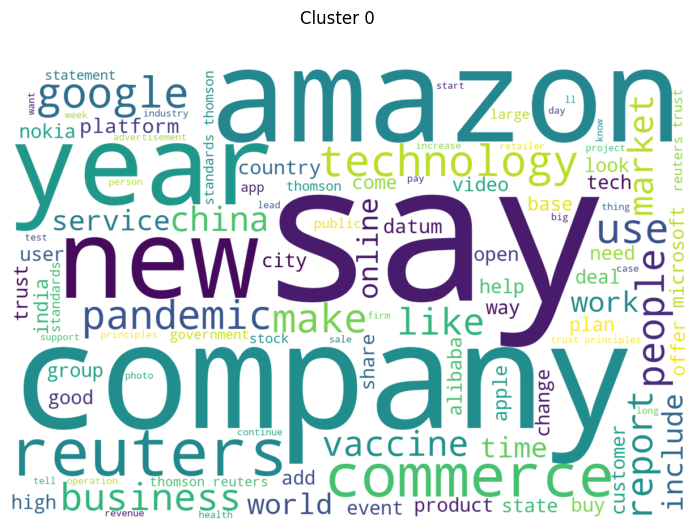

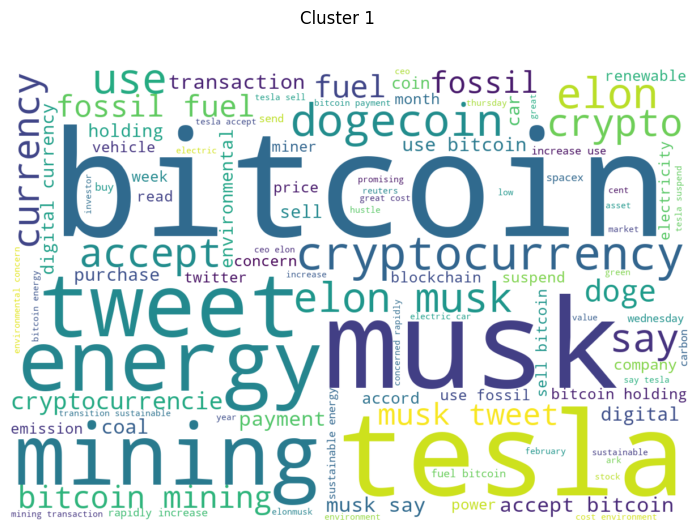

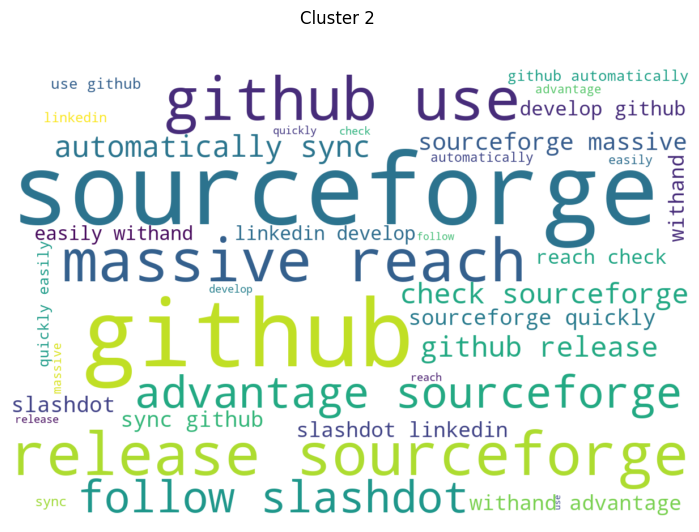

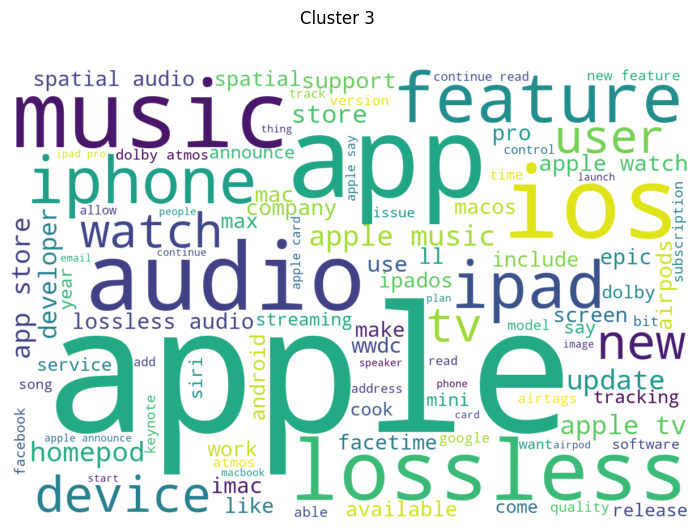

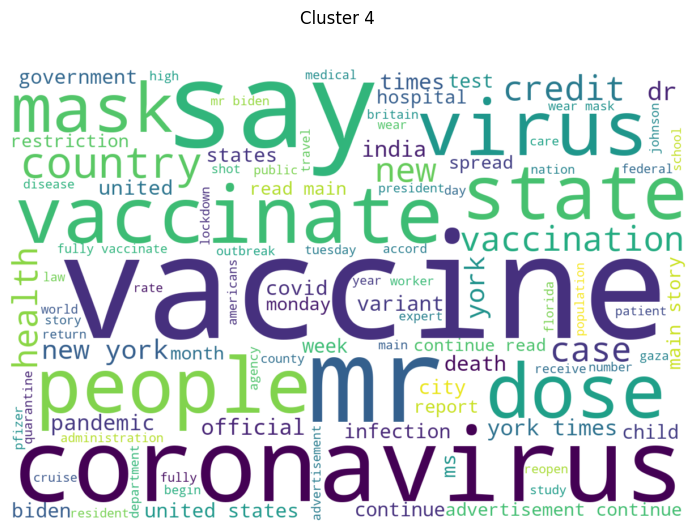

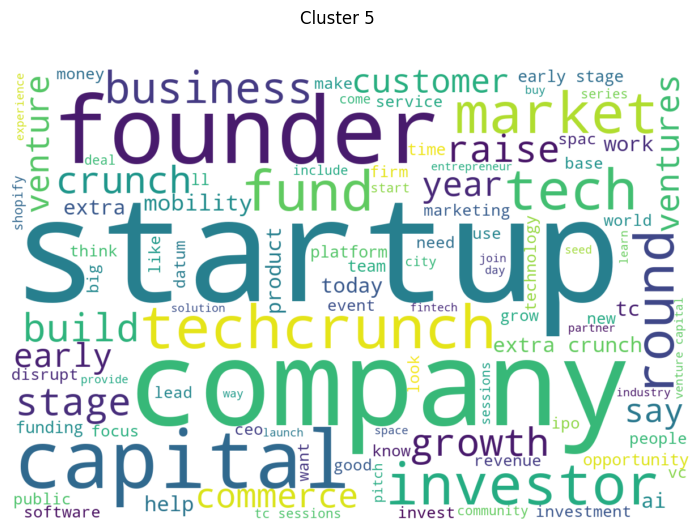

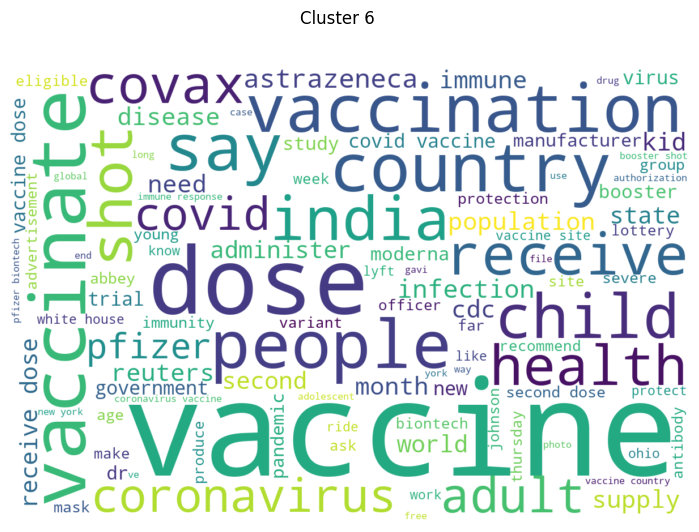

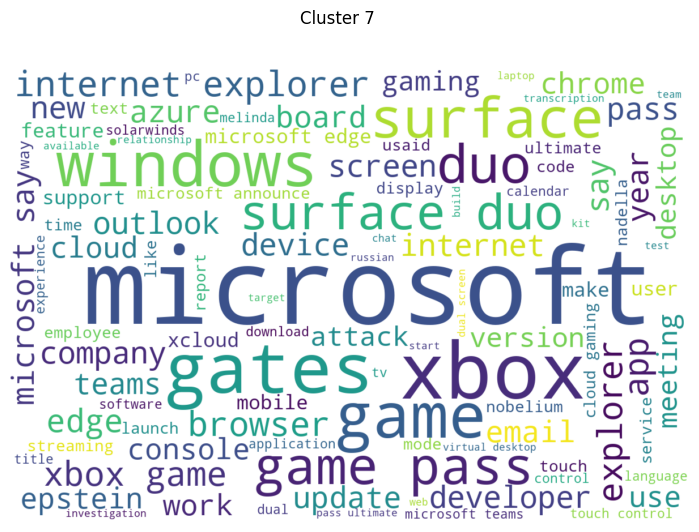

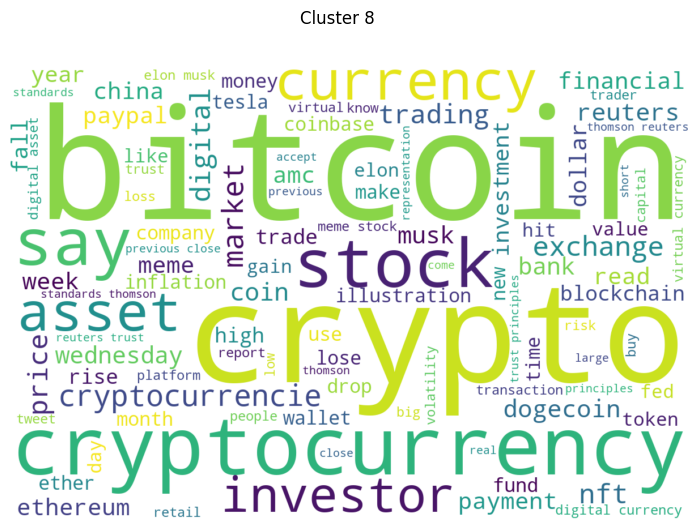

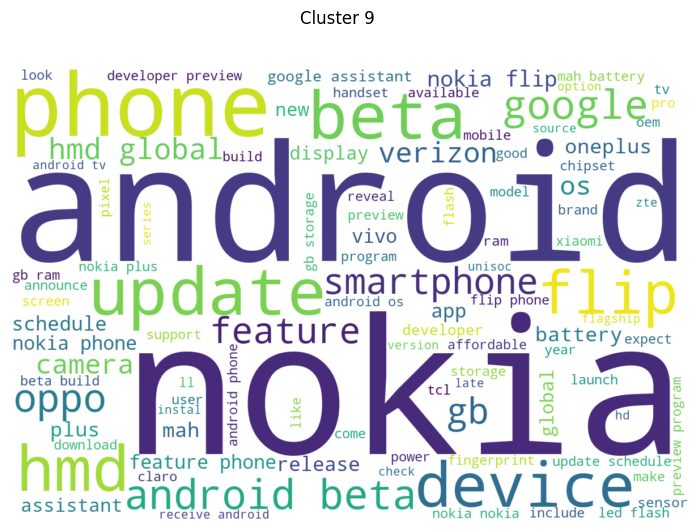

In [19]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

def generate_wordclouds(X, in_X_tfidf, k, in_word_positions):

    # Clustering
    in_model = KMeans(n_clusters=k, random_state=289925, n_jobs=-1)
    in_y_pred = in_model.fit_predict(X)
    in_cluster_ids = set(in_y_pred)
    silhouette_avg = silhouette_score(X, in_y_pred)
    print("For n_clusters =", k, "The average silhouette_score is :", silhouette_avg)

    # Number of words with highest tfidf score to display
    top_count = 100

    for in_cluster_id in in_cluster_ids:
        # compute the total tfidf for each term in the cluster
        in_tfidf = in_X_tfidf[in_y_pred == in_cluster_id]
        # numpy.matrix
        tfidf_sum = np.sum(in_tfidf, axis=0)
        # numpy.array of shape (1, X.shape[1])
        tfidf_sum = np.asarray(tfidf_sum).reshape(-1)
        top_indices = tfidf_sum.argsort()[-top_count:]
        term_weights = {in_word_positions[in_idx]: tfidf_sum[in_idx] for in_idx in top_indices}
        wc = WordCloud(width=1200, height=800, background_color="white")
        wordcloud = wc.generate_from_frequencies(term_weights)
        fig, ax = plt.subplots(figsize=(10, 6), dpi=100)
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.axis("off")
        fig.suptitle(f"Cluster {in_cluster_id}")
        plt.show()

    return in_cluster_ids


word_positions = {v: k for k, v in vectorizer.vocabulary_.items()}
_ = generate_wordclouds(bow_svd, bow_matrix, 10, word_positions)

D:\anaconda3\envs\pracamgr\lib\site-packages\sklearn\cluster\_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


For n_clusters = 10 The average silhouette_score is : 0.41012529319535584


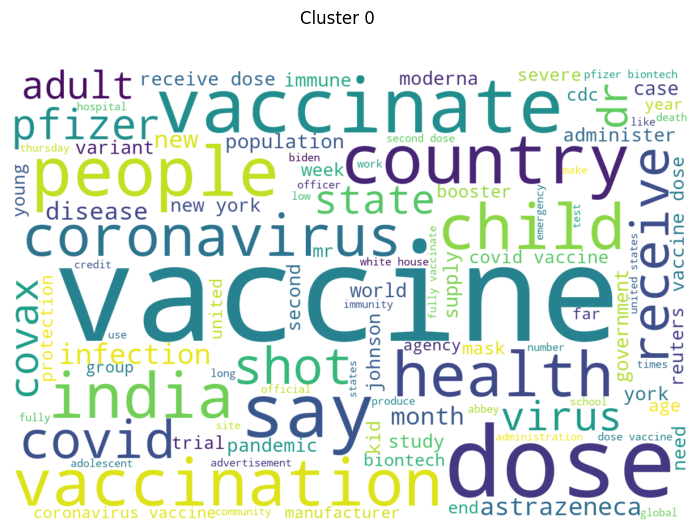

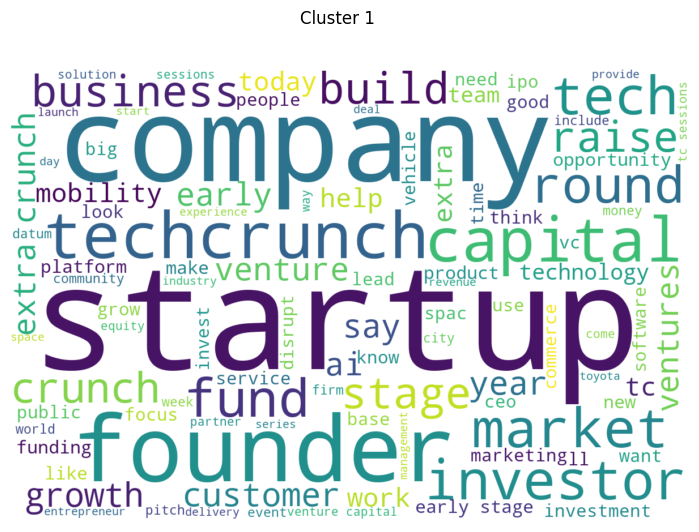

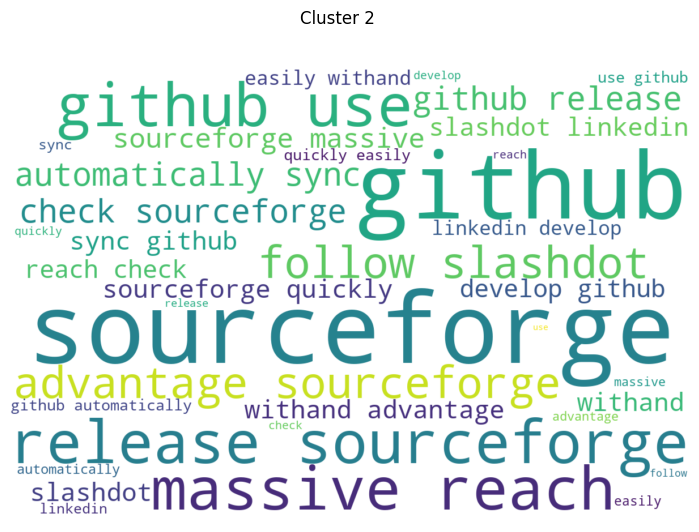

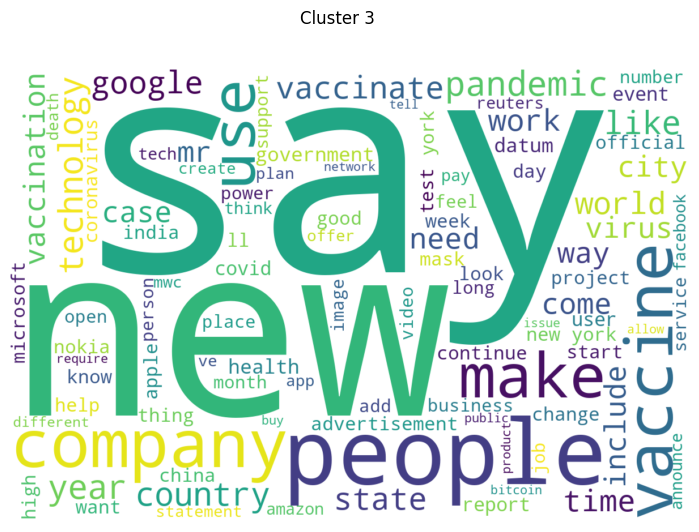

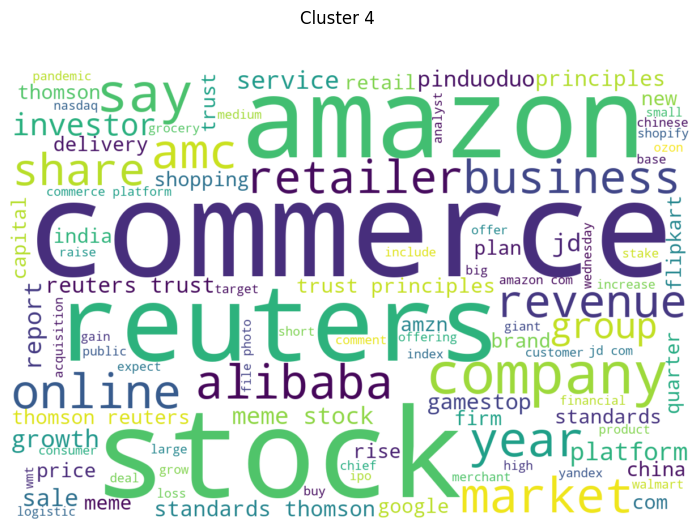

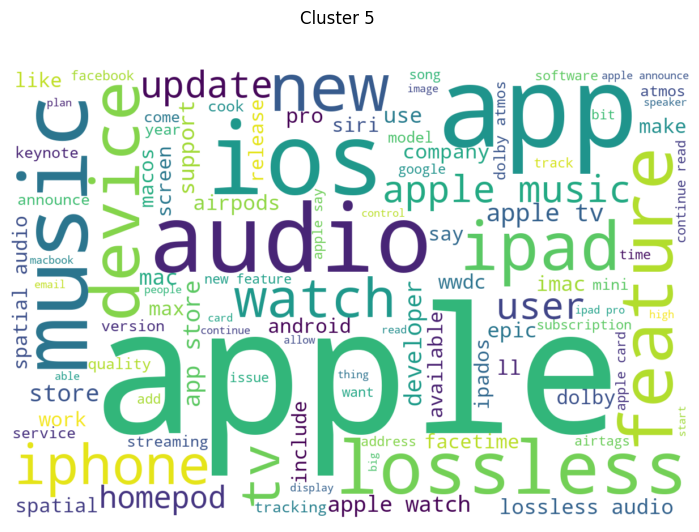

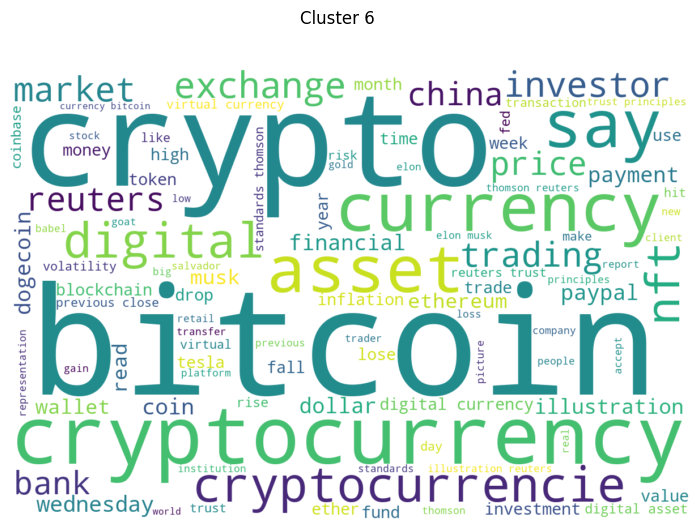

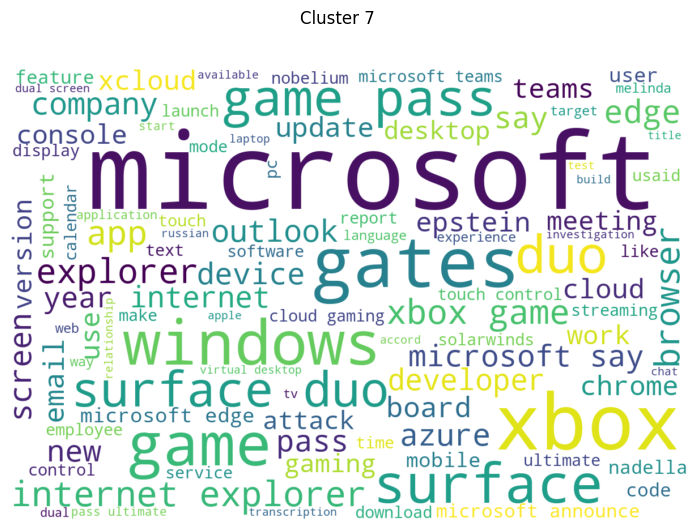

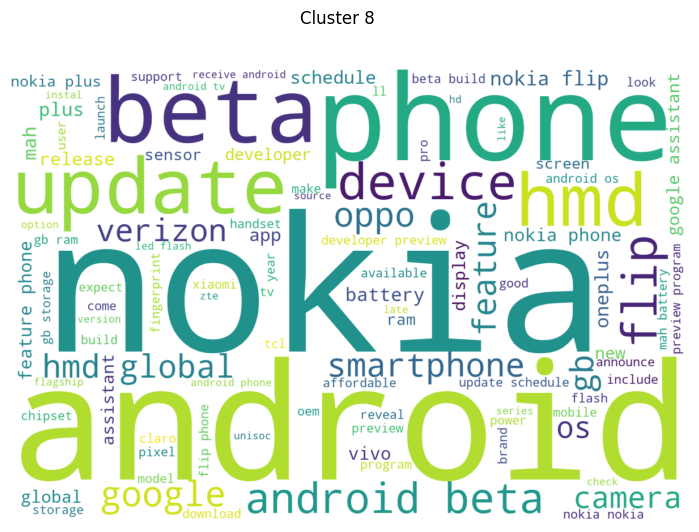

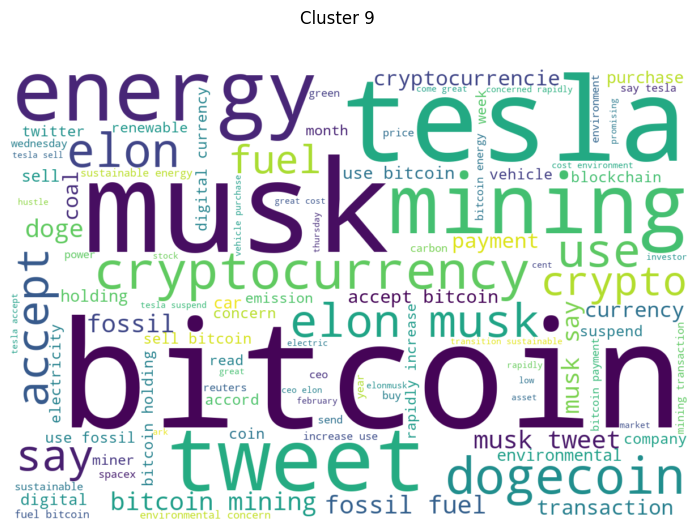

In [20]:
_ = generate_wordclouds(bow_nmf, bow_matrix, 10, word_positions)